In [3]:
from __future__ import print_function, division
#Allows relative imports
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
#imports from files
from src.preprocessing import *
from src.VAE_train import *
from vae_cel.vae_cel import *
from src.embedding_visualisation import * 
from clf.MLP_binary import * 
from clf.clf_train_eval_helpers import *
from src.loss_metrics import *
from src.pickling import *
from src.datasets import *

import pandas as pd 
import numpy as np
import math

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

#checking gpu status
if torch.cuda.is_available():
    device = torch.device('cuda')
    print("Using : {}".format(device))
else:
    device = torch.device('cpu')
    print("Using : {}".format(device))
    
#Plot and stuff
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi']= 200
sns.set_style('darkgrid')

torch.cuda.empty_cache()
# Ignore warnings)
import warnings
warnings.filterwarnings("ignore")
    
%load_ext autoreload
%autoreload 2

Using : cuda


### Reloading VAE

In [5]:
from src.torch_util import *
vae = VAE_cel(latent_dim = 100, aa_dim = 25)
vae = load_model(vae, '../output/HyperbolicContinueTraining/LOWERBETA_DirectlyMax/BEST_VAE_tune-weighted0.5_latent100_Pad-before_Annealing-None-gamma1.0.pth.tar')
vae.to(device);

Model succesfully loaded from ../output/HyperbolicContinueTraining/LOWERBETA_DirectlyMax/BEST_VAE_tune-weighted0.5_latent100_Pad-before_Annealing-None-gamma1.0.pth.tar:
	epoch: 74


In [6]:
epitopes = pd.read_csv('../training_data_new/epitopes/epitopes_vj_merged.csv')
epitopes_tcrex = pd.read_csv('../training_data_new/epitopes/tcrex_epitopes.csv')
display(epitopes.head(3)); print(epitopes.epitope.unique())
display(epitopes_tcrex.head(3)); print(epitopes_tcrex.epitope.unique())

,amino_acid,v_gene,j_gene,epitope,v,j,db
0,CASSPWDRGLAEAFF,TRBV18*01,TRBJ1-1*01,GILGFVFTL,17,0,vdjdb
1,CASSKGTTGALQETQYF,TRBV12-3*01,TRBJ2-5*01,GILGFVFTL,11,1,vdjdb
2,CASATFSYNEQFF,TRBV19*01,TRBJ2-1*01,GILGFVFTL,18,1,vdjdb


['GILGFVFTL' 'NLVPMVATV' 'YLQPRTFLL']


,Unnamed: 0,amino_acid,v_gene,j_gene,epitope,v,j,db
0,0,CACSIRSAYEQYF,TRBV19,TRBJ02-07,GILGFVFTL,18,1,tcrex
1,1,CASSMVGGPGNEQFF,TRBV19,TRBJ02-01,GILGFVFTL,18,1,tcrex
2,2,CASSLSLAGGLSEDYEQYF,TRBV13,TRBJ02-07,GILGFVFTL,12,1,tcrex


['GILGFVFTL' 'NLVPMVATV' 'YLQPRTFLL']


In [8]:
#neg_naive = pd.read_csv('../training_data_new/epitopes/neg_naive.csv')
neg_emerson = pd.read_csv('../training_data_new/epitopes/neg_emerson.csv')
#display(neg_naive.sample(3))
display(neg_emerson.sample(3))

,amino_acid,v_gene,j_gene,epitope,v,j,db
83058,CASSLSSGRSYEQYF,TCRBV06-05,TCRBJ02-07,negative,5,1,emerson
137520,CASSPGSYNEQFF,TCRBV07-03,TCRBJ02-01,negative,6,1,emerson
5883,CASSIRGSIQYF,TCRBV07-09,TCRBJ02-04,negative,6,1,emerson


# Classifier 

#### some df utils functions

In [9]:
def get_df(epitopes_df, neg_df, epitope, verbose=False, random_state=20):
    pos = epitopes_df.query('epitope.str.startswith(@epitope)')
    neg = neg_df.sample(10*len(pos), random_state= random_state)
    df = pd.concat([pos, neg], ignore_index=True).reset_index()
    df['label'] = df['epitope'].apply(lambda x : 0 if x == 'negative' else 1).astype(int)
    if verbose:
        display(df.sample(5))
        print(df.epitope.unique())
    return df

def get_df_nn(epitopes_df, neg_df, epitope, verbose =False, random_state=20):
    torch.manual_seed(random_state)
    print('Getting merged_df')
    df_nn = get_df(epitopes_df, neg_df, epitope, verbose)
    print('Embedding')
    #get_embedding_df from embedding_visualisation.py
    embeddings = get_embedding_df(vae, df_nn[['amino_acid','v','j']].values, 'cuda')[['z_'+str(i) for i in range(100)]]
    df_nn = pd.merge(df_nn, embeddings, left_index=True,right_index=True)
    del embeddings
    if verbose:
        display(df_nn.sample(5))
    torch.cuda.empty_cache()
    return df_nn

def split_tensors(df_nn, train_size=.7, random_state=20):
    X = df_nn[[x for x in df_nn.columns if x.startswith('z')]].values
    y = df_nn['label'].values
    X_train, X_val, y_train, y_val = train_test_split(X, y, train_size = train_size, 
                                                      random_state = random_state)
    print(f'Percent of positive class in train: {sum(y_train)/len(y_train):.2%}')
    print(f'Percent of positive class in val:   {sum(y_val)/len(y_val):.2%}')
    X_train = torch.tensor(X_train, dtype=torch.float32)
    X_val = torch.tensor(X_val, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32)
    y_val = torch.tensor(y_val, dtype=torch.float32)
    torch.cuda.empty_cache()
    return X_train, X_val, y_train, y_val

def get_data_pipeline(epitopes_df, neg_df, epitope, split = True, 
                      train_size=.7, random_state = 20, verbose=False):
    #Getting df and embedding
    df_nn = get_df_nn(epitopes_df, neg_df, epitope, verbose, random_state)
    if split == True:
        X_train, X_val, y_train, y_val = split_tensors(df_nn, train_size, random_state)
        return df_nn, X_train, X_val, y_train, y_val
    else:
        X = torch.tensor(df_nn[[x for x in df_nn.columns if x.startswith('z')]].values,
                         dtype = torch.float32)
        y = torch.tensor(df_nn['label'].values, dtype=torch.float32)
        print(f'Percent of positive class: {sum(y)/len(y):.2%}')
        return df_nn, X, y

#### MLP def here

In [37]:
class MLP_binary(nn.Module):
    def __init__(self, n_layers, n_hidden, activation = nn.SELU(), p_drop = 0.5):
        super(MLP_binary, self).__init__()
        if p_drop >0 and p_drop <1:
            self.drop = nn.Dropout(p_drop)
        else: 
            self.drop = nn.Identity()
            
        self.input_layers = nn.Sequential(nn.Linear(100, 256),
                                          nn.BatchNorm1d(256),
                                          activation,
                                          self.drop,
                                          nn.Linear(256, 512),
                                          nn.BatchNorm1d(512),
                                          activation,
                                          self.drop,
                                          nn.Linear(512, n_hidden),
                                          activation,
                                          self.drop)
        layers = []
        for i in range(n_layers):
            layers.append(nn.Linear(n_hidden, n_hidden))
            layers.append(activation)
            layers.append(self.drop) 
        
        self.hidden_layers = nn.Sequential(*layers)
        self.output = nn.Sequential(nn.Linear(n_hidden, n_hidden//2),
                                    nn.BatchNorm1d(n_hidden//2),
                                    activation,
                                    self.drop,
                                    
                                    nn.Linear(n_hidden//2, 10),
                                    activation,
                                    
                                    nn.Linear(10, 1))

    def forward(self, x):
        x = self.input_layers(x)
        x = self.hidden_layers(x)
        x = self.output(x) #No activation because I want to return logits for the BCELoss
        return x.view(-1,)

In [215]:
tmp=pd.read_csv('../output/classifier_gridsearch/gridsearch_output.csv')
tmp.sort_values('best_roc',ascending=False).head(6)

,params,best_roc,roc_epoch,best_val,val_epoch
48,n_layers3_hidden256_lr1.0e-03_wd0.01,0.617060,300,0.336450,224
50,n_layers3_hidden256_lr1.0e-03_wd1e-08,0.615705,225,0.336392,226
77,n_layers4_hidden256_lr1.0e-03_wd1e-08,0.615592,325,0.336451,259
14,n_layers2_hidden128_lr1.0e-03_wd1e-08,0.615175,275,0.336819,272
23,n_layers2_hidden256_lr1.0e-03_wd1e-08,0.615104,250,0.336417,220
21,n_layers2_hidden256_lr1.0e-03_wd0.01,0.614979,200,0.336317,243


### quick MLP gridsearch for positive vdjdb

Getting merged_df


,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label
41579,41579,CASSRDRVAGDNEQFF,TCRBV07-02,TCRBJ02-01,negative,6,1,emerson,0
44898,44898,CAWSLPGGPQHF,TCRBV30-01,TCRBJ01-05,negative,29,0,emerson,0
30590,30590,CASSEEGNTEAFF,TCRBV06-04,TCRBJ01-01,negative,5,0,emerson,0
19366,19366,CASSLEYQGGYEQYF,TCRBV07-09,TCRBJ02-07,negative,6,1,emerson,0
30375,30375,CASRQGAWEKLFF,TCRBV28-01,TCRBJ01-04,negative,27,0,emerson,0


['NLVPMVATV' 'negative']
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label,z_0,...,z_90,z_91,z_92,z_93,z_94,z_95,z_96,z_97,z_98,z_99
20453,20453,CSVRDTGVEQYF,TCRBV29-01,TCRBJ02-07,negative,28,1,emerson,0,0.982013,...,0.341659,-0.270013,-0.487152,0.262647,0.871693,-2.608630,0.559364,0.512382,-0.845405,0.506398
30626,30626,CASSPPGKLPAIAKNIQYF,TCRBV07-02,TCRBJ02-04,negative,6,1,emerson,0,0.314393,...,-0.570174,-0.804554,1.581470,-0.910272,0.085725,0.703025,1.373031,-0.146238,0.637461,0.291834
31740,31740,CASSSQGWNQPQHF,TCRBV07-02,TCRBJ01-05,negative,6,0,emerson,0,1.087610,...,0.615219,-0.286949,0.237920,-0.024842,-0.804475,0.690550,0.912014,0.490796,1.695444,0.314346
12806,12806,CASSLPGGNVLTF,TCRBV19-01,TCRBJ02-06,negative,18,1,emerson,0,-1.925258,...,2.007011,-0.298432,-0.768466,1.263331,-0.327146,1.726741,1.006900,0.467269,0.065339,0.882731
28078,28078,CASSLESQGARETQYF,TCRBV13-01,TCRBJ02-05,negative,12,1,emerson,0,-0.748207,...,-0.199894,1.463076,0.011362,1.733389,-1.869962,-1.001118,0.754110,1.626693,-0.299831,0.217970


Percent of positive class in train: 9.02%
Percent of positive class in val:   9.26%
Hidden 256, Epitope : NLVPMVATV, negative : Emerson, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.309e-01	Val: 7.883e-01
		ROC AUC :0.534, 	accuracy: 0.907
Epoch:25;	Train: 3.042e-01	Val: 3.095e-01
		ROC AUC :0.488, 	accuracy: 0.907
Epoch:50;	Train: 3.037e-01	Val: 3.093e-01
		ROC AUC :0.504, 	accuracy: 0.907
Epoch:75;	Train: 3.133e-01	Val: 3.061e-01
		ROC AUC :0.562, 	accuracy: 0.907
Epoch:100;	Train: 2.984e-01	Val: 3.059e-01
		ROC AUC :0.567, 	accuracy: 0.907
Epoch:125;	Train: 2.968e-01	Val: 3.009e-01
		ROC AUC :0.570, 	accuracy: 0.907
Epoch:150;	Train: 2.982e-01	Val: 2.976e-01
		ROC AUC :0.579, 	accuracy: 0.909
Epoch:175;	Train: 2.890e-01	Val: 2.929e-01
		ROC AUC :0.622, 	accuracy: 0.911
Epoch:200;	Train: 2.879e-01	Val: 2.924e-01
		ROC AUC :0.637, 	accuracy: 0.911
Epoch:225;	Train: 2.774e-01	Val: 2.922e-01
		ROC AUC :0.640, 	accuracy: 0.911
Epoch:250;	Train: 2.744e-01	Val: 2.913e-01
		ROC AUC :0.646, 	accuracy: 0.911
Epoch:275;	Train: 2.868e-01	Val: 2.932e-01
		ROC AUC :0.644, 	accuracy: 0.910
Epoch:300;	Train: 2.833e-01	Val: 2.926e-01
		ROC AUC :0.645, 	accurac

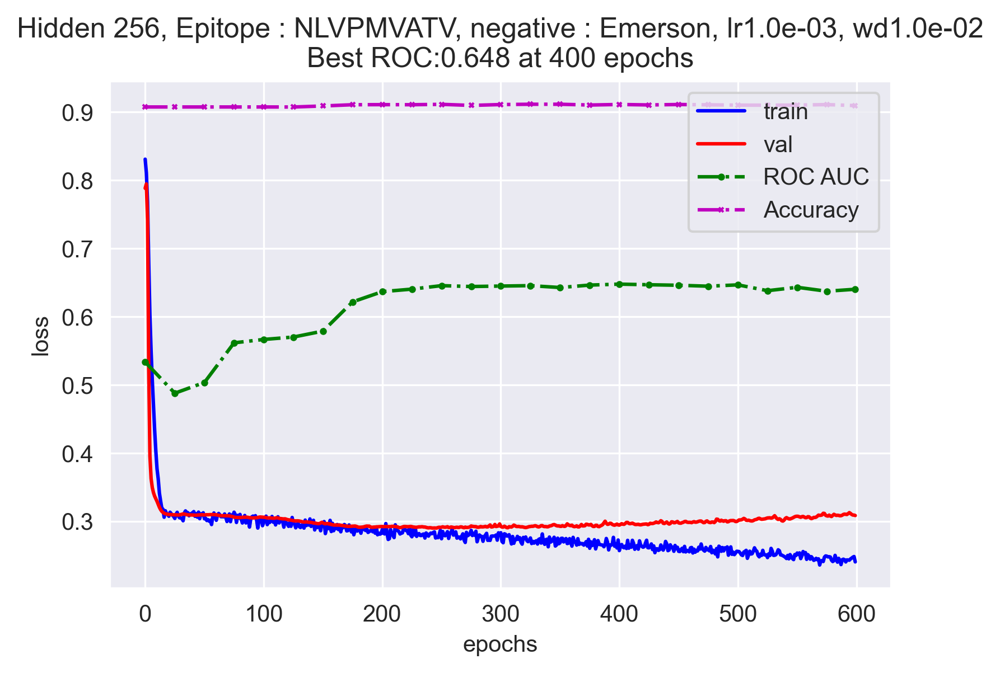

Hidden 256, Epitope : NLVPMVATV, negative : Emerson, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.716e-01	Val: 6.550e-01
		ROC AUC :0.490, 	accuracy: 0.907
Epoch:25;	Train: 5.903e-01	Val: 5.439e-01
		ROC AUC :0.516, 	accuracy: 0.907
Epoch:50;	Train: 3.977e-01	Val: 3.612e-01
		ROC AUC :0.506, 	accuracy: 0.907
Epoch:75;	Train: 3.264e-01	Val: 3.243e-01
		ROC AUC :0.512, 	accuracy: 0.907
Epoch:100;	Train: 3.152e-01	Val: 3.117e-01
		ROC AUC :0.514, 	accuracy: 0.907
Epoch:125;	Train: 3.119e-01	Val: 3.091e-01
		ROC AUC :0.518, 	accuracy: 0.907
Epoch:150;	Train: 3.058e-01	Val: 3.087e-01
		ROC AUC :0.520, 	accuracy: 0.907
Epoch:175;	Train: 3.103e-01	Val: 3.086e-01
		ROC AUC :0.525, 	accuracy: 0.907
Epoch:200;	Train: 3.025e-01	Val: 3.085e-01
		ROC AUC :0.530, 	accuracy: 0.907
Epoch:225;	Train: 3.115e-01	Val: 3.081e-01
		ROC AUC :0.537, 	accuracy: 0.907
Epoch:250;	Train: 3.031e-01	Val: 3.078e-01
		ROC AUC :0.544, 	accuracy: 0.907
Epoch:275;	Train: 3.131e-01	Val: 3.070e-01
		ROC AUC :0.559, 	accuracy: 0.907
Epoch:300;	Train: 3.043e-01	Val: 3.067e-01
		ROC AUC :0.564, 	accurac

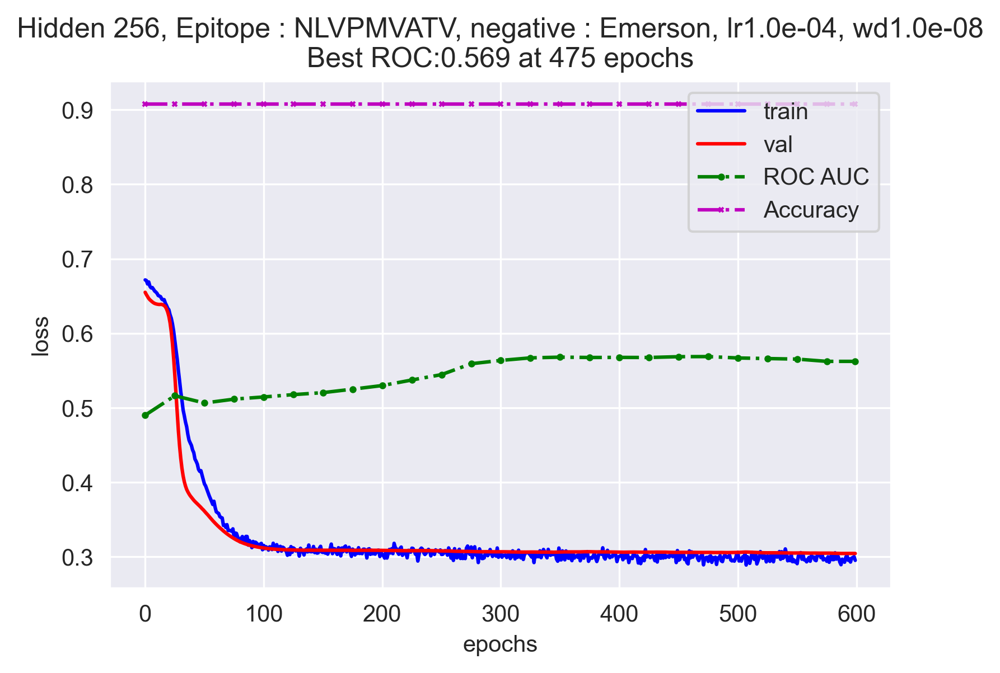

Hidden 512, Epitope : NLVPMVATV, negative : Emerson, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.514e-01	Val: 7.132e-01
		ROC AUC :0.496, 	accuracy: 0.907
Epoch:25;	Train: 3.134e-01	Val: 3.085e-01
		ROC AUC :0.517, 	accuracy: 0.907
Epoch:50;	Train: 3.028e-01	Val: 3.058e-01
		ROC AUC :0.565, 	accuracy: 0.907
Epoch:75;	Train: 2.897e-01	Val: 3.025e-01
		ROC AUC :0.561, 	accuracy: 0.907
Epoch:100;	Train: 2.904e-01	Val: 2.951e-01
		ROC AUC :0.594, 	accuracy: 0.909
Epoch:125;	Train: 2.832e-01	Val: 2.914e-01
		ROC AUC :0.627, 	accuracy: 0.911
Epoch:150;	Train: 2.837e-01	Val: 2.899e-01
		ROC AUC :0.643, 	accuracy: 0.911
Epoch:175;	Train: 2.797e-01	Val: 2.904e-01
		ROC AUC :0.646, 	accuracy: 0.911
Epoch:200;	Train: 2.721e-01	Val: 2.896e-01
		ROC AUC :0.653, 	accuracy: 0.911
Epoch:225;	Train: 2.775e-01	Val: 2.898e-01
		ROC AUC :0.651, 	accuracy: 0.911
Epoch:250;	Train: 2.744e-01	Val: 2.917e-01
		ROC AUC :0.649, 	accuracy: 0.911
Epoch:275;	Train: 2.681e-01	Val: 2.922e-01
		ROC AUC :0.654, 	accuracy: 0.911
Epoch:300;	Train: 2.746e-01	Val: 2.945e-01
		ROC AUC :0.645, 	accurac

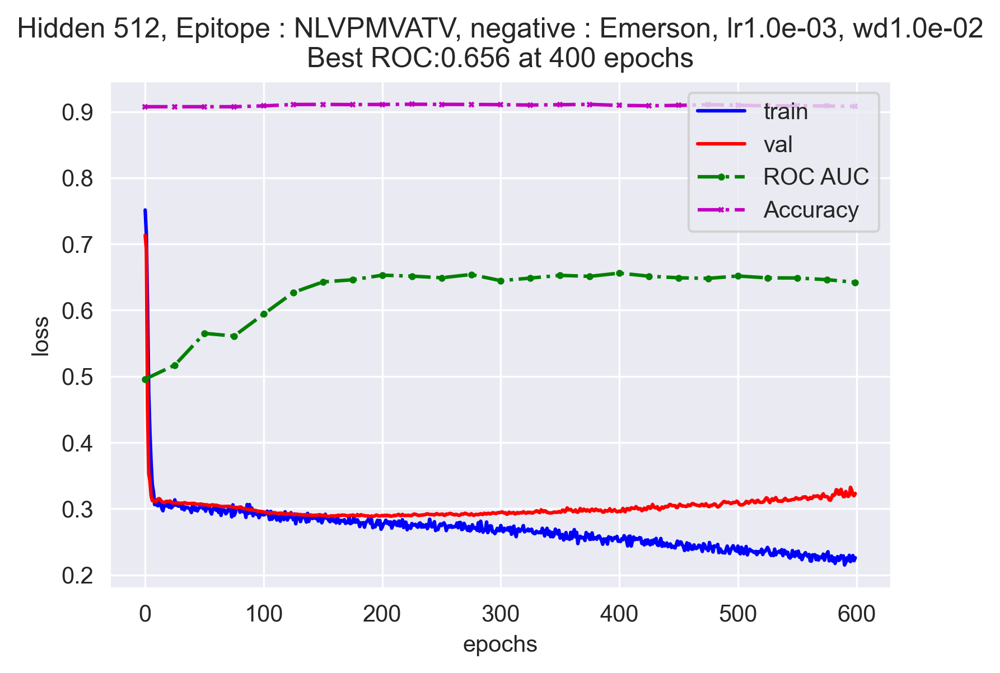

Hidden 512, Epitope : NLVPMVATV, negative : Emerson, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.153e-01	Val: 7.819e-01
		ROC AUC :0.528, 	accuracy: 0.907
Epoch:25;	Train: 4.352e-01	Val: 3.766e-01
		ROC AUC :0.492, 	accuracy: 0.907
Epoch:50;	Train: 3.074e-01	Val: 3.122e-01
		ROC AUC :0.498, 	accuracy: 0.907
Epoch:75;	Train: 3.058e-01	Val: 3.092e-01
		ROC AUC :0.501, 	accuracy: 0.907
Epoch:100;	Train: 3.081e-01	Val: 3.097e-01
		ROC AUC :0.496, 	accuracy: 0.907
Epoch:125;	Train: 3.136e-01	Val: 3.100e-01
		ROC AUC :0.496, 	accuracy: 0.907
Epoch:150;	Train: 3.048e-01	Val: 3.096e-01
		ROC AUC :0.511, 	accuracy: 0.907
Epoch:175;	Train: 3.015e-01	Val: 3.097e-01
		ROC AUC :0.510, 	accuracy: 0.907
Epoch:200;	Train: 3.070e-01	Val: 3.091e-01
		ROC AUC :0.526, 	accuracy: 0.907
Epoch:225;	Train: 2.982e-01	Val: 3.086e-01
		ROC AUC :0.546, 	accuracy: 0.907
Epoch:250;	Train: 2.946e-01	Val: 3.081e-01
		ROC AUC :0.559, 	accuracy: 0.907
Epoch:275;	Train: 3.177e-01	Val: 3.077e-01
		ROC AUC :0.564, 	accuracy: 0.907
Epoch:300;	Train: 2.928e-01	Val: 3.068e-01
		ROC AUC :0.571, 	accurac

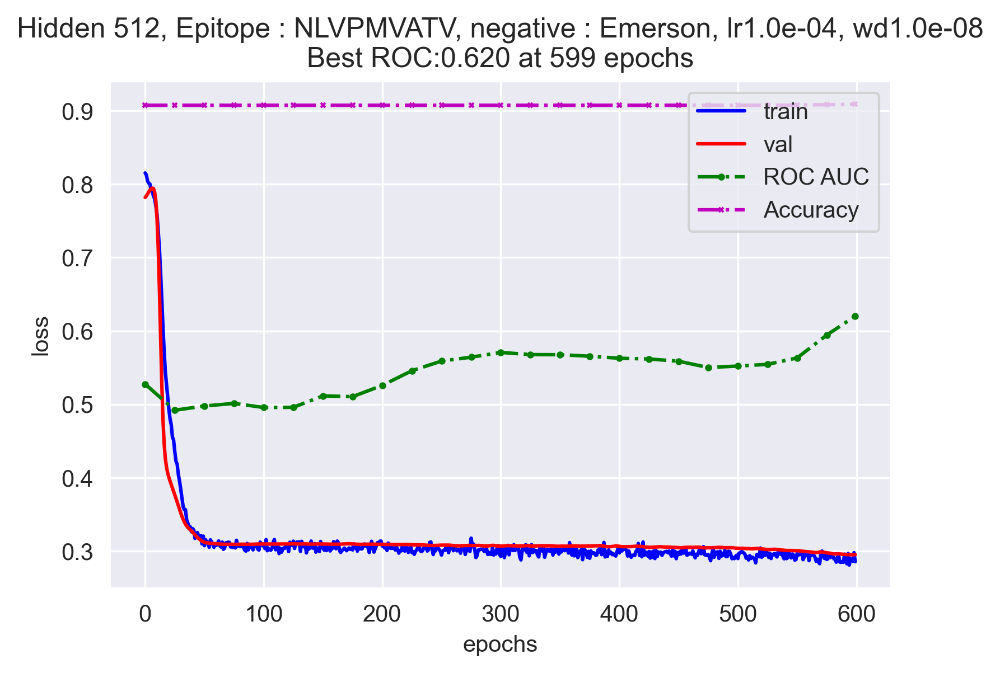

Getting merged_df


,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label
52141,52141,CASSPETSYEQYF,TRBV5-6,TRBJ2-7,negative,4,1,naive,0
36956,36956,CASSLGVGGSGGYTF,TRBV13,TRBJ1-2,negative,12,0,naive,0
18628,18628,CSADLNYGGTYNEQFF,TRBV20-1,TRBJ2-1,negative,19,1,naive,0
46568,46568,CASSLSFAGPNEQFF,TRBV27,TRBJ2-1,negative,26,1,naive,0
18879,18879,CVSSEGSSGANVLPF,TRBV28,TRBJ2-6,negative,27,1,naive,0


['NLVPMVATV' 'negative']
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label,z_0,...,z_90,z_91,z_92,z_93,z_94,z_95,z_96,z_97,z_98,z_99
27775,27775,CASSQDSGAQETQYF,TRBV3-1,TRBJ2-5,negative,2,1,naive,0,0.109195,...,0.029589,1.479545,0.828505,1.045338,1.039942,-1.387614,1.363775,-1.047655,-0.064056,-0.802670
14638,14638,CASSQDGKSNQPQHF,TRBV3-1,TRBJ1-5,negative,2,0,naive,0,1.082565,...,0.755036,1.333693,-0.514396,0.661361,1.460878,-1.513639,-1.011502,-1.795274,1.036785,0.010348
16547,16547,CSARRGSANEKLFF,TRBV20-1,TRBJ1-4,negative,19,0,naive,0,0.341885,...,0.124623,-2.005869,-0.214290,-0.619391,-0.091979,-1.565585,1.270104,0.485269,0.706803,1.226267
34550,34550,CASSEGLAGGTDTQYF,TRBV25-1,TRBJ2-3,negative,24,1,naive,0,-1.072931,...,-0.450748,-0.106919,-1.377172,0.912062,-2.102824,-0.369395,-0.468515,0.877973,0.302705,0.268932
15704,15704,CASREGLGWETQYF,TRBV28,TRBJ2-5,negative,27,1,naive,0,-2.590959,...,0.434535,-2.367663,-1.187360,-0.198305,-1.217098,0.273738,0.548825,0.408020,0.453394,-1.142831


Percent of positive class in train: 9.02%
Percent of positive class in val:   9.26%
Hidden 256, Epitope : NLVPMVATV, negative : Naive, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.712e-01	Val: 7.217e-01
		ROC AUC :0.516, 	accuracy: 0.907
Epoch:25;	Train: 3.057e-01	Val: 3.097e-01
		ROC AUC :0.498, 	accuracy: 0.907
Epoch:50;	Train: 3.081e-01	Val: 3.087e-01
		ROC AUC :0.497, 	accuracy: 0.907
Epoch:75;	Train: 3.056e-01	Val: 3.087e-01
		ROC AUC :0.512, 	accuracy: 0.907
Epoch:100;	Train: 2.945e-01	Val: 3.084e-01
		ROC AUC :0.518, 	accuracy: 0.907
Epoch:125;	Train: 3.084e-01	Val: 3.075e-01
		ROC AUC :0.550, 	accuracy: 0.907
Epoch:150;	Train: 2.903e-01	Val: 2.940e-01
		ROC AUC :0.574, 	accuracy: 0.910
Epoch:175;	Train: 2.777e-01	Val: 2.831e-01
		ROC AUC :0.570, 	accuracy: 0.917
Epoch:200;	Train: 2.753e-01	Val: 2.815e-01
		ROC AUC :0.582, 	accuracy: 0.918
Epoch:225;	Train: 2.725e-01	Val: 2.805e-01
		ROC AUC :0.588, 	accuracy: 0.919
Epoch:250;	Train: 2.797e-01	Val: 2.779e-01
		ROC AUC :0.602, 	accuracy: 0.920
Epoch:275;	Train: 2.753e-01	Val: 2.792e-01
		ROC AUC :0.595, 	accuracy: 0.920
Epoch:300;	Train: 2.709e-01	Val: 2.809e-01
		ROC AUC :0.596, 	accurac

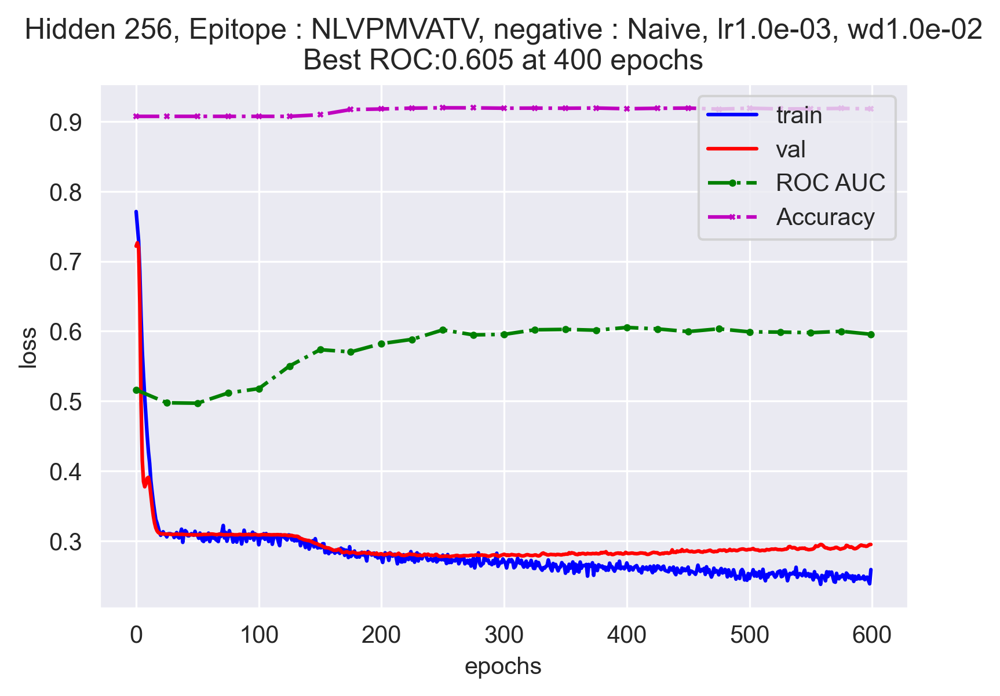

Hidden 256, Epitope : NLVPMVATV, negative : Naive, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.839e-01	Val: 6.475e-01
		ROC AUC :0.507, 	accuracy: 0.907
Epoch:25;	Train: 5.760e-01	Val: 5.286e-01
		ROC AUC :0.501, 	accuracy: 0.907
Epoch:50;	Train: 3.985e-01	Val: 3.603e-01
		ROC AUC :0.493, 	accuracy: 0.907
Epoch:75;	Train: 3.351e-01	Val: 3.245e-01
		ROC AUC :0.500, 	accuracy: 0.907
Epoch:100;	Train: 3.173e-01	Val: 3.121e-01
		ROC AUC :0.503, 	accuracy: 0.907
Epoch:125;	Train: 3.144e-01	Val: 3.099e-01
		ROC AUC :0.507, 	accuracy: 0.907
Epoch:150;	Train: 3.066e-01	Val: 3.102e-01
		ROC AUC :0.503, 	accuracy: 0.907
Epoch:175;	Train: 3.011e-01	Val: 3.100e-01
		ROC AUC :0.505, 	accuracy: 0.907
Epoch:200;	Train: 3.082e-01	Val: 3.102e-01
		ROC AUC :0.509, 	accuracy: 0.907
Epoch:225;	Train: 3.081e-01	Val: 3.097e-01
		ROC AUC :0.513, 	accuracy: 0.907
Epoch:250;	Train: 3.041e-01	Val: 3.095e-01
		ROC AUC :0.520, 	accuracy: 0.907
Epoch:275;	Train: 3.035e-01	Val: 3.086e-01
		ROC AUC :0.537, 	accuracy: 0.907
Epoch:300;	Train: 3.044e-01	Val: 3.077e-01
		ROC AUC :0.555, 	accurac

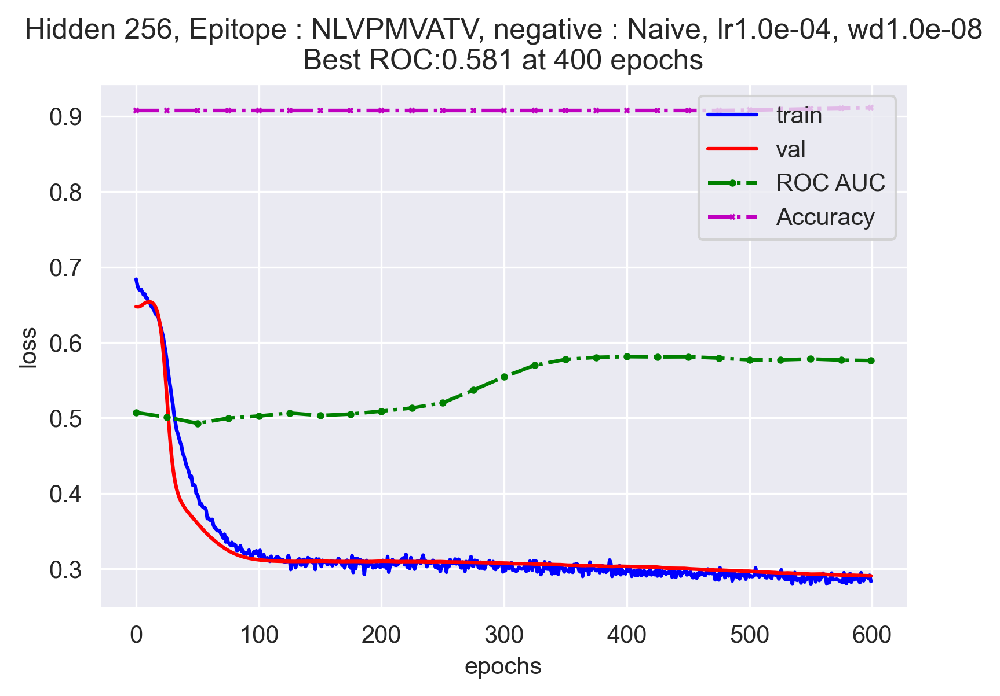

Hidden 512, Epitope : NLVPMVATV, negative : Naive, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.292e-01	Val: 8.306e-01
		ROC AUC :0.539, 	accuracy: 0.907
Epoch:25;	Train: 3.079e-01	Val: 3.087e-01
		ROC AUC :0.530, 	accuracy: 0.907
Epoch:50;	Train: 2.982e-01	Val: 3.036e-01
		ROC AUC :0.581, 	accuracy: 0.907
Epoch:75;	Train: 2.830e-01	Val: 2.897e-01
		ROC AUC :0.564, 	accuracy: 0.913
Epoch:100;	Train: 2.852e-01	Val: 2.833e-01
		ROC AUC :0.579, 	accuracy: 0.918
Epoch:125;	Train: 2.783e-01	Val: 2.806e-01
		ROC AUC :0.582, 	accuracy: 0.918
Epoch:150;	Train: 2.787e-01	Val: 2.793e-01
		ROC AUC :0.585, 	accuracy: 0.919
Epoch:175;	Train: 2.680e-01	Val: 2.787e-01
		ROC AUC :0.594, 	accuracy: 0.919
Epoch:200;	Train: 2.646e-01	Val: 2.811e-01
		ROC AUC :0.589, 	accuracy: 0.920
Epoch:225;	Train: 2.662e-01	Val: 2.776e-01
		ROC AUC :0.601, 	accuracy: 0.920
Epoch:250;	Train: 2.611e-01	Val: 2.791e-01
		ROC AUC :0.601, 	accuracy: 0.920
Epoch:275;	Train: 2.603e-01	Val: 2.815e-01
		ROC AUC :0.596, 	accuracy: 0.920
Epoch:300;	Train: 2.680e-01	Val: 2.813e-01
		ROC AUC :0.596, 	accurac

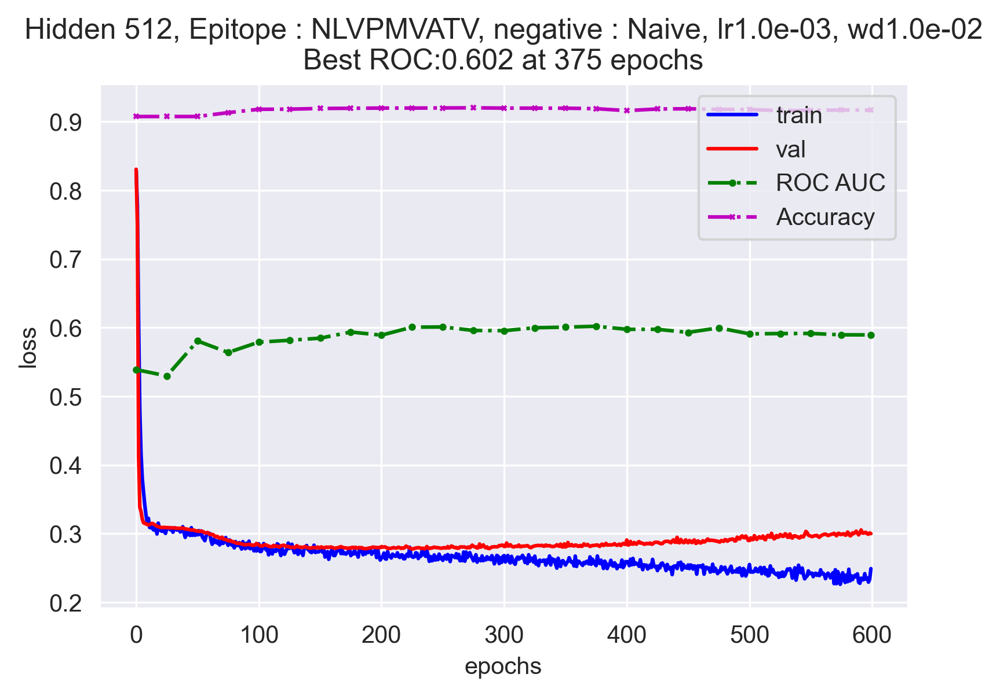

Hidden 512, Epitope : NLVPMVATV, negative : Naive, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.762e-01	Val: 7.554e-01
		ROC AUC :0.513, 	accuracy: 0.907
Epoch:25;	Train: 5.028e-01	Val: 3.909e-01
		ROC AUC :0.508, 	accuracy: 0.907
Epoch:50;	Train: 3.415e-01	Val: 3.320e-01
		ROC AUC :0.506, 	accuracy: 0.907
Epoch:75;	Train: 3.170e-01	Val: 3.127e-01
		ROC AUC :0.515, 	accuracy: 0.907
Epoch:100;	Train: 3.101e-01	Val: 3.093e-01
		ROC AUC :0.512, 	accuracy: 0.907
Epoch:125;	Train: 3.025e-01	Val: 3.089e-01
		ROC AUC :0.510, 	accuracy: 0.907
Epoch:150;	Train: 3.151e-01	Val: 3.089e-01
		ROC AUC :0.521, 	accuracy: 0.907
Epoch:175;	Train: 3.059e-01	Val: 3.090e-01
		ROC AUC :0.517, 	accuracy: 0.907
Epoch:200;	Train: 3.091e-01	Val: 3.089e-01
		ROC AUC :0.519, 	accuracy: 0.907
Epoch:225;	Train: 3.101e-01	Val: 3.084e-01
		ROC AUC :0.535, 	accuracy: 0.907
Epoch:250;	Train: 3.036e-01	Val: 3.081e-01
		ROC AUC :0.537, 	accuracy: 0.907
Epoch:275;	Train: 3.054e-01	Val: 3.074e-01
		ROC AUC :0.553, 	accuracy: 0.907
Epoch:300;	Train: 3.075e-01	Val: 3.066e-01
		ROC AUC :0.570, 	accurac

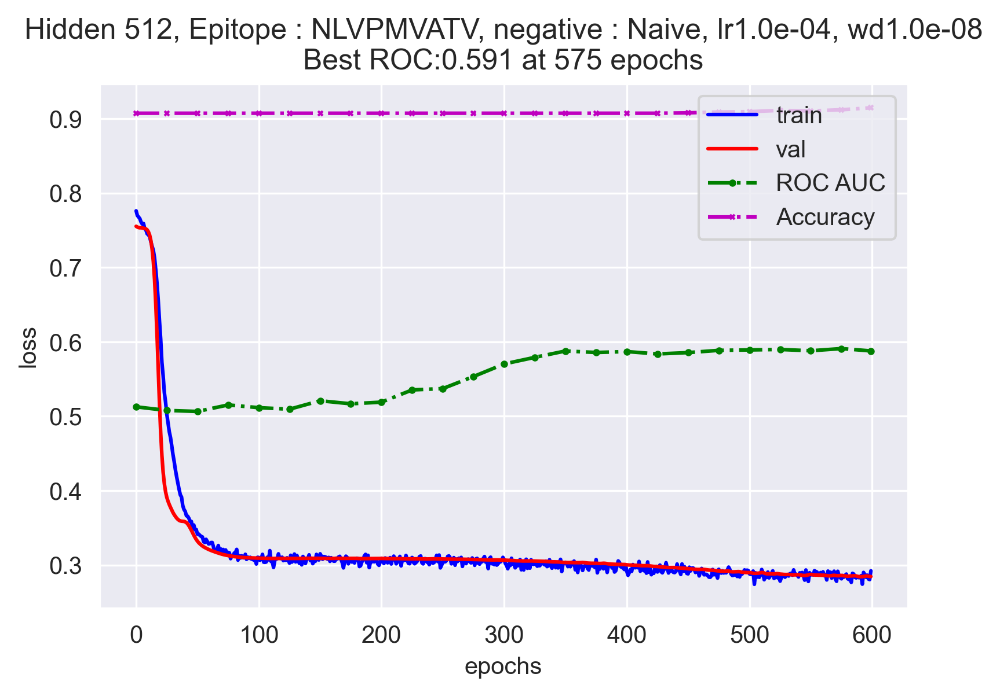

Getting merged_df


,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label
21494,21494,CASSHRDSSNEKLFF,TCRBV05-01,TCRBJ01-04,negative,4,0,emerson,0
25291,25291,CASSTGFPETQYF,TCRBV28-01,TCRBJ02-05,negative,27,1,emerson,0
49785,49785,CASSTLSGNTIYF,TCRBV27-01,TCRBJ01-03,negative,26,0,emerson,0
28538,28538,CASSRGVREYTDTQYF,TCRBV04-02,TCRBJ02-03,negative,3,1,emerson,0
51521,51521,CASSEVSGSTGELFF,TCRBV06-01,TCRBJ02-02,negative,5,1,emerson,0


['GILGFVFTL' 'negative']
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label,z_0,...,z_90,z_91,z_92,z_93,z_94,z_95,z_96,z_97,z_98,z_99
40172,40172,CALKEAGRGEKLFF,TCRBV06-01,TCRBJ01-04,negative,5,0,emerson,0,0.602617,...,-0.623925,0.053412,-1.152926,-0.807173,0.584240,-1.146742,1.100539,1.052568,-0.191608,0.229224
39561,39561,CAISEGRDRGIEFF,TCRBV10-03,TCRBJ02-01,negative,9,1,emerson,0,-1.030187,...,0.428556,0.250719,0.426656,1.210654,1.192846,-1.634011,-1.937637,0.905495,-1.803826,1.052830
33414,33414,CAWRQGRVEKLFF,TCRBV30-01,TCRBJ01-04,negative,29,0,emerson,0,-0.134909,...,0.861207,0.685236,-0.019283,1.315815,0.085030,-1.873776,0.248899,0.789605,-0.152429,0.210307
8019,8019,CASSSIPTDTQYF,TCRBV05-01,TCRBJ02-03,negative,4,1,emerson,0,1.487926,...,0.065529,0.036618,1.845349,0.385638,-0.509608,0.004367,0.719462,-0.475164,0.773483,-1.509237
21246,21246,CASRPGLATNEQFF,TCRBV06-05,TCRBJ02-01,negative,5,1,emerson,0,-0.680752,...,0.016832,0.631252,-0.713466,0.163924,-1.668769,-0.989683,0.980498,-0.246581,0.502609,-0.841871


Percent of positive class in train: 9.05%
Percent of positive class in val:   9.19%
Hidden 256, Epitope : GILGFVFTL, negative : Emerson, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.606e-01	Val: 7.232e-01
		ROC AUC :0.740, 	accuracy: 0.908
Epoch:25;	Train: 2.403e-01	Val: 2.220e-01
		ROC AUC :0.793, 	accuracy: 0.935
Epoch:50;	Train: 2.151e-01	Val: 2.095e-01
		ROC AUC :0.809, 	accuracy: 0.937
Epoch:75;	Train: 2.138e-01	Val: 2.059e-01
		ROC AUC :0.820, 	accuracy: 0.937
Epoch:100;	Train: 2.039e-01	Val: 2.012e-01
		ROC AUC :0.824, 	accuracy: 0.939
Epoch:125;	Train: 1.999e-01	Val: 1.999e-01
		ROC AUC :0.835, 	accuracy: 0.939
Epoch:150;	Train: 1.843e-01	Val: 1.990e-01
		ROC AUC :0.840, 	accuracy: 0.939
Epoch:175;	Train: 1.842e-01	Val: 1.941e-01
		ROC AUC :0.843, 	accuracy: 0.942
Epoch:200;	Train: 1.824e-01	Val: 1.891e-01
		ROC AUC :0.848, 	accuracy: 0.944
Epoch:225;	Train: 1.785e-01	Val: 1.889e-01
		ROC AUC :0.854, 	accuracy: 0.945
Epoch:250;	Train: 1.696e-01	Val: 1.860e-01
		ROC AUC :0.855, 	accuracy: 0.946
Epoch:275;	Train: 1.711e-01	Val: 1.894e-01
		ROC AUC :0.857, 	accuracy: 0.946
Epoch:300;	Train: 1.643e-01	Val: 1.914e-01
		ROC AUC :0.854, 	accurac

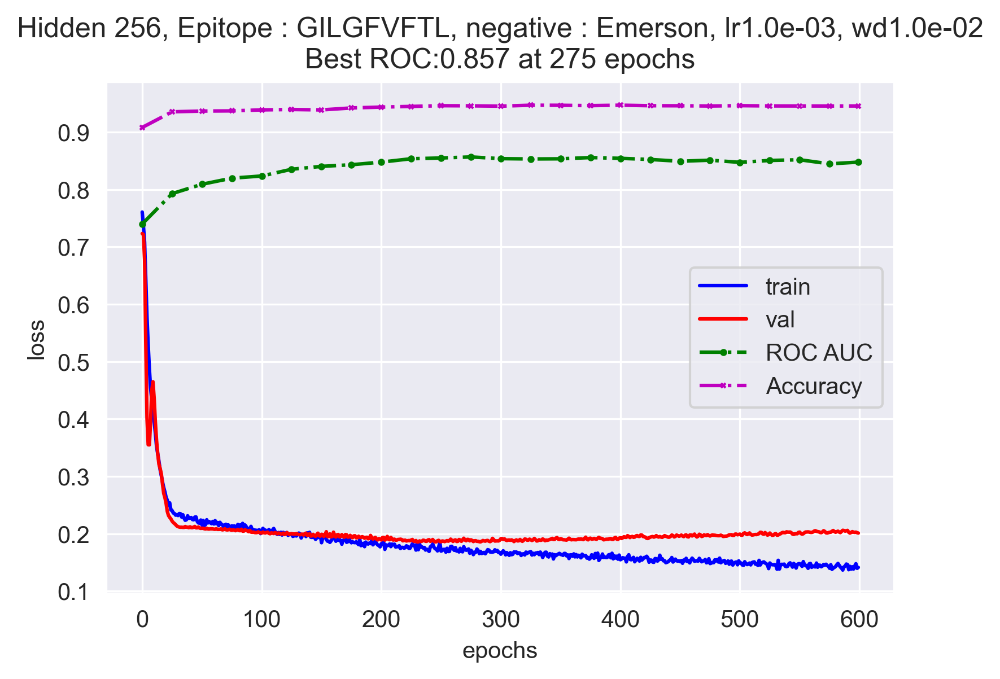

Hidden 256, Epitope : GILGFVFTL, negative : Emerson, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.117e-01	Val: 7.866e-01
		ROC AUC :0.615, 	accuracy: 0.908
Epoch:25;	Train: 6.843e-01	Val: 6.011e-01
		ROC AUC :0.653, 	accuracy: 0.890
Epoch:50;	Train: 4.666e-01	Val: 3.989e-01
		ROC AUC :0.701, 	accuracy: 0.908
Epoch:75;	Train: 3.504e-01	Val: 3.191e-01
		ROC AUC :0.762, 	accuracy: 0.908
Epoch:100;	Train: 2.949e-01	Val: 2.694e-01
		ROC AUC :0.776, 	accuracy: 0.910
Epoch:125;	Train: 2.663e-01	Val: 2.399e-01
		ROC AUC :0.782, 	accuracy: 0.925
Epoch:150;	Train: 2.451e-01	Val: 2.254e-01
		ROC AUC :0.783, 	accuracy: 0.930
Epoch:175;	Train: 2.407e-01	Val: 2.184e-01
		ROC AUC :0.785, 	accuracy: 0.934
Epoch:200;	Train: 2.381e-01	Val: 2.150e-01
		ROC AUC :0.787, 	accuracy: 0.935
Epoch:225;	Train: 2.332e-01	Val: 2.127e-01
		ROC AUC :0.790, 	accuracy: 0.935
Epoch:250;	Train: 2.235e-01	Val: 2.119e-01
		ROC AUC :0.793, 	accuracy: 0.936
Epoch:275;	Train: 2.268e-01	Val: 2.113e-01
		ROC AUC :0.793, 	accuracy: 0.936
Epoch:300;	Train: 2.284e-01	Val: 2.120e-01
		ROC AUC :0.793, 	accurac

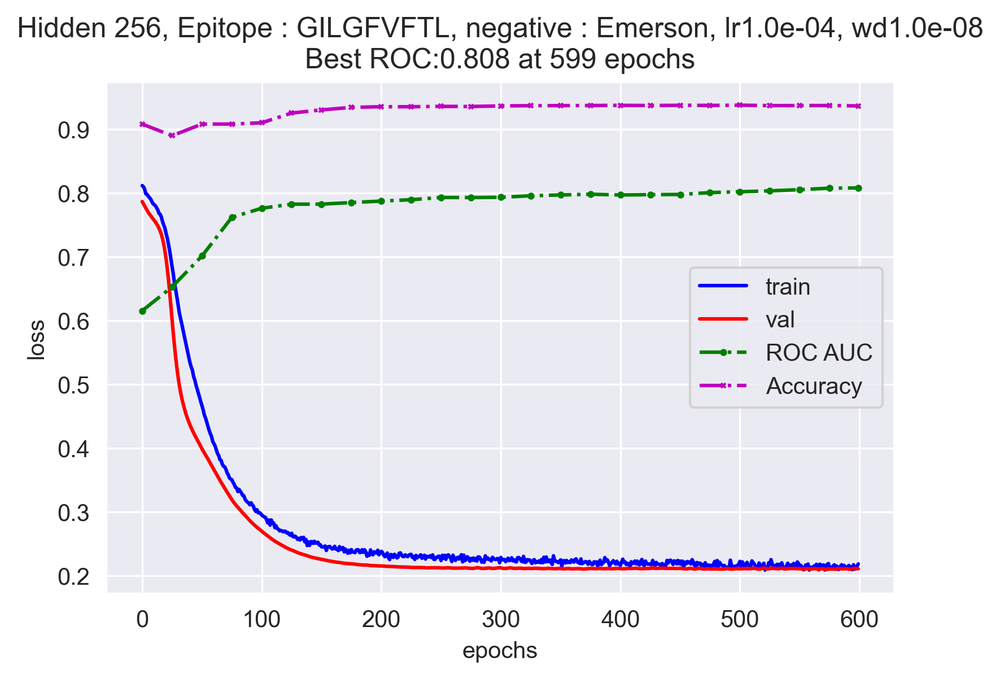

Hidden 512, Epitope : GILGFVFTL, negative : Emerson, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.923e-01	Val: 6.820e-01
		ROC AUC :0.760, 	accuracy: 0.908
Epoch:25;	Train: 2.256e-01	Val: 2.161e-01
		ROC AUC :0.797, 	accuracy: 0.936
Epoch:50;	Train: 2.105e-01	Val: 2.106e-01
		ROC AUC :0.806, 	accuracy: 0.937
Epoch:75;	Train: 2.080e-01	Val: 2.030e-01
		ROC AUC :0.827, 	accuracy: 0.938
Epoch:100;	Train: 1.989e-01	Val: 1.989e-01
		ROC AUC :0.837, 	accuracy: 0.940
Epoch:125;	Train: 1.960e-01	Val: 1.974e-01
		ROC AUC :0.839, 	accuracy: 0.940
Epoch:150;	Train: 1.873e-01	Val: 1.971e-01
		ROC AUC :0.842, 	accuracy: 0.940
Epoch:175;	Train: 1.766e-01	Val: 1.942e-01
		ROC AUC :0.847, 	accuracy: 0.942
Epoch:200;	Train: 1.724e-01	Val: 1.932e-01
		ROC AUC :0.848, 	accuracy: 0.943
Epoch:225;	Train: 1.712e-01	Val: 1.911e-01
		ROC AUC :0.852, 	accuracy: 0.944
Epoch:250;	Train: 1.694e-01	Val: 1.905e-01
		ROC AUC :0.852, 	accuracy: 0.944
Epoch:275;	Train: 1.582e-01	Val: 1.907e-01
		ROC AUC :0.853, 	accuracy: 0.946
Epoch:300;	Train: 1.638e-01	Val: 1.923e-01
		ROC AUC :0.855, 	accurac

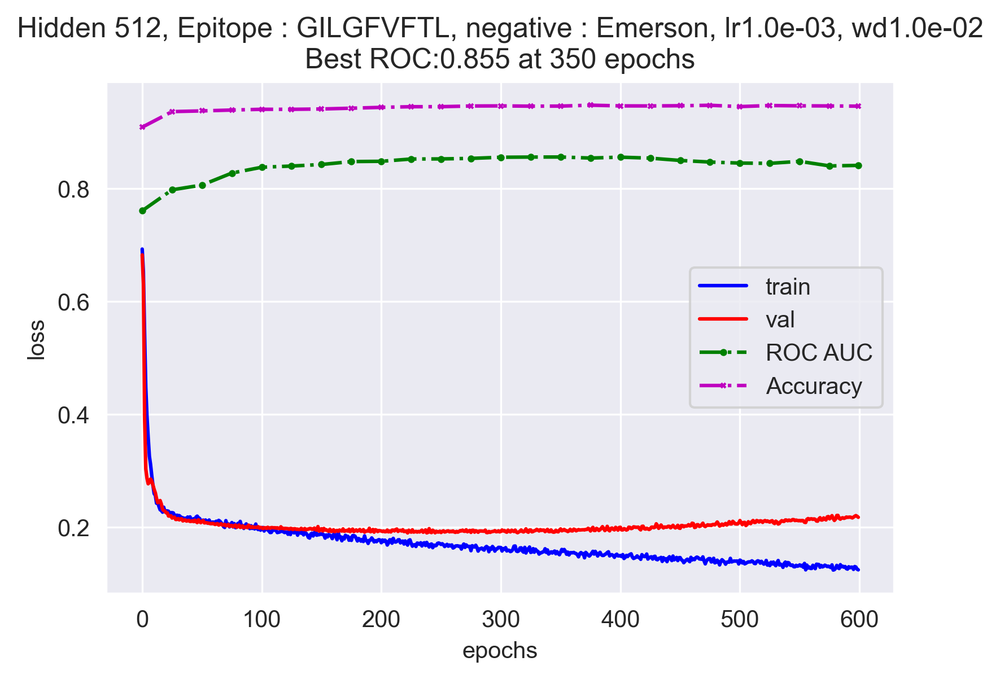

Hidden 512, Epitope : GILGFVFTL, negative : Emerson, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 5.867e-01	Val: 5.761e-01
		ROC AUC :0.712, 	accuracy: 0.908
Epoch:25;	Train: 4.925e-01	Val: 4.409e-01
		ROC AUC :0.770, 	accuracy: 0.908
Epoch:50;	Train: 3.634e-01	Val: 3.700e-01
		ROC AUC :0.780, 	accuracy: 0.924
Epoch:75;	Train: 3.204e-01	Val: 3.057e-01
		ROC AUC :0.802, 	accuracy: 0.935
Epoch:100;	Train: 2.959e-01	Val: 2.761e-01
		ROC AUC :0.804, 	accuracy: 0.936
Epoch:125;	Train: 2.718e-01	Val: 2.591e-01
		ROC AUC :0.803, 	accuracy: 0.936
Epoch:150;	Train: 2.644e-01	Val: 2.438e-01
		ROC AUC :0.803, 	accuracy: 0.937
Epoch:175;	Train: 2.529e-01	Val: 2.340e-01
		ROC AUC :0.805, 	accuracy: 0.938
Epoch:200;	Train: 2.448e-01	Val: 2.272e-01
		ROC AUC :0.804, 	accuracy: 0.937
Epoch:225;	Train: 2.340e-01	Val: 2.216e-01
		ROC AUC :0.806, 	accuracy: 0.938
Epoch:250;	Train: 2.373e-01	Val: 2.187e-01
		ROC AUC :0.807, 	accuracy: 0.938
Epoch:275;	Train: 2.212e-01	Val: 2.153e-01
		ROC AUC :0.812, 	accuracy: 0.938
Epoch:300;	Train: 2.230e-01	Val: 2.128e-01
		ROC AUC :0.815, 	accurac

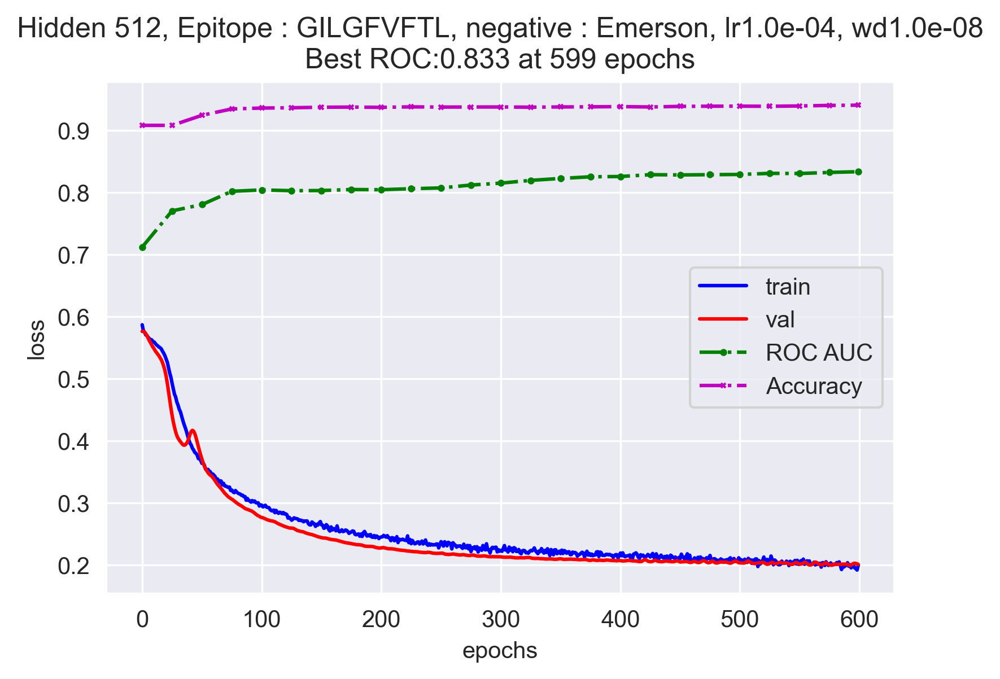

Getting merged_df


,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label
44102,44102,CSAHDSGLAAQPQHF,TRBV20-1,TRBJ1-5,negative,19,0,naive,0
22817,22817,CASSSRDRSTGELFF,TRBV11-2,TRBJ2-2,negative,10,1,naive,0
32176,32176,CAINSGANVLTF,TRBV6-2,TRBJ2-6,negative,5,1,naive,0
7564,7564,CASSLNGGPGYTF,TRBV5-1,TRBJ1-2,negative,4,0,naive,0
24838,24838,CAIGEFWTGAGNTIYF,TRBV10-3,TRBJ1-3,negative,9,0,naive,0


['GILGFVFTL' 'negative']
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label,z_0,...,z_90,z_91,z_92,z_93,z_94,z_95,z_96,z_97,z_98,z_99
13116,13116,CASSLYRGNTEAFF,TRBV5-1,TRBJ1-1,negative,4,0,naive,0,2.428047,...,1.510199,0.822631,0.088949,0.334768,-0.780045,0.456399,0.322707,0.338213,0.821239,-1.400053
17625,17625,CASSLGGIYYNEQFF,TRBV7-8,TRBJ2-1,negative,6,1,naive,0,-0.619933,...,1.802935,-2.610305,-0.922922,-0.622607,-0.228107,0.938242,0.397728,-0.668488,0.693170,0.822101
25417,25417,CASSVDDYGMWYGDTF,TRBV9,TRBJ1-2,negative,8,0,naive,0,-0.517962,...,-0.937602,-2.471024,2.094863,0.862074,0.050598,-0.366415,1.019769,1.448500,0.625274,0.457383
1644,1644,CASSSVRSTDTQYF,TRBV11-1*01,TRBJ2-3*01,GILGFVFTL,10,1,vdjdb,1,0.090474,...,0.851362,-0.229701,0.941339,-0.698235,0.047138,-0.056691,0.931763,-0.291431,1.227942,-0.269582
28966,28966,CATSRRVSYNEQFF,TRBV15,TRBJ2-1,negative,14,1,naive,0,0.406916,...,-0.045459,-0.197866,-1.248858,0.160304,-0.154874,1.597966,0.556217,-0.873265,0.675427,0.002094


Percent of positive class in train: 9.05%
Percent of positive class in val:   9.19%
Hidden 256, Epitope : GILGFVFTL, negative : Naive, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.305e-01	Val: 6.037e-01
		ROC AUC :0.741, 	accuracy: 0.908
Epoch:25;	Train: 2.276e-01	Val: 2.327e-01
		ROC AUC :0.796, 	accuracy: 0.931
Epoch:50;	Train: 2.199e-01	Val: 2.138e-01
		ROC AUC :0.796, 	accuracy: 0.935
Epoch:75;	Train: 2.143e-01	Val: 2.128e-01
		ROC AUC :0.793, 	accuracy: 0.936
Epoch:100;	Train: 2.140e-01	Val: 2.099e-01
		ROC AUC :0.799, 	accuracy: 0.939
Epoch:125;	Train: 1.923e-01	Val: 1.932e-01
		ROC AUC :0.816, 	accuracy: 0.946
Epoch:150;	Train: 1.934e-01	Val: 1.912e-01
		ROC AUC :0.811, 	accuracy: 0.947
Epoch:175;	Train: 1.831e-01	Val: 1.901e-01
		ROC AUC :0.821, 	accuracy: 0.948
Epoch:200;	Train: 1.857e-01	Val: 1.893e-01
		ROC AUC :0.829, 	accuracy: 0.948
Epoch:225;	Train: 1.721e-01	Val: 1.834e-01
		ROC AUC :0.837, 	accuracy: 0.949
Epoch:250;	Train: 1.676e-01	Val: 1.784e-01
		ROC AUC :0.842, 	accuracy: 0.950
Epoch:275;	Train: 1.685e-01	Val: 1.697e-01
		ROC AUC :0.850, 	accuracy: 0.953
Epoch:300;	Train: 1.575e-01	Val: 1.685e-01
		ROC AUC :0.849, 	accurac

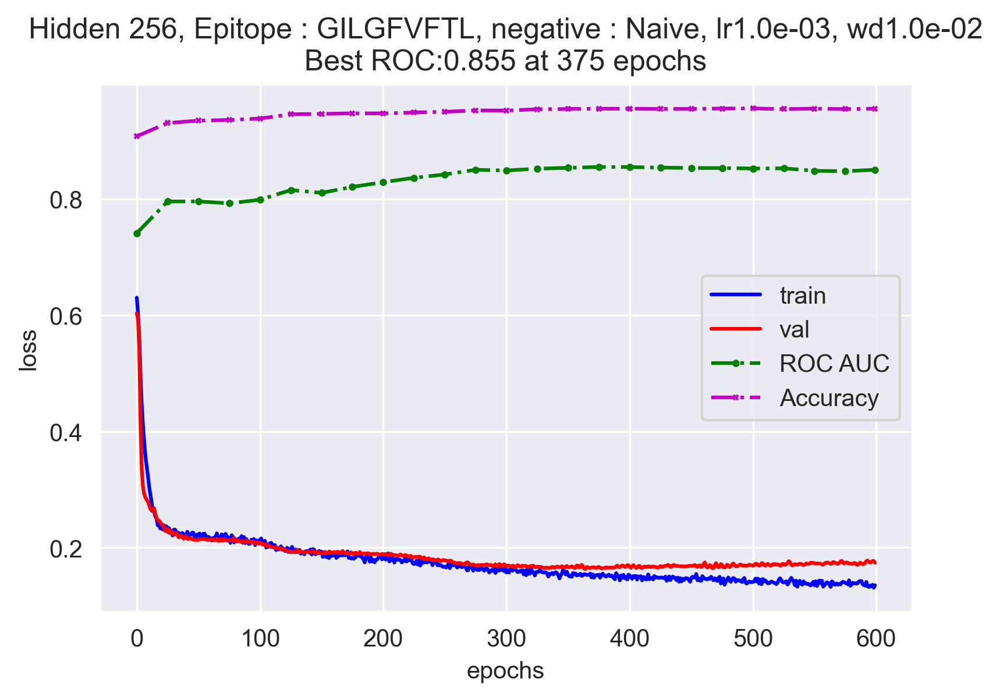

Hidden 256, Epitope : GILGFVFTL, negative : Naive, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.990e-01	Val: 7.155e-01
		ROC AUC :0.627, 	accuracy: 0.908
Epoch:25;	Train: 6.270e-01	Val: 5.237e-01
		ROC AUC :0.661, 	accuracy: 0.893
Epoch:50;	Train: 4.025e-01	Val: 3.461e-01
		ROC AUC :0.699, 	accuracy: 0.908
Epoch:75;	Train: 3.112e-01	Val: 2.844e-01
		ROC AUC :0.771, 	accuracy: 0.908
Epoch:100;	Train: 2.717e-01	Val: 2.499e-01
		ROC AUC :0.783, 	accuracy: 0.914
Epoch:125;	Train: 2.466e-01	Val: 2.308e-01
		ROC AUC :0.789, 	accuracy: 0.926
Epoch:150;	Train: 2.398e-01	Val: 2.228e-01
		ROC AUC :0.788, 	accuracy: 0.932
Epoch:175;	Train: 2.423e-01	Val: 2.191e-01
		ROC AUC :0.787, 	accuracy: 0.933
Epoch:200;	Train: 2.289e-01	Val: 2.178e-01
		ROC AUC :0.788, 	accuracy: 0.933
Epoch:225;	Train: 2.255e-01	Val: 2.168e-01
		ROC AUC :0.788, 	accuracy: 0.933
Epoch:250;	Train: 2.237e-01	Val: 2.163e-01
		ROC AUC :0.788, 	accuracy: 0.934
Epoch:275;	Train: 2.267e-01	Val: 2.155e-01
		ROC AUC :0.790, 	accuracy: 0.935
Epoch:300;	Train: 2.215e-01	Val: 2.154e-01
		ROC AUC :0.790, 	accurac

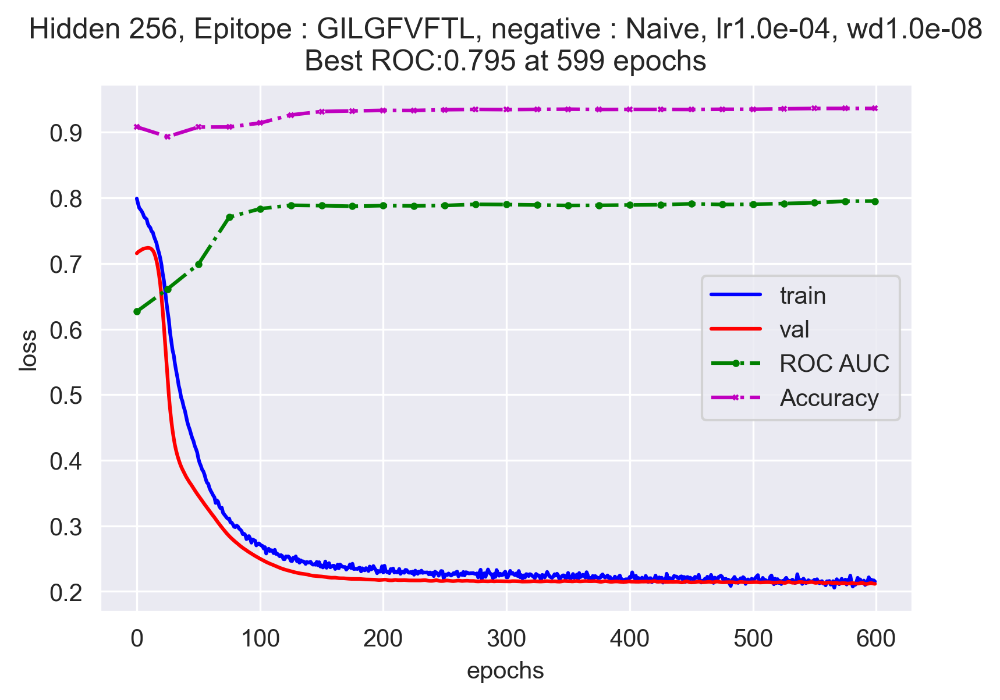

Hidden 512, Epitope : GILGFVFTL, negative : Naive, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.957e-01	Val: 6.775e-01
		ROC AUC :0.767, 	accuracy: 0.908
Epoch:25;	Train: 2.378e-01	Val: 2.285e-01
		ROC AUC :0.790, 	accuracy: 0.933
Epoch:50;	Train: 2.162e-01	Val: 2.138e-01
		ROC AUC :0.797, 	accuracy: 0.935
Epoch:75;	Train: 2.129e-01	Val: 2.126e-01
		ROC AUC :0.800, 	accuracy: 0.936
Epoch:100;	Train: 2.029e-01	Val: 1.989e-01
		ROC AUC :0.815, 	accuracy: 0.944
Epoch:125;	Train: 1.892e-01	Val: 1.902e-01
		ROC AUC :0.831, 	accuracy: 0.946
Epoch:150;	Train: 1.802e-01	Val: 1.802e-01
		ROC AUC :0.845, 	accuracy: 0.948
Epoch:175;	Train: 1.718e-01	Val: 1.742e-01
		ROC AUC :0.848, 	accuracy: 0.950
Epoch:200;	Train: 1.676e-01	Val: 1.685e-01
		ROC AUC :0.853, 	accuracy: 0.952
Epoch:225;	Train: 1.592e-01	Val: 1.681e-01
		ROC AUC :0.854, 	accuracy: 0.953
Epoch:250;	Train: 1.545e-01	Val: 1.675e-01
		ROC AUC :0.856, 	accuracy: 0.954
Epoch:275;	Train: 1.520e-01	Val: 1.670e-01
		ROC AUC :0.857, 	accuracy: 0.955
Epoch:300;	Train: 1.522e-01	Val: 1.665e-01
		ROC AUC :0.856, 	accurac

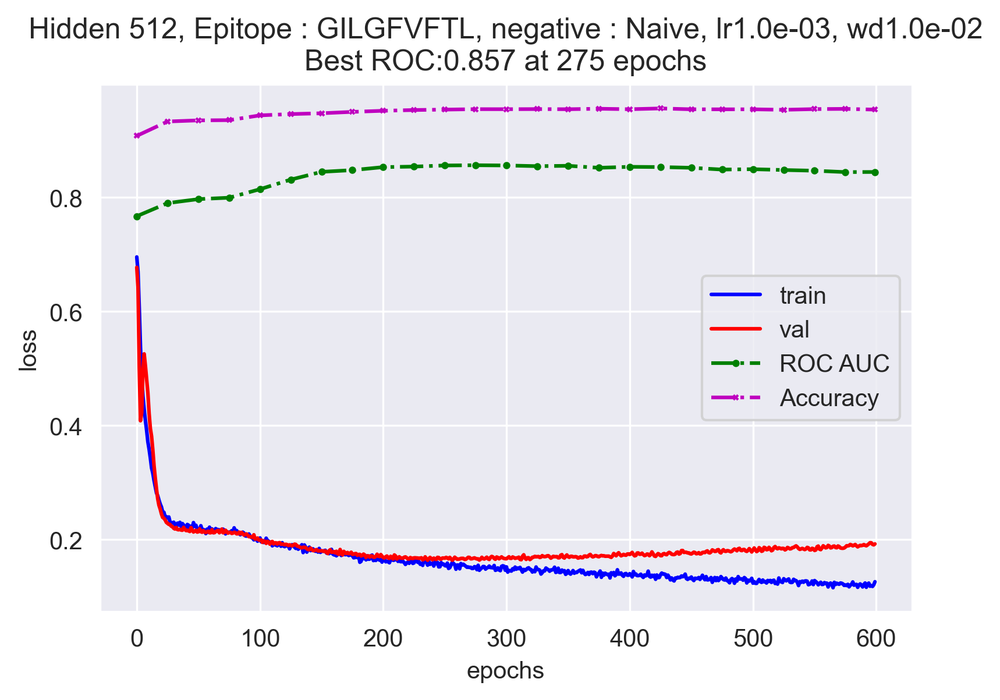

Hidden 512, Epitope : GILGFVFTL, negative : Naive, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.169e-01	Val: 7.863e-01
		ROC AUC :0.736, 	accuracy: 0.908
Epoch:25;	Train: 5.676e-01	Val: 4.820e-01
		ROC AUC :0.677, 	accuracy: 0.908
Epoch:50;	Train: 4.132e-01	Val: 3.991e-01
		ROC AUC :0.766, 	accuracy: 0.919
Epoch:75;	Train: 3.498e-01	Val: 3.311e-01
		ROC AUC :0.783, 	accuracy: 0.927
Epoch:100;	Train: 3.037e-01	Val: 2.853e-01
		ROC AUC :0.790, 	accuracy: 0.930
Epoch:125;	Train: 2.764e-01	Val: 2.571e-01
		ROC AUC :0.791, 	accuracy: 0.933
Epoch:150;	Train: 2.578e-01	Val: 2.401e-01
		ROC AUC :0.793, 	accuracy: 0.933
Epoch:175;	Train: 2.488e-01	Val: 2.293e-01
		ROC AUC :0.791, 	accuracy: 0.933
Epoch:200;	Train: 2.391e-01	Val: 2.234e-01
		ROC AUC :0.791, 	accuracy: 0.934
Epoch:225;	Train: 2.321e-01	Val: 2.184e-01
		ROC AUC :0.792, 	accuracy: 0.934
Epoch:250;	Train: 2.289e-01	Val: 2.155e-01
		ROC AUC :0.793, 	accuracy: 0.934
Epoch:275;	Train: 2.296e-01	Val: 2.143e-01
		ROC AUC :0.794, 	accuracy: 0.935
Epoch:300;	Train: 2.216e-01	Val: 2.142e-01
		ROC AUC :0.794, 	accurac

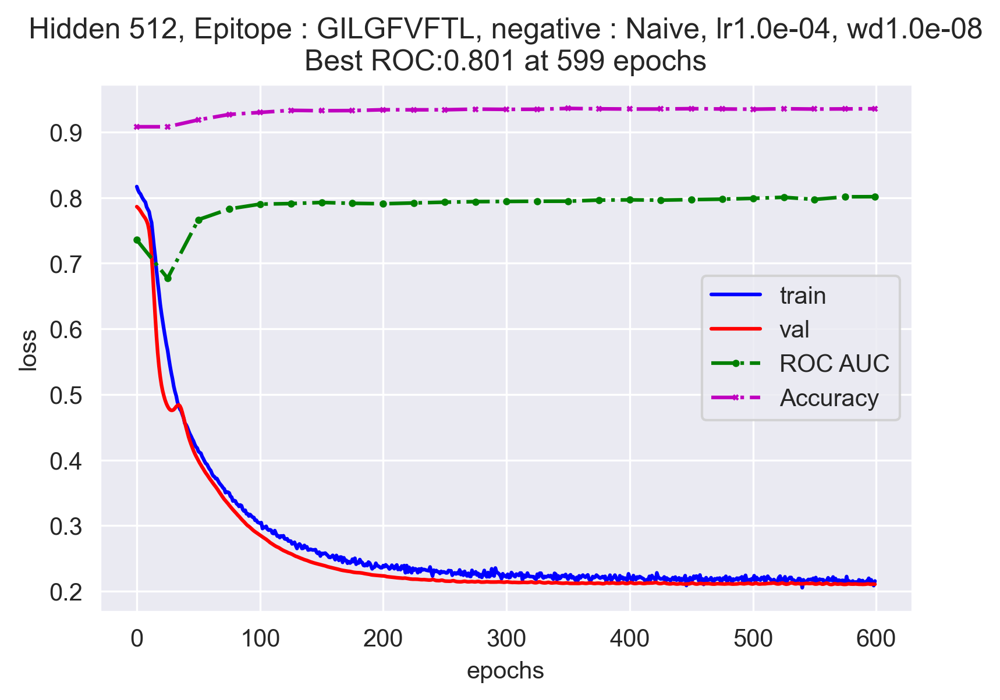

Getting merged_df


,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label
3825,3825,CASTESGLAVDTQYF,TCRBV25-01,TCRBJ02-03,negative,24,1,emerson,0
145,145,CASSTPRKEWGRAEAFF,TRBV3-1*01,TRBJ1-1*01,YLQPRTFLL,2,0,vdjdb,1
1953,1953,CASRVFGRVGETQYF,TCRBV19-01,TCRBJ02-05,negative,18,1,emerson,0
1657,1657,CASSPTTENYGYTF,TCRBV18-01,TCRBJ01-02,negative,17,0,emerson,0
3139,3139,CASSDDTMNTEAFF,TCRBV04-01,TCRBJ01-01,negative,3,0,emerson,0


['YLQPRTFLL' 'negative']
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label,z_0,...,z_90,z_91,z_92,z_93,z_94,z_95,z_96,z_97,z_98,z_99
566,566,CSVLPERVNTEAFF,TCRBV29-01,TCRBJ01-01,negative,28,0,emerson,0,-0.510854,...,1.410074,-1.352335,0.766252,1.298959,-0.728209,-1.861223,-1.746250,0.306676,0.542434,-0.042247
1699,1699,CASSPGDRGGNGYTF,TCRBV07-03,TCRBJ01-02,negative,6,0,emerson,0,-1.219871,...,0.609676,-0.357457,0.630408,0.355949,0.241132,0.899273,-1.082712,1.156701,0.223904,-1.188016
163,163,CALLLDWDTGELFF,TRBV2*01,TRBJ2-2*01,YLQPRTFLL,1,1,vdjdb,1,-1.602964,...,-0.058879,-1.847792,-1.122720,1.891783,0.722256,0.505487,0.292364,-0.135740,0.820697,0.271621
175,175,CASSPDIEQYF,TRBV7-9*01,TRBJ2-7*01,YLQPRTFLL,6,1,vdjdb,1,1.112266,...,0.443088,-0.789568,-1.343722,-0.254113,-0.116669,0.896072,0.693760,-0.280250,-1.521333,-0.264480
3347,3347,CASSILSLNSDRGREAFF,TCRBV19-01,TCRBJ01-01,negative,18,0,emerson,0,-0.258957,...,0.369856,1.832091,-0.415789,-0.100880,-1.044280,2.329515,-0.357245,0.298448,0.428265,0.901186


Percent of positive class in train: 8.67%
Percent of positive class in val:   10.07%
Hidden 256, Epitope : YLQPRTFLL, negative : Emerson, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.681e-01	Val: 6.274e-01
		ROC AUC :0.718, 	accuracy: 0.899
Epoch:25;	Train: 2.927e-01	Val: 2.838e-01
		ROC AUC :0.790, 	accuracy: 0.899
Epoch:50;	Train: 1.936e-01	Val: 2.757e-01
		ROC AUC :0.822, 	accuracy: 0.905
Epoch:75;	Train: 1.734e-01	Val: 2.965e-01
		ROC AUC :0.813, 	accuracy: 0.908
Epoch:100;	Train: 1.467e-01	Val: 3.182e-01
		ROC AUC :0.810, 	accuracy: 0.896
Epoch:125;	Train: 1.293e-01	Val: 3.366e-01
		ROC AUC :0.806, 	accuracy: 0.893
Epoch:150;	Train: 1.157e-01	Val: 3.416e-01
		ROC AUC :0.804, 	accuracy: 0.896
Epoch:175;	Train: 9.073e-02	Val: 3.729e-01
		ROC AUC :0.808, 	accuracy: 0.892
Epoch:200;	Train: 7.543e-02	Val: 3.883e-01
		ROC AUC :0.805, 	accuracy: 0.894
Epoch:225;	Train: 6.211e-02	Val: 3.852e-01
		ROC AUC :0.836, 	accuracy: 0.902
Epoch:250;	Train: 4.766e-02	Val: 4.060e-01
		ROC AUC :0.812, 	accuracy: 0.898
Epoch:275;	Train: 4.628e-02	Val: 4.319e-01
		ROC AUC :0.810, 	accuracy: 0.901
Epoch:300;	Train: 2.914e-02	Val: 4.518e-01
		ROC AUC :0.757, 	accurac

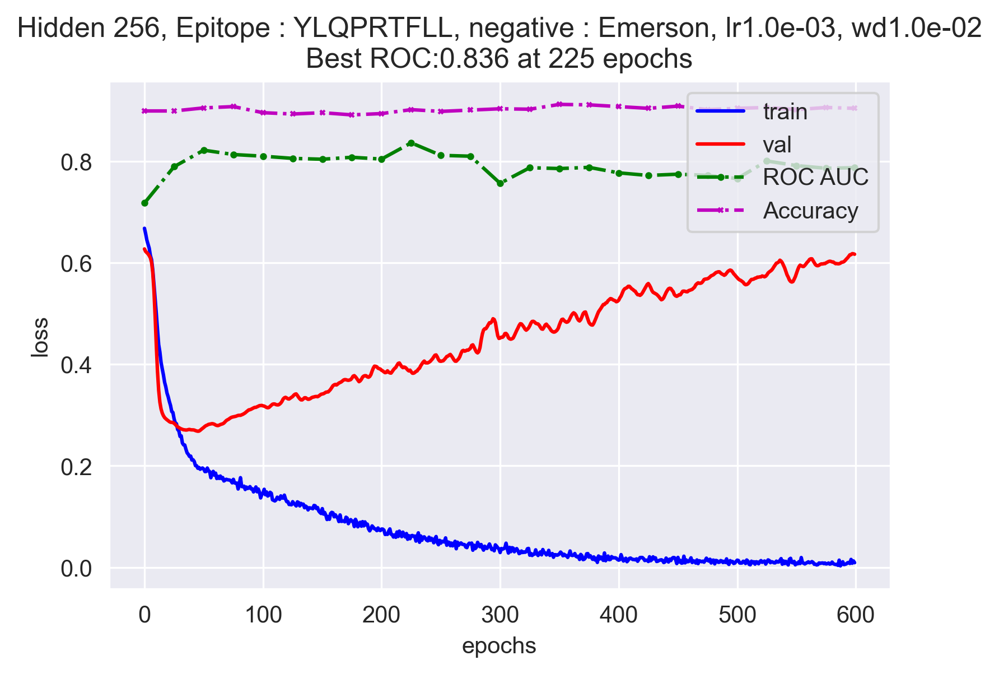

Hidden 256, Epitope : YLQPRTFLL, negative : Emerson, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.331e-01	Val: 8.102e-01
		ROC AUC :0.567, 	accuracy: 0.899
Epoch:25;	Train: 8.037e-01	Val: 7.870e-01
		ROC AUC :0.820, 	accuracy: 0.833
Epoch:50;	Train: 7.372e-01	Val: 7.113e-01
		ROC AUC :0.813, 	accuracy: 0.811
Epoch:75;	Train: 5.942e-01	Val: 4.878e-01
		ROC AUC :0.663, 	accuracy: 0.876
Epoch:100;	Train: 5.002e-01	Val: 4.259e-01
		ROC AUC :0.691, 	accuracy: 0.889
Epoch:125;	Train: 4.194e-01	Val: 3.822e-01
		ROC AUC :0.745, 	accuracy: 0.892
Epoch:150;	Train: 3.583e-01	Val: 3.475e-01
		ROC AUC :0.778, 	accuracy: 0.897
Epoch:175;	Train: 3.180e-01	Val: 3.208e-01
		ROC AUC :0.794, 	accuracy: 0.895
Epoch:200;	Train: 2.907e-01	Val: 3.040e-01
		ROC AUC :0.804, 	accuracy: 0.894
Epoch:225;	Train: 2.673e-01	Val: 2.902e-01
		ROC AUC :0.814, 	accuracy: 0.896
Epoch:250;	Train: 2.463e-01	Val: 2.830e-01
		ROC AUC :0.820, 	accuracy: 0.894
Epoch:275;	Train: 2.314e-01	Val: 2.754e-01
		ROC AUC :0.823, 	accuracy: 0.897
Epoch:300;	Train: 2.174e-01	Val: 2.715e-01
		ROC AUC :0.824, 	accurac

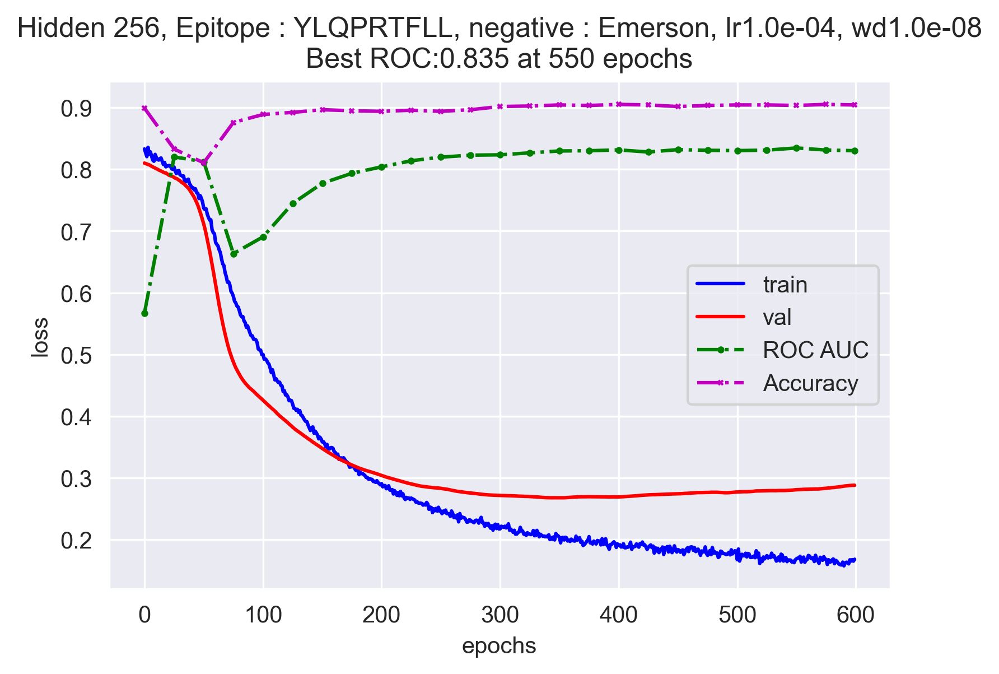

Hidden 512, Epitope : YLQPRTFLL, negative : Emerson, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.270e-01	Val: 7.794e-01
		ROC AUC :0.802, 	accuracy: 0.908
Epoch:25;	Train: 2.148e-01	Val: 2.920e-01
		ROC AUC :0.836, 	accuracy: 0.886
Epoch:50;	Train: 1.774e-01	Val: 2.909e-01
		ROC AUC :0.837, 	accuracy: 0.890
Epoch:75;	Train: 1.595e-01	Val: 2.974e-01
		ROC AUC :0.839, 	accuracy: 0.889
Epoch:100;	Train: 1.477e-01	Val: 3.258e-01
		ROC AUC :0.819, 	accuracy: 0.891
Epoch:125;	Train: 1.185e-01	Val: 3.335e-01
		ROC AUC :0.834, 	accuracy: 0.892
Epoch:150;	Train: 1.066e-01	Val: 3.540e-01
		ROC AUC :0.797, 	accuracy: 0.897
Epoch:175;	Train: 8.089e-02	Val: 3.606e-01
		ROC AUC :0.807, 	accuracy: 0.894
Epoch:200;	Train: 5.492e-02	Val: 3.853e-01
		ROC AUC :0.785, 	accuracy: 0.898
Epoch:225;	Train: 5.330e-02	Val: 3.958e-01
		ROC AUC :0.796, 	accuracy: 0.905
Epoch:250;	Train: 4.417e-02	Val: 4.509e-01
		ROC AUC :0.746, 	accuracy: 0.905
Epoch:275;	Train: 3.815e-02	Val: 4.263e-01
		ROC AUC :0.791, 	accuracy: 0.912
Epoch:300;	Train: 2.846e-02	Val: 4.482e-01
		ROC AUC :0.777, 	accurac

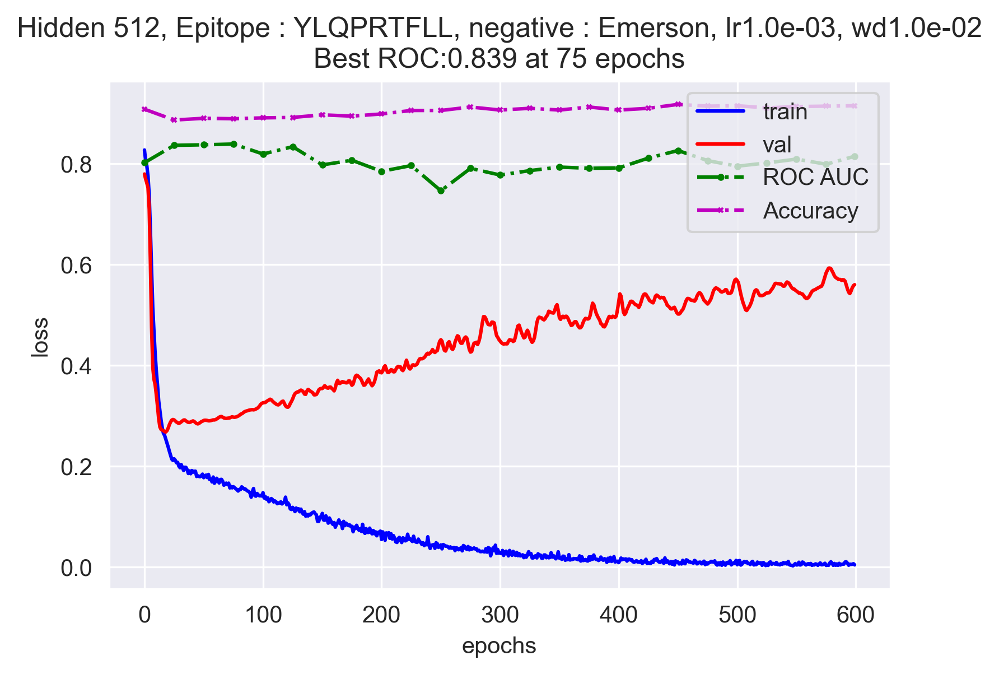

Hidden 512, Epitope : YLQPRTFLL, negative : Emerson, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.217e-01	Val: 6.813e-01
		ROC AUC :0.606, 	accuracy: 0.899
Epoch:25;	Train: 6.717e-01	Val: 6.583e-01
		ROC AUC :0.805, 	accuracy: 0.887
Epoch:50;	Train: 4.930e-01	Val: 3.997e-01
		ROC AUC :0.684, 	accuracy: 0.895
Epoch:75;	Train: 3.535e-01	Val: 3.269e-01
		ROC AUC :0.698, 	accuracy: 0.896
Epoch:100;	Train: 2.822e-01	Val: 2.978e-01
		ROC AUC :0.772, 	accuracy: 0.901
Epoch:125;	Train: 2.486e-01	Val: 2.726e-01
		ROC AUC :0.821, 	accuracy: 0.901
Epoch:150;	Train: 2.274e-01	Val: 2.643e-01
		ROC AUC :0.829, 	accuracy: 0.903
Epoch:175;	Train: 2.122e-01	Val: 2.635e-01
		ROC AUC :0.831, 	accuracy: 0.900
Epoch:200;	Train: 1.982e-01	Val: 2.648e-01
		ROC AUC :0.830, 	accuracy: 0.902
Epoch:225;	Train: 1.939e-01	Val: 2.661e-01
		ROC AUC :0.826, 	accuracy: 0.901
Epoch:250;	Train: 1.891e-01	Val: 2.709e-01
		ROC AUC :0.824, 	accuracy: 0.904
Epoch:275;	Train: 1.825e-01	Val: 2.751e-01
		ROC AUC :0.821, 	accuracy: 0.899
Epoch:300;	Train: 1.806e-01	Val: 2.793e-01
		ROC AUC :0.816, 	accurac

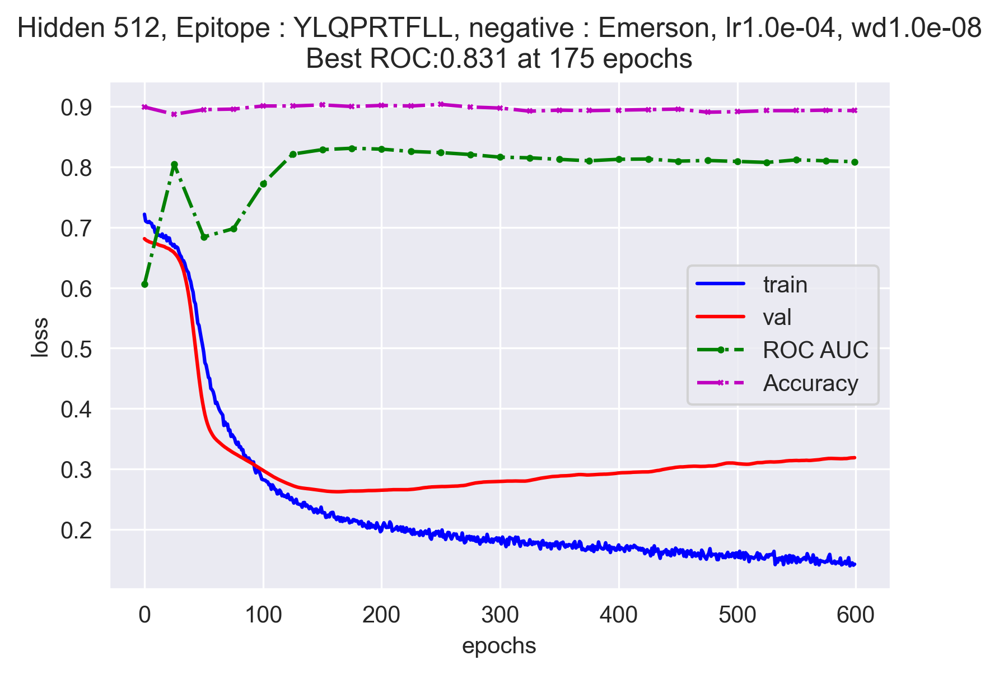

Getting merged_df


,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label
3366,3366,CASSPRFDEQFF,TRBV5-8,TRBJ2-1,negative,4,1,naive,0
1493,1493,CASSFKGGGSSYEQYF,TRBV27,TRBJ2-7,negative,26,1,naive,0
1444,1444,CASSLRSPGGSDTQYF,TRBV5-1,TRBJ2-3,negative,4,1,naive,0
1686,1686,CASSFPGGEDGYNF,TRBV5-6,TRBJ1-2,negative,4,0,naive,0
3175,3175,CTSSYGQVTDAHYF,TRBV6-5,TRBJ2-3,negative,5,1,naive,0


['YLQPRTFLL' 'negative']
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

,index,amino_acid,v_gene,j_gene,epitope,v,j,db,label,z_0,...,z_90,z_91,z_92,z_93,z_94,z_95,z_96,z_97,z_98,z_99
3325,3325,CASSSSGETDTQYF,TRBV19,TRBJ2-3,negative,18,1,naive,0,-0.320911,...,-0.625407,-0.481855,-0.443017,0.146621,0.169635,1.577412,-0.750031,-0.136136,0.862494,0.286192
2997,2997,CAPSDFEGGYDEQFF,TRBV24-1,TRBJ2-1,negative,23,1,naive,0,-0.926274,...,0.010007,1.596100,-1.076624,-0.557736,0.705703,-0.983848,0.478114,1.336057,-0.070871,-0.923137
3471,3471,CASSPPGHEIEAFF,TRBV7-6,TRBJ1-1,negative,6,0,naive,0,-0.567442,...,0.738694,0.729345,0.836571,0.037429,-0.591303,0.586539,-0.216037,0.594571,-0.601841,2.132865
920,920,CASEERSYDTPLHF,TRBV7-9,TRBJ1-6,negative,6,0,naive,0,-1.799636,...,-2.739950,-1.502300,-1.303248,1.447152,-0.188766,1.177816,-0.342860,-0.512327,0.878645,-0.674360
1124,1124,CASSLTQNTEAFF,TRBV27,TRBJ1-1,negative,26,0,naive,0,-0.242600,...,-1.095321,-1.482134,0.016232,0.392658,-0.785068,-0.195072,0.293950,-0.149189,0.083396,2.155372


Percent of positive class in train: 8.67%
Percent of positive class in val:   10.07%
Hidden 256, Epitope : YLQPRTFLL, negative : Naive, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.147e-01	Val: 6.870e-01
		ROC AUC :0.735, 	accuracy: 0.899
Epoch:25;	Train: 4.081e-01	Val: 3.998e-01
		ROC AUC :0.789, 	accuracy: 0.899
Epoch:50;	Train: 2.410e-01	Val: 2.634e-01
		ROC AUC :0.828, 	accuracy: 0.912
Epoch:75;	Train: 1.955e-01	Val: 2.425e-01
		ROC AUC :0.831, 	accuracy: 0.917
Epoch:100;	Train: 1.800e-01	Val: 2.460e-01
		ROC AUC :0.818, 	accuracy: 0.920
Epoch:125;	Train: 1.483e-01	Val: 2.685e-01
		ROC AUC :0.813, 	accuracy: 0.912
Epoch:150;	Train: 1.351e-01	Val: 3.083e-01
		ROC AUC :0.809, 	accuracy: 0.909
Epoch:175;	Train: 1.115e-01	Val: 3.309e-01
		ROC AUC :0.774, 	accuracy: 0.906
Epoch:200;	Train: 9.106e-02	Val: 3.493e-01
		ROC AUC :0.776, 	accuracy: 0.904
Epoch:225;	Train: 7.401e-02	Val: 3.971e-01
		ROC AUC :0.731, 	accuracy: 0.900
Epoch:250;	Train: 6.220e-02	Val: 4.105e-01
		ROC AUC :0.741, 	accuracy: 0.904
Epoch:275;	Train: 5.986e-02	Val: 4.425e-01
		ROC AUC :0.737, 	accuracy: 0.898
Epoch:300;	Train: 4.204e-02	Val: 4.584e-01
		ROC AUC :0.691, 	accurac

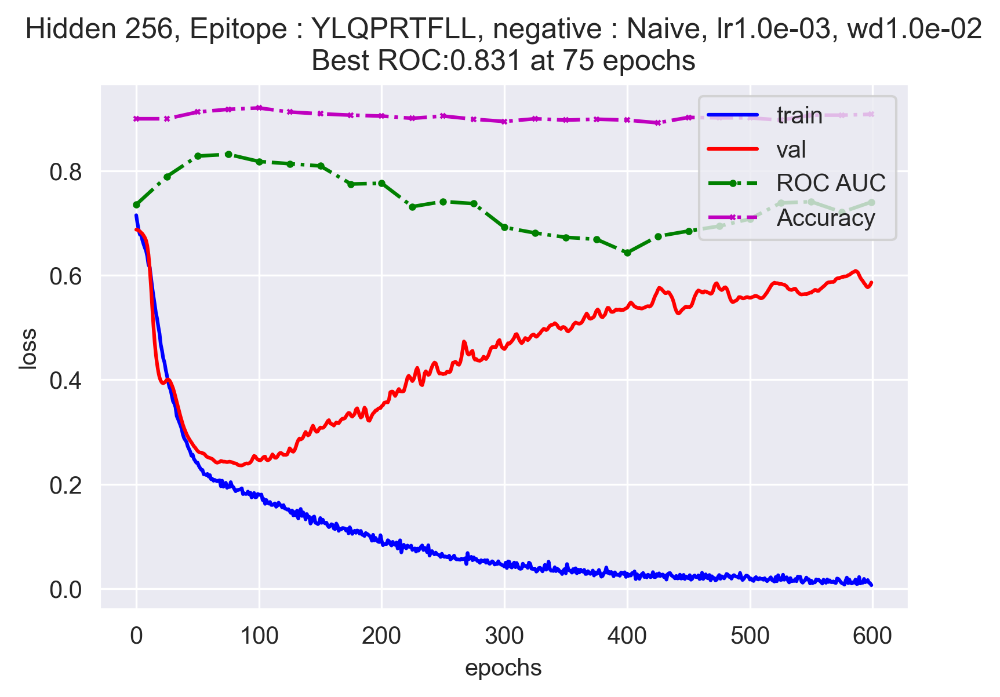

Hidden 256, Epitope : YLQPRTFLL, negative : Naive, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.647e-01	Val: 6.439e-01
		ROC AUC :0.516, 	accuracy: 0.899
Epoch:25;	Train: 6.338e-01	Val: 6.279e-01
		ROC AUC :0.754, 	accuracy: 0.905
Epoch:50;	Train: 5.946e-01	Val: 5.856e-01
		ROC AUC :0.749, 	accuracy: 0.874
Epoch:75;	Train: 4.789e-01	Val: 4.287e-01
		ROC AUC :0.623, 	accuracy: 0.886
Epoch:100;	Train: 4.078e-01	Val: 3.835e-01
		ROC AUC :0.614, 	accuracy: 0.896
Epoch:125;	Train: 3.588e-01	Val: 3.566e-01
		ROC AUC :0.661, 	accuracy: 0.898
Epoch:150;	Train: 3.221e-01	Val: 3.329e-01
		ROC AUC :0.713, 	accuracy: 0.898
Epoch:175;	Train: 2.926e-01	Val: 3.152e-01
		ROC AUC :0.743, 	accuracy: 0.900
Epoch:200;	Train: 2.787e-01	Val: 3.032e-01
		ROC AUC :0.758, 	accuracy: 0.900
Epoch:225;	Train: 2.600e-01	Val: 2.922e-01
		ROC AUC :0.770, 	accuracy: 0.903
Epoch:250;	Train: 2.416e-01	Val: 2.850e-01
		ROC AUC :0.777, 	accuracy: 0.902
Epoch:275;	Train: 2.281e-01	Val: 2.798e-01
		ROC AUC :0.785, 	accuracy: 0.905
Epoch:300;	Train: 2.167e-01	Val: 2.769e-01
		ROC AUC :0.783, 	accurac

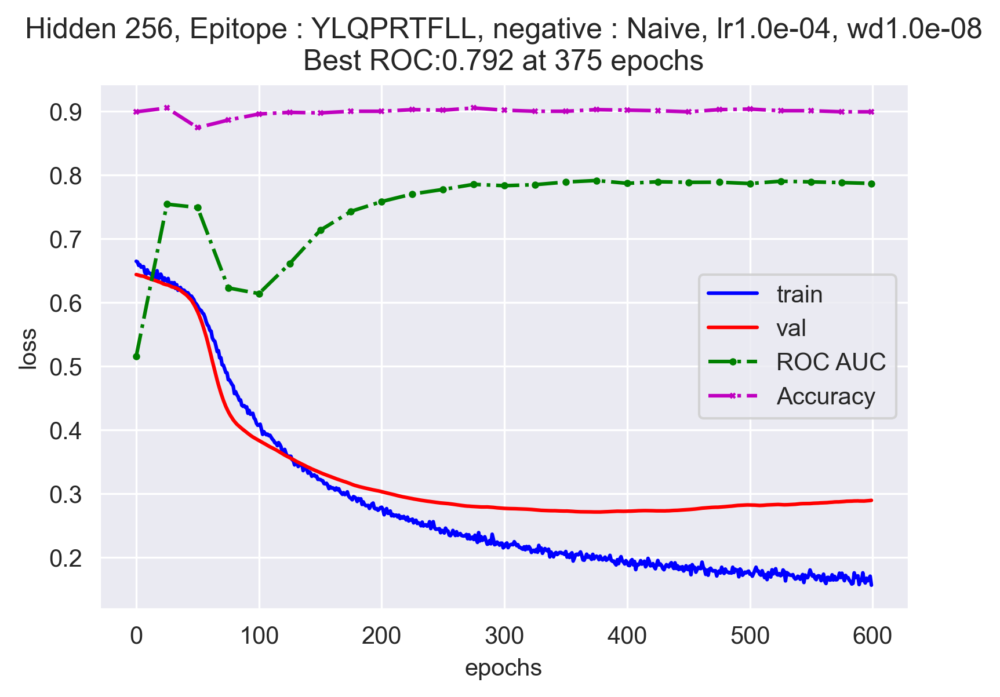

Hidden 512, Epitope : YLQPRTFLL, negative : Naive, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.371e-01	Val: 6.963e-01
		ROC AUC :0.731, 	accuracy: 0.899
Epoch:25;	Train: 2.161e-01	Val: 2.923e-01
		ROC AUC :0.821, 	accuracy: 0.890
Epoch:50;	Train: 1.797e-01	Val: 2.791e-01
		ROC AUC :0.839, 	accuracy: 0.903
Epoch:75;	Train: 1.490e-01	Val: 2.782e-01
		ROC AUC :0.842, 	accuracy: 0.907
Epoch:100;	Train: 1.337e-01	Val: 3.018e-01
		ROC AUC :0.832, 	accuracy: 0.901
Epoch:125;	Train: 1.238e-01	Val: 3.181e-01
		ROC AUC :0.828, 	accuracy: 0.900
Epoch:150;	Train: 1.004e-01	Val: 3.313e-01
		ROC AUC :0.814, 	accuracy: 0.904
Epoch:175;	Train: 8.673e-02	Val: 3.589e-01
		ROC AUC :0.813, 	accuracy: 0.899
Epoch:200;	Train: 7.042e-02	Val: 3.988e-01
		ROC AUC :0.794, 	accuracy: 0.901
Epoch:225;	Train: 5.732e-02	Val: 4.372e-01
		ROC AUC :0.813, 	accuracy: 0.892
Epoch:250;	Train: 4.630e-02	Val: 4.555e-01
		ROC AUC :0.771, 	accuracy: 0.897
Epoch:275;	Train: 3.252e-02	Val: 5.086e-01
		ROC AUC :0.757, 	accuracy: 0.900
Epoch:300;	Train: 2.881e-02	Val: 5.481e-01
		ROC AUC :0.763, 	accurac

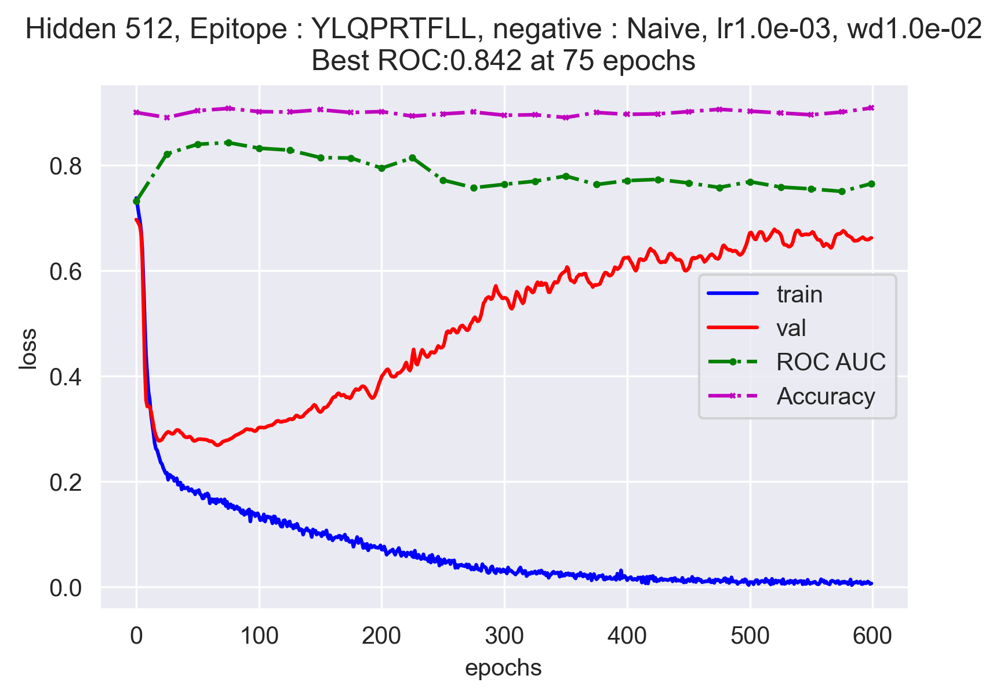

Hidden 512, Epitope : YLQPRTFLL, negative : Naive, lr1.0e-04, wd1.0e-08
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 5.978e-01	Val: 5.864e-01
		ROC AUC :0.609, 	accuracy: 0.899
Epoch:25;	Train: 5.588e-01	Val: 5.709e-01
		ROC AUC :0.756, 	accuracy: 0.899
Epoch:50;	Train: 4.247e-01	Val: 3.689e-01
		ROC AUC :0.665, 	accuracy: 0.899
Epoch:75;	Train: 3.218e-01	Val: 3.302e-01
		ROC AUC :0.680, 	accuracy: 0.899
Epoch:100;	Train: 2.727e-01	Val: 3.009e-01
		ROC AUC :0.743, 	accuracy: 0.899
Epoch:125;	Train: 2.525e-01	Val: 2.764e-01
		ROC AUC :0.788, 	accuracy: 0.904
Epoch:150;	Train: 2.290e-01	Val: 2.701e-01
		ROC AUC :0.798, 	accuracy: 0.907
Epoch:175;	Train: 2.191e-01	Val: 2.656e-01
		ROC AUC :0.807, 	accuracy: 0.906
Epoch:200;	Train: 2.050e-01	Val: 2.616e-01
		ROC AUC :0.813, 	accuracy: 0.907
Epoch:225;	Train: 1.935e-01	Val: 2.607e-01
		ROC AUC :0.818, 	accuracy: 0.909
Epoch:250;	Train: 2.018e-01	Val: 2.607e-01
		ROC AUC :0.819, 	accuracy: 0.910
Epoch:275;	Train: 1.931e-01	Val: 2.616e-01
		ROC AUC :0.820, 	accuracy: 0.911
Epoch:300;	Train: 1.878e-01	Val: 2.618e-01
		ROC AUC :0.821, 	accurac

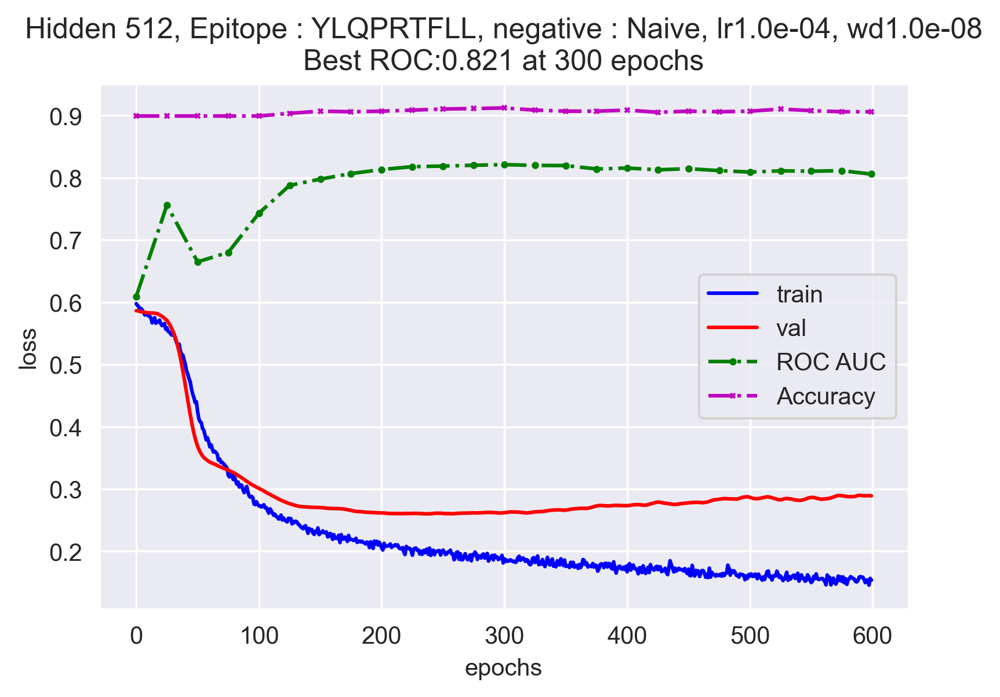

<Figure size 1800x1200 with 0 Axes>

In [106]:
import random

torch.manual_seed(20)
random.seed(20)
#Gridsearch
for epi in epitopes.epitope.unique():
    for negative_df, nm in zip([neg_emerson, neg_naive], ['Emerson', 'Naive']):
        _, X_train, X_val, y_train, y_val = get_data_pipeline(epitopes, negative_df, epi)
        for hidden in ([256, 512]):
            for lr, wd, nb_epochs in zip([1e-3, 1e-4], [1e-2, 1e-8], [600, 1000]):
                mlp = MLP_binary(3, hidden, p_drop = 0.4) 

                if epi.startswith('Y'): 
                    batch_size = 2**12
                else:
                        batch_size = 2**15
                title = f'Hidden {hidden}, Epitope : {epi}, negative : {nm}, lr{lr:.1e}, wd{wd:.1e}'
                print(title)
                losses, best = train_clf(mlp, data = (X_train, X_val, X_val, y_train, y_val, y_val),
                                         loss_fct = nn.BCEWithLogitsLoss, 
                                         optimizer_module = torch.optim.AdamW,
                                         lr = lr, wd = wd, 
                                         nb_epochs = nb_epochs, batch_size = batch_size)
                title = title+f'\nBest ROC: {best["roc"][1]:.3f} at {best["roc"][0]} epochs'
                plt.title(title)
                plt.show()
                fn = title.replace(', ', '_').replace(': ','_').replace(',','_').replace('\n','_').replace(' ','_')
                plt.savefig(f'../output/epitopes_classification/{fn.split('Best_ROC')[0]}.jpg', dpi = 200)
        

### 2nd MLP gridsearch for positive tcrex 

0it [00:00, ?it/s]

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.15%
Percent of positive class in val:   8.96%


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 2, Hidden 128, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.420e-01	Val: 6.001e-01
		ROC AUC :0.611, 	accuracy: 0.910
Epoch:25;	Train: 4.228e-01	Val: 3.746e-01
		ROC AUC :0.630, 	accuracy: 0.910
Epoch:50;	Train: 3.042e-01	Val: 2.926e-01
		ROC AUC :0.689, 	accuracy: 0.910
Epoch:75;	Train: 2.811e-01	Val: 2.635e-01
		ROC AUC :0.691, 	accuracy: 0.915
Epoch:100;	Train: 2.725e-01	Val: 2.592e-01
		ROC AUC :0.700, 	accuracy: 0.916
Epoch:125;	Train: 2.646e-01	Val: 2.555e-01
		ROC AUC :0.728, 	accuracy: 0.917
Epoch:150;	Train: 2.562e-01	Val: 2.509e-01
		ROC AUC :0.752, 	accuracy: 0.919
Epoch:175;	Train: 2.502e-01	Val: 2.494e-01
		ROC AUC :0.757, 	accuracy: 0.918
Epoch:200;	Train: 2.409e-01	Val: 2.469e-01
		ROC AUC :0.758, 	accuracy: 0.919
Epoch:225;	Train: 2.352e-01	Val: 2.455e-01
		ROC AUC :0.760, 	accuracy: 0.919
Epoch:250;	Train: 2.281e-01	Val: 2.460e-01
		ROC AUC :0.762, 	accuracy: 0.921
Epoch:275;	Train: 2.230e-01	Val: 2.485e-01
		ROC AUC :0.767, 	accuracy: 0.920
Epoch:300;	Train: 2.180e-01	Val: 2.498e-01
		ROC AUC :0.767, 	accurac

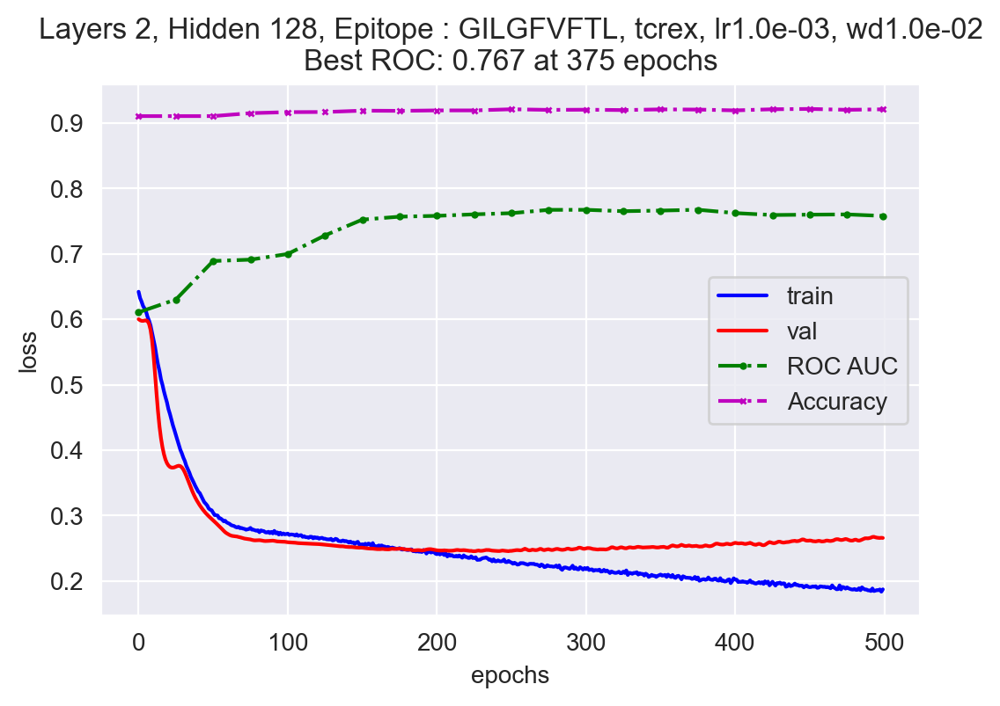

Layers 2, Hidden 128, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.487e-01	Val: 7.525e-01
		ROC AUC :0.578, 	accuracy: 0.910
Epoch:25;	Train: 5.987e-01	Val: 5.287e-01
		ROC AUC :0.635, 	accuracy: 0.910
Epoch:50;	Train: 5.045e-01	Val: 4.964e-01
		ROC AUC :0.676, 	accuracy: 0.910
Epoch:75;	Train: 4.129e-01	Val: 3.942e-01
		ROC AUC :0.693, 	accuracy: 0.910
Epoch:100;	Train: 3.378e-01	Val: 3.148e-01
		ROC AUC :0.701, 	accuracy: 0.911
Epoch:125;	Train: 2.976e-01	Val: 2.762e-01
		ROC AUC :0.710, 	accuracy: 0.913
Epoch:150;	Train: 2.807e-01	Val: 2.630e-01
		ROC AUC :0.717, 	accuracy: 0.916
Epoch:175;	Train: 2.714e-01	Val: 2.562e-01
		ROC AUC :0.741, 	accuracy: 0.917
Epoch:200;	Train: 2.670e-01	Val: 2.515e-01
		ROC AUC :0.758, 	accuracy: 0.918
Epoch:225;	Train: 2.618e-01	Val: 2.501e-01
		ROC AUC :0.756, 	accuracy: 0.918
Epoch:250;	Train: 2.590e-01	Val: 2.486e-01
		ROC AUC :0.760, 	accuracy: 0.918
Epoch:275;	Train: 2.553e-01	Val: 2.468e-01
		ROC AUC :0.760, 	accuracy: 0.918
Epoch:300;	Train: 2.500e-01	Val: 2.457e-01
		ROC AUC :0.760, 	accurac

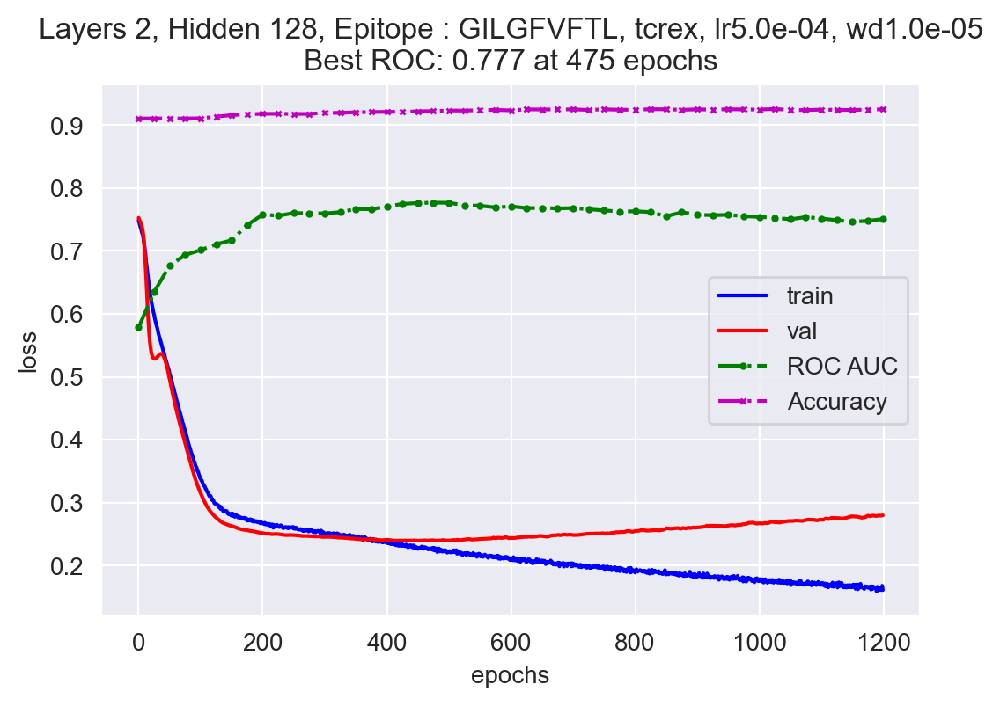

Layers 2, Hidden 256, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.647e-01	Val: 6.276e-01
		ROC AUC :0.647, 	accuracy: 0.910
Epoch:25;	Train: 3.615e-01	Val: 3.608e-01
		ROC AUC :0.660, 	accuracy: 0.910
Epoch:50;	Train: 2.752e-01	Val: 2.681e-01
		ROC AUC :0.684, 	accuracy: 0.915
Epoch:75;	Train: 2.662e-01	Val: 2.628e-01
		ROC AUC :0.697, 	accuracy: 0.920
Epoch:100;	Train: 2.604e-01	Val: 2.583e-01
		ROC AUC :0.715, 	accuracy: 0.919
Epoch:125;	Train: 2.546e-01	Val: 2.546e-01
		ROC AUC :0.740, 	accuracy: 0.919
Epoch:150;	Train: 2.445e-01	Val: 2.493e-01
		ROC AUC :0.758, 	accuracy: 0.919
Epoch:175;	Train: 2.367e-01	Val: 2.493e-01
		ROC AUC :0.760, 	accuracy: 0.919
Epoch:200;	Train: 2.307e-01	Val: 2.464e-01
		ROC AUC :0.766, 	accuracy: 0.920
Epoch:225;	Train: 2.226e-01	Val: 2.455e-01
		ROC AUC :0.771, 	accuracy: 0.921
Epoch:250;	Train: 2.162e-01	Val: 2.500e-01
		ROC AUC :0.773, 	accuracy: 0.920
Epoch:275;	Train: 2.128e-01	Val: 2.491e-01
		ROC AUC :0.769, 	accuracy: 0.921
Epoch:300;	Train: 2.039e-01	Val: 2.525e-01
		ROC AUC :0.761, 	accurac

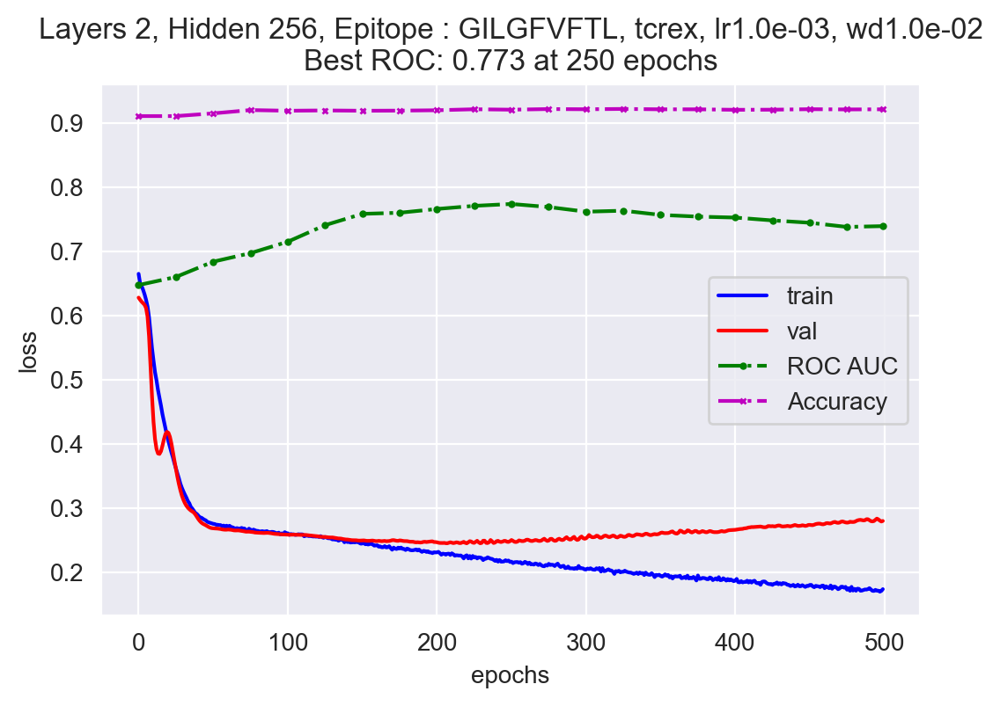

Layers 2, Hidden 256, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.263e-01	Val: 6.991e-01
		ROC AUC :0.604, 	accuracy: 0.910
Epoch:25;	Train: 5.127e-01	Val: 4.141e-01
		ROC AUC :0.615, 	accuracy: 0.910
Epoch:50;	Train: 3.684e-01	Val: 3.488e-01
		ROC AUC :0.681, 	accuracy: 0.911
Epoch:75;	Train: 3.034e-01	Val: 2.893e-01
		ROC AUC :0.692, 	accuracy: 0.911
Epoch:100;	Train: 2.816e-01	Val: 2.669e-01
		ROC AUC :0.704, 	accuracy: 0.914
Epoch:125;	Train: 2.707e-01	Val: 2.619e-01
		ROC AUC :0.704, 	accuracy: 0.915
Epoch:150;	Train: 2.663e-01	Val: 2.604e-01
		ROC AUC :0.708, 	accuracy: 0.916
Epoch:175;	Train: 2.621e-01	Val: 2.593e-01
		ROC AUC :0.715, 	accuracy: 0.917
Epoch:200;	Train: 2.603e-01	Val: 2.589e-01
		ROC AUC :0.722, 	accuracy: 0.917
Epoch:225;	Train: 2.544e-01	Val: 2.549e-01
		ROC AUC :0.742, 	accuracy: 0.917
Epoch:250;	Train: 2.489e-01	Val: 2.526e-01
		ROC AUC :0.751, 	accuracy: 0.917
Epoch:275;	Train: 2.449e-01	Val: 2.519e-01
		ROC AUC :0.752, 	accuracy: 0.917
Epoch:300;	Train: 2.413e-01	Val: 2.509e-01
		ROC AUC :0.753, 	accurac

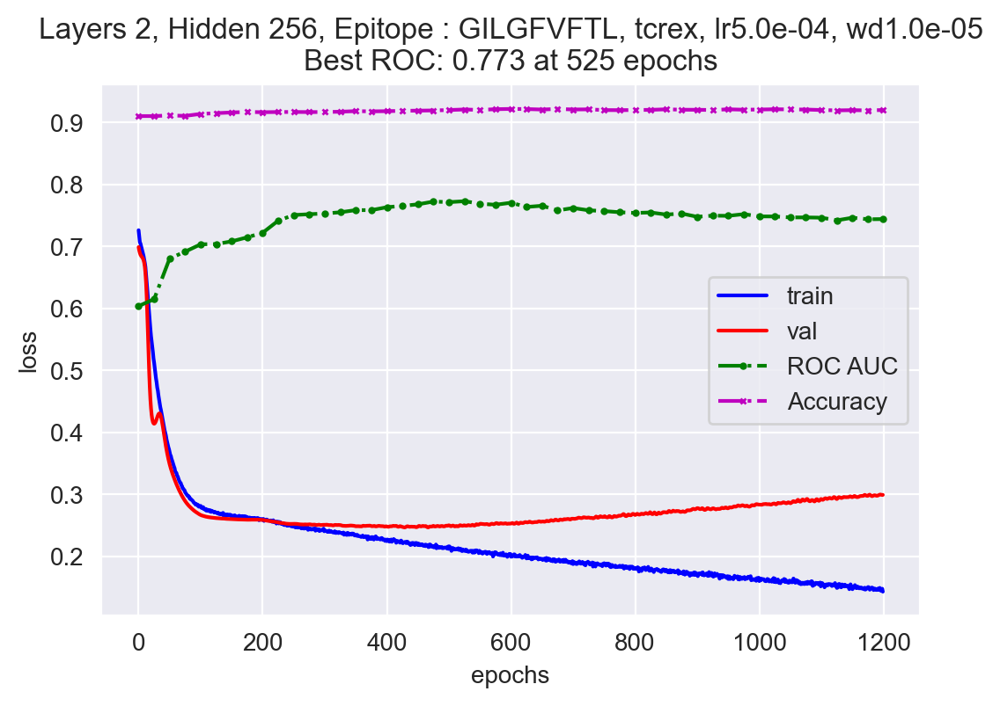

Layers 2, Hidden 512, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.341e-01	Val: 7.125e-01
		ROC AUC :0.644, 	accuracy: 0.910
Epoch:25;	Train: 2.922e-01	Val: 2.921e-01
		ROC AUC :0.669, 	accuracy: 0.910
Epoch:50;	Train: 2.700e-01	Val: 2.696e-01
		ROC AUC :0.711, 	accuracy: 0.917
Epoch:75;	Train: 2.611e-01	Val: 2.594e-01
		ROC AUC :0.724, 	accuracy: 0.918
Epoch:100;	Train: 2.551e-01	Val: 2.560e-01
		ROC AUC :0.735, 	accuracy: 0.917
Epoch:125;	Train: 2.480e-01	Val: 2.504e-01
		ROC AUC :0.750, 	accuracy: 0.918
Epoch:150;	Train: 2.410e-01	Val: 2.474e-01
		ROC AUC :0.757, 	accuracy: 0.920
Epoch:175;	Train: 2.352e-01	Val: 2.464e-01
		ROC AUC :0.758, 	accuracy: 0.920
Epoch:200;	Train: 2.302e-01	Val: 2.452e-01
		ROC AUC :0.761, 	accuracy: 0.922
Epoch:225;	Train: 2.230e-01	Val: 2.464e-01
		ROC AUC :0.760, 	accuracy: 0.921
Epoch:250;	Train: 2.170e-01	Val: 2.480e-01
		ROC AUC :0.769, 	accuracy: 0.920
Epoch:275;	Train: 2.113e-01	Val: 2.493e-01
		ROC AUC :0.770, 	accuracy: 0.920
Epoch:300;	Train: 2.075e-01	Val: 2.524e-01
		ROC AUC :0.773, 	accurac

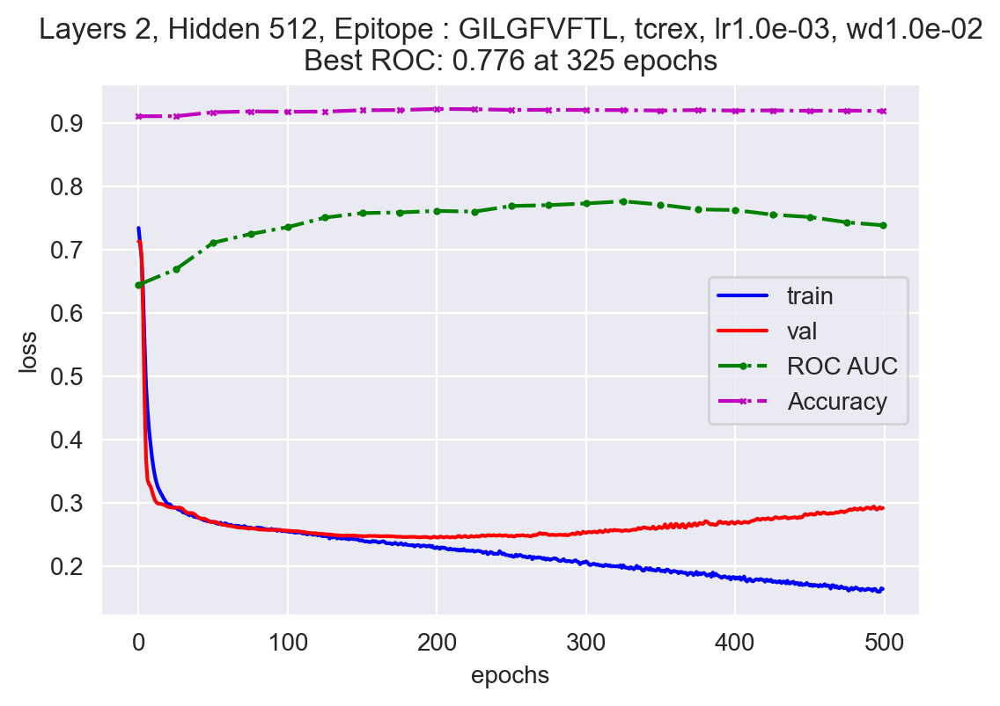

Layers 2, Hidden 512, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.261e-01	Val: 6.947e-01
		ROC AUC :0.635, 	accuracy: 0.910
Epoch:25;	Train: 3.063e-01	Val: 2.984e-01
		ROC AUC :0.586, 	accuracy: 0.910
Epoch:50;	Train: 2.826e-01	Val: 2.769e-01
		ROC AUC :0.688, 	accuracy: 0.911
Epoch:75;	Train: 2.702e-01	Val: 2.651e-01
		ROC AUC :0.700, 	accuracy: 0.915
Epoch:100;	Train: 2.623e-01	Val: 2.609e-01
		ROC AUC :0.706, 	accuracy: 0.917
Epoch:125;	Train: 2.608e-01	Val: 2.578e-01
		ROC AUC :0.720, 	accuracy: 0.918
Epoch:150;	Train: 2.550e-01	Val: 2.563e-01
		ROC AUC :0.732, 	accuracy: 0.918
Epoch:175;	Train: 2.484e-01	Val: 2.536e-01
		ROC AUC :0.747, 	accuracy: 0.918
Epoch:200;	Train: 2.446e-01	Val: 2.526e-01
		ROC AUC :0.756, 	accuracy: 0.918
Epoch:225;	Train: 2.396e-01	Val: 2.487e-01
		ROC AUC :0.761, 	accuracy: 0.918
Epoch:250;	Train: 2.379e-01	Val: 2.469e-01
		ROC AUC :0.766, 	accuracy: 0.919
Epoch:275;	Train: 2.332e-01	Val: 2.450e-01
		ROC AUC :0.767, 	accuracy: 0.921
Epoch:300;	Train: 2.304e-01	Val: 2.458e-01
		ROC AUC :0.766, 	accurac

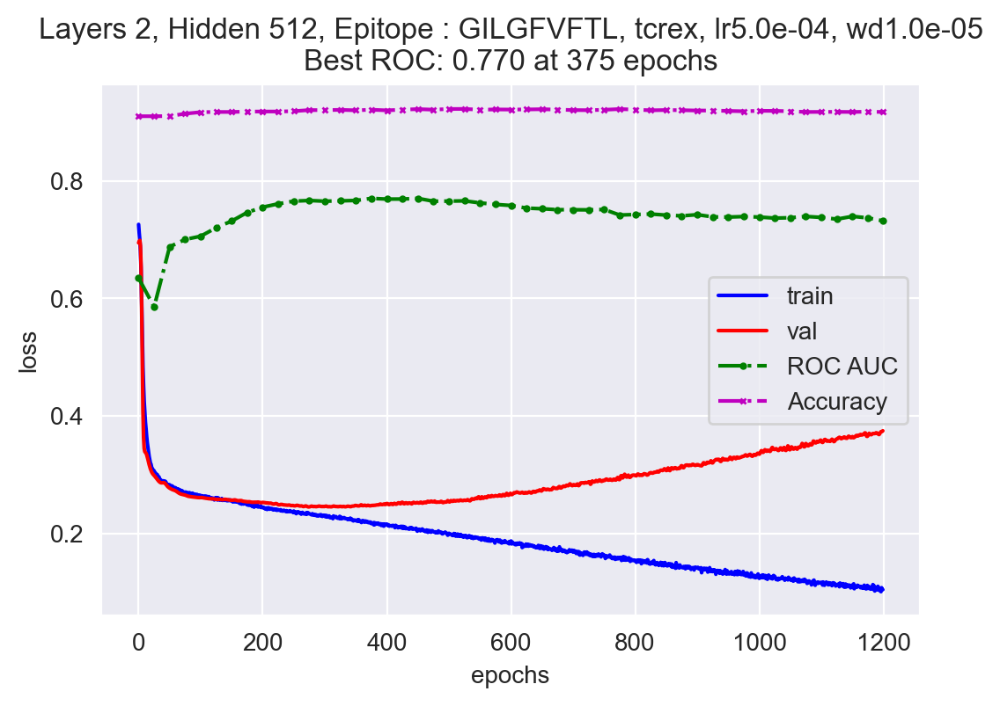

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 3, Hidden 128, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.285e-01	Val: 7.031e-01
		ROC AUC :0.592, 	accuracy: 0.910
Epoch:25;	Train: 4.774e-01	Val: 4.565e-01
		ROC AUC :0.606, 	accuracy: 0.910
Epoch:50;	Train: 3.363e-01	Val: 3.160e-01
		ROC AUC :0.673, 	accuracy: 0.910
Epoch:75;	Train: 2.803e-01	Val: 2.654e-01
		ROC AUC :0.696, 	accuracy: 0.916
Epoch:100;	Train: 2.707e-01	Val: 2.598e-01
		ROC AUC :0.712, 	accuracy: 0.918
Epoch:125;	Train: 2.630e-01	Val: 2.587e-01
		ROC AUC :0.718, 	accuracy: 0.919
Epoch:150;	Train: 2.594e-01	Val: 2.587e-01
		ROC AUC :0.731, 	accuracy: 0.919
Epoch:175;	Train: 2.508e-01	Val: 2.553e-01
		ROC AUC :0.742, 	accuracy: 0.919
Epoch:200;	Train: 2.433e-01	Val: 2.523e-01
		ROC AUC :0.755, 	accuracy: 0.920
Epoch:225;	Train: 2.352e-01	Val: 2.502e-01
		ROC AUC :0.754, 	accuracy: 0.920
Epoch:250;	Train: 2.313e-01	Val: 2.467e-01
		ROC AUC :0.759, 	accuracy: 0.921
Epoch:275;	Train: 2.269e-01	Val: 2.442e-01
		ROC AUC :0.758, 	accuracy: 0.922
Epoch:300;	Train: 2.217e-01	Val: 2.484e-01
		ROC AUC :0.757, 	accurac

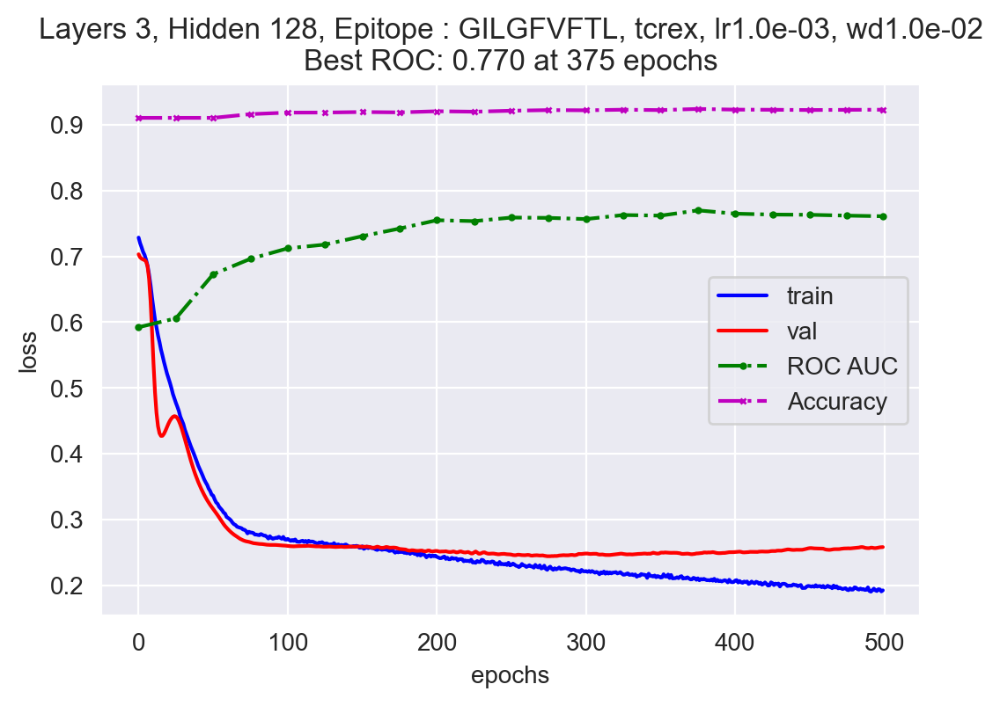

Layers 3, Hidden 128, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.372e-01	Val: 5.918e-01
		ROC AUC :0.579, 	accuracy: 0.910
Epoch:25;	Train: 4.580e-01	Val: 3.544e-01
		ROC AUC :0.550, 	accuracy: 0.910
Epoch:50;	Train: 3.400e-01	Val: 3.114e-01
		ROC AUC :0.648, 	accuracy: 0.910
Epoch:75;	Train: 2.922e-01	Val: 2.754e-01
		ROC AUC :0.688, 	accuracy: 0.912
Epoch:100;	Train: 2.774e-01	Val: 2.649e-01
		ROC AUC :0.699, 	accuracy: 0.915
Epoch:125;	Train: 2.705e-01	Val: 2.622e-01
		ROC AUC :0.706, 	accuracy: 0.917
Epoch:150;	Train: 2.713e-01	Val: 2.600e-01
		ROC AUC :0.712, 	accuracy: 0.918
Epoch:175;	Train: 2.663e-01	Val: 2.582e-01
		ROC AUC :0.725, 	accuracy: 0.919
Epoch:200;	Train: 2.635e-01	Val: 2.556e-01
		ROC AUC :0.742, 	accuracy: 0.918
Epoch:225;	Train: 2.546e-01	Val: 2.533e-01
		ROC AUC :0.752, 	accuracy: 0.920
Epoch:250;	Train: 2.515e-01	Val: 2.520e-01
		ROC AUC :0.755, 	accuracy: 0.919
Epoch:275;	Train: 2.489e-01	Val: 2.509e-01
		ROC AUC :0.756, 	accuracy: 0.920
Epoch:300;	Train: 2.454e-01	Val: 2.505e-01
		ROC AUC :0.755, 	accurac

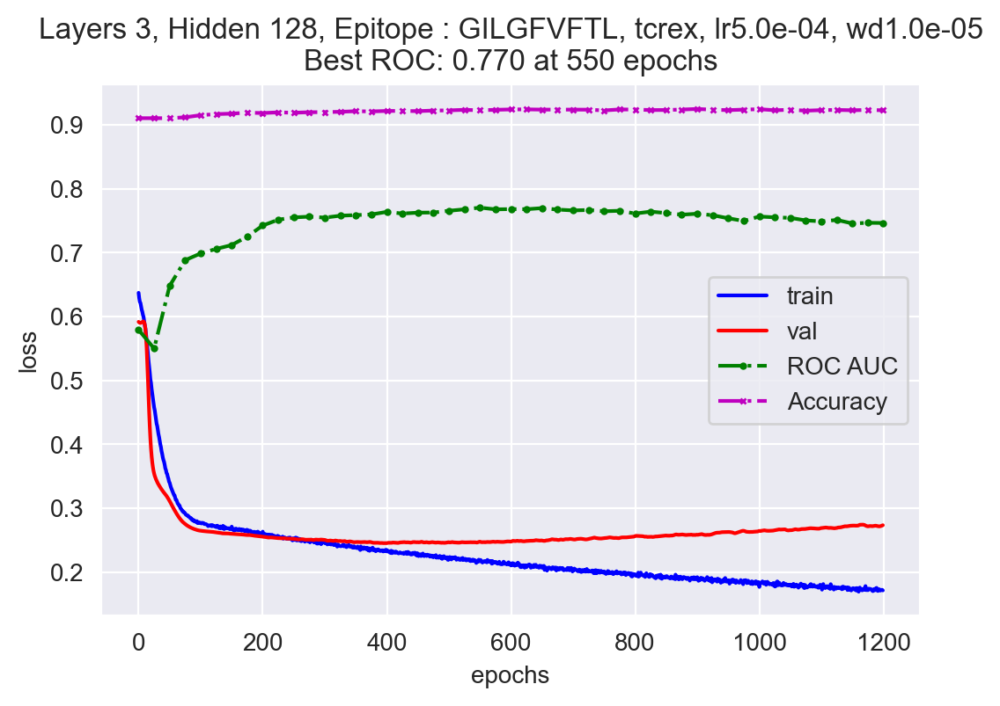

Layers 3, Hidden 256, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.789e-01	Val: 7.696e-01
		ROC AUC :0.642, 	accuracy: 0.910
Epoch:25;	Train: 3.721e-01	Val: 3.459e-01
		ROC AUC :0.554, 	accuracy: 0.910
Epoch:50;	Train: 2.973e-01	Val: 2.877e-01
		ROC AUC :0.673, 	accuracy: 0.910
Epoch:75;	Train: 2.747e-01	Val: 2.650e-01
		ROC AUC :0.686, 	accuracy: 0.917
Epoch:100;	Train: 2.645e-01	Val: 2.618e-01
		ROC AUC :0.708, 	accuracy: 0.919
Epoch:125;	Train: 2.601e-01	Val: 2.597e-01
		ROC AUC :0.715, 	accuracy: 0.918
Epoch:150;	Train: 2.553e-01	Val: 2.571e-01
		ROC AUC :0.723, 	accuracy: 0.919
Epoch:175;	Train: 2.508e-01	Val: 2.556e-01
		ROC AUC :0.733, 	accuracy: 0.920
Epoch:200;	Train: 2.432e-01	Val: 2.510e-01
		ROC AUC :0.749, 	accuracy: 0.920
Epoch:225;	Train: 2.369e-01	Val: 2.472e-01
		ROC AUC :0.759, 	accuracy: 0.920
Epoch:250;	Train: 2.316e-01	Val: 2.459e-01
		ROC AUC :0.758, 	accuracy: 0.920
Epoch:275;	Train: 2.246e-01	Val: 2.482e-01
		ROC AUC :0.760, 	accuracy: 0.921
Epoch:300;	Train: 2.185e-01	Val: 2.478e-01
		ROC AUC :0.763, 	accurac

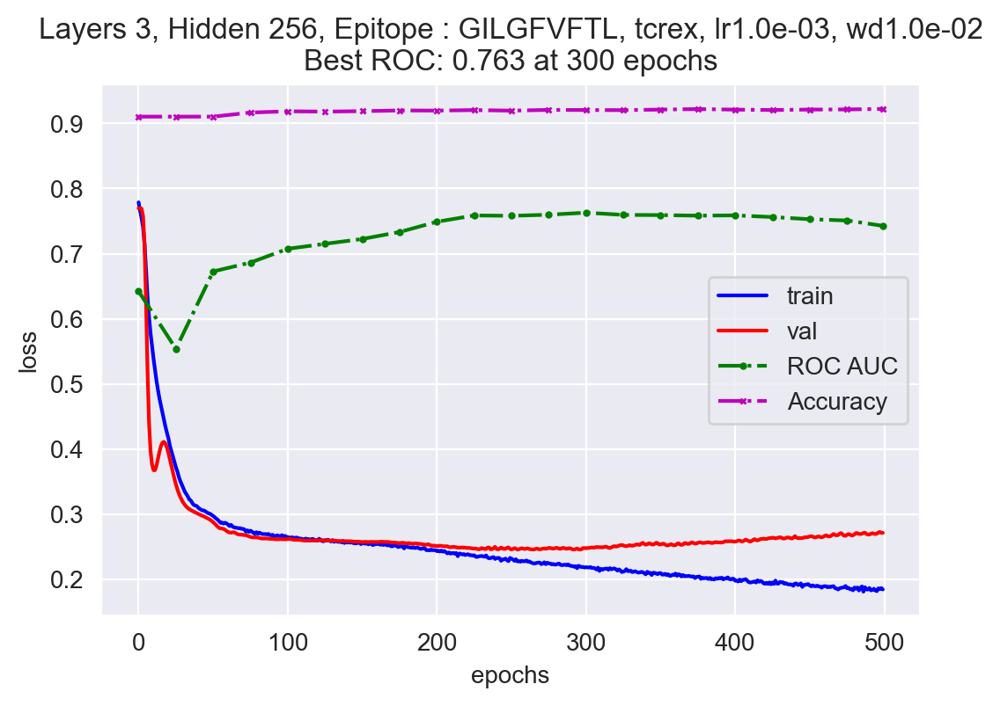

Layers 3, Hidden 256, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.840e-01	Val: 7.817e-01
		ROC AUC :0.612, 	accuracy: 0.910
Epoch:25;	Train: 3.927e-01	Val: 3.523e-01
		ROC AUC :0.562, 	accuracy: 0.910
Epoch:50;	Train: 3.116e-01	Val: 3.007e-01
		ROC AUC :0.571, 	accuracy: 0.910
Epoch:75;	Train: 2.898e-01	Val: 2.801e-01
		ROC AUC :0.684, 	accuracy: 0.911
Epoch:100;	Train: 2.739e-01	Val: 2.654e-01
		ROC AUC :0.702, 	accuracy: 0.914
Epoch:125;	Train: 2.688e-01	Val: 2.621e-01
		ROC AUC :0.701, 	accuracy: 0.917
Epoch:150;	Train: 2.661e-01	Val: 2.612e-01
		ROC AUC :0.696, 	accuracy: 0.917
Epoch:175;	Train: 2.629e-01	Val: 2.604e-01
		ROC AUC :0.700, 	accuracy: 0.917
Epoch:200;	Train: 2.583e-01	Val: 2.594e-01
		ROC AUC :0.704, 	accuracy: 0.918
Epoch:225;	Train: 2.600e-01	Val: 2.585e-01
		ROC AUC :0.714, 	accuracy: 0.919
Epoch:250;	Train: 2.540e-01	Val: 2.548e-01
		ROC AUC :0.735, 	accuracy: 0.919
Epoch:275;	Train: 2.461e-01	Val: 2.516e-01
		ROC AUC :0.749, 	accuracy: 0.919
Epoch:300;	Train: 2.435e-01	Val: 2.494e-01
		ROC AUC :0.756, 	accurac

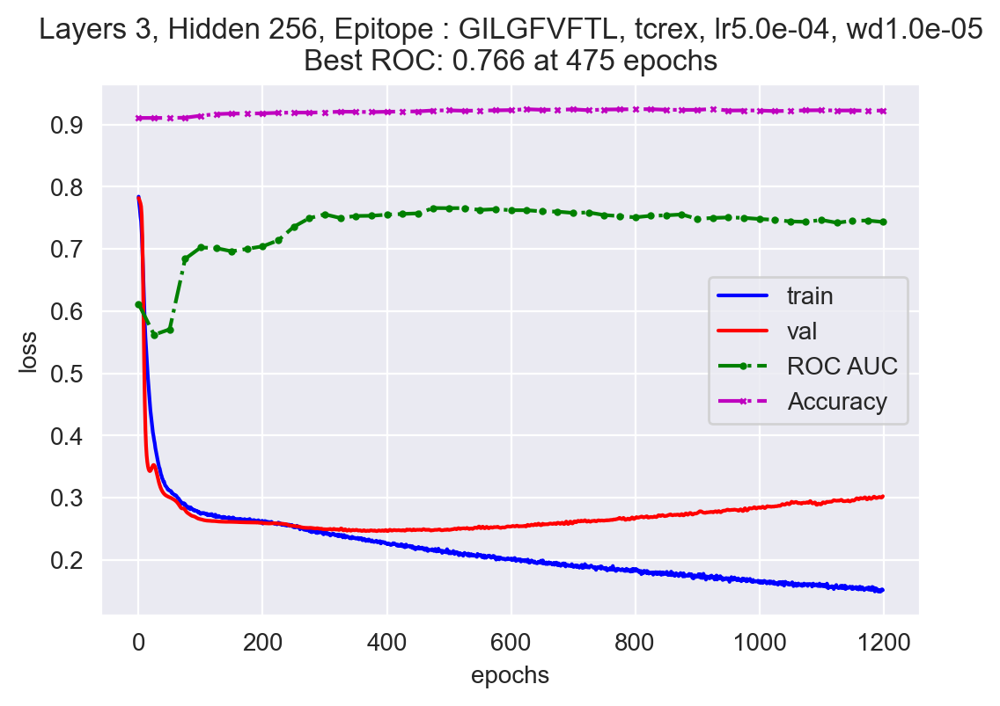

Layers 3, Hidden 512, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 8.349e-01	Val: 7.905e-01
		ROC AUC :0.622, 	accuracy: 0.910
Epoch:25;	Train: 2.947e-01	Val: 2.912e-01
		ROC AUC :0.673, 	accuracy: 0.910
Epoch:50;	Train: 2.710e-01	Val: 2.709e-01
		ROC AUC :0.700, 	accuracy: 0.916
Epoch:75;	Train: 2.652e-01	Val: 2.622e-01
		ROC AUC :0.710, 	accuracy: 0.918
Epoch:100;	Train: 2.571e-01	Val: 2.597e-01
		ROC AUC :0.725, 	accuracy: 0.917
Epoch:125;	Train: 2.510e-01	Val: 2.558e-01
		ROC AUC :0.744, 	accuracy: 0.917
Epoch:150;	Train: 2.422e-01	Val: 2.502e-01
		ROC AUC :0.758, 	accuracy: 0.918
Epoch:175;	Train: 2.347e-01	Val: 2.484e-01
		ROC AUC :0.761, 	accuracy: 0.918
Epoch:200;	Train: 2.276e-01	Val: 2.465e-01
		ROC AUC :0.764, 	accuracy: 0.919
Epoch:225;	Train: 2.225e-01	Val: 2.471e-01
		ROC AUC :0.759, 	accuracy: 0.921
Epoch:250;	Train: 2.181e-01	Val: 2.498e-01
		ROC AUC :0.758, 	accuracy: 0.921
Epoch:275;	Train: 2.149e-01	Val: 2.516e-01
		ROC AUC :0.755, 	accuracy: 0.922
Epoch:300;	Train: 2.076e-01	Val: 2.589e-01
		ROC AUC :0.752, 	accurac

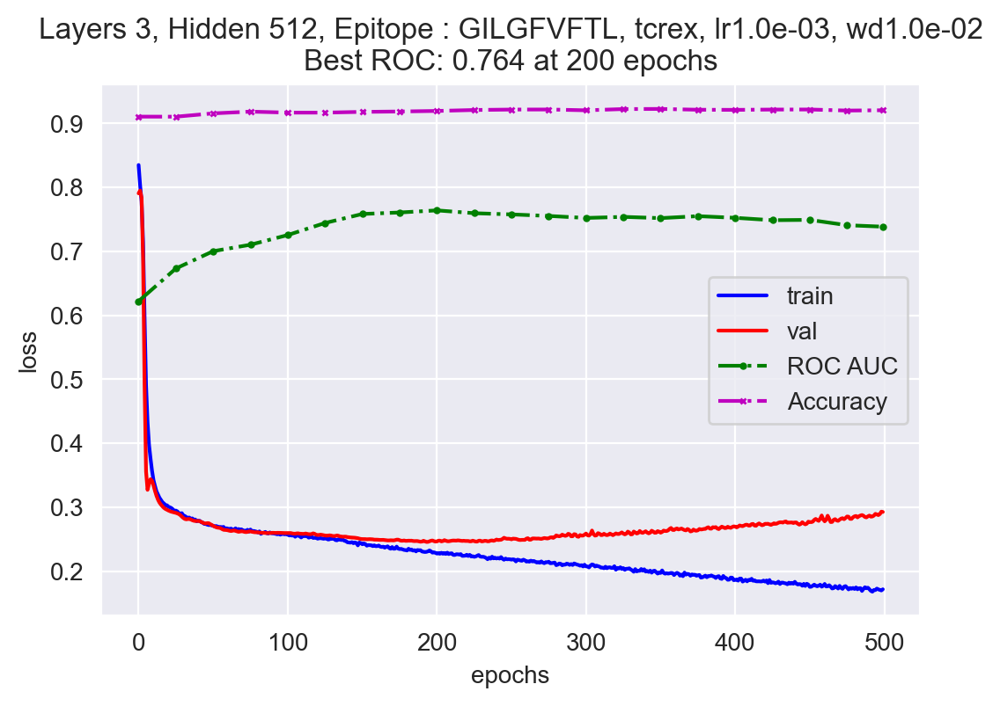

Layers 3, Hidden 512, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.460e-01	Val: 6.203e-01
		ROC AUC :0.660, 	accuracy: 0.910
Epoch:25;	Train: 3.076e-01	Val: 2.959e-01
		ROC AUC :0.643, 	accuracy: 0.910
Epoch:50;	Train: 2.785e-01	Val: 2.714e-01
		ROC AUC :0.690, 	accuracy: 0.913
Epoch:75;	Train: 2.676e-01	Val: 2.630e-01
		ROC AUC :0.700, 	accuracy: 0.917
Epoch:100;	Train: 2.638e-01	Val: 2.603e-01
		ROC AUC :0.708, 	accuracy: 0.918
Epoch:125;	Train: 2.598e-01	Val: 2.587e-01
		ROC AUC :0.711, 	accuracy: 0.919
Epoch:150;	Train: 2.575e-01	Val: 2.594e-01
		ROC AUC :0.711, 	accuracy: 0.919
Epoch:175;	Train: 2.548e-01	Val: 2.585e-01
		ROC AUC :0.713, 	accuracy: 0.919
Epoch:200;	Train: 2.501e-01	Val: 2.567e-01
		ROC AUC :0.725, 	accuracy: 0.919
Epoch:225;	Train: 2.446e-01	Val: 2.511e-01
		ROC AUC :0.753, 	accuracy: 0.920
Epoch:250;	Train: 2.377e-01	Val: 2.496e-01
		ROC AUC :0.764, 	accuracy: 0.919
Epoch:275;	Train: 2.317e-01	Val: 2.451e-01
		ROC AUC :0.774, 	accuracy: 0.920
Epoch:300;	Train: 2.281e-01	Val: 2.429e-01
		ROC AUC :0.773, 	accurac

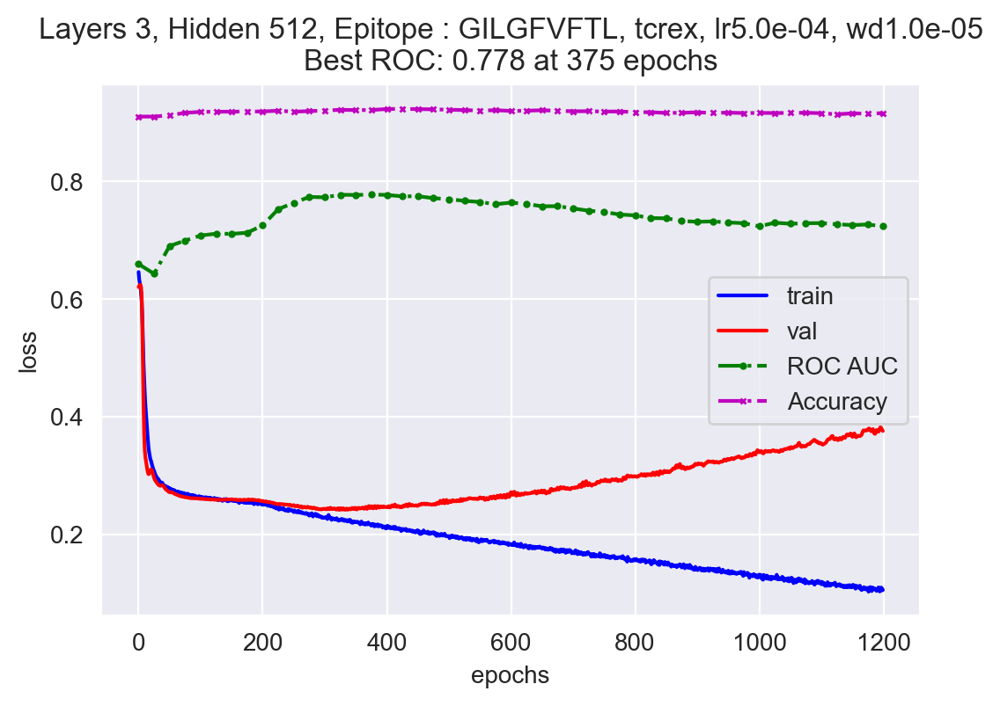

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 4, Hidden 128, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.094e-01	Val: 6.921e-01
		ROC AUC :0.608, 	accuracy: 0.910
Epoch:25;	Train: 4.278e-01	Val: 3.857e-01
		ROC AUC :0.584, 	accuracy: 0.910
Epoch:50;	Train: 3.131e-01	Val: 2.967e-01
		ROC AUC :0.669, 	accuracy: 0.910
Epoch:75;	Train: 2.785e-01	Val: 2.669e-01
		ROC AUC :0.705, 	accuracy: 0.916
Epoch:100;	Train: 2.698e-01	Val: 2.635e-01
		ROC AUC :0.705, 	accuracy: 0.917
Epoch:125;	Train: 2.681e-01	Val: 2.608e-01
		ROC AUC :0.716, 	accuracy: 0.918
Epoch:150;	Train: 2.596e-01	Val: 2.571e-01
		ROC AUC :0.736, 	accuracy: 0.918
Epoch:175;	Train: 2.509e-01	Val: 2.511e-01
		ROC AUC :0.749, 	accuracy: 0.917
Epoch:200;	Train: 2.461e-01	Val: 2.500e-01
		ROC AUC :0.755, 	accuracy: 0.918
Epoch:225;	Train: 2.400e-01	Val: 2.475e-01
		ROC AUC :0.758, 	accuracy: 0.919
Epoch:250;	Train: 2.385e-01	Val: 2.481e-01
		ROC AUC :0.753, 	accuracy: 0.920
Epoch:275;	Train: 2.317e-01	Val: 2.469e-01
		ROC AUC :0.756, 	accuracy: 0.922
Epoch:300;	Train: 2.282e-01	Val: 2.458e-01
		ROC AUC :0.758, 	accurac

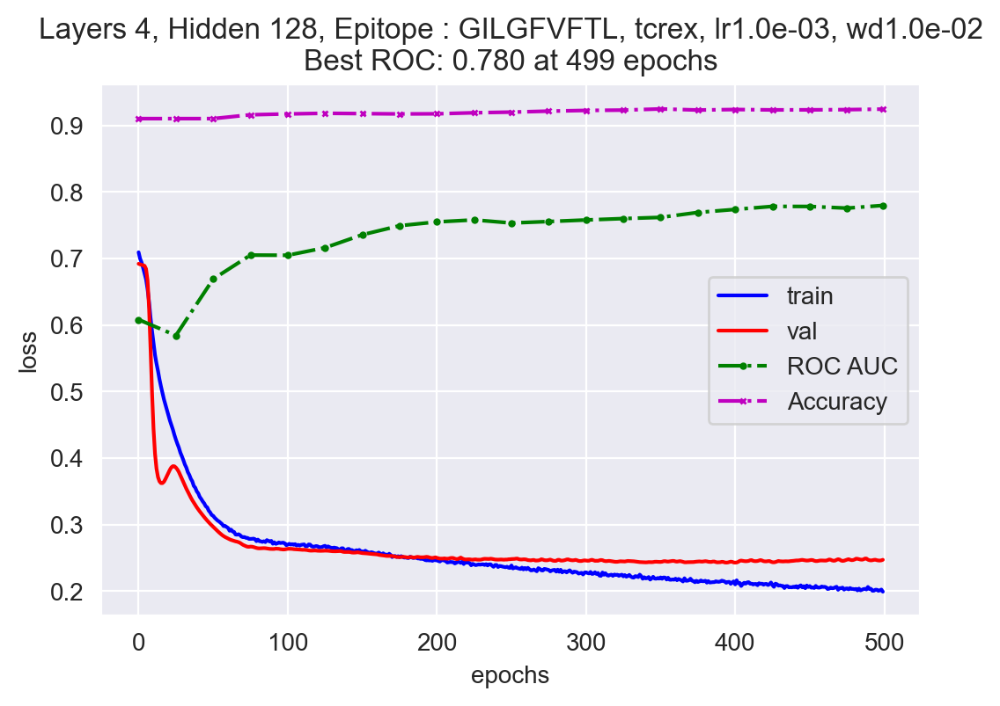

Layers 4, Hidden 128, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 8.240e-01	Val: 7.828e-01
		ROC AUC :0.593, 	accuracy: 0.910
Epoch:25;	Train: 5.726e-01	Val: 4.005e-01
		ROC AUC :0.553, 	accuracy: 0.910
Epoch:50;	Train: 4.133e-01	Val: 3.530e-01
		ROC AUC :0.608, 	accuracy: 0.910
Epoch:75;	Train: 3.275e-01	Val: 2.995e-01
		ROC AUC :0.678, 	accuracy: 0.910
Epoch:100;	Train: 2.974e-01	Val: 2.753e-01
		ROC AUC :0.684, 	accuracy: 0.911
Epoch:125;	Train: 2.822e-01	Val: 2.662e-01
		ROC AUC :0.685, 	accuracy: 0.912
Epoch:150;	Train: 2.751e-01	Val: 2.640e-01
		ROC AUC :0.688, 	accuracy: 0.915
Epoch:175;	Train: 2.730e-01	Val: 2.634e-01
		ROC AUC :0.691, 	accuracy: 0.917
Epoch:200;	Train: 2.685e-01	Val: 2.625e-01
		ROC AUC :0.692, 	accuracy: 0.918
Epoch:225;	Train: 2.683e-01	Val: 2.621e-01
		ROC AUC :0.697, 	accuracy: 0.919
Epoch:250;	Train: 2.634e-01	Val: 2.586e-01
		ROC AUC :0.715, 	accuracy: 0.920
Epoch:275;	Train: 2.574e-01	Val: 2.569e-01
		ROC AUC :0.735, 	accuracy: 0.920
Epoch:300;	Train: 2.561e-01	Val: 2.543e-01
		ROC AUC :0.745, 	accurac

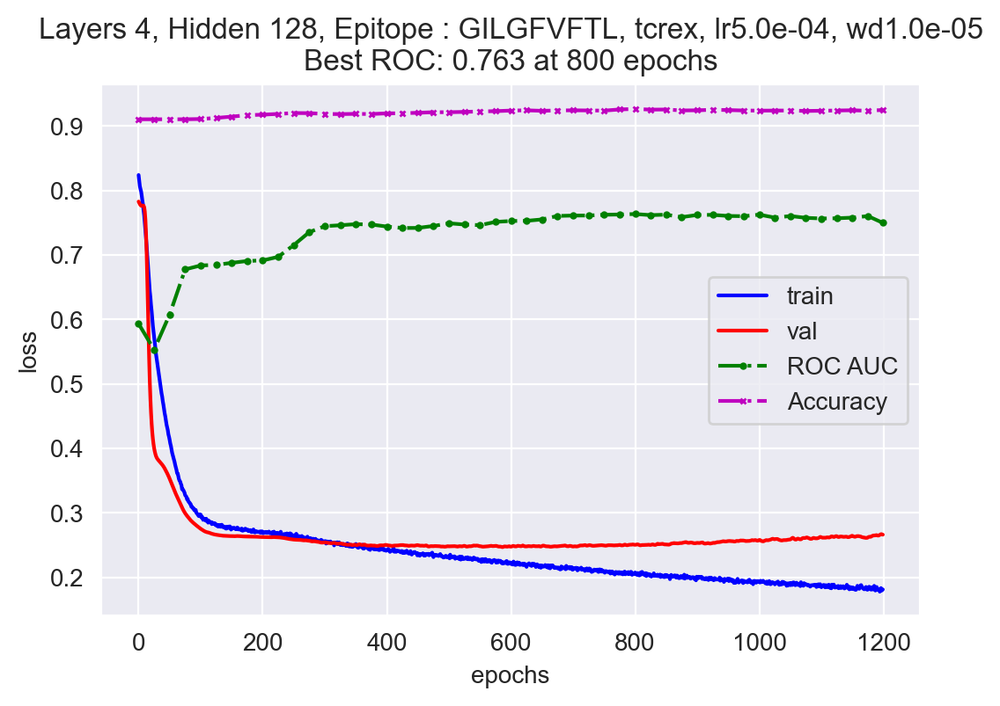

Layers 4, Hidden 256, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.201e-01	Val: 7.007e-01
		ROC AUC :0.622, 	accuracy: 0.910
Epoch:25;	Train: 3.290e-01	Val: 2.980e-01
		ROC AUC :0.622, 	accuracy: 0.910
Epoch:50;	Train: 2.773e-01	Val: 2.722e-01
		ROC AUC :0.691, 	accuracy: 0.917
Epoch:75;	Train: 2.666e-01	Val: 2.619e-01
		ROC AUC :0.683, 	accuracy: 0.920
Epoch:100;	Train: 2.620e-01	Val: 2.605e-01
		ROC AUC :0.690, 	accuracy: 0.920
Epoch:125;	Train: 2.592e-01	Val: 2.592e-01
		ROC AUC :0.699, 	accuracy: 0.920
Epoch:150;	Train: 2.535e-01	Val: 2.563e-01
		ROC AUC :0.712, 	accuracy: 0.920
Epoch:175;	Train: 2.437e-01	Val: 2.487e-01
		ROC AUC :0.748, 	accuracy: 0.921
Epoch:200;	Train: 2.381e-01	Val: 2.491e-01
		ROC AUC :0.752, 	accuracy: 0.918
Epoch:225;	Train: 2.291e-01	Val: 2.454e-01
		ROC AUC :0.748, 	accuracy: 0.921
Epoch:250;	Train: 2.236e-01	Val: 2.470e-01
		ROC AUC :0.751, 	accuracy: 0.920
Epoch:275;	Train: 2.181e-01	Val: 2.467e-01
		ROC AUC :0.756, 	accuracy: 0.922
Epoch:300;	Train: 2.142e-01	Val: 2.490e-01
		ROC AUC :0.757, 	accurac

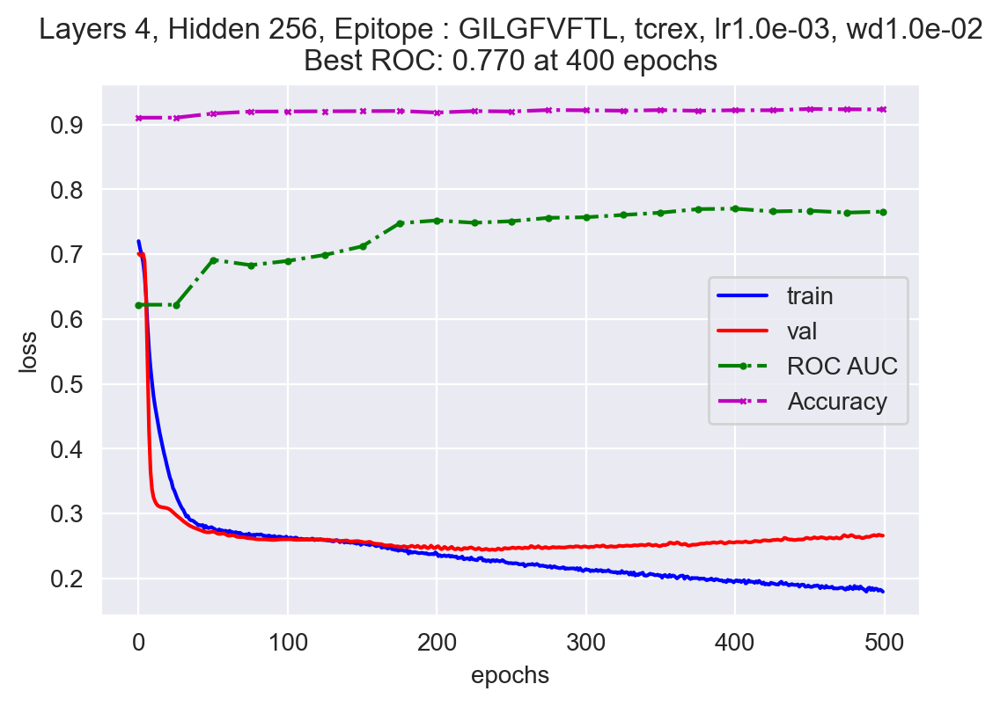

Layers 4, Hidden 256, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.281e-01	Val: 5.819e-01
		ROC AUC :0.610, 	accuracy: 0.910
Epoch:25;	Train: 3.907e-01	Val: 3.195e-01
		ROC AUC :0.600, 	accuracy: 0.910
Epoch:50;	Train: 2.944e-01	Val: 2.842e-01
		ROC AUC :0.675, 	accuracy: 0.910
Epoch:75;	Train: 2.757e-01	Val: 2.676e-01
		ROC AUC :0.687, 	accuracy: 0.913
Epoch:100;	Train: 2.677e-01	Val: 2.642e-01
		ROC AUC :0.689, 	accuracy: 0.917
Epoch:125;	Train: 2.636e-01	Val: 2.629e-01
		ROC AUC :0.689, 	accuracy: 0.917
Epoch:150;	Train: 2.618e-01	Val: 2.607e-01
		ROC AUC :0.696, 	accuracy: 0.918
Epoch:175;	Train: 2.602e-01	Val: 2.604e-01
		ROC AUC :0.697, 	accuracy: 0.919
Epoch:200;	Train: 2.563e-01	Val: 2.600e-01
		ROC AUC :0.697, 	accuracy: 0.920
Epoch:225;	Train: 2.539e-01	Val: 2.593e-01
		ROC AUC :0.707, 	accuracy: 0.920
Epoch:250;	Train: 2.521e-01	Val: 2.569e-01
		ROC AUC :0.716, 	accuracy: 0.920
Epoch:275;	Train: 2.470e-01	Val: 2.519e-01
		ROC AUC :0.737, 	accuracy: 0.921
Epoch:300;	Train: 2.393e-01	Val: 2.475e-01
		ROC AUC :0.750, 	accurac

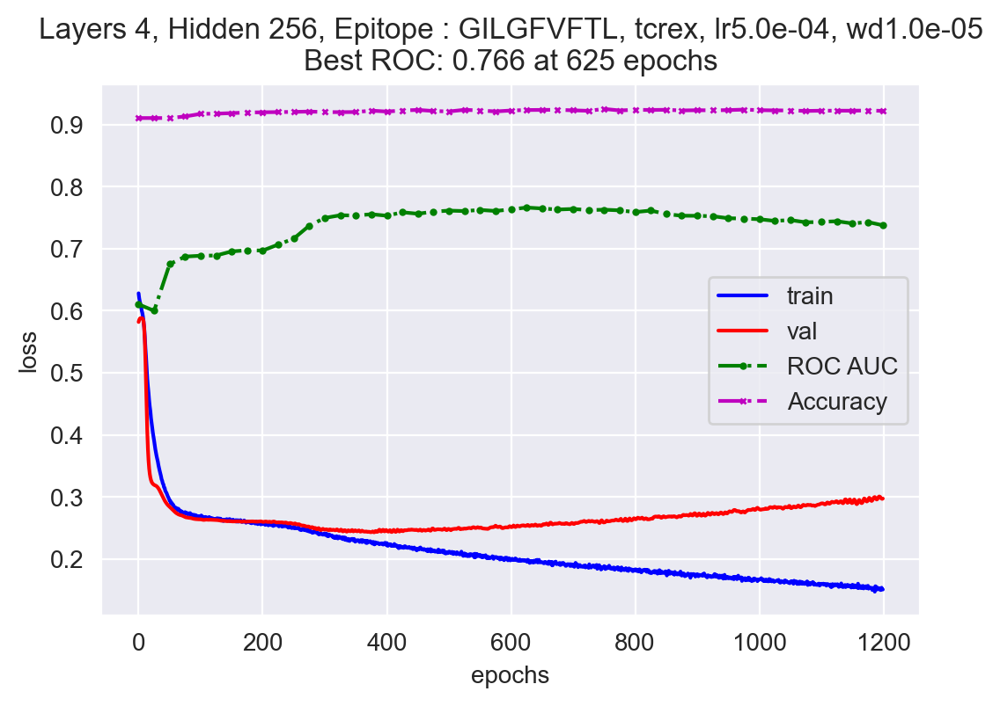

Layers 4, Hidden 512, Epitope : GILGFVFTL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.254e-01	Val: 6.994e-01
		ROC AUC :0.596, 	accuracy: 0.910
Epoch:25;	Train: 3.079e-01	Val: 3.040e-01
		ROC AUC :0.550, 	accuracy: 0.910
Epoch:50;	Train: 2.851e-01	Val: 2.825e-01
		ROC AUC :0.674, 	accuracy: 0.910
Epoch:75;	Train: 2.636e-01	Val: 2.658e-01
		ROC AUC :0.722, 	accuracy: 0.915
Epoch:100;	Train: 2.559e-01	Val: 2.599e-01
		ROC AUC :0.735, 	accuracy: 0.917
Epoch:125;	Train: 2.506e-01	Val: 2.581e-01
		ROC AUC :0.749, 	accuracy: 0.916
Epoch:150;	Train: 2.437e-01	Val: 2.552e-01
		ROC AUC :0.756, 	accuracy: 0.915
Epoch:175;	Train: 2.371e-01	Val: 2.478e-01
		ROC AUC :0.772, 	accuracy: 0.917
Epoch:200;	Train: 2.309e-01	Val: 2.469e-01
		ROC AUC :0.767, 	accuracy: 0.921
Epoch:225;	Train: 2.242e-01	Val: 2.453e-01
		ROC AUC :0.773, 	accuracy: 0.921
Epoch:250;	Train: 2.210e-01	Val: 2.464e-01
		ROC AUC :0.778, 	accuracy: 0.921
Epoch:275;	Train: 2.142e-01	Val: 2.478e-01
		ROC AUC :0.778, 	accuracy: 0.920
Epoch:300;	Train: 2.083e-01	Val: 2.495e-01
		ROC AUC :0.778, 	accurac

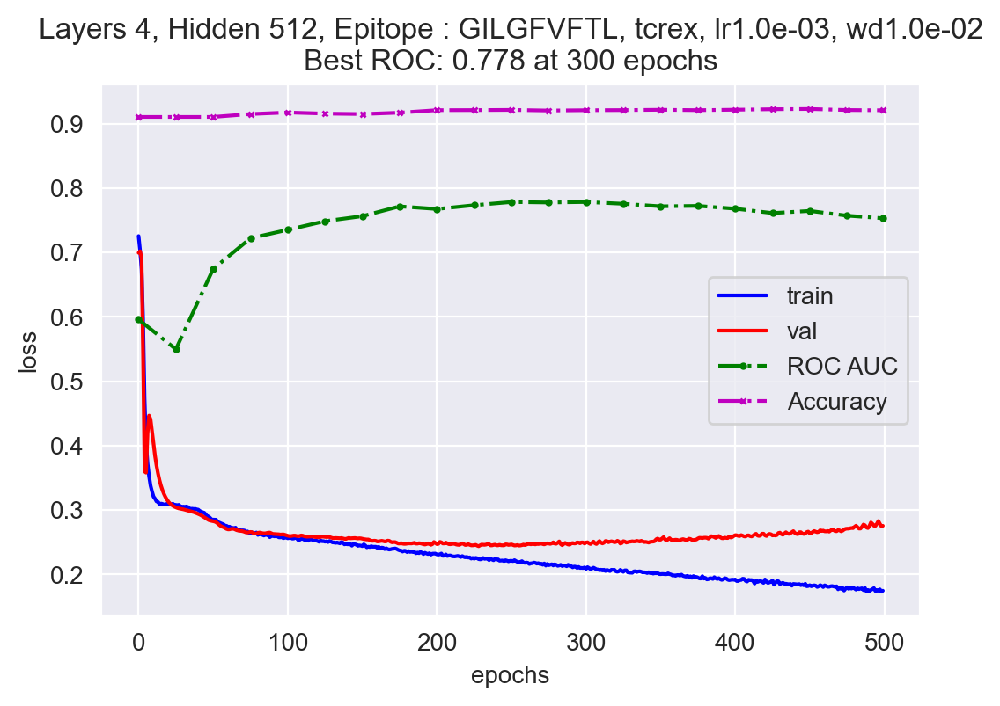

Layers 4, Hidden 512, Epitope : GILGFVFTL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 8.634e-01	Val: 8.217e-01
		ROC AUC :0.634, 	accuracy: 0.910
Epoch:25;	Train: 3.380e-01	Val: 3.190e-01
		ROC AUC :0.571, 	accuracy: 0.910
Epoch:50;	Train: 3.046e-01	Val: 2.991e-01
		ROC AUC :0.599, 	accuracy: 0.910
Epoch:75;	Train: 2.915e-01	Val: 2.860e-01
		ROC AUC :0.677, 	accuracy: 0.910
Epoch:100;	Train: 2.735e-01	Val: 2.644e-01
		ROC AUC :0.687, 	accuracy: 0.915
Epoch:125;	Train: 2.693e-01	Val: 2.588e-01
		ROC AUC :0.709, 	accuracy: 0.916
Epoch:150;	Train: 2.678e-01	Val: 2.565e-01
		ROC AUC :0.717, 	accuracy: 0.915
Epoch:175;	Train: 2.652e-01	Val: 2.559e-01
		ROC AUC :0.719, 	accuracy: 0.915
Epoch:200;	Train: 2.623e-01	Val: 2.540e-01
		ROC AUC :0.731, 	accuracy: 0.916
Epoch:225;	Train: 2.556e-01	Val: 2.490e-01
		ROC AUC :0.757, 	accuracy: 0.915
Epoch:250;	Train: 2.510e-01	Val: 2.459e-01
		ROC AUC :0.761, 	accuracy: 0.918
Epoch:275;	Train: 2.470e-01	Val: 2.432e-01
		ROC AUC :0.762, 	accuracy: 0.919
Epoch:300;	Train: 2.436e-01	Val: 2.411e-01
		ROC AUC :0.767, 	accurac

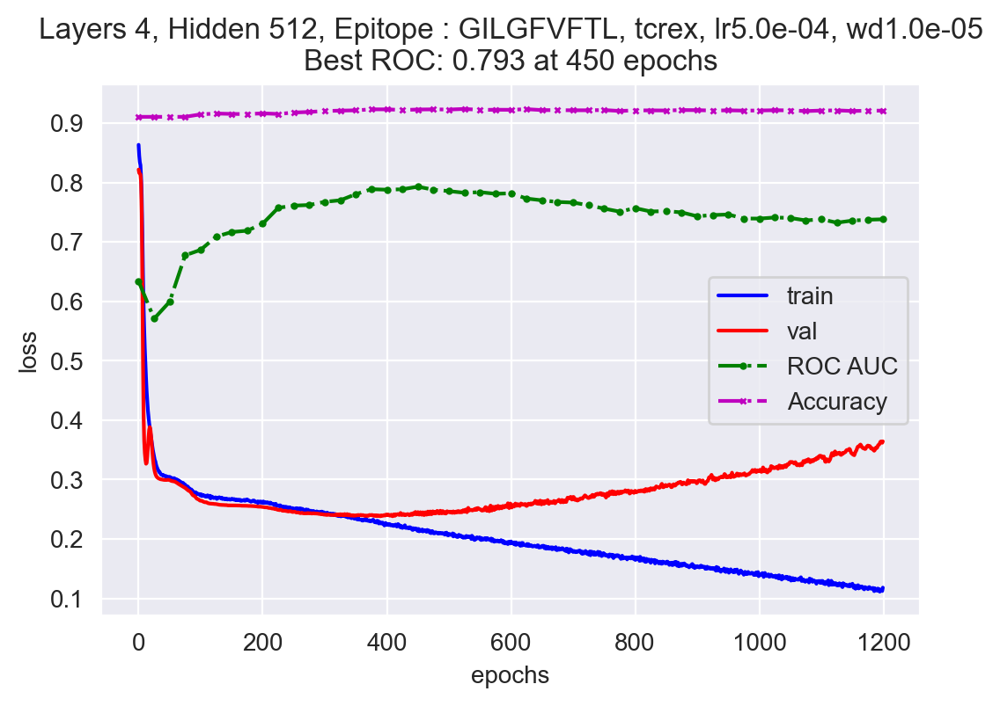

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.03%
Percent of positive class in val:   9.23%


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 2, Hidden 128, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.754e-01	Val: 6.787e-01
		ROC AUC :0.544, 	accuracy: 0.908
Epoch:25;	Train: 3.884e-01	Val: 3.559e-01
		ROC AUC :0.500, 	accuracy: 0.908
Epoch:50;	Train: 3.123e-01	Val: 3.106e-01
		ROC AUC :0.529, 	accuracy: 0.908
Epoch:75;	Train: 3.040e-01	Val: 3.057e-01
		ROC AUC :0.575, 	accuracy: 0.908
Epoch:100;	Train: 2.985e-01	Val: 3.026e-01
		ROC AUC :0.596, 	accuracy: 0.908
Epoch:125;	Train: 2.970e-01	Val: 3.005e-01
		ROC AUC :0.595, 	accuracy: 0.908
Epoch:150;	Train: 2.927e-01	Val: 2.976e-01
		ROC AUC :0.597, 	accuracy: 0.908
Epoch:175;	Train: 2.873e-01	Val: 2.923e-01
		ROC AUC :0.627, 	accuracy: 0.909
Epoch:200;	Train: 2.816e-01	Val: 2.921e-01
		ROC AUC :0.637, 	accuracy: 0.911
Epoch:225;	Train: 2.778e-01	Val: 2.913e-01
		ROC AUC :0.643, 	accuracy: 0.911
Epoch:250;	Train: 2.747e-01	Val: 2.918e-01
		ROC AUC :0.641, 	accuracy: 0.911
Epoch:275;	Train: 2.725e-01	Val: 2.926e-01
		ROC AUC :0.641, 	accuracy: 0.912
Epoch:300;	Train: 2.689e-01	Val: 2.935e-01
		ROC AUC :0.640, 	accurac

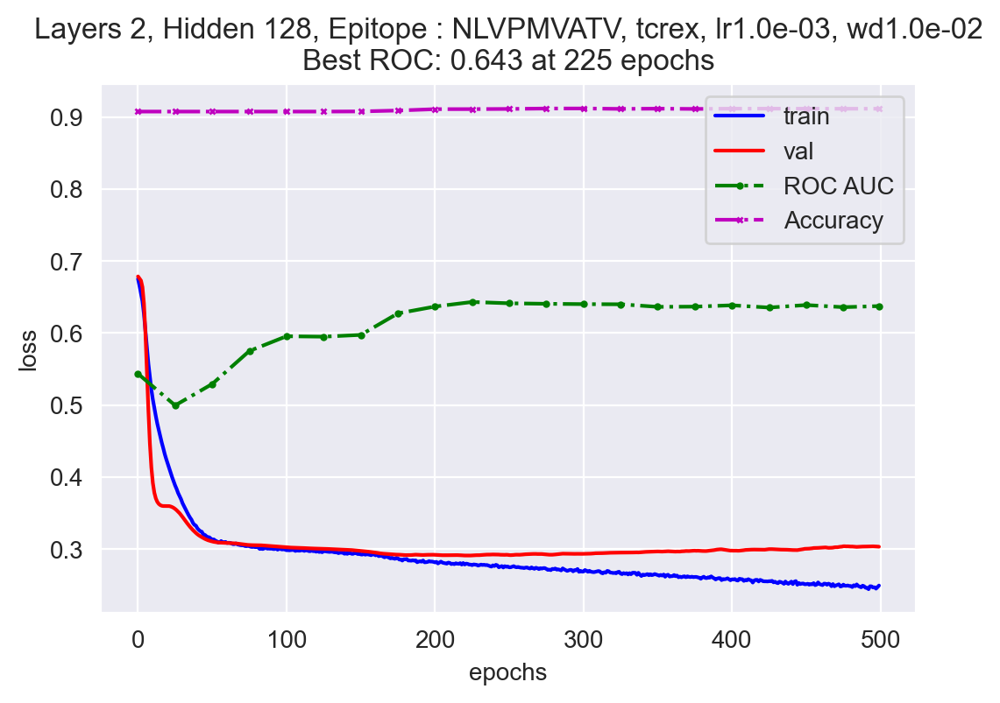

Layers 2, Hidden 128, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.398e-01	Val: 6.755e-01
		ROC AUC :0.544, 	accuracy: 0.908
Epoch:25;	Train: 5.381e-01	Val: 4.277e-01
		ROC AUC :0.503, 	accuracy: 0.908
Epoch:50;	Train: 4.139e-01	Val: 3.870e-01
		ROC AUC :0.518, 	accuracy: 0.908
Epoch:75;	Train: 3.450e-01	Val: 3.332e-01
		ROC AUC :0.534, 	accuracy: 0.908
Epoch:100;	Train: 3.179e-01	Val: 3.136e-01
		ROC AUC :0.549, 	accuracy: 0.908
Epoch:125;	Train: 3.094e-01	Val: 3.065e-01
		ROC AUC :0.573, 	accuracy: 0.908
Epoch:150;	Train: 3.029e-01	Val: 3.030e-01
		ROC AUC :0.590, 	accuracy: 0.908
Epoch:175;	Train: 3.000e-01	Val: 3.021e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:200;	Train: 2.983e-01	Val: 3.005e-01
		ROC AUC :0.592, 	accuracy: 0.908
Epoch:225;	Train: 2.954e-01	Val: 2.992e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:250;	Train: 2.942e-01	Val: 2.981e-01
		ROC AUC :0.591, 	accuracy: 0.908
Epoch:275;	Train: 2.903e-01	Val: 2.961e-01
		ROC AUC :0.601, 	accuracy: 0.908
Epoch:300;	Train: 2.879e-01	Val: 2.931e-01
		ROC AUC :0.623, 	accurac

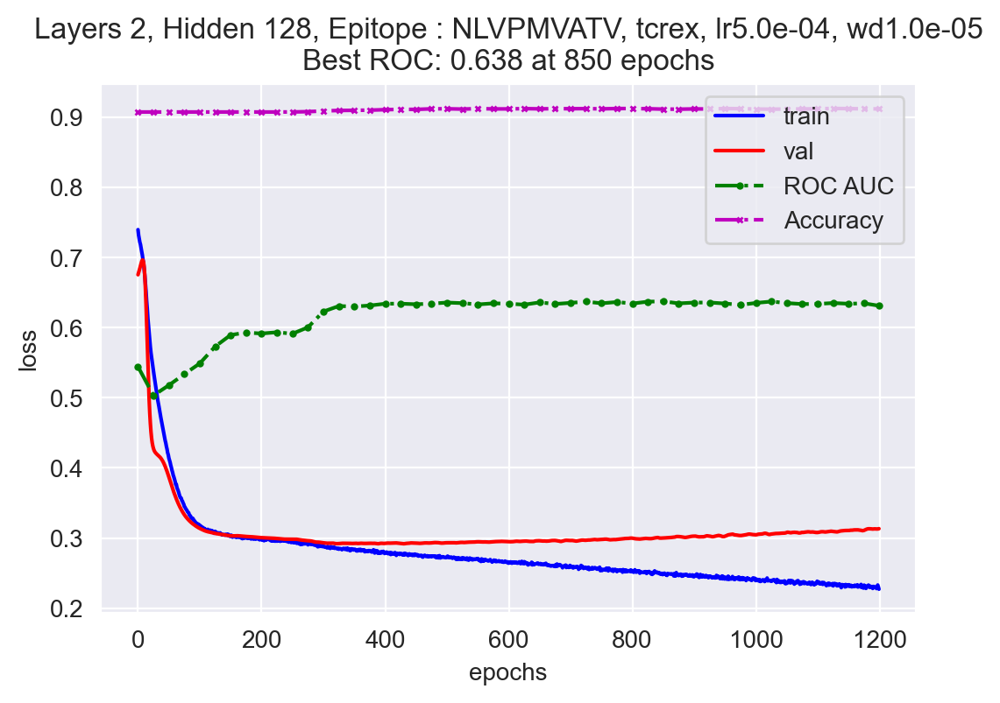

Layers 2, Hidden 256, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 8.693e-01	Val: 8.392e-01
		ROC AUC :0.531, 	accuracy: 0.908
Epoch:25;	Train: 3.614e-01	Val: 3.304e-01
		ROC AUC :0.508, 	accuracy: 0.908
Epoch:50;	Train: 3.074e-01	Val: 3.102e-01
		ROC AUC :0.531, 	accuracy: 0.908
Epoch:75;	Train: 3.003e-01	Val: 3.031e-01
		ROC AUC :0.582, 	accuracy: 0.908
Epoch:100;	Train: 2.972e-01	Val: 3.008e-01
		ROC AUC :0.592, 	accuracy: 0.908
Epoch:125;	Train: 2.955e-01	Val: 2.994e-01
		ROC AUC :0.585, 	accuracy: 0.908
Epoch:150;	Train: 2.918e-01	Val: 2.965e-01
		ROC AUC :0.586, 	accuracy: 0.908
Epoch:175;	Train: 2.873e-01	Val: 2.927e-01
		ROC AUC :0.610, 	accuracy: 0.909
Epoch:200;	Train: 2.798e-01	Val: 2.900e-01
		ROC AUC :0.638, 	accuracy: 0.911
Epoch:225;	Train: 2.754e-01	Val: 2.902e-01
		ROC AUC :0.641, 	accuracy: 0.912
Epoch:250;	Train: 2.729e-01	Val: 2.901e-01
		ROC AUC :0.644, 	accuracy: 0.912
Epoch:275;	Train: 2.689e-01	Val: 2.914e-01
		ROC AUC :0.642, 	accuracy: 0.912
Epoch:300;	Train: 2.665e-01	Val: 2.921e-01
		ROC AUC :0.641, 	accurac

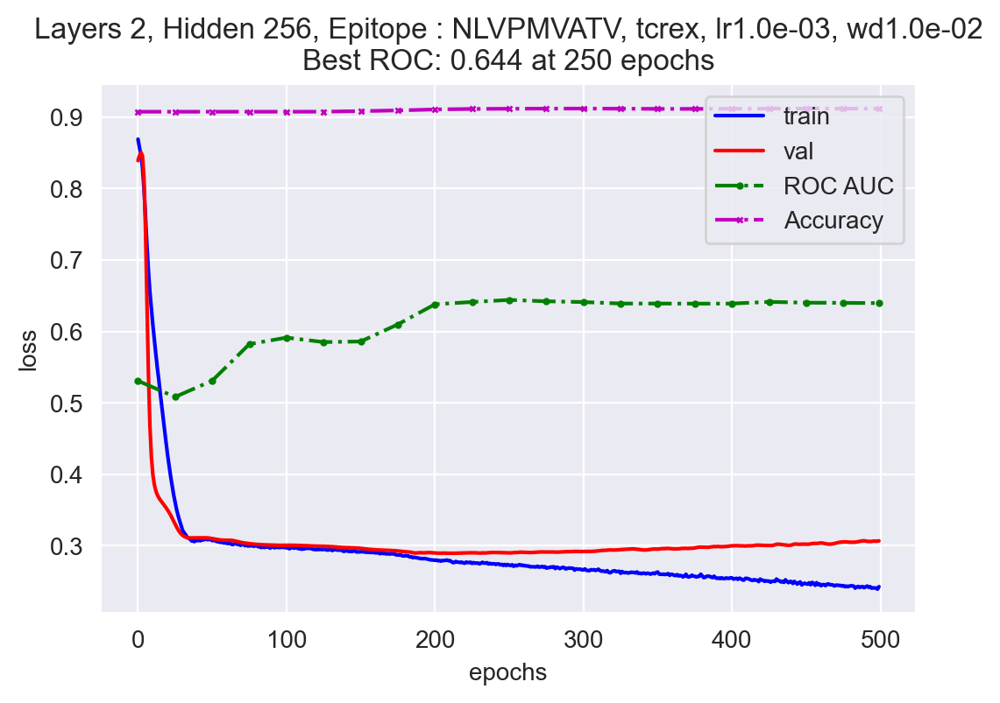

Layers 2, Hidden 256, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.530e-01	Val: 7.374e-01
		ROC AUC :0.534, 	accuracy: 0.908
Epoch:25;	Train: 4.142e-01	Val: 3.477e-01
		ROC AUC :0.501, 	accuracy: 0.908
Epoch:50;	Train: 3.173e-01	Val: 3.117e-01
		ROC AUC :0.515, 	accuracy: 0.908
Epoch:75;	Train: 3.075e-01	Val: 3.081e-01
		ROC AUC :0.532, 	accuracy: 0.908
Epoch:100;	Train: 3.056e-01	Val: 3.070e-01
		ROC AUC :0.550, 	accuracy: 0.908
Epoch:125;	Train: 3.029e-01	Val: 3.046e-01
		ROC AUC :0.576, 	accuracy: 0.908
Epoch:150;	Train: 3.000e-01	Val: 3.017e-01
		ROC AUC :0.591, 	accuracy: 0.908
Epoch:175;	Train: 2.985e-01	Val: 3.013e-01
		ROC AUC :0.589, 	accuracy: 0.908
Epoch:200;	Train: 2.959e-01	Val: 3.006e-01
		ROC AUC :0.587, 	accuracy: 0.908
Epoch:225;	Train: 2.966e-01	Val: 2.995e-01
		ROC AUC :0.585, 	accuracy: 0.908
Epoch:250;	Train: 2.937e-01	Val: 2.987e-01
		ROC AUC :0.577, 	accuracy: 0.908
Epoch:275;	Train: 2.907e-01	Val: 2.965e-01
		ROC AUC :0.583, 	accuracy: 0.908
Epoch:300;	Train: 2.851e-01	Val: 2.930e-01
		ROC AUC :0.620, 	accurac

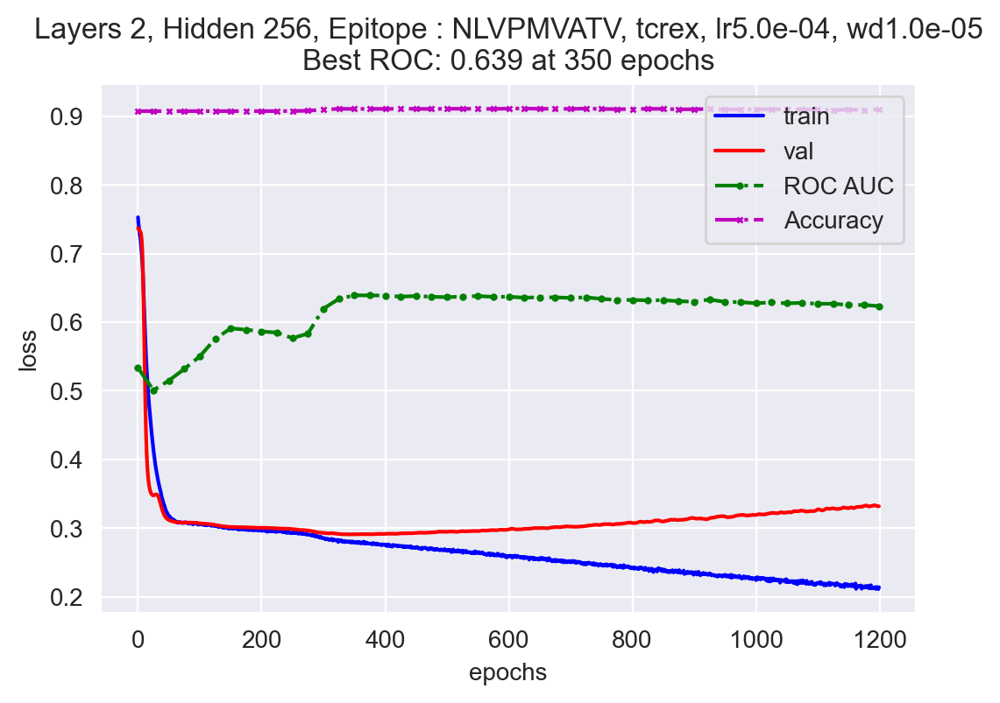

Layers 2, Hidden 512, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.316e-01	Val: 7.184e-01
		ROC AUC :0.533, 	accuracy: 0.908
Epoch:25;	Train: 3.083e-01	Val: 3.159e-01
		ROC AUC :0.536, 	accuracy: 0.908
Epoch:50;	Train: 3.029e-01	Val: 3.061e-01
		ROC AUC :0.566, 	accuracy: 0.908
Epoch:75;	Train: 2.962e-01	Val: 3.026e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:100;	Train: 2.939e-01	Val: 2.998e-01
		ROC AUC :0.602, 	accuracy: 0.908
Epoch:125;	Train: 2.914e-01	Val: 2.974e-01
		ROC AUC :0.594, 	accuracy: 0.908
Epoch:150;	Train: 2.869e-01	Val: 2.926e-01
		ROC AUC :0.614, 	accuracy: 0.909
Epoch:175;	Train: 2.827e-01	Val: 2.900e-01
		ROC AUC :0.632, 	accuracy: 0.910
Epoch:200;	Train: 2.783e-01	Val: 2.886e-01
		ROC AUC :0.644, 	accuracy: 0.911
Epoch:225;	Train: 2.747e-01	Val: 2.882e-01
		ROC AUC :0.650, 	accuracy: 0.911
Epoch:250;	Train: 2.705e-01	Val: 2.888e-01
		ROC AUC :0.650, 	accuracy: 0.911
Epoch:275;	Train: 2.655e-01	Val: 2.897e-01
		ROC AUC :0.649, 	accuracy: 0.912
Epoch:300;	Train: 2.633e-01	Val: 2.918e-01
		ROC AUC :0.645, 	accurac

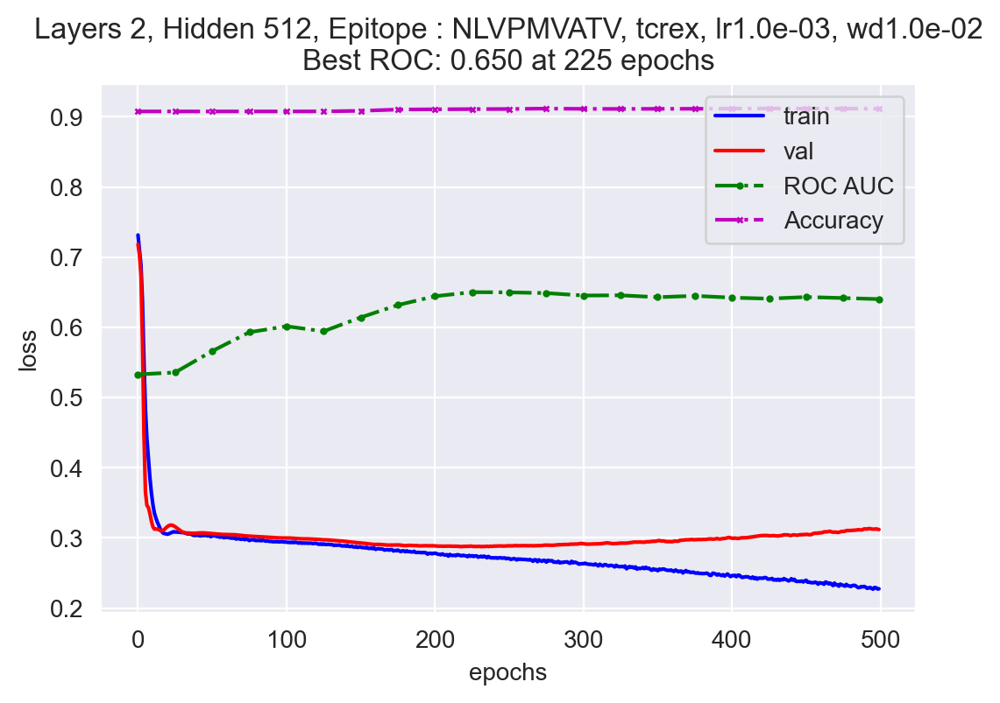

Layers 2, Hidden 512, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.975e-01	Val: 7.488e-01
		ROC AUC :0.544, 	accuracy: 0.908
Epoch:25;	Train: 4.043e-01	Val: 4.051e-01
		ROC AUC :0.532, 	accuracy: 0.908
Epoch:50;	Train: 3.190e-01	Val: 3.176e-01
		ROC AUC :0.530, 	accuracy: 0.908
Epoch:75;	Train: 3.054e-01	Val: 3.067e-01
		ROC AUC :0.559, 	accuracy: 0.908
Epoch:100;	Train: 3.029e-01	Val: 3.051e-01
		ROC AUC :0.574, 	accuracy: 0.908
Epoch:125;	Train: 3.017e-01	Val: 3.036e-01
		ROC AUC :0.584, 	accuracy: 0.908
Epoch:150;	Train: 2.998e-01	Val: 3.015e-01
		ROC AUC :0.595, 	accuracy: 0.908
Epoch:175;	Train: 2.963e-01	Val: 2.996e-01
		ROC AUC :0.592, 	accuracy: 0.908
Epoch:200;	Train: 2.950e-01	Val: 2.974e-01
		ROC AUC :0.589, 	accuracy: 0.908
Epoch:225;	Train: 2.940e-01	Val: 2.955e-01
		ROC AUC :0.577, 	accuracy: 0.908
Epoch:250;	Train: 2.925e-01	Val: 2.930e-01
		ROC AUC :0.583, 	accuracy: 0.908
Epoch:275;	Train: 2.883e-01	Val: 2.903e-01
		ROC AUC :0.614, 	accuracy: 0.909
Epoch:300;	Train: 2.850e-01	Val: 2.885e-01
		ROC AUC :0.635, 	accurac

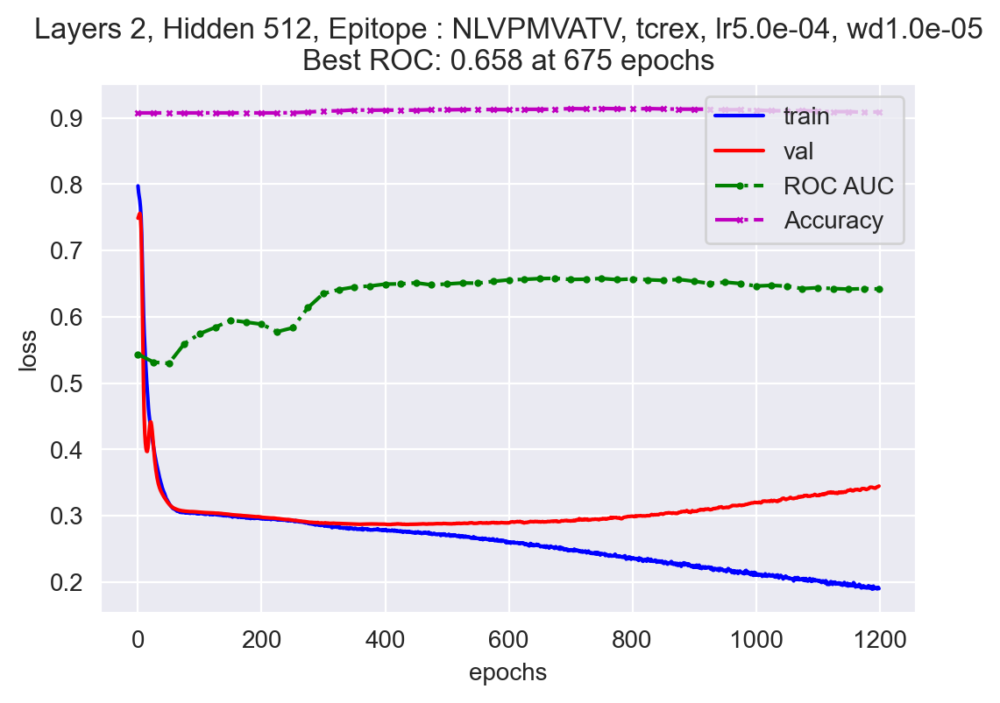

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 3, Hidden 128, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.785e-01	Val: 7.436e-01
		ROC AUC :0.530, 	accuracy: 0.908
Epoch:25;	Train: 5.765e-01	Val: 5.610e-01
		ROC AUC :0.489, 	accuracy: 0.908
Epoch:50;	Train: 3.867e-01	Val: 3.657e-01
		ROC AUC :0.528, 	accuracy: 0.908
Epoch:75;	Train: 3.175e-01	Val: 3.100e-01
		ROC AUC :0.527, 	accuracy: 0.908
Epoch:100;	Train: 3.107e-01	Val: 3.081e-01
		ROC AUC :0.552, 	accuracy: 0.908
Epoch:125;	Train: 3.081e-01	Val: 3.061e-01
		ROC AUC :0.567, 	accuracy: 0.908
Epoch:150;	Train: 3.047e-01	Val: 3.042e-01
		ROC AUC :0.584, 	accuracy: 0.908
Epoch:175;	Train: 3.011e-01	Val: 3.005e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:200;	Train: 2.967e-01	Val: 2.969e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:225;	Train: 2.939e-01	Val: 2.934e-01
		ROC AUC :0.592, 	accuracy: 0.909
Epoch:250;	Train: 2.921e-01	Val: 2.922e-01
		ROC AUC :0.608, 	accuracy: 0.910
Epoch:275;	Train: 2.899e-01	Val: 2.914e-01
		ROC AUC :0.618, 	accuracy: 0.911
Epoch:300;	Train: 2.869e-01	Val: 2.897e-01
		ROC AUC :0.626, 	accurac

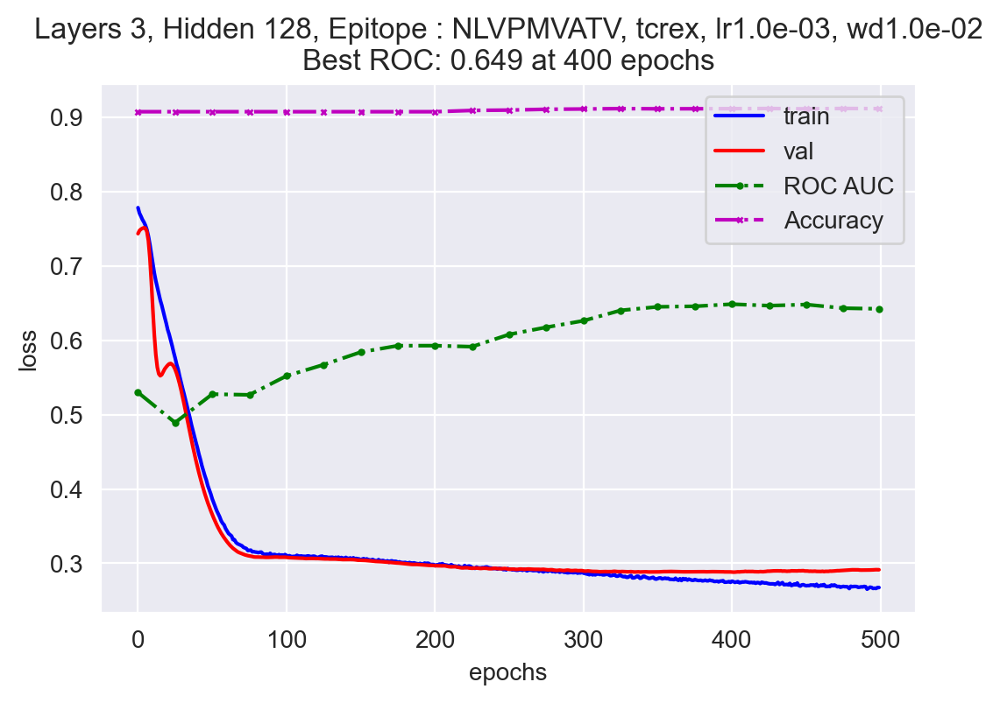

Layers 3, Hidden 128, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.212e-01	Val: 6.645e-01
		ROC AUC :0.530, 	accuracy: 0.908
Epoch:25;	Train: 5.256e-01	Val: 3.928e-01
		ROC AUC :0.499, 	accuracy: 0.908
Epoch:50;	Train: 3.826e-01	Val: 3.531e-01
		ROC AUC :0.499, 	accuracy: 0.908
Epoch:75;	Train: 3.266e-01	Val: 3.148e-01
		ROC AUC :0.511, 	accuracy: 0.908
Epoch:100;	Train: 3.144e-01	Val: 3.087e-01
		ROC AUC :0.517, 	accuracy: 0.908
Epoch:125;	Train: 3.105e-01	Val: 3.081e-01
		ROC AUC :0.529, 	accuracy: 0.908
Epoch:150;	Train: 3.087e-01	Val: 3.080e-01
		ROC AUC :0.539, 	accuracy: 0.908
Epoch:175;	Train: 3.067e-01	Val: 3.062e-01
		ROC AUC :0.558, 	accuracy: 0.908
Epoch:200;	Train: 3.022e-01	Val: 3.039e-01
		ROC AUC :0.581, 	accuracy: 0.908
Epoch:225;	Train: 3.000e-01	Val: 3.032e-01
		ROC AUC :0.581, 	accuracy: 0.908
Epoch:250;	Train: 3.006e-01	Val: 3.026e-01
		ROC AUC :0.580, 	accuracy: 0.908
Epoch:275;	Train: 2.987e-01	Val: 3.011e-01
		ROC AUC :0.581, 	accuracy: 0.908
Epoch:300;	Train: 2.956e-01	Val: 3.003e-01
		ROC AUC :0.577, 	accurac

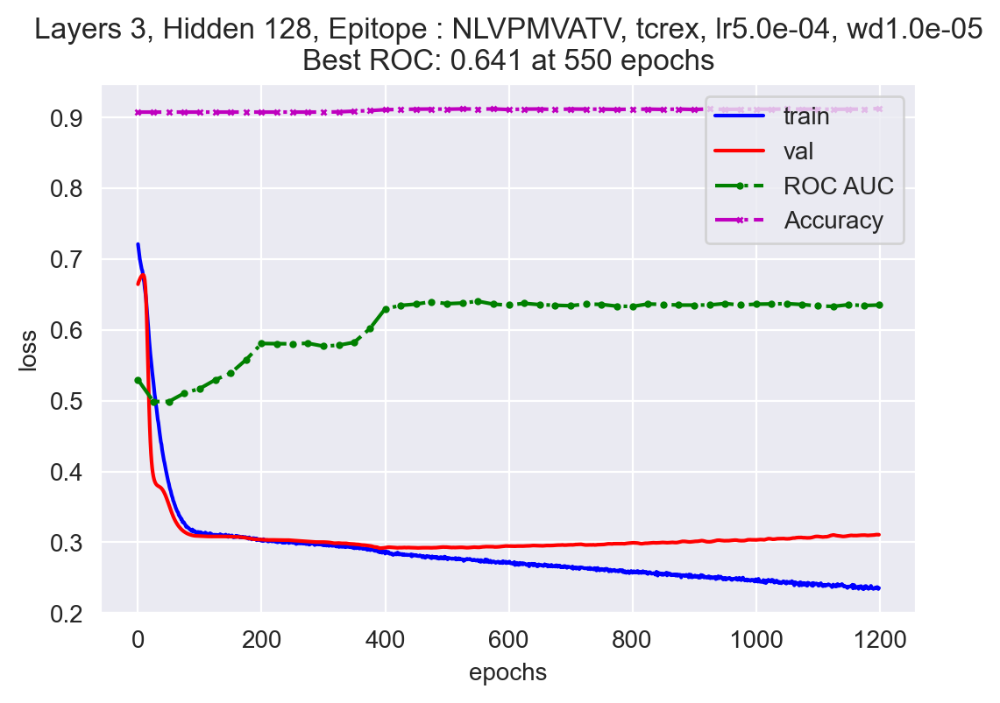

Layers 3, Hidden 256, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.653e-01	Val: 6.280e-01
		ROC AUC :0.548, 	accuracy: 0.908
Epoch:25;	Train: 3.175e-01	Val: 3.151e-01
		ROC AUC :0.493, 	accuracy: 0.908
Epoch:50;	Train: 3.061e-01	Val: 3.102e-01
		ROC AUC :0.513, 	accuracy: 0.908
Epoch:75;	Train: 3.001e-01	Val: 3.054e-01
		ROC AUC :0.571, 	accuracy: 0.908
Epoch:100;	Train: 2.961e-01	Val: 3.028e-01
		ROC AUC :0.578, 	accuracy: 0.908
Epoch:125;	Train: 2.924e-01	Val: 3.010e-01
		ROC AUC :0.572, 	accuracy: 0.908
Epoch:150;	Train: 2.895e-01	Val: 2.984e-01
		ROC AUC :0.569, 	accuracy: 0.909
Epoch:175;	Train: 2.869e-01	Val: 2.970e-01
		ROC AUC :0.572, 	accuracy: 0.910
Epoch:200;	Train: 2.834e-01	Val: 2.966e-01
		ROC AUC :0.583, 	accuracy: 0.911
Epoch:225;	Train: 2.799e-01	Val: 2.970e-01
		ROC AUC :0.592, 	accuracy: 0.912
Epoch:250;	Train: 2.755e-01	Val: 2.973e-01
		ROC AUC :0.611, 	accuracy: 0.912
Epoch:275;	Train: 2.732e-01	Val: 2.973e-01
		ROC AUC :0.622, 	accuracy: 0.912
Epoch:300;	Train: 2.689e-01	Val: 2.989e-01
		ROC AUC :0.621, 	accurac

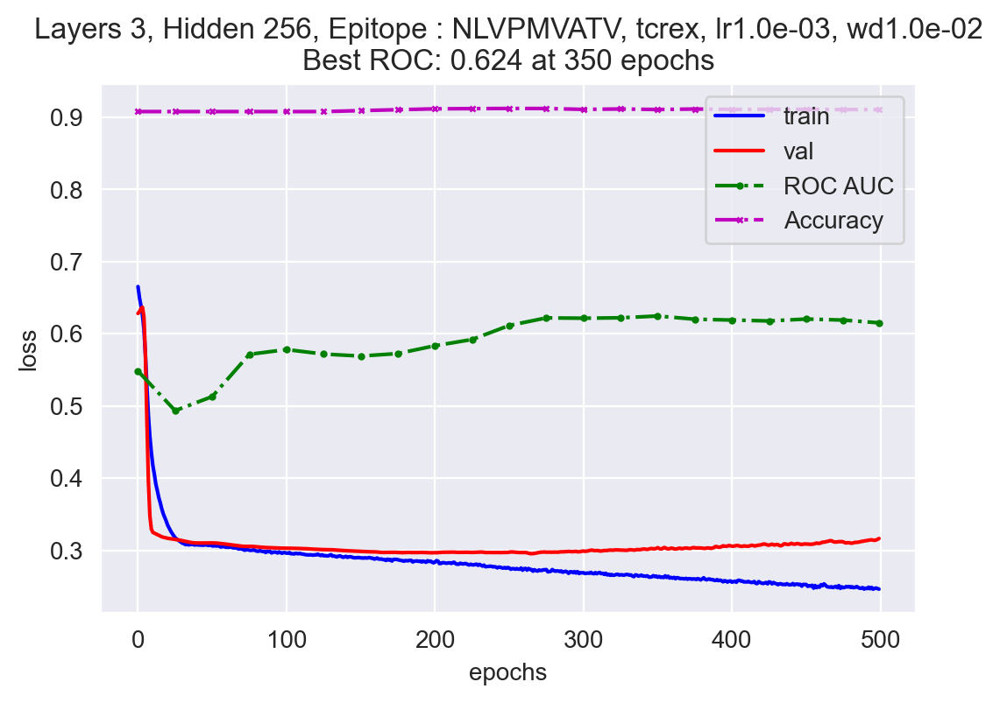

Layers 3, Hidden 256, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.739e-01	Val: 6.393e-01
		ROC AUC :0.533, 	accuracy: 0.908
Epoch:25;	Train: 4.314e-01	Val: 3.625e-01
		ROC AUC :0.506, 	accuracy: 0.908
Epoch:50;	Train: 3.243e-01	Val: 3.151e-01
		ROC AUC :0.514, 	accuracy: 0.908
Epoch:75;	Train: 3.074e-01	Val: 3.077e-01
		ROC AUC :0.538, 	accuracy: 0.908
Epoch:100;	Train: 3.054e-01	Val: 3.060e-01
		ROC AUC :0.566, 	accuracy: 0.908
Epoch:125;	Train: 3.015e-01	Val: 3.029e-01
		ROC AUC :0.585, 	accuracy: 0.908
Epoch:150;	Train: 2.967e-01	Val: 3.015e-01
		ROC AUC :0.591, 	accuracy: 0.908
Epoch:175;	Train: 2.958e-01	Val: 3.007e-01
		ROC AUC :0.590, 	accuracy: 0.908
Epoch:200;	Train: 2.944e-01	Val: 3.000e-01
		ROC AUC :0.583, 	accuracy: 0.908
Epoch:225;	Train: 2.932e-01	Val: 2.985e-01
		ROC AUC :0.584, 	accuracy: 0.908
Epoch:250;	Train: 2.910e-01	Val: 2.966e-01
		ROC AUC :0.588, 	accuracy: 0.908
Epoch:275;	Train: 2.874e-01	Val: 2.936e-01
		ROC AUC :0.606, 	accuracy: 0.909
Epoch:300;	Train: 2.814e-01	Val: 2.906e-01
		ROC AUC :0.634, 	accurac

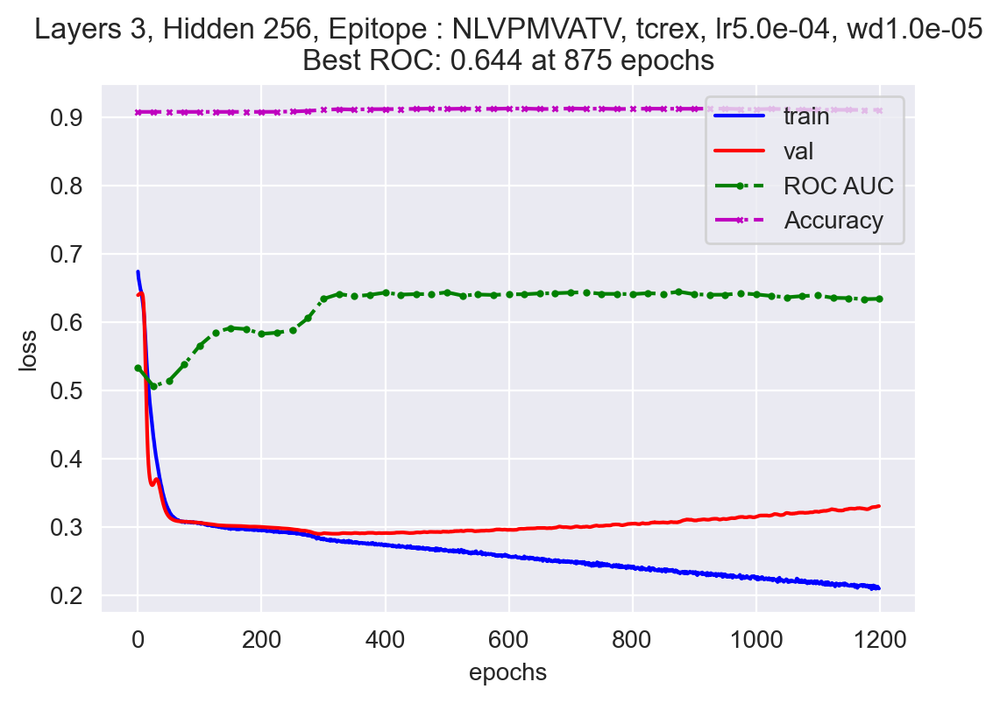

Layers 3, Hidden 512, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.797e-01	Val: 6.441e-01
		ROC AUC :0.527, 	accuracy: 0.908
Epoch:25;	Train: 3.079e-01	Val: 3.133e-01
		ROC AUC :0.517, 	accuracy: 0.908
Epoch:50;	Train: 3.039e-01	Val: 3.080e-01
		ROC AUC :0.539, 	accuracy: 0.908
Epoch:75;	Train: 2.988e-01	Val: 3.057e-01
		ROC AUC :0.571, 	accuracy: 0.908
Epoch:100;	Train: 2.948e-01	Val: 3.017e-01
		ROC AUC :0.588, 	accuracy: 0.908
Epoch:125;	Train: 2.926e-01	Val: 3.000e-01
		ROC AUC :0.577, 	accuracy: 0.908
Epoch:150;	Train: 2.888e-01	Val: 2.956e-01
		ROC AUC :0.577, 	accuracy: 0.909
Epoch:175;	Train: 2.824e-01	Val: 2.931e-01
		ROC AUC :0.609, 	accuracy: 0.909
Epoch:200;	Train: 2.780e-01	Val: 2.915e-01
		ROC AUC :0.633, 	accuracy: 0.912
Epoch:225;	Train: 2.743e-01	Val: 2.907e-01
		ROC AUC :0.639, 	accuracy: 0.912
Epoch:250;	Train: 2.721e-01	Val: 2.907e-01
		ROC AUC :0.641, 	accuracy: 0.912
Epoch:275;	Train: 2.702e-01	Val: 2.919e-01
		ROC AUC :0.639, 	accuracy: 0.912
Epoch:300;	Train: 2.659e-01	Val: 2.933e-01
		ROC AUC :0.644, 	accurac

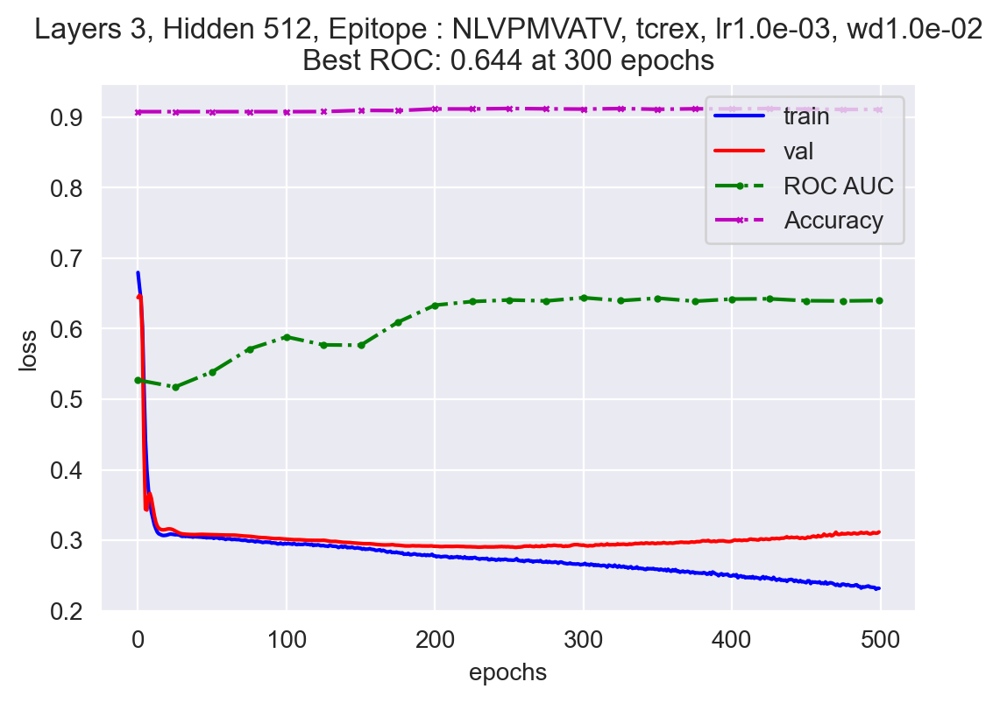

Layers 3, Hidden 512, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.964e-01	Val: 6.554e-01
		ROC AUC :0.548, 	accuracy: 0.908
Epoch:25;	Train: 3.182e-01	Val: 3.129e-01
		ROC AUC :0.514, 	accuracy: 0.908
Epoch:50;	Train: 3.052e-01	Val: 3.085e-01
		ROC AUC :0.541, 	accuracy: 0.908
Epoch:75;	Train: 3.006e-01	Val: 3.052e-01
		ROC AUC :0.575, 	accuracy: 0.908
Epoch:100;	Train: 2.967e-01	Val: 3.031e-01
		ROC AUC :0.588, 	accuracy: 0.908
Epoch:125;	Train: 2.961e-01	Val: 3.021e-01
		ROC AUC :0.592, 	accuracy: 0.908
Epoch:150;	Train: 2.945e-01	Val: 3.013e-01
		ROC AUC :0.590, 	accuracy: 0.908
Epoch:175;	Train: 2.919e-01	Val: 3.005e-01
		ROC AUC :0.584, 	accuracy: 0.908
Epoch:200;	Train: 2.906e-01	Val: 2.986e-01
		ROC AUC :0.586, 	accuracy: 0.908
Epoch:225;	Train: 2.866e-01	Val: 2.949e-01
		ROC AUC :0.606, 	accuracy: 0.908
Epoch:250;	Train: 2.853e-01	Val: 2.925e-01
		ROC AUC :0.615, 	accuracy: 0.910
Epoch:275;	Train: 2.820e-01	Val: 2.902e-01
		ROC AUC :0.632, 	accuracy: 0.910
Epoch:300;	Train: 2.800e-01	Val: 2.879e-01
		ROC AUC :0.647, 	accurac

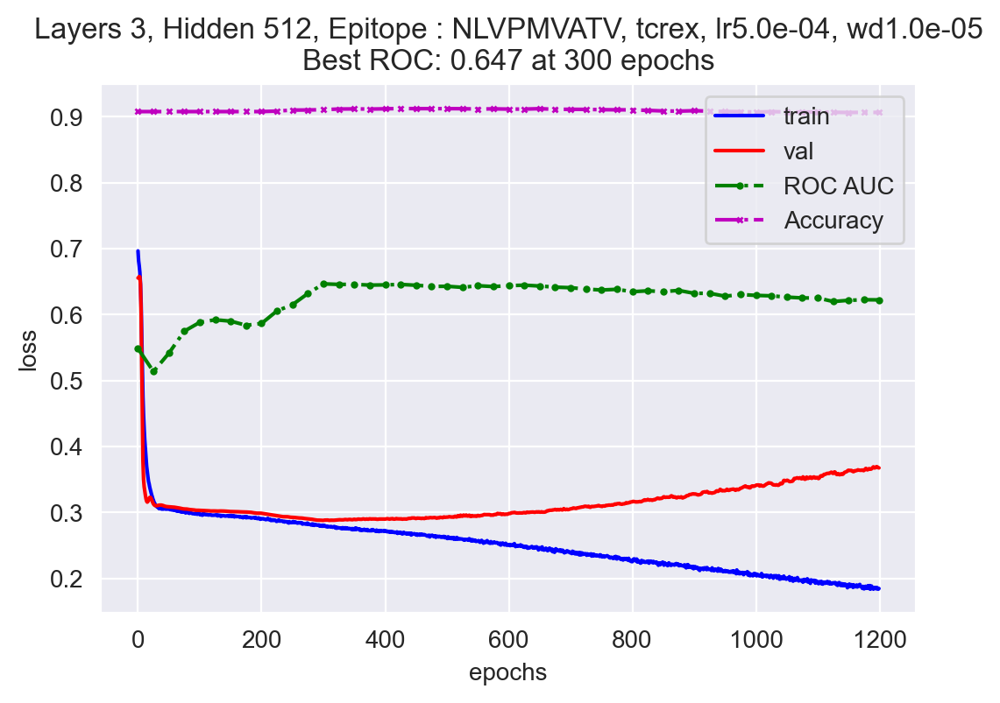

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 4, Hidden 128, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.511e-01	Val: 7.306e-01
		ROC AUC :0.530, 	accuracy: 0.908
Epoch:25;	Train: 4.556e-01	Val: 4.102e-01
		ROC AUC :0.510, 	accuracy: 0.908
Epoch:50;	Train: 3.286e-01	Val: 3.166e-01
		ROC AUC :0.505, 	accuracy: 0.908
Epoch:75;	Train: 3.114e-01	Val: 3.091e-01
		ROC AUC :0.508, 	accuracy: 0.908
Epoch:100;	Train: 3.095e-01	Val: 3.086e-01
		ROC AUC :0.519, 	accuracy: 0.908
Epoch:125;	Train: 3.086e-01	Val: 3.083e-01
		ROC AUC :0.510, 	accuracy: 0.908
Epoch:150;	Train: 3.087e-01	Val: 3.081e-01
		ROC AUC :0.515, 	accuracy: 0.908
Epoch:175;	Train: 3.077e-01	Val: 3.077e-01
		ROC AUC :0.537, 	accuracy: 0.908
Epoch:200;	Train: 3.082e-01	Val: 3.072e-01
		ROC AUC :0.554, 	accuracy: 0.908
Epoch:225;	Train: 3.032e-01	Val: 3.039e-01
		ROC AUC :0.569, 	accuracy: 0.908
Epoch:250;	Train: 2.999e-01	Val: 3.009e-01
		ROC AUC :0.581, 	accuracy: 0.908
Epoch:275;	Train: 2.969e-01	Val: 2.976e-01
		ROC AUC :0.582, 	accuracy: 0.908
Epoch:300;	Train: 2.948e-01	Val: 2.946e-01
		ROC AUC :0.586, 	accurac

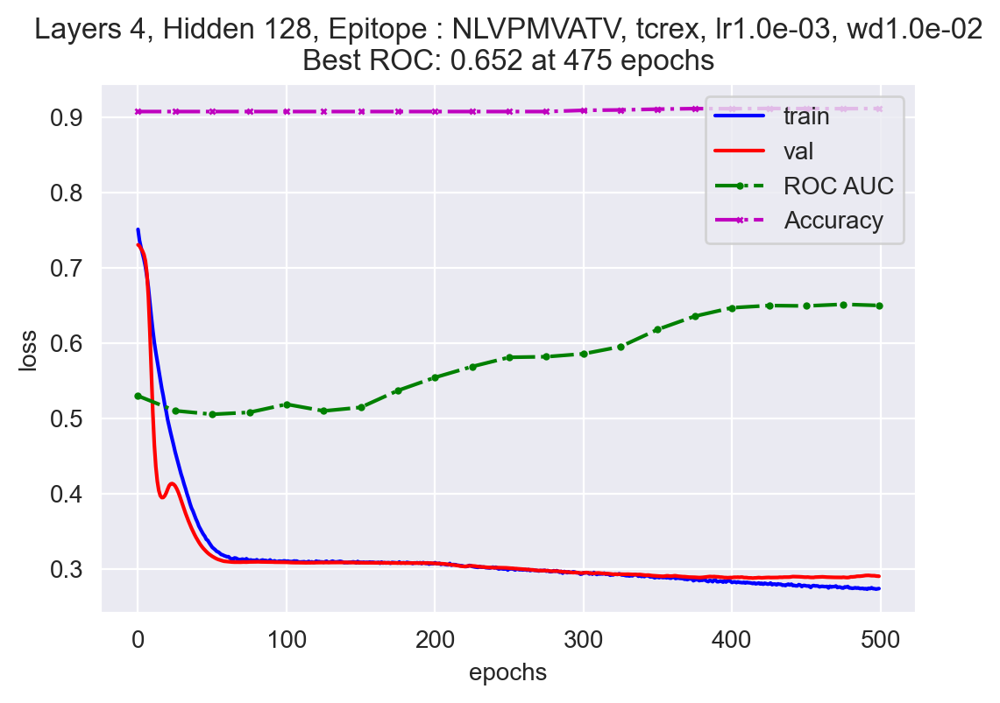

Layers 4, Hidden 128, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.046e-01	Val: 5.831e-01
		ROC AUC :0.526, 	accuracy: 0.908
Epoch:25;	Train: 4.561e-01	Val: 3.735e-01
		ROC AUC :0.507, 	accuracy: 0.908
Epoch:50;	Train: 3.640e-01	Val: 3.474e-01
		ROC AUC :0.512, 	accuracy: 0.908
Epoch:75;	Train: 3.214e-01	Val: 3.136e-01
		ROC AUC :0.511, 	accuracy: 0.908
Epoch:100;	Train: 3.117e-01	Val: 3.085e-01
		ROC AUC :0.512, 	accuracy: 0.908
Epoch:125;	Train: 3.109e-01	Val: 3.086e-01
		ROC AUC :0.509, 	accuracy: 0.908
Epoch:150;	Train: 3.083e-01	Val: 3.086e-01
		ROC AUC :0.514, 	accuracy: 0.908
Epoch:175;	Train: 3.076e-01	Val: 3.075e-01
		ROC AUC :0.540, 	accuracy: 0.908
Epoch:200;	Train: 3.021e-01	Val: 3.050e-01
		ROC AUC :0.569, 	accuracy: 0.908
Epoch:225;	Train: 3.000e-01	Val: 3.032e-01
		ROC AUC :0.578, 	accuracy: 0.908
Epoch:250;	Train: 2.973e-01	Val: 3.020e-01
		ROC AUC :0.576, 	accuracy: 0.908
Epoch:275;	Train: 2.980e-01	Val: 3.011e-01
		ROC AUC :0.569, 	accuracy: 0.908
Epoch:300;	Train: 2.943e-01	Val: 2.995e-01
		ROC AUC :0.566, 	accurac

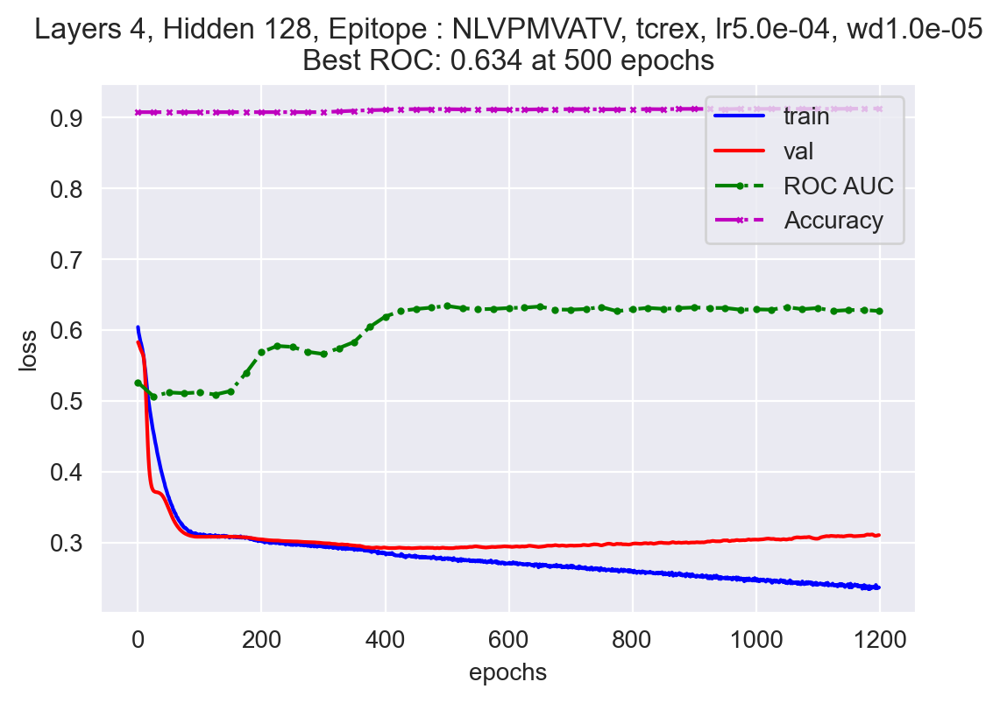

Layers 4, Hidden 256, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.299e-01	Val: 6.812e-01
		ROC AUC :0.535, 	accuracy: 0.908
Epoch:25;	Train: 3.230e-01	Val: 3.117e-01
		ROC AUC :0.500, 	accuracy: 0.908
Epoch:50;	Train: 3.076e-01	Val: 3.093e-01
		ROC AUC :0.536, 	accuracy: 0.908
Epoch:75;	Train: 3.050e-01	Val: 3.076e-01
		ROC AUC :0.540, 	accuracy: 0.908
Epoch:100;	Train: 3.030e-01	Val: 3.071e-01
		ROC AUC :0.557, 	accuracy: 0.908
Epoch:125;	Train: 3.002e-01	Val: 3.043e-01
		ROC AUC :0.586, 	accuracy: 0.908
Epoch:150;	Train: 2.979e-01	Val: 3.029e-01
		ROC AUC :0.598, 	accuracy: 0.908
Epoch:175;	Train: 2.956e-01	Val: 3.012e-01
		ROC AUC :0.594, 	accuracy: 0.908
Epoch:200;	Train: 2.919e-01	Val: 2.973e-01
		ROC AUC :0.604, 	accuracy: 0.908
Epoch:225;	Train: 2.853e-01	Val: 2.935e-01
		ROC AUC :0.624, 	accuracy: 0.910
Epoch:250;	Train: 2.808e-01	Val: 2.939e-01
		ROC AUC :0.630, 	accuracy: 0.910
Epoch:275;	Train: 2.797e-01	Val: 2.941e-01
		ROC AUC :0.632, 	accuracy: 0.910
Epoch:300;	Train: 2.772e-01	Val: 2.943e-01
		ROC AUC :0.634, 	accurac

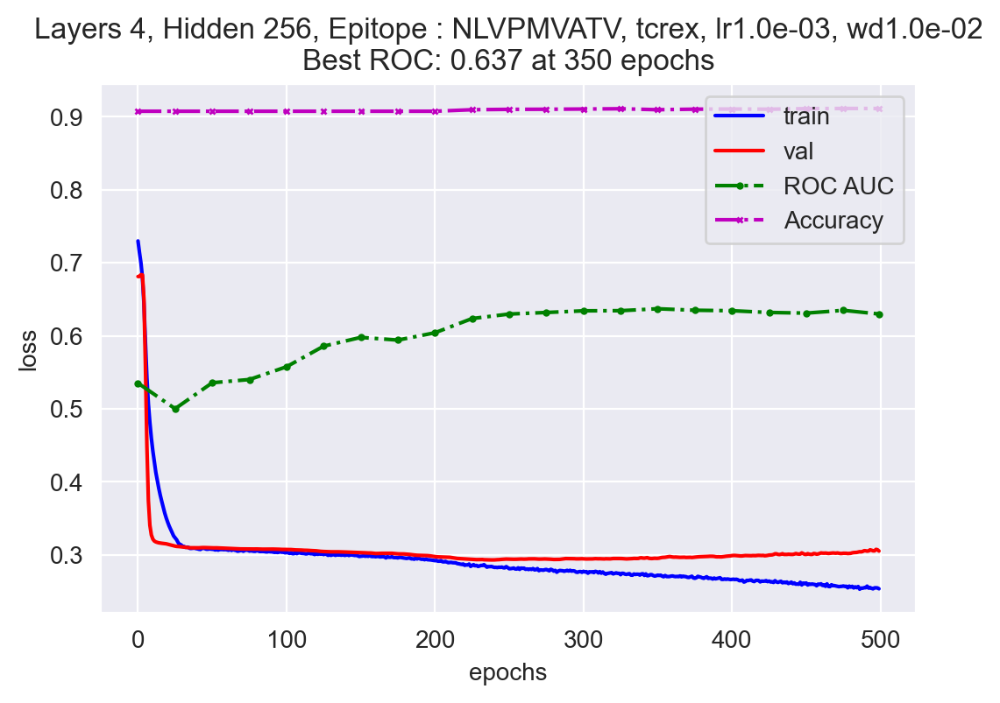

Layers 4, Hidden 256, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.389e-01	Val: 6.303e-01
		ROC AUC :0.529, 	accuracy: 0.908
Epoch:25;	Train: 3.653e-01	Val: 3.319e-01
		ROC AUC :0.511, 	accuracy: 0.908
Epoch:50;	Train: 3.130e-01	Val: 3.109e-01
		ROC AUC :0.511, 	accuracy: 0.908
Epoch:75;	Train: 3.059e-01	Val: 3.083e-01
		ROC AUC :0.526, 	accuracy: 0.908
Epoch:100;	Train: 3.040e-01	Val: 3.077e-01
		ROC AUC :0.541, 	accuracy: 0.908
Epoch:125;	Train: 3.031e-01	Val: 3.069e-01
		ROC AUC :0.558, 	accuracy: 0.908
Epoch:150;	Train: 3.026e-01	Val: 3.061e-01
		ROC AUC :0.570, 	accuracy: 0.908
Epoch:175;	Train: 3.018e-01	Val: 3.052e-01
		ROC AUC :0.578, 	accuracy: 0.908
Epoch:200;	Train: 3.006e-01	Val: 3.047e-01
		ROC AUC :0.587, 	accuracy: 0.908
Epoch:225;	Train: 2.992e-01	Val: 3.034e-01
		ROC AUC :0.596, 	accuracy: 0.908
Epoch:250;	Train: 2.978e-01	Val: 3.024e-01
		ROC AUC :0.600, 	accuracy: 0.908
Epoch:275;	Train: 2.983e-01	Val: 3.018e-01
		ROC AUC :0.604, 	accuracy: 0.908
Epoch:300;	Train: 2.980e-01	Val: 3.011e-01
		ROC AUC :0.603, 	accurac

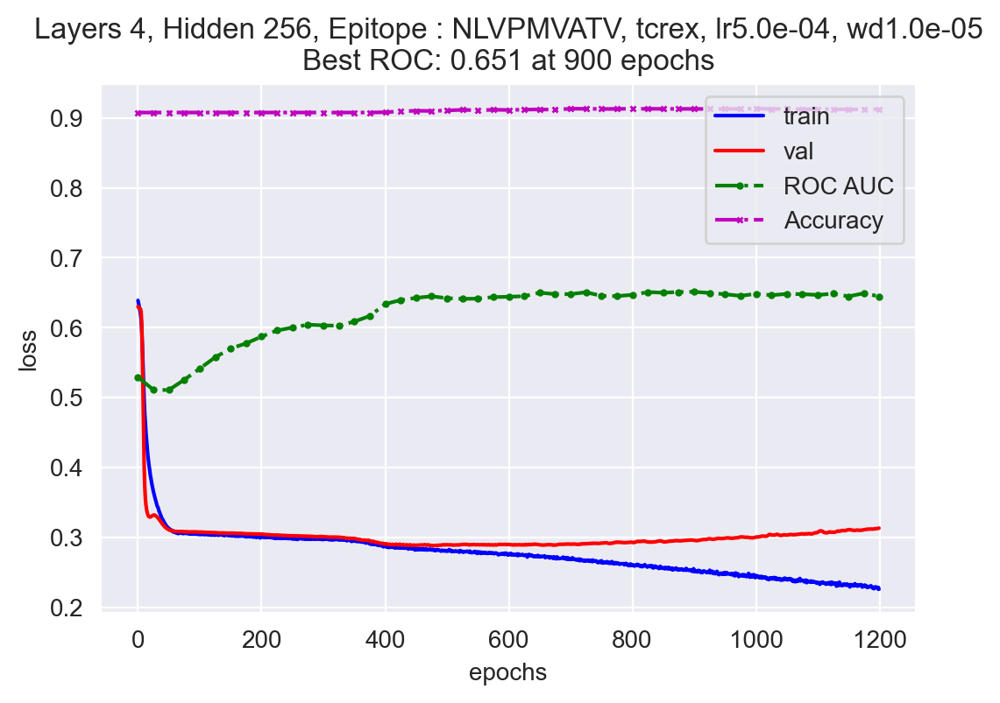

Layers 4, Hidden 512, Epitope : NLVPMVATV, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.837e-01	Val: 7.692e-01
		ROC AUC :0.550, 	accuracy: 0.908
Epoch:25;	Train: 3.077e-01	Val: 3.116e-01
		ROC AUC :0.518, 	accuracy: 0.908
Epoch:50;	Train: 3.033e-01	Val: 3.069e-01
		ROC AUC :0.555, 	accuracy: 0.908
Epoch:75;	Train: 2.984e-01	Val: 3.039e-01
		ROC AUC :0.590, 	accuracy: 0.908
Epoch:100;	Train: 2.964e-01	Val: 3.006e-01
		ROC AUC :0.600, 	accuracy: 0.908
Epoch:125;	Train: 2.933e-01	Val: 2.988e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:150;	Train: 2.882e-01	Val: 2.951e-01
		ROC AUC :0.594, 	accuracy: 0.908
Epoch:175;	Train: 2.821e-01	Val: 2.907e-01
		ROC AUC :0.635, 	accuracy: 0.910
Epoch:200;	Train: 2.778e-01	Val: 2.899e-01
		ROC AUC :0.642, 	accuracy: 0.911
Epoch:225;	Train: 2.744e-01	Val: 2.911e-01
		ROC AUC :0.638, 	accuracy: 0.912
Epoch:250;	Train: 2.726e-01	Val: 2.912e-01
		ROC AUC :0.643, 	accuracy: 0.912
Epoch:275;	Train: 2.694e-01	Val: 2.911e-01
		ROC AUC :0.645, 	accuracy: 0.911
Epoch:300;	Train: 2.670e-01	Val: 2.932e-01
		ROC AUC :0.639, 	accurac

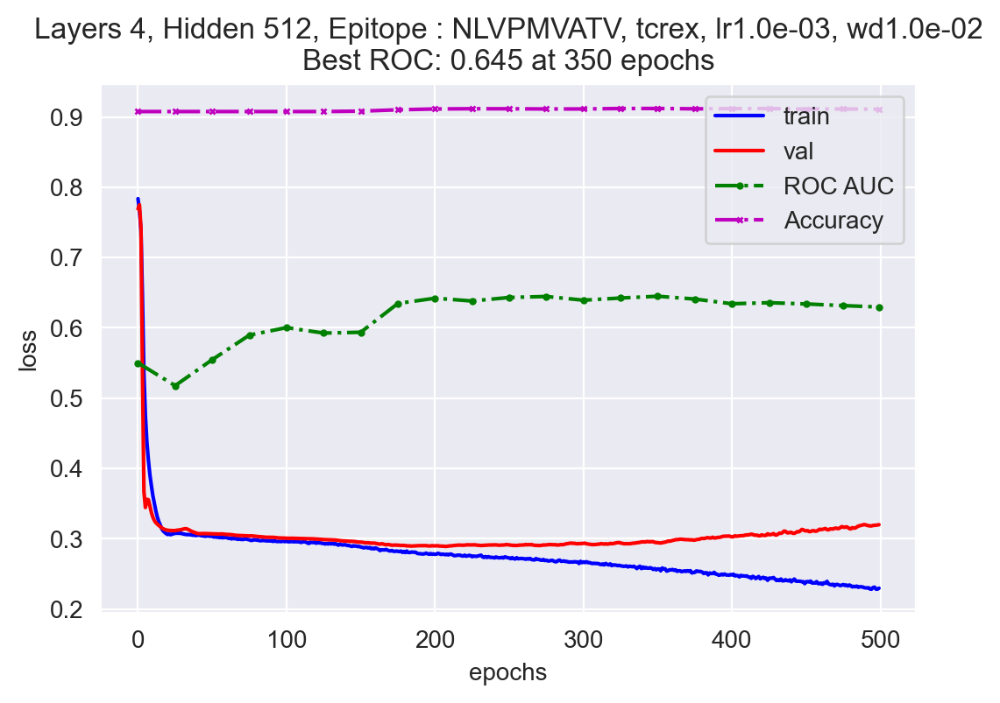

Layers 4, Hidden 512, Epitope : NLVPMVATV, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.801e-01	Val: 6.401e-01
		ROC AUC :0.561, 	accuracy: 0.908
Epoch:25;	Train: 3.087e-01	Val: 3.135e-01
		ROC AUC :0.502, 	accuracy: 0.908
Epoch:50;	Train: 3.065e-01	Val: 3.086e-01
		ROC AUC :0.491, 	accuracy: 0.908
Epoch:75;	Train: 3.058e-01	Val: 3.087e-01
		ROC AUC :0.494, 	accuracy: 0.908
Epoch:100;	Train: 3.054e-01	Val: 3.087e-01
		ROC AUC :0.493, 	accuracy: 0.908
Epoch:125;	Train: 3.046e-01	Val: 3.086e-01
		ROC AUC :0.502, 	accuracy: 0.908
Epoch:150;	Train: 3.042e-01	Val: 3.087e-01
		ROC AUC :0.510, 	accuracy: 0.908
Epoch:175;	Train: 3.033e-01	Val: 3.085e-01
		ROC AUC :0.513, 	accuracy: 0.908
Epoch:200;	Train: 3.035e-01	Val: 3.078e-01
		ROC AUC :0.529, 	accuracy: 0.908
Epoch:225;	Train: 3.026e-01	Val: 3.068e-01
		ROC AUC :0.558, 	accuracy: 0.908
Epoch:250;	Train: 2.998e-01	Val: 3.043e-01
		ROC AUC :0.594, 	accuracy: 0.908
Epoch:275;	Train: 2.968e-01	Val: 3.016e-01
		ROC AUC :0.603, 	accuracy: 0.908
Epoch:300;	Train: 2.943e-01	Val: 3.003e-01
		ROC AUC :0.600, 	accurac

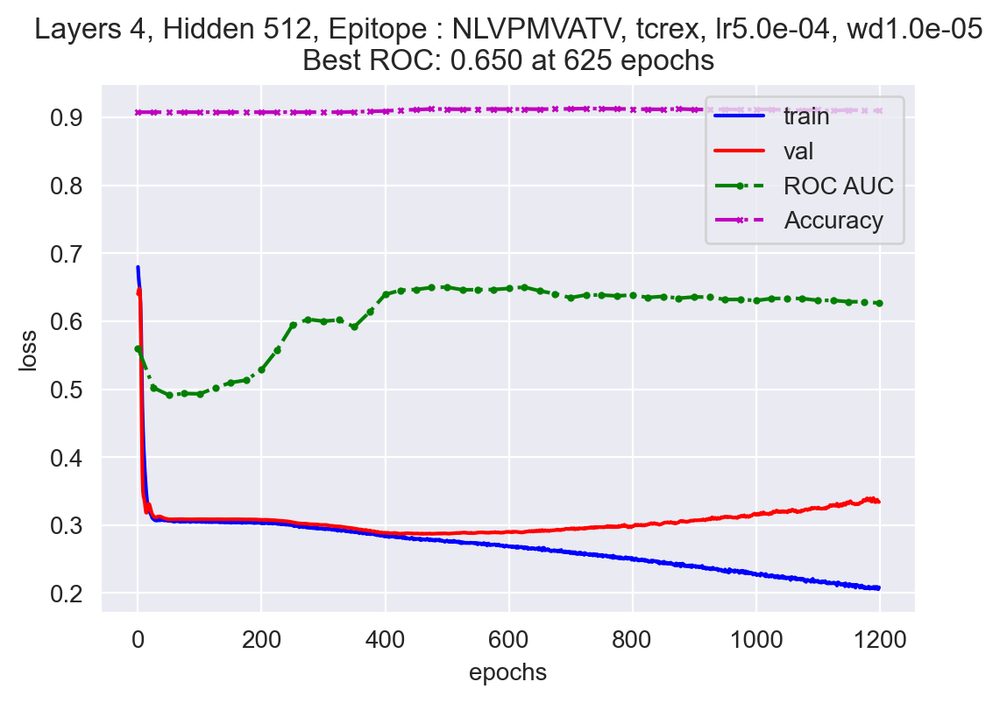

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.67%
Percent of positive class in val:   10.07%


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 2, Hidden 128, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.060e-01	Val: 6.050e-01
		ROC AUC :0.706, 	accuracy: 0.899
Epoch:25;	Train: 3.779e-01	Val: 3.427e-01
		ROC AUC :0.742, 	accuracy: 0.899
Epoch:50;	Train: 2.309e-01	Val: 3.015e-01
		ROC AUC :0.796, 	accuracy: 0.885
Epoch:75;	Train: 1.740e-01	Val: 3.272e-01
		ROC AUC :0.760, 	accuracy: 0.888
Epoch:100;	Train: 1.416e-01	Val: 3.418e-01
		ROC AUC :0.766, 	accuracy: 0.889
Epoch:125;	Train: 1.256e-01	Val: 3.729e-01
		ROC AUC :0.756, 	accuracy: 0.886
Epoch:150;	Train: 1.202e-01	Val: 4.096e-01
		ROC AUC :0.757, 	accuracy: 0.873
Epoch:175;	Train: 8.359e-02	Val: 4.134e-01
		ROC AUC :0.754, 	accuracy: 0.891
Epoch:200;	Train: 7.117e-02	Val: 4.345e-01
		ROC AUC :0.748, 	accuracy: 0.886
Epoch:225;	Train: 5.578e-02	Val: 4.644e-01
		ROC AUC :0.733, 	accuracy: 0.892
Epoch:250;	Train: 3.692e-02	Val: 4.802e-01
		ROC AUC :0.727, 	accuracy: 0.889
Epoch:275;	Train: 3.423e-02	Val: 4.894e-01
		ROC AUC :0.729, 	accuracy: 0.893
Epoch:300;	Train: 3.365e-02	Val: 5.020e-01
		ROC AUC :0.731, 	accurac

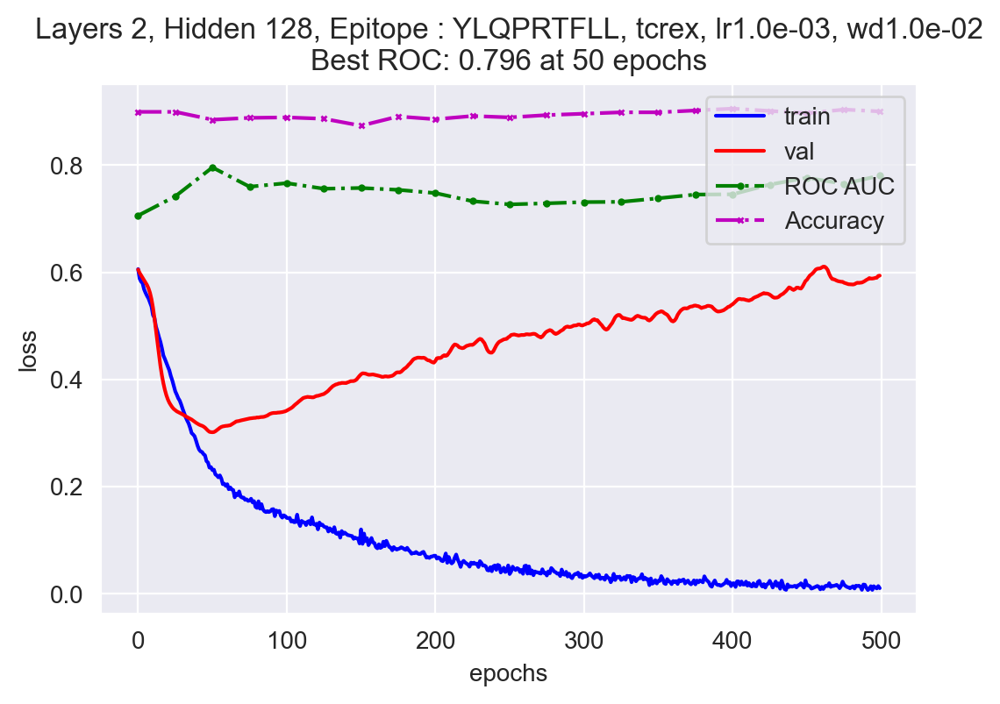

Layers 2, Hidden 128, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 8.382e-01	Val: 7.702e-01
		ROC AUC :0.631, 	accuracy: 0.899
Epoch:25;	Train: 7.106e-01	Val: 6.962e-01
		ROC AUC :0.801, 	accuracy: 0.696
Epoch:50;	Train: 5.189e-01	Val: 4.709e-01
		ROC AUC :0.749, 	accuracy: 0.898
Epoch:75;	Train: 3.677e-01	Val: 3.756e-01
		ROC AUC :0.816, 	accuracy: 0.900
Epoch:100;	Train: 2.770e-01	Val: 2.890e-01
		ROC AUC :0.836, 	accuracy: 0.906
Epoch:125;	Train: 2.274e-01	Val: 2.588e-01
		ROC AUC :0.833, 	accuracy: 0.910
Epoch:150;	Train: 2.109e-01	Val: 2.527e-01
		ROC AUC :0.834, 	accuracy: 0.908
Epoch:175;	Train: 1.986e-01	Val: 2.547e-01
		ROC AUC :0.836, 	accuracy: 0.907
Epoch:200;	Train: 1.900e-01	Val: 2.607e-01
		ROC AUC :0.830, 	accuracy: 0.904
Epoch:225;	Train: 1.766e-01	Val: 2.654e-01
		ROC AUC :0.827, 	accuracy: 0.904
Epoch:250;	Train: 1.786e-01	Val: 2.703e-01
		ROC AUC :0.821, 	accuracy: 0.905
Epoch:275;	Train: 1.492e-01	Val: 2.816e-01
		ROC AUC :0.813, 	accuracy: 0.904
Epoch:300;	Train: 1.417e-01	Val: 2.941e-01
		ROC AUC :0.807, 	accurac

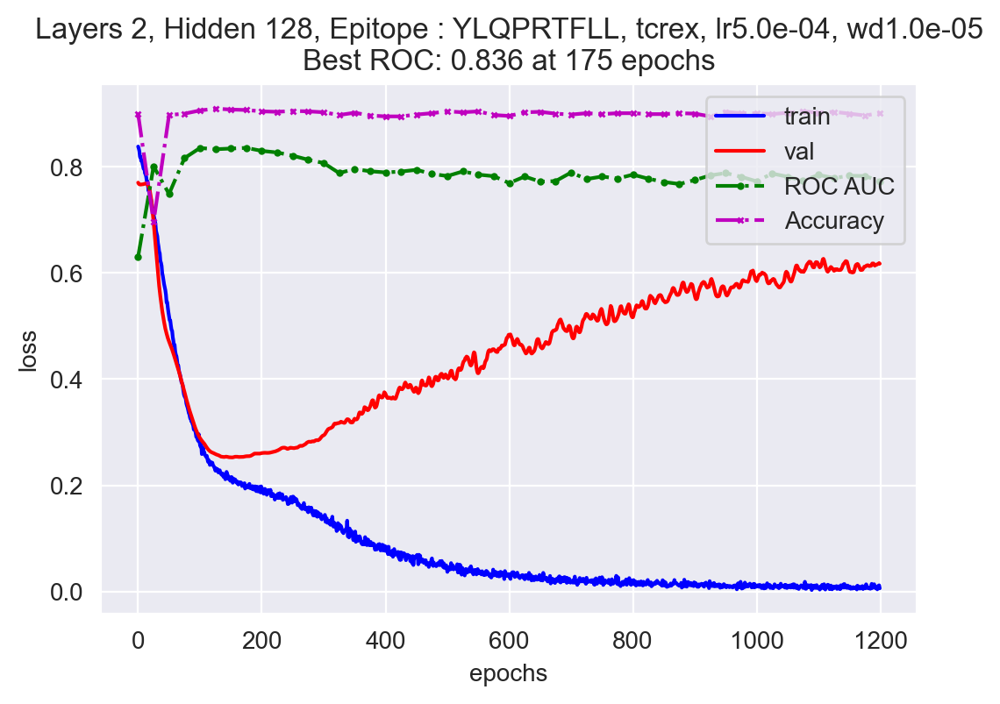

Layers 2, Hidden 256, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.128e-01	Val: 5.962e-01
		ROC AUC :0.730, 	accuracy: 0.899
Epoch:25;	Train: 2.516e-01	Val: 3.054e-01
		ROC AUC :0.789, 	accuracy: 0.886
Epoch:50;	Train: 1.731e-01	Val: 3.001e-01
		ROC AUC :0.789, 	accuracy: 0.893
Epoch:75;	Train: 1.487e-01	Val: 3.283e-01
		ROC AUC :0.802, 	accuracy: 0.893
Epoch:100;	Train: 1.209e-01	Val: 3.428e-01
		ROC AUC :0.807, 	accuracy: 0.893
Epoch:125;	Train: 1.117e-01	Val: 3.729e-01
		ROC AUC :0.805, 	accuracy: 0.888
Epoch:150;	Train: 7.960e-02	Val: 3.838e-01
		ROC AUC :0.809, 	accuracy: 0.894
Epoch:175;	Train: 6.127e-02	Val: 4.099e-01
		ROC AUC :0.808, 	accuracy: 0.894
Epoch:200;	Train: 4.631e-02	Val: 4.268e-01
		ROC AUC :0.800, 	accuracy: 0.894
Epoch:225;	Train: 4.385e-02	Val: 4.736e-01
		ROC AUC :0.779, 	accuracy: 0.887
Epoch:250;	Train: 3.089e-02	Val: 4.753e-01
		ROC AUC :0.753, 	accuracy: 0.903
Epoch:275;	Train: 2.684e-02	Val: 5.021e-01
		ROC AUC :0.778, 	accuracy: 0.899
Epoch:300;	Train: 2.020e-02	Val: 5.517e-01
		ROC AUC :0.778, 	accurac

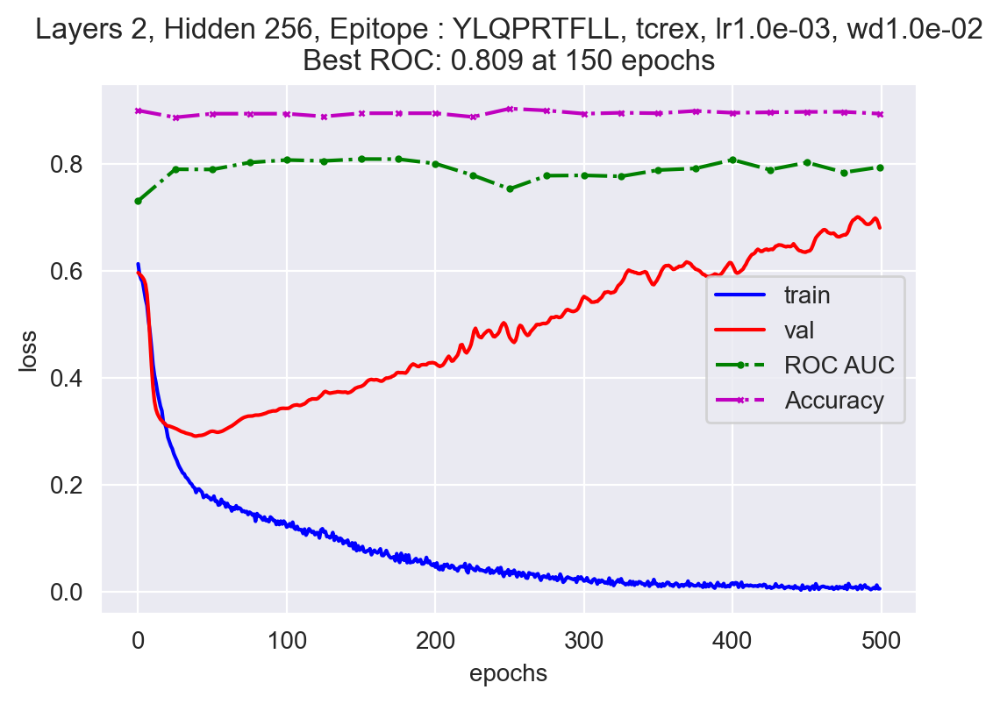

Layers 2, Hidden 256, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.177e-01	Val: 6.939e-01
		ROC AUC :0.694, 	accuracy: 0.899
Epoch:25;	Train: 5.028e-01	Val: 4.125e-01
		ROC AUC :0.625, 	accuracy: 0.899
Epoch:50;	Train: 2.990e-01	Val: 3.338e-01
		ROC AUC :0.795, 	accuracy: 0.904
Epoch:75;	Train: 2.267e-01	Val: 2.687e-01
		ROC AUC :0.807, 	accuracy: 0.910
Epoch:100;	Train: 1.960e-01	Val: 2.530e-01
		ROC AUC :0.838, 	accuracy: 0.910
Epoch:125;	Train: 1.877e-01	Val: 2.612e-01
		ROC AUC :0.833, 	accuracy: 0.904
Epoch:150;	Train: 1.766e-01	Val: 2.643e-01
		ROC AUC :0.835, 	accuracy: 0.905
Epoch:175;	Train: 1.653e-01	Val: 2.766e-01
		ROC AUC :0.820, 	accuracy: 0.904
Epoch:200;	Train: 1.489e-01	Val: 2.911e-01
		ROC AUC :0.816, 	accuracy: 0.904
Epoch:225;	Train: 1.314e-01	Val: 3.162e-01
		ROC AUC :0.804, 	accuracy: 0.904
Epoch:250;	Train: 1.147e-01	Val: 3.339e-01
		ROC AUC :0.791, 	accuracy: 0.904
Epoch:275;	Train: 9.257e-02	Val: 3.649e-01
		ROC AUC :0.791, 	accuracy: 0.901
Epoch:300;	Train: 8.921e-02	Val: 4.008e-01
		ROC AUC :0.784, 	accurac

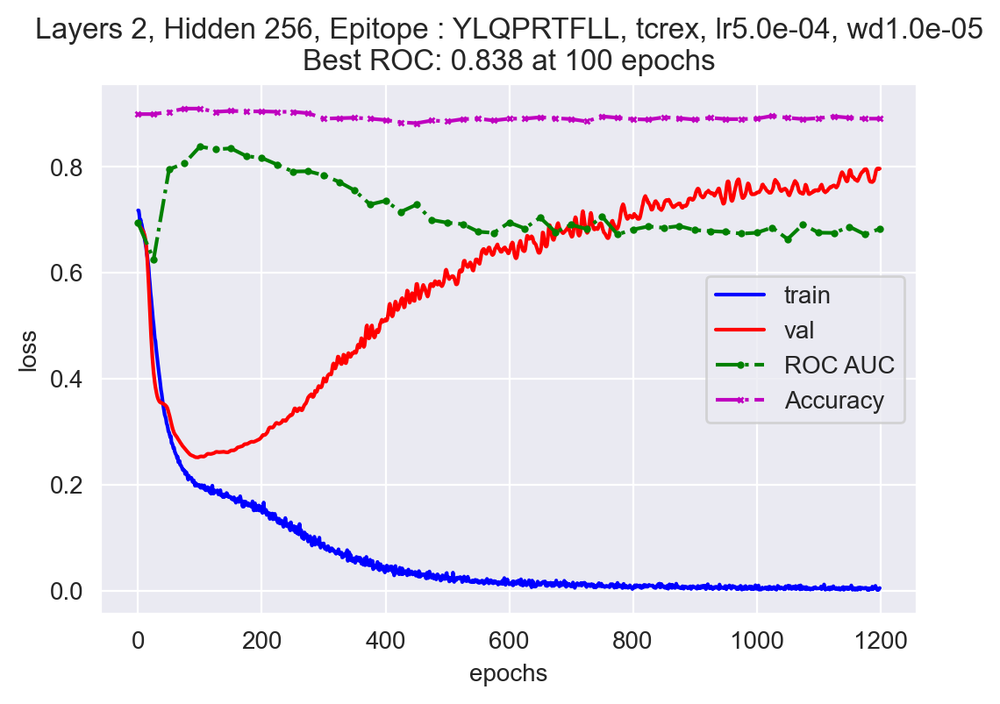

Layers 2, Hidden 512, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.045e-01	Val: 6.635e-01
		ROC AUC :0.767, 	accuracy: 0.899
Epoch:25;	Train: 2.044e-01	Val: 3.007e-01
		ROC AUC :0.807, 	accuracy: 0.886
Epoch:50;	Train: 1.662e-01	Val: 3.078e-01
		ROC AUC :0.794, 	accuracy: 0.901
Epoch:75;	Train: 1.343e-01	Val: 3.185e-01
		ROC AUC :0.787, 	accuracy: 0.893
Epoch:100;	Train: 1.176e-01	Val: 3.783e-01
		ROC AUC :0.769, 	accuracy: 0.890
Epoch:125;	Train: 8.728e-02	Val: 4.072e-01
		ROC AUC :0.776, 	accuracy: 0.890
Epoch:150;	Train: 7.091e-02	Val: 4.263e-01
		ROC AUC :0.769, 	accuracy: 0.891
Epoch:175;	Train: 5.371e-02	Val: 4.548e-01
		ROC AUC :0.750, 	accuracy: 0.893
Epoch:200;	Train: 4.092e-02	Val: 4.760e-01
		ROC AUC :0.747, 	accuracy: 0.894
Epoch:225;	Train: 2.880e-02	Val: 5.158e-01
		ROC AUC :0.762, 	accuracy: 0.892
Epoch:250;	Train: 2.562e-02	Val: 5.380e-01
		ROC AUC :0.761, 	accuracy: 0.897
Epoch:275;	Train: 1.853e-02	Val: 5.912e-01
		ROC AUC :0.750, 	accuracy: 0.893
Epoch:300;	Train: 1.414e-02	Val: 5.711e-01
		ROC AUC :0.767, 	accurac

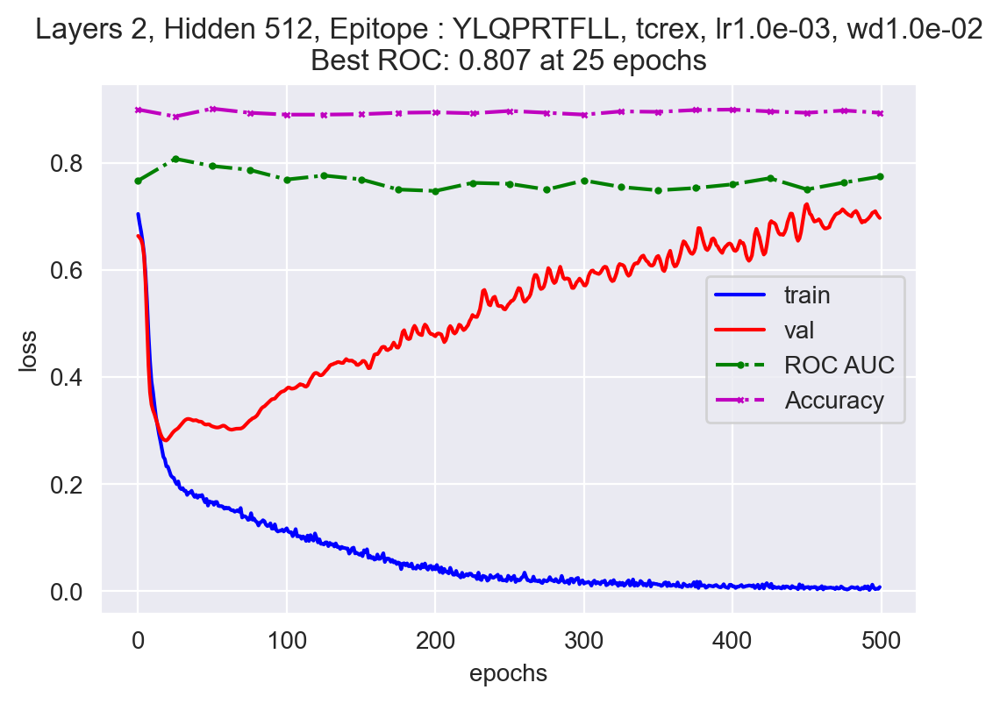

Layers 2, Hidden 512, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 8.166e-01	Val: 7.650e-01
		ROC AUC :0.735, 	accuracy: 0.899
Epoch:25;	Train: 5.041e-01	Val: 4.966e-01
		ROC AUC :0.809, 	accuracy: 0.873
Epoch:50;	Train: 2.950e-01	Val: 3.372e-01
		ROC AUC :0.813, 	accuracy: 0.900
Epoch:75;	Train: 2.262e-01	Val: 2.756e-01
		ROC AUC :0.818, 	accuracy: 0.904
Epoch:100;	Train: 1.958e-01	Val: 2.657e-01
		ROC AUC :0.819, 	accuracy: 0.904
Epoch:125;	Train: 1.849e-01	Val: 2.736e-01
		ROC AUC :0.816, 	accuracy: 0.903
Epoch:150;	Train: 1.696e-01	Val: 2.752e-01
		ROC AUC :0.816, 	accuracy: 0.904
Epoch:175;	Train: 1.486e-01	Val: 2.895e-01
		ROC AUC :0.809, 	accuracy: 0.905
Epoch:200;	Train: 1.412e-01	Val: 3.216e-01
		ROC AUC :0.783, 	accuracy: 0.898
Epoch:225;	Train: 1.112e-01	Val: 3.598e-01
		ROC AUC :0.768, 	accuracy: 0.894
Epoch:250;	Train: 9.672e-02	Val: 3.886e-01
		ROC AUC :0.714, 	accuracy: 0.897
Epoch:275;	Train: 8.590e-02	Val: 4.422e-01
		ROC AUC :0.710, 	accuracy: 0.888
Epoch:300;	Train: 6.936e-02	Val: 4.428e-01
		ROC AUC :0.717, 	accurac

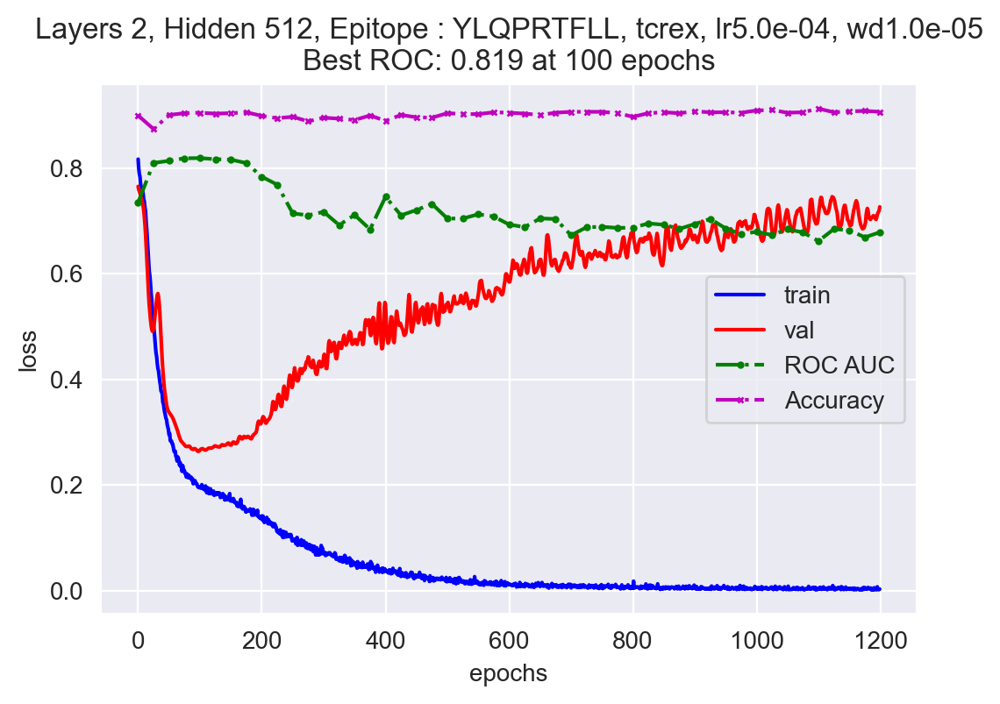

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 3, Hidden 128, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.885e-01	Val: 6.612e-01
		ROC AUC :0.671, 	accuracy: 0.899
Epoch:25;	Train: 4.390e-01	Val: 3.678e-01
		ROC AUC :0.766, 	accuracy: 0.898
Epoch:50;	Train: 2.525e-01	Val: 3.001e-01
		ROC AUC :0.811, 	accuracy: 0.892
Epoch:75;	Train: 1.858e-01	Val: 2.967e-01
		ROC AUC :0.791, 	accuracy: 0.892
Epoch:100;	Train: 1.586e-01	Val: 3.223e-01
		ROC AUC :0.791, 	accuracy: 0.886
Epoch:125;	Train: 1.430e-01	Val: 3.462e-01
		ROC AUC :0.781, 	accuracy: 0.886
Epoch:150;	Train: 1.218e-01	Val: 3.387e-01
		ROC AUC :0.797, 	accuracy: 0.894
Epoch:175;	Train: 1.010e-01	Val: 3.565e-01
		ROC AUC :0.787, 	accuracy: 0.897
Epoch:200;	Train: 9.469e-02	Val: 3.908e-01
		ROC AUC :0.797, 	accuracy: 0.889
Epoch:225;	Train: 8.475e-02	Val: 3.951e-01
		ROC AUC :0.800, 	accuracy: 0.890
Epoch:250;	Train: 6.888e-02	Val: 3.929e-01
		ROC AUC :0.796, 	accuracy: 0.899
Epoch:275;	Train: 6.653e-02	Val: 4.291e-01
		ROC AUC :0.744, 	accuracy: 0.894
Epoch:300;	Train: 5.079e-02	Val: 4.374e-01
		ROC AUC :0.758, 	accurac

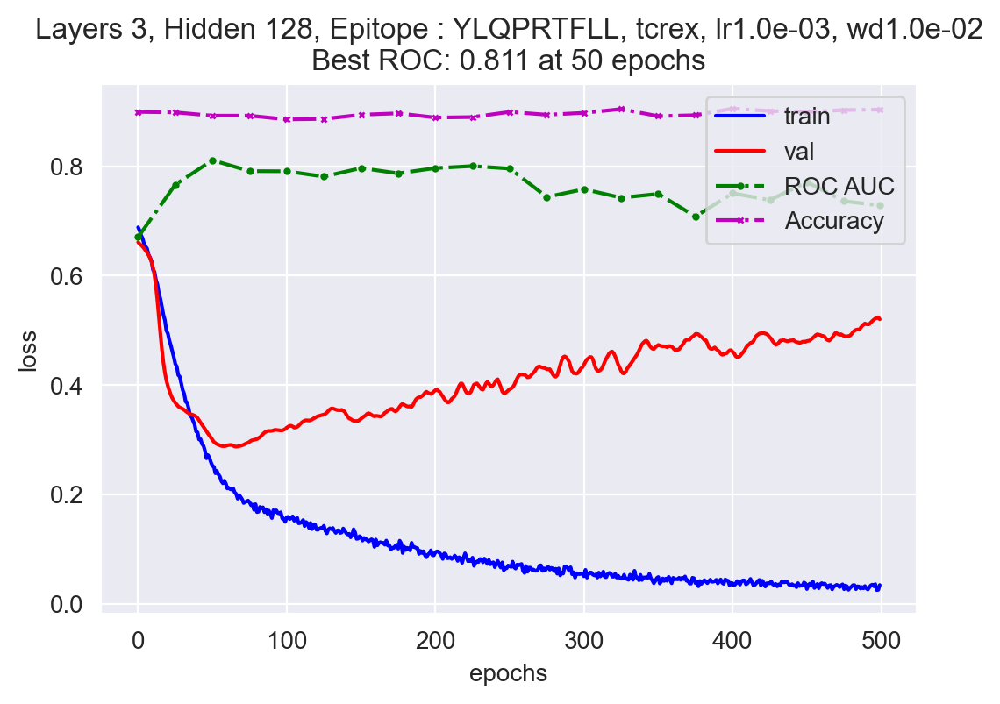

Layers 3, Hidden 128, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.931e-01	Val: 6.940e-01
		ROC AUC :0.658, 	accuracy: 0.899
Epoch:25;	Train: 6.342e-01	Val: 6.384e-01
		ROC AUC :0.827, 	accuracy: 0.819
Epoch:50;	Train: 5.639e-01	Val: 5.646e-01
		ROC AUC :0.838, 	accuracy: 0.832
Epoch:75;	Train: 4.644e-01	Val: 5.634e-01
		ROC AUC :0.802, 	accuracy: 0.825
Epoch:100;	Train: 3.918e-01	Val: 4.167e-01
		ROC AUC :0.798, 	accuracy: 0.873
Epoch:125;	Train: 3.240e-01	Val: 3.451e-01
		ROC AUC :0.811, 	accuracy: 0.897
Epoch:150;	Train: 2.715e-01	Val: 3.057e-01
		ROC AUC :0.789, 	accuracy: 0.903
Epoch:175;	Train: 2.256e-01	Val: 2.907e-01
		ROC AUC :0.828, 	accuracy: 0.900
Epoch:200;	Train: 1.860e-01	Val: 2.918e-01
		ROC AUC :0.832, 	accuracy: 0.900
Epoch:225;	Train: 1.616e-01	Val: 3.015e-01
		ROC AUC :0.822, 	accuracy: 0.904
Epoch:250;	Train: 1.475e-01	Val: 3.241e-01
		ROC AUC :0.827, 	accuracy: 0.899
Epoch:275;	Train: 1.277e-01	Val: 3.140e-01
		ROC AUC :0.824, 	accuracy: 0.908
Epoch:300;	Train: 1.209e-01	Val: 3.280e-01
		ROC AUC :0.814, 	accurac

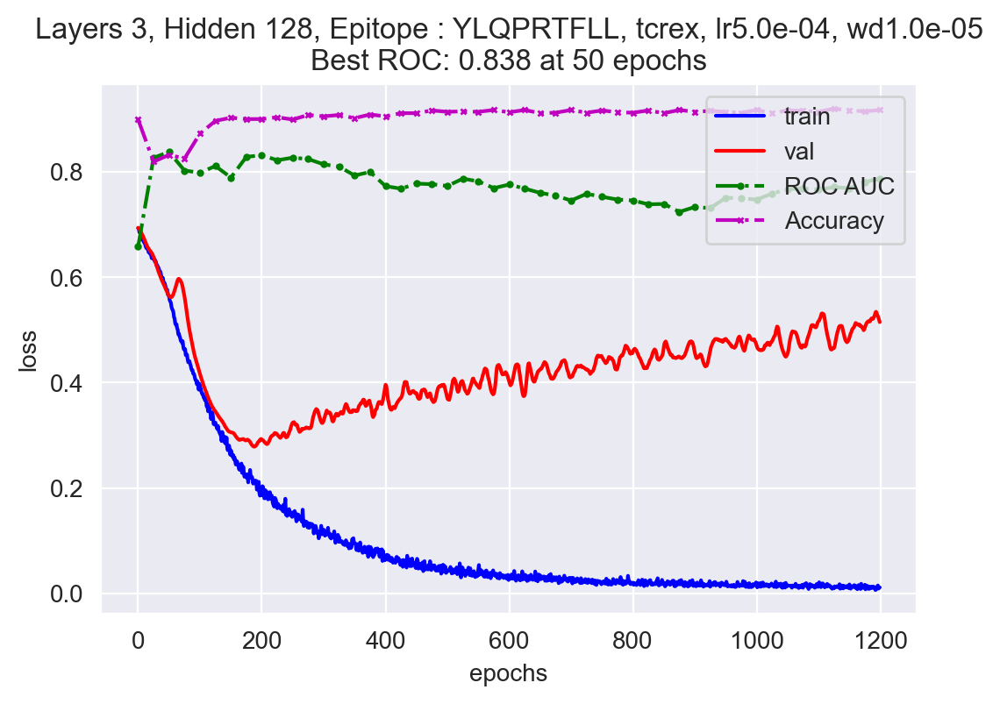

Layers 3, Hidden 256, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.119e-01	Val: 6.747e-01
		ROC AUC :0.736, 	accuracy: 0.899
Epoch:25;	Train: 2.662e-01	Val: 2.921e-01
		ROC AUC :0.765, 	accuracy: 0.894
Epoch:50;	Train: 1.753e-01	Val: 3.157e-01
		ROC AUC :0.801, 	accuracy: 0.888
Epoch:75;	Train: 1.464e-01	Val: 3.313e-01
		ROC AUC :0.800, 	accuracy: 0.892
Epoch:100;	Train: 1.287e-01	Val: 3.688e-01
		ROC AUC :0.786, 	accuracy: 0.880
Epoch:125;	Train: 1.104e-01	Val: 3.898e-01
		ROC AUC :0.764, 	accuracy: 0.886
Epoch:150;	Train: 9.220e-02	Val: 4.005e-01
		ROC AUC :0.780, 	accuracy: 0.884
Epoch:175;	Train: 6.741e-02	Val: 4.437e-01
		ROC AUC :0.750, 	accuracy: 0.890
Epoch:200;	Train: 5.484e-02	Val: 4.711e-01
		ROC AUC :0.734, 	accuracy: 0.896
Epoch:225;	Train: 3.856e-02	Val: 5.084e-01
		ROC AUC :0.731, 	accuracy: 0.887
Epoch:250;	Train: 3.960e-02	Val: 5.295e-01
		ROC AUC :0.753, 	accuracy: 0.892
Epoch:275;	Train: 2.914e-02	Val: 5.573e-01
		ROC AUC :0.744, 	accuracy: 0.887
Epoch:300;	Train: 1.514e-02	Val: 5.803e-01
		ROC AUC :0.741, 	accurac

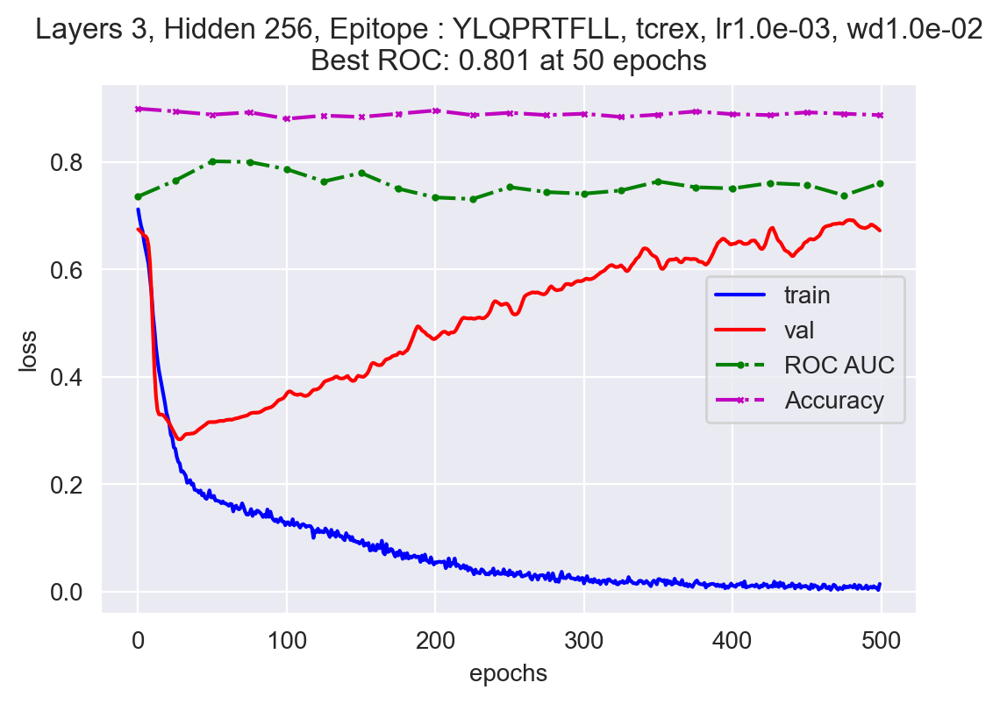

Layers 3, Hidden 256, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.327e-01	Val: 7.127e-01
		ROC AUC :0.683, 	accuracy: 0.899
Epoch:25;	Train: 5.072e-01	Val: 4.083e-01
		ROC AUC :0.675, 	accuracy: 0.899
Epoch:50;	Train: 3.227e-01	Val: 3.602e-01
		ROC AUC :0.808, 	accuracy: 0.901
Epoch:75;	Train: 2.383e-01	Val: 2.727e-01
		ROC AUC :0.832, 	accuracy: 0.902
Epoch:100;	Train: 2.144e-01	Val: 2.606e-01
		ROC AUC :0.828, 	accuracy: 0.904
Epoch:125;	Train: 1.926e-01	Val: 2.627e-01
		ROC AUC :0.820, 	accuracy: 0.907
Epoch:150;	Train: 1.779e-01	Val: 2.694e-01
		ROC AUC :0.822, 	accuracy: 0.903
Epoch:175;	Train: 1.705e-01	Val: 2.706e-01
		ROC AUC :0.817, 	accuracy: 0.906
Epoch:200;	Train: 1.552e-01	Val: 2.767e-01
		ROC AUC :0.796, 	accuracy: 0.905
Epoch:225;	Train: 1.342e-01	Val: 3.039e-01
		ROC AUC :0.793, 	accuracy: 0.899
Epoch:250;	Train: 1.252e-01	Val: 3.298e-01
		ROC AUC :0.768, 	accuracy: 0.900
Epoch:275;	Train: 1.017e-01	Val: 3.564e-01
		ROC AUC :0.736, 	accuracy: 0.900
Epoch:300;	Train: 8.895e-02	Val: 3.944e-01
		ROC AUC :0.726, 	accurac

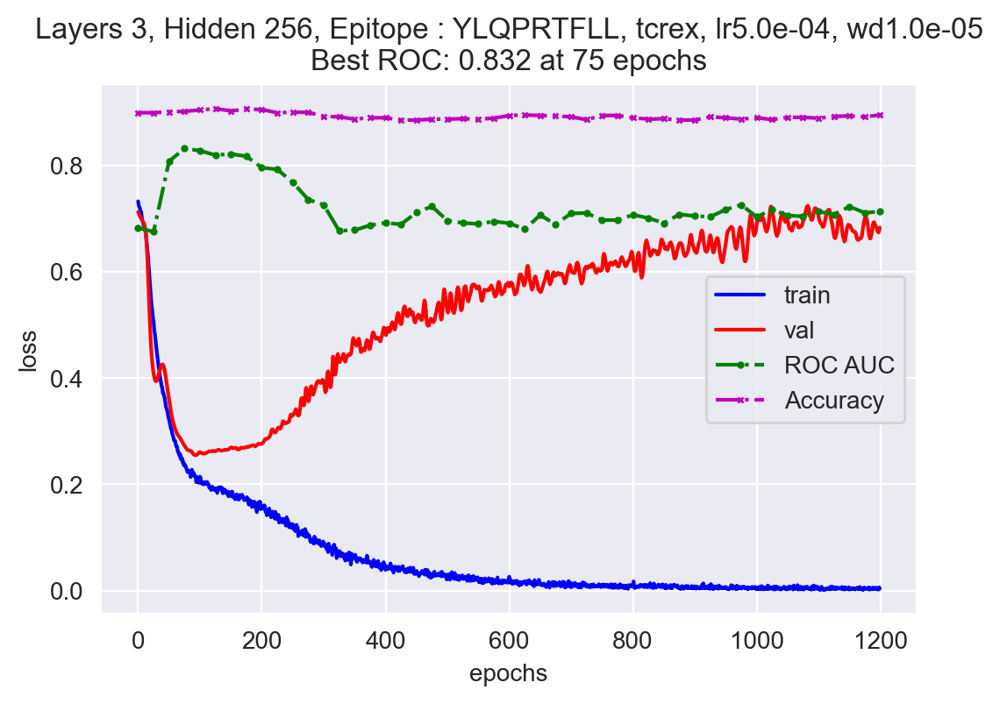

Layers 3, Hidden 512, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.716e-01	Val: 7.334e-01
		ROC AUC :0.725, 	accuracy: 0.899
Epoch:25;	Train: 2.910e-01	Val: 3.596e-01
		ROC AUC :0.773, 	accuracy: 0.897
Epoch:50;	Train: 2.173e-01	Val: 2.708e-01
		ROC AUC :0.795, 	accuracy: 0.906
Epoch:75;	Train: 1.966e-01	Val: 2.556e-01
		ROC AUC :0.812, 	accuracy: 0.910
Epoch:100;	Train: 1.838e-01	Val: 2.604e-01
		ROC AUC :0.819, 	accuracy: 0.910
Epoch:125;	Train: 1.646e-01	Val: 2.562e-01
		ROC AUC :0.819, 	accuracy: 0.913
Epoch:150;	Train: 1.516e-01	Val: 2.904e-01
		ROC AUC :0.795, 	accuracy: 0.908
Epoch:175;	Train: 1.384e-01	Val: 2.960e-01
		ROC AUC :0.763, 	accuracy: 0.909
Epoch:200;	Train: 1.169e-01	Val: 3.628e-01
		ROC AUC :0.759, 	accuracy: 0.900
Epoch:225;	Train: 1.000e-01	Val: 3.437e-01
		ROC AUC :0.781, 	accuracy: 0.907
Epoch:250;	Train: 8.636e-02	Val: 4.191e-01
		ROC AUC :0.793, 	accuracy: 0.904
Epoch:275;	Train: 4.685e-02	Val: 4.021e-01
		ROC AUC :0.787, 	accuracy: 0.909
Epoch:300;	Train: 3.802e-02	Val: 4.221e-01
		ROC AUC :0.775, 	accurac

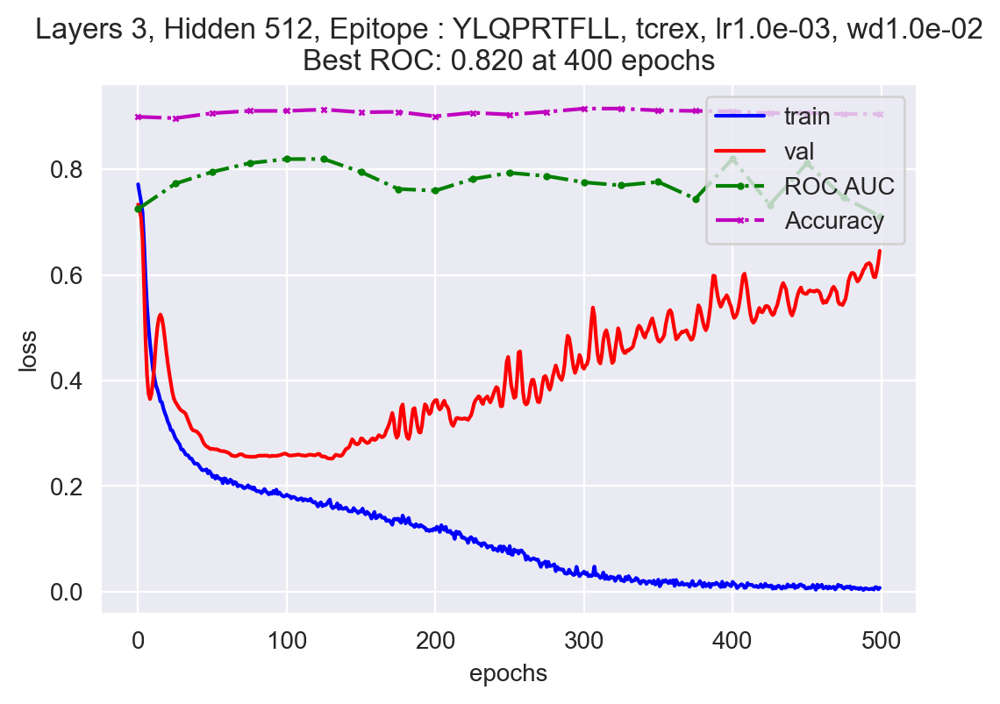

Layers 3, Hidden 512, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 7.826e-01	Val: 7.137e-01
		ROC AUC :0.751, 	accuracy: 0.899
Epoch:25;	Train: 3.012e-01	Val: 2.921e-01
		ROC AUC :0.754, 	accuracy: 0.899
Epoch:50;	Train: 1.939e-01	Val: 2.797e-01
		ROC AUC :0.808, 	accuracy: 0.901
Epoch:75;	Train: 1.794e-01	Val: 2.945e-01
		ROC AUC :0.804, 	accuracy: 0.904
Epoch:100;	Train: 1.676e-01	Val: 3.052e-01
		ROC AUC :0.791, 	accuracy: 0.898
Epoch:125;	Train: 1.479e-01	Val: 3.317e-01
		ROC AUC :0.786, 	accuracy: 0.890
Epoch:150;	Train: 1.472e-01	Val: 3.482e-01
		ROC AUC :0.780, 	accuracy: 0.882
Epoch:175;	Train: 1.234e-01	Val: 3.663e-01
		ROC AUC :0.770, 	accuracy: 0.885
Epoch:200;	Train: 1.032e-01	Val: 3.713e-01
		ROC AUC :0.758, 	accuracy: 0.888
Epoch:225;	Train: 9.421e-02	Val: 3.868e-01
		ROC AUC :0.769, 	accuracy: 0.889
Epoch:250;	Train: 7.493e-02	Val: 4.060e-01
		ROC AUC :0.757, 	accuracy: 0.898
Epoch:275;	Train: 5.944e-02	Val: 4.217e-01
		ROC AUC :0.753, 	accuracy: 0.898
Epoch:300;	Train: 6.102e-02	Val: 4.291e-01
		ROC AUC :0.755, 	accurac

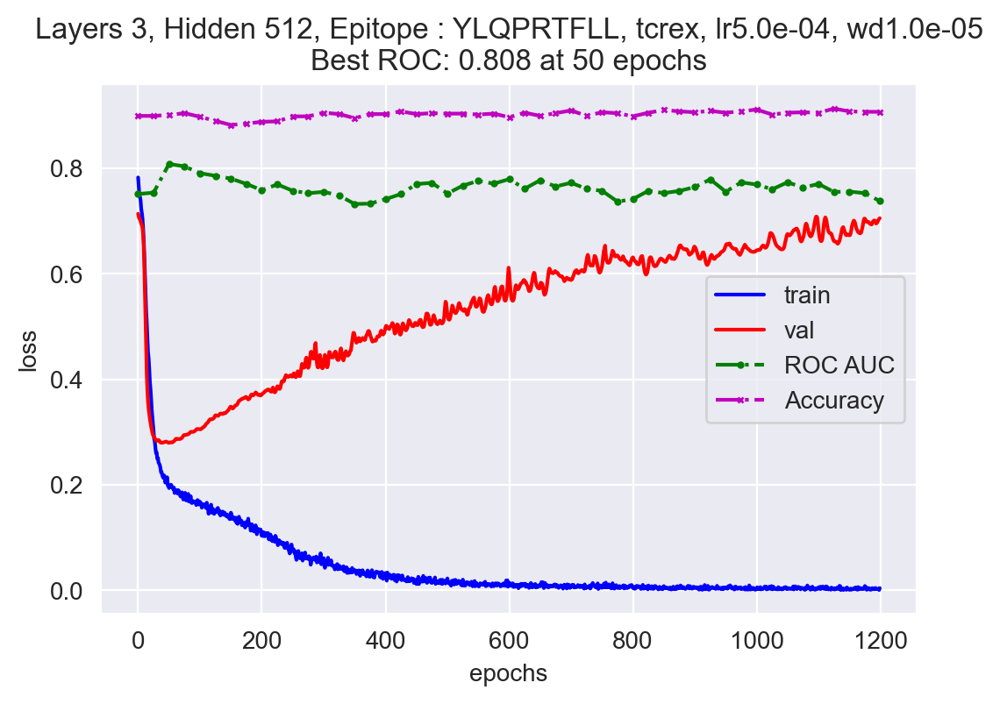

  0%|          | 0/3 [00:00<?, ?it/s]

Layers 4, Hidden 128, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.633e-01	Val: 6.442e-01
		ROC AUC :0.713, 	accuracy: 0.899
Epoch:25;	Train: 3.952e-01	Val: 3.398e-01
		ROC AUC :0.739, 	accuracy: 0.878
Epoch:50;	Train: 2.406e-01	Val: 3.008e-01
		ROC AUC :0.789, 	accuracy: 0.886
Epoch:75;	Train: 1.754e-01	Val: 3.172e-01
		ROC AUC :0.773, 	accuracy: 0.888
Epoch:100;	Train: 1.507e-01	Val: 3.339e-01
		ROC AUC :0.768, 	accuracy: 0.885
Epoch:125;	Train: 1.409e-01	Val: 3.524e-01
		ROC AUC :0.767, 	accuracy: 0.888
Epoch:150;	Train: 1.326e-01	Val: 3.604e-01
		ROC AUC :0.760, 	accuracy: 0.893
Epoch:175;	Train: 1.201e-01	Val: 3.867e-01
		ROC AUC :0.757, 	accuracy: 0.891
Epoch:200;	Train: 9.753e-02	Val: 3.849e-01
		ROC AUC :0.768, 	accuracy: 0.894
Epoch:225;	Train: 9.261e-02	Val: 3.952e-01
		ROC AUC :0.782, 	accuracy: 0.893
Epoch:250;	Train: 9.186e-02	Val: 4.043e-01
		ROC AUC :0.791, 	accuracy: 0.893
Epoch:275;	Train: 6.102e-02	Val: 4.072e-01
		ROC AUC :0.789, 	accuracy: 0.898
Epoch:300;	Train: 5.597e-02	Val: 4.248e-01
		ROC AUC :0.786, 	accurac

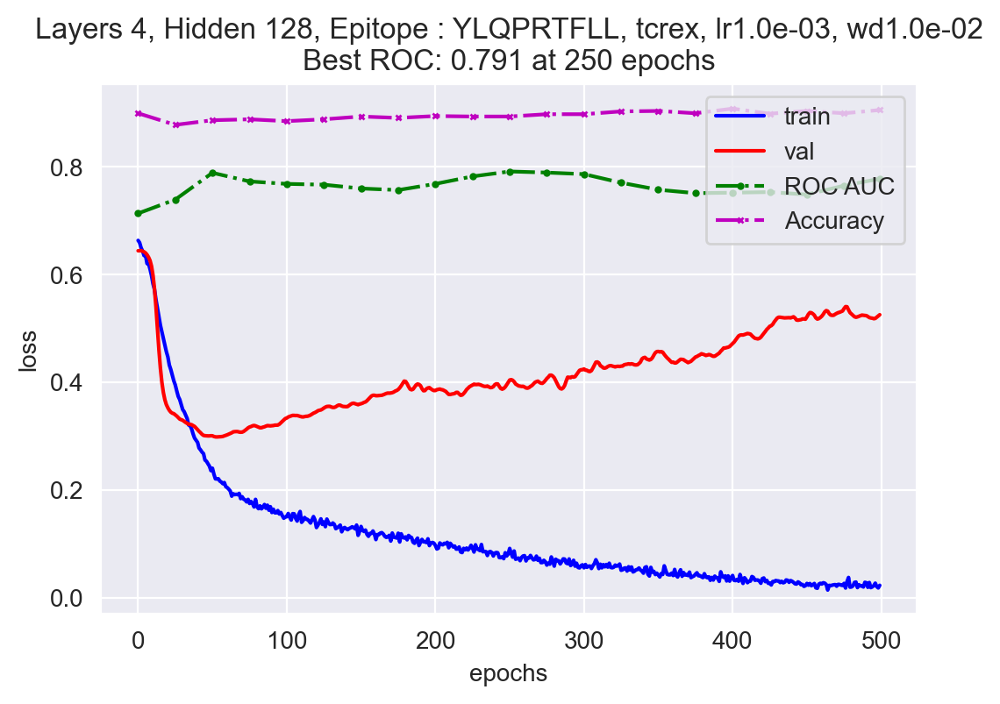

Layers 4, Hidden 128, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.452e-01	Val: 6.246e-01
		ROC AUC :0.561, 	accuracy: 0.899
Epoch:25;	Train: 5.165e-01	Val: 4.528e-01
		ROC AUC :0.651, 	accuracy: 0.899
Epoch:50;	Train: 3.844e-01	Val: 3.866e-01
		ROC AUC :0.785, 	accuracy: 0.899
Epoch:75;	Train: 3.104e-01	Val: 3.296e-01
		ROC AUC :0.813, 	accuracy: 0.899
Epoch:100;	Train: 2.585e-01	Val: 2.787e-01
		ROC AUC :0.833, 	accuracy: 0.902
Epoch:125;	Train: 2.332e-01	Val: 2.575e-01
		ROC AUC :0.834, 	accuracy: 0.906
Epoch:150;	Train: 2.072e-01	Val: 2.536e-01
		ROC AUC :0.833, 	accuracy: 0.909
Epoch:175;	Train: 1.948e-01	Val: 2.556e-01
		ROC AUC :0.835, 	accuracy: 0.906
Epoch:200;	Train: 1.831e-01	Val: 2.626e-01
		ROC AUC :0.829, 	accuracy: 0.904
Epoch:225;	Train: 1.808e-01	Val: 2.630e-01
		ROC AUC :0.830, 	accuracy: 0.905
Epoch:250;	Train: 1.691e-01	Val: 2.655e-01
		ROC AUC :0.833, 	accuracy: 0.911
Epoch:275;	Train: 1.530e-01	Val: 2.720e-01
		ROC AUC :0.830, 	accuracy: 0.905
Epoch:300;	Train: 1.318e-01	Val: 2.855e-01
		ROC AUC :0.826, 	accurac

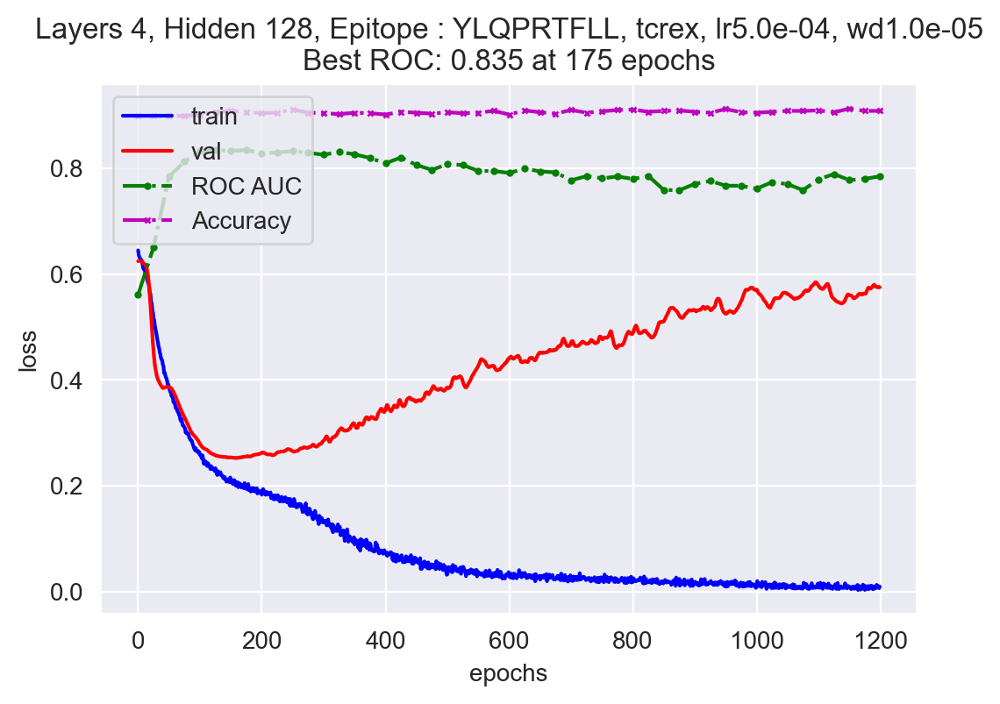

Layers 4, Hidden 256, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.212e-01	Val: 5.740e-01
		ROC AUC :0.655, 	accuracy: 0.899
Epoch:25;	Train: 2.688e-01	Val: 2.881e-01
		ROC AUC :0.781, 	accuracy: 0.899
Epoch:50;	Train: 1.845e-01	Val: 3.004e-01
		ROC AUC :0.822, 	accuracy: 0.885
Epoch:75;	Train: 1.506e-01	Val: 3.276e-01
		ROC AUC :0.799, 	accuracy: 0.891
Epoch:100;	Train: 1.303e-01	Val: 3.453e-01
		ROC AUC :0.810, 	accuracy: 0.878
Epoch:125;	Train: 1.128e-01	Val: 3.710e-01
		ROC AUC :0.783, 	accuracy: 0.879
Epoch:150;	Train: 9.981e-02	Val: 3.850e-01
		ROC AUC :0.788, 	accuracy: 0.882
Epoch:175;	Train: 8.507e-02	Val: 3.950e-01
		ROC AUC :0.782, 	accuracy: 0.885
Epoch:200;	Train: 5.892e-02	Val: 4.152e-01
		ROC AUC :0.761, 	accuracy: 0.892
Epoch:225;	Train: 5.515e-02	Val: 4.189e-01
		ROC AUC :0.780, 	accuracy: 0.896
Epoch:250;	Train: 4.778e-02	Val: 4.485e-01
		ROC AUC :0.755, 	accuracy: 0.897
Epoch:275;	Train: 3.725e-02	Val: 4.265e-01
		ROC AUC :0.759, 	accuracy: 0.898
Epoch:300;	Train: 4.067e-02	Val: 4.884e-01
		ROC AUC :0.752, 	accurac

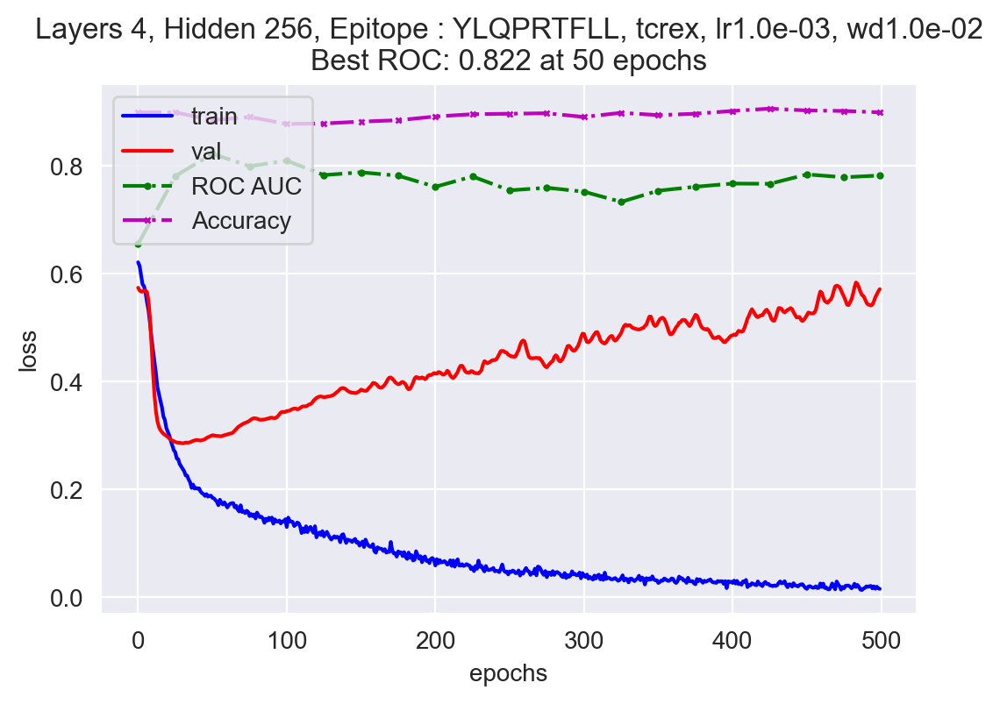

Layers 4, Hidden 256, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.118e-01	Val: 6.026e-01
		ROC AUC :0.635, 	accuracy: 0.899
Epoch:25;	Train: 3.982e-01	Val: 3.418e-01
		ROC AUC :0.596, 	accuracy: 0.898
Epoch:50;	Train: 2.574e-01	Val: 3.016e-01
		ROC AUC :0.795, 	accuracy: 0.899
Epoch:75;	Train: 2.012e-01	Val: 2.723e-01
		ROC AUC :0.794, 	accuracy: 0.905
Epoch:100;	Train: 1.849e-01	Val: 2.881e-01
		ROC AUC :0.790, 	accuracy: 0.898
Epoch:125;	Train: 1.713e-01	Val: 2.924e-01
		ROC AUC :0.789, 	accuracy: 0.898
Epoch:150;	Train: 1.582e-01	Val: 3.046e-01
		ROC AUC :0.784, 	accuracy: 0.895
Epoch:175;	Train: 1.501e-01	Val: 3.271e-01
		ROC AUC :0.776, 	accuracy: 0.889
Epoch:200;	Train: 1.376e-01	Val: 3.280e-01
		ROC AUC :0.776, 	accuracy: 0.892
Epoch:225;	Train: 1.255e-01	Val: 3.400e-01
		ROC AUC :0.774, 	accuracy: 0.893
Epoch:250;	Train: 1.175e-01	Val: 3.550e-01
		ROC AUC :0.765, 	accuracy: 0.893
Epoch:275;	Train: 1.010e-01	Val: 3.653e-01
		ROC AUC :0.770, 	accuracy: 0.894
Epoch:300;	Train: 9.745e-02	Val: 3.927e-01
		ROC AUC :0.748, 	accurac

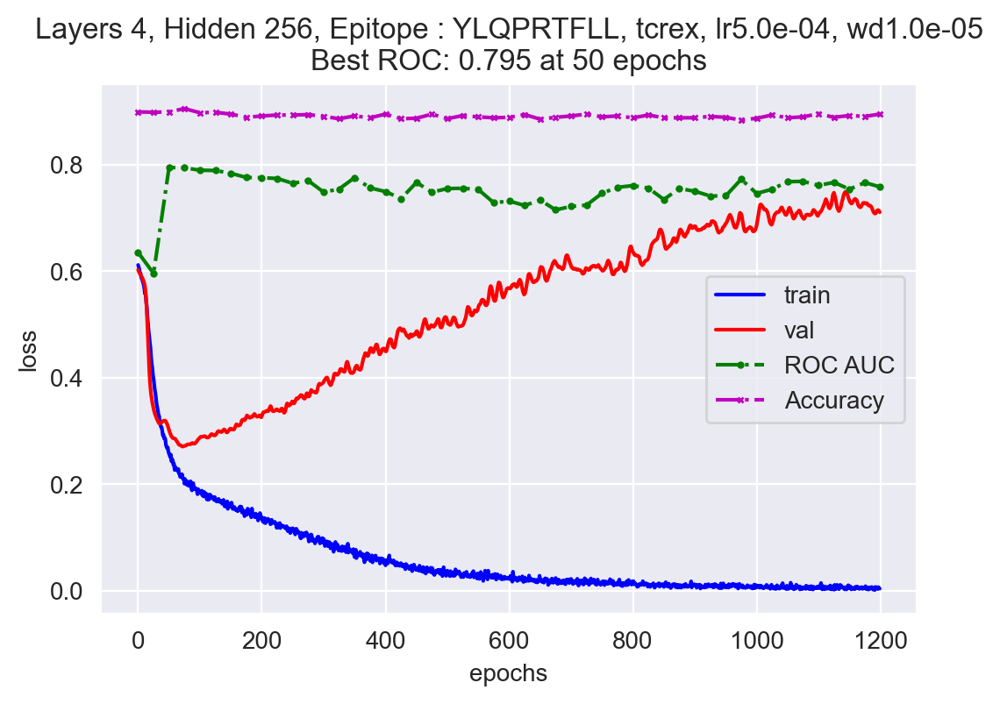

Layers 4, Hidden 512, Epitope : YLQPRTFLL, tcrex, lr1.0e-03, wd1.0e-02
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.508e-01	Val: 7.255e-01
		ROC AUC :0.664, 	accuracy: 0.899
Epoch:25;	Train: 2.163e-01	Val: 3.286e-01
		ROC AUC :0.788, 	accuracy: 0.878
Epoch:50;	Train: 1.762e-01	Val: 3.127e-01
		ROC AUC :0.794, 	accuracy: 0.886
Epoch:75;	Train: 1.521e-01	Val: 3.156e-01
		ROC AUC :0.792, 	accuracy: 0.891
Epoch:100;	Train: 1.353e-01	Val: 3.517e-01
		ROC AUC :0.768, 	accuracy: 0.886
Epoch:125;	Train: 1.077e-01	Val: 3.782e-01
		ROC AUC :0.743, 	accuracy: 0.888
Epoch:150;	Train: 9.881e-02	Val: 4.048e-01
		ROC AUC :0.735, 	accuracy: 0.888
Epoch:175;	Train: 6.880e-02	Val: 4.310e-01
		ROC AUC :0.735, 	accuracy: 0.892
Epoch:200;	Train: 6.038e-02	Val: 4.578e-01
		ROC AUC :0.713, 	accuracy: 0.896
Epoch:225;	Train: 4.447e-02	Val: 4.668e-01
		ROC AUC :0.709, 	accuracy: 0.892
Epoch:250;	Train: 4.203e-02	Val: 4.938e-01
		ROC AUC :0.723, 	accuracy: 0.898
Epoch:275;	Train: 2.508e-02	Val: 5.637e-01
		ROC AUC :0.753, 	accuracy: 0.891
Epoch:300;	Train: 1.762e-02	Val: 5.426e-01
		ROC AUC :0.742, 	accurac

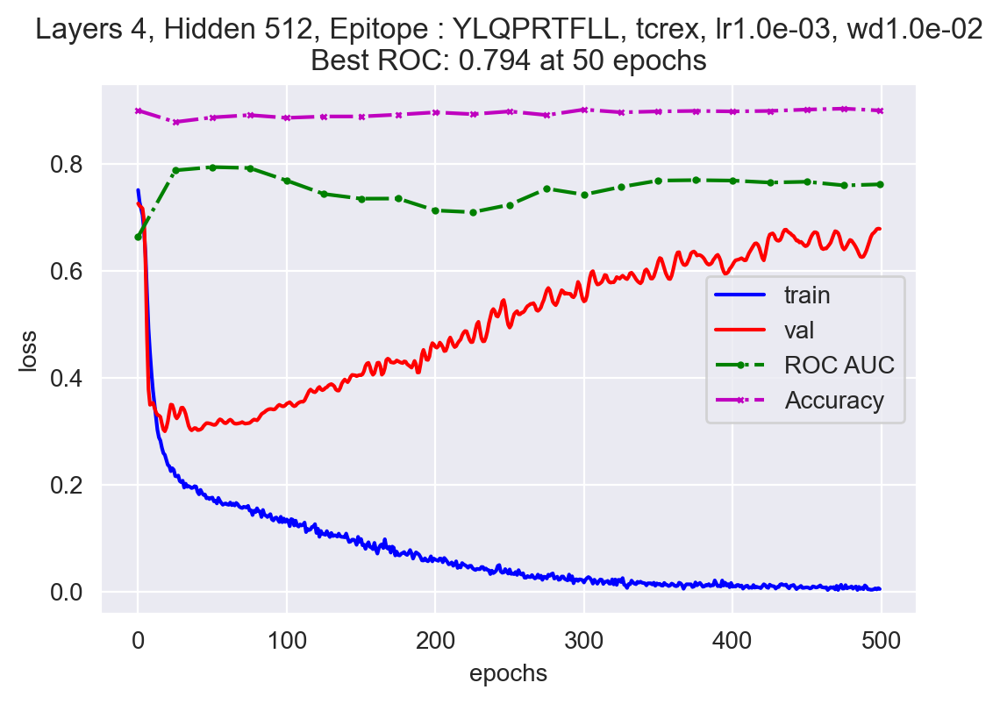

Layers 4, Hidden 512, Epitope : YLQPRTFLL, tcrex, lr5.0e-04, wd1.0e-05
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch:0;	Train: 6.232e-01	Val: 5.853e-01
		ROC AUC :0.664, 	accuracy: 0.899
Epoch:25;	Train: 3.709e-01	Val: 3.971e-01
		ROC AUC :0.797, 	accuracy: 0.890
Epoch:50;	Train: 2.476e-01	Val: 3.075e-01
		ROC AUC :0.796, 	accuracy: 0.904
Epoch:75;	Train: 2.088e-01	Val: 2.593e-01
		ROC AUC :0.809, 	accuracy: 0.904
Epoch:100;	Train: 1.894e-01	Val: 2.620e-01
		ROC AUC :0.798, 	accuracy: 0.901
Epoch:125;	Train: 1.796e-01	Val: 2.640e-01
		ROC AUC :0.818, 	accuracy: 0.907
Epoch:150;	Train: 1.674e-01	Val: 2.680e-01
		ROC AUC :0.829, 	accuracy: 0.905
Epoch:175;	Train: 1.584e-01	Val: 2.836e-01
		ROC AUC :0.809, 	accuracy: 0.904
Epoch:200;	Train: 1.429e-01	Val: 2.910e-01
		ROC AUC :0.826, 	accuracy: 0.899
Epoch:225;	Train: 1.181e-01	Val: 3.075e-01
		ROC AUC :0.812, 	accuracy: 0.898
Epoch:250;	Train: 1.079e-01	Val: 3.209e-01
		ROC AUC :0.811, 	accuracy: 0.897
Epoch:275;	Train: 9.616e-02	Val: 3.417e-01
		ROC AUC :0.801, 	accuracy: 0.897
Epoch:300;	Train: 7.220e-02	Val: 3.311e-01
		ROC AUC :0.794, 	accurac

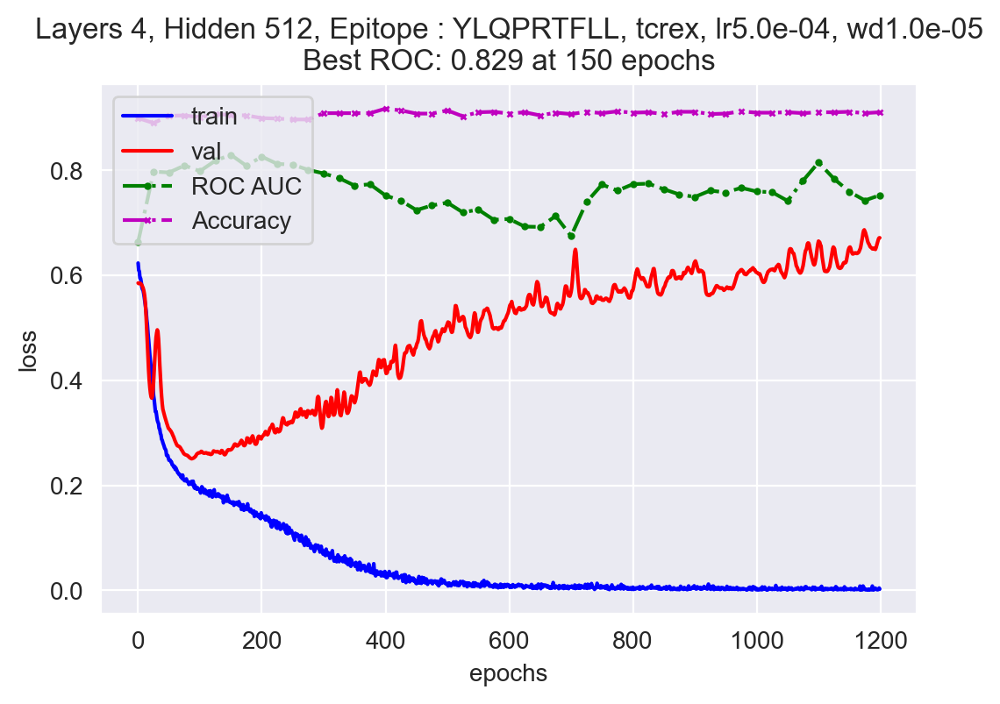

In [322]:
import random

torch.manual_seed(20)
random.seed(20)
#Gridsearch
for epi, folder in tqdm( zip(epitopes.epitope.unique(), ['GILG/','NLVP/','YLQR/']) ):
    _, X_train, X_val, y_train, y_val = get_data_pipeline(epitopes_tcrex, neg_emerson, epi, random_state = 20)
    for n_layers in tqdm([2,3,4]):
        for hidden in tqdm(([128, 256, 512])):
            for lr, wd, nb_epochs in zip([1e-3, 5e-4], [1e-2, 1e-5], [500, 1200]):
                mlp = MLP_binary(n_layers, hidden, p_drop = 0.4) 
                if epi.startswith("Y"):
                    batch_size = 2**13
                else:
                    batch_size = 2**16
                title = f'Layers {n_layers}, Hidden {hidden}, Epitope : {epi}, {nm}, lr{lr:.1e}, wd{wd:.1e}'
                fn = title.replace(', ', '_').replace(': ','_').replace(',','_').replace('\n','_').replace(' ','_')
                print(title)
                losses, best = train_clf(mlp, data = (X_train, X_val, X_val, y_train, y_val, y_val),
                                         loss_fct = nn.BCEWithLogitsLoss, 
                                         optimizer_module = torch.optim.AdamW,
                                         lr = lr, wd = wd, 
                                         nb_epochs = nb_epochs, batch_size = batch_size, 
                                         outdir = f'../output/epitopes_classification/TCREX_mlp/gridsearch/{folder}', 
                                         filename = fn)
                
                title = title+f'\nBest ROC: {best["roc"][1]:.3f} at {best["roc"][0]} epochs'
                #fn = title.replace(', ', '_').replace(': ','_').replace(',','_').replace('\n','_').replace(' ','_')
                plt.title(title)
                plt.show()


### re-eval on best params (VDJDB)

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.06%
Percent of positive class in val:   9.26%
Hidden 512, Epitope : GILGFVFTL, positive : tcrex, lr1.0e-03, wd1.0e-02 Len positive:3102
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.273e-01	Val: 7.091e-01
		ROC AUC :0.644, 	accuracy: 0.907
Epoch:25;	Train: 2.845e-01	Val: 2.987e-01
		ROC AUC :0.688, 	accuracy: 0.901
Epoch:50;	Train: 2.674e-01	Val: 2.692e-01
		ROC AUC :0.705, 	accuracy: 0.915
Epoch:75;	Train: 2.609e-01	Val: 2.620e-01
		ROC AUC :0.708, 	accuracy: 0.916
Epoch:100;	Train: 2.582e-01	Val: 2.618e-01
		ROC AUC :0.698, 	accuracy: 0.916
Epoch:125;	Train: 2.550e-01	Val: 2.605e-01
		ROC AUC :0.712, 	accuracy: 0.917
Epoch:150;	Train: 2.510e-01	Val: 2.594e-01
		ROC AUC :0.727, 	accuracy: 0.919
Epoch:175;	Train: 2.462e-01	Val: 2.562e-01
		ROC AUC :0.744, 	accuracy: 0.919
Epoch:200;	Train: 2.348e-01	Val: 2.476e-01
		ROC AUC :0.769, 	accuracy: 0.919
Epoch:225;	Train: 2.279e-01	Val: 2.422e-01
		ROC AUC :0.772, 	accuracy: 0.921
Epoch:250;	Train: 2.211e-01	Val: 2.407e-01
		ROC AUC :0.775, 	accuracy: 0.921
Epoch:275;	Train: 2.140e-01	Val: 2.414e-01
		ROC AUC :0.785, 	accuracy: 0.923
Epoch:300;	Train: 2.071e-01	Val: 2.428e-01
		ROC AUC :0.781, 	accurac

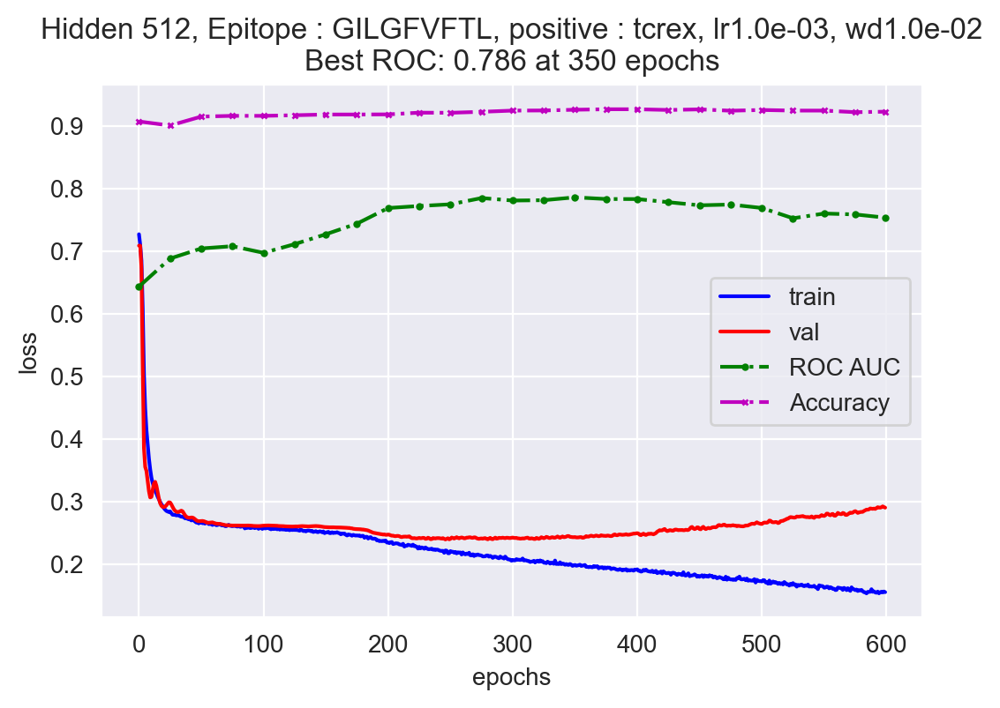

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.96%
Hidden 512, Epitope : GILGFVFTL, positive : vdjdb, lr1.0e-03, wd1.0e-02 Len positive:5033
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.065e-01	Val: 5.842e-01
		ROC AUC :0.755, 	accuracy: 0.910
Epoch:25;	Train: 2.226e-01	Val: 2.076e-01
		ROC AUC :0.818, 	accuracy: 0.939
Epoch:50;	Train: 2.094e-01	Val: 1.936e-01
		ROC AUC :0.829, 	accuracy: 0.945
Epoch:75;	Train: 1.984e-01	Val: 1.855e-01
		ROC AUC :0.839, 	accuracy: 0.946
Epoch:100;	Train: 1.924e-01	Val: 1.807e-01
		ROC AUC :0.856, 	accuracy: 0.947
Epoch:125;	Train: 1.859e-01	Val: 1.787e-01
		ROC AUC :0.860, 	accuracy: 0.947
Epoch:150;	Train: 1.795e-01	Val: 1.765e-01
		ROC AUC :0.860, 	accuracy: 0.947
Epoch:175;	Train: 1.753e-01	Val: 1.753e-01
		ROC AUC :0.861, 	accuracy: 0.948
Epoch:200;	Train: 1.670e-01	Val: 1.740e-01
		ROC AUC :0.861, 	accuracy: 0.949
Epoch:225;	Train: 1.656e-01	Val: 1.746e-01
		ROC AUC :0.866, 	accuracy: 0.950
Epoch:250;	Train: 1.588e-01	Val: 1.772e-01
		ROC AUC :0.869, 	accuracy: 0.950
Epoch:275;	Train: 1.577e-01	Val: 1.754e-01
		ROC AUC :0.871, 	accuracy: 0.950
Epoch:300;	Train: 1.537e-01	Val: 1.791e-01
		ROC AUC :0.871, 	accurac

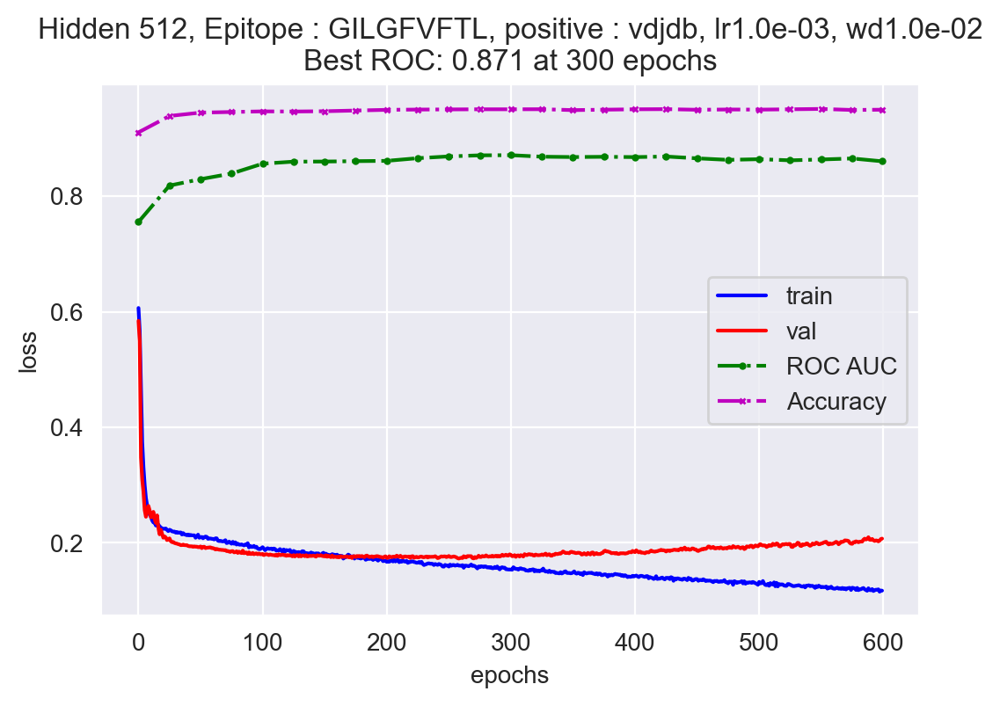

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.97%
Hidden 512, Epitope : NLVPMVATV, positive : tcrex, lr1.0e-03, wd1.0e-02 Len positive:4808
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.903e-01	Val: 7.662e-01
		ROC AUC :0.535, 	accuracy: 0.910
Epoch:25;	Train: 3.009e-01	Val: 2.991e-01
		ROC AUC :0.571, 	accuracy: 0.910
Epoch:50;	Train: 2.933e-01	Val: 2.930e-01
		ROC AUC :0.586, 	accuracy: 0.910
Epoch:75;	Train: 2.885e-01	Val: 2.882e-01
		ROC AUC :0.608, 	accuracy: 0.912
Epoch:100;	Train: 2.858e-01	Val: 2.888e-01
		ROC AUC :0.617, 	accuracy: 0.913
Epoch:125;	Train: 2.822e-01	Val: 2.851e-01
		ROC AUC :0.635, 	accuracy: 0.913
Epoch:150;	Train: 2.744e-01	Val: 2.866e-01
		ROC AUC :0.641, 	accuracy: 0.913
Epoch:175;	Train: 2.734e-01	Val: 2.869e-01
		ROC AUC :0.642, 	accuracy: 0.913
Epoch:200;	Train: 2.703e-01	Val: 2.900e-01
		ROC AUC :0.628, 	accuracy: 0.913
Epoch:225;	Train: 2.665e-01	Val: 2.954e-01
		ROC AUC :0.623, 	accuracy: 0.911
Epoch:250;	Train: 2.634e-01	Val: 2.998e-01
		ROC AUC :0.632, 	accuracy: 0.910
Epoch:275;	Train: 2.565e-01	Val: 3.008e-01
		ROC AUC :0.623, 	accuracy: 0.911
Epoch:300;	Train: 2.502e-01	Val: 3.079e-01
		ROC AUC :0.616, 	accurac

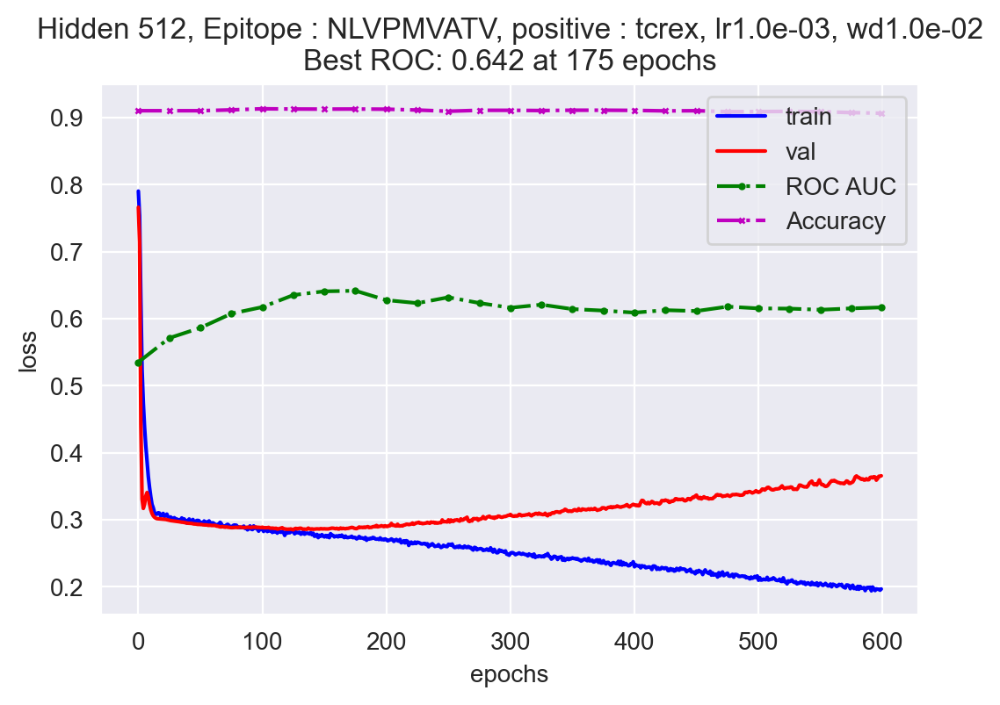

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.10%
Percent of positive class in val:   9.02%
Hidden 512, Epitope : NLVPMVATV, positive : vdjdb, lr1.0e-03, wd1.0e-02 Len positive:4790
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.356e-01	Val: 6.362e-01
		ROC AUC :0.490, 	accuracy: 0.910
Epoch:25;	Train: 3.031e-01	Val: 3.019e-01
		ROC AUC :0.554, 	accuracy: 0.910
Epoch:50;	Train: 2.988e-01	Val: 2.975e-01
		ROC AUC :0.600, 	accuracy: 0.910
Epoch:75;	Train: 2.973e-01	Val: 2.929e-01
		ROC AUC :0.592, 	accuracy: 0.910
Epoch:100;	Train: 2.869e-01	Val: 2.818e-01
		ROC AUC :0.652, 	accuracy: 0.911
Epoch:125;	Train: 2.815e-01	Val: 2.778e-01
		ROC AUC :0.678, 	accuracy: 0.913
Epoch:150;	Train: 2.819e-01	Val: 2.789e-01
		ROC AUC :0.675, 	accuracy: 0.913
Epoch:175;	Train: 2.762e-01	Val: 2.800e-01
		ROC AUC :0.668, 	accuracy: 0.914
Epoch:200;	Train: 2.724e-01	Val: 2.798e-01
		ROC AUC :0.673, 	accuracy: 0.913
Epoch:225;	Train: 2.687e-01	Val: 2.822e-01
		ROC AUC :0.660, 	accuracy: 0.914
Epoch:250;	Train: 2.641e-01	Val: 2.820e-01
		ROC AUC :0.665, 	accuracy: 0.913
Epoch:275;	Train: 2.607e-01	Val: 2.829e-01
		ROC AUC :0.671, 	accuracy: 0.914
Epoch:300;	Train: 2.544e-01	Val: 2.843e-01
		ROC AUC :0.671, 	accurac

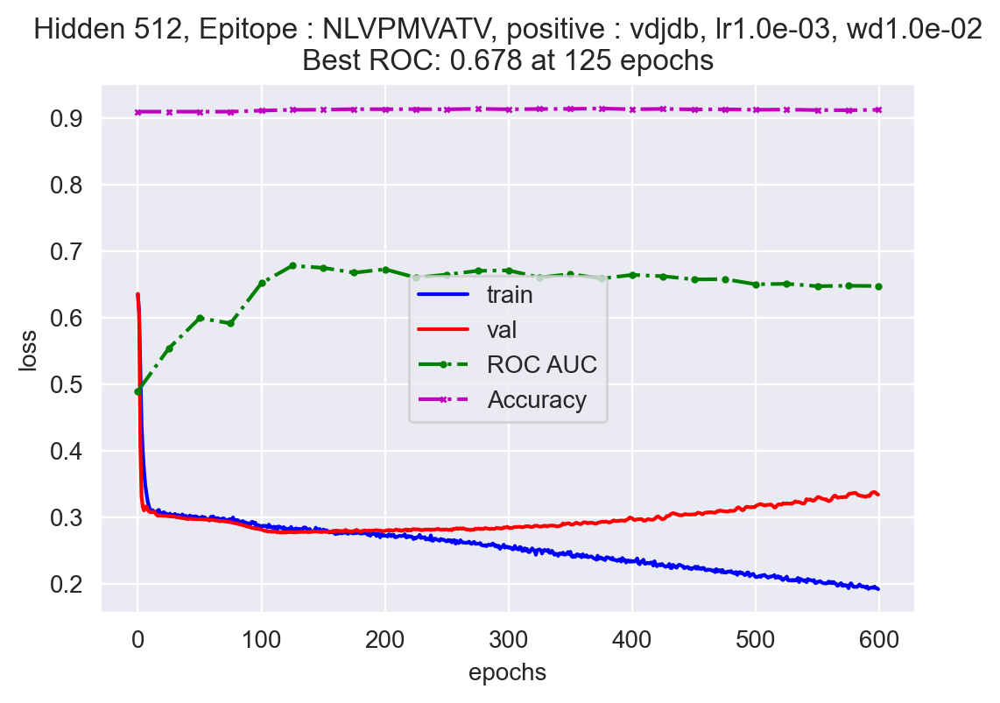

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
Hidden 512, Epitope : YLQPRTFLL, positive : tcrex, lr1.0e-03, wd1.0e-02 Len positive:352
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.419e-01	Val: 6.052e-01
		ROC AUC :0.740, 	accuracy: 0.888
Epoch:25;	Train: 2.250e-01	Val: 3.038e-01
		ROC AUC :0.869, 	accuracy: 0.881
Epoch:50;	Train: 1.887e-01	Val: 2.569e-01
		ROC AUC :0.875, 	accuracy: 0.905
Epoch:75;	Train: 1.721e-01	Val: 2.506e-01
		ROC AUC :0.882, 	accuracy: 0.905
Epoch:100;	Train: 1.598e-01	Val: 2.675e-01
		ROC AUC :0.865, 	accuracy: 0.904
Epoch:125;	Train: 1.294e-01	Val: 2.924e-01
		ROC AUC :0.854, 	accuracy: 0.893
Epoch:150;	Train: 1.002e-01	Val: 3.389e-01
		ROC AUC :0.843, 	accuracy: 0.895
Epoch:175;	Train: 7.433e-02	Val: 3.340e-01
		ROC AUC :0.868, 	accuracy: 0.897
Epoch:200;	Train: 6.096e-02	Val: 3.630e-01
		ROC AUC :0.852, 	accuracy: 0.893
Epoch:225;	Train: 4.453e-02	Val: 3.793e-01
		ROC AUC :0.839, 	accuracy: 0.904
Epoch:250;	Train: 3.905e-02	Val: 3.998e-01
		ROC AUC :0.846, 	accuracy: 0.897
Epoch:275;	Train: 3.651e-02	Val: 4.150e-01
		ROC AUC :0.821, 	accuracy: 0.902
Epoch:300;	Train: 2.034e-02	Val: 4.589e-01
		ROC AUC :0.801, 	accurac

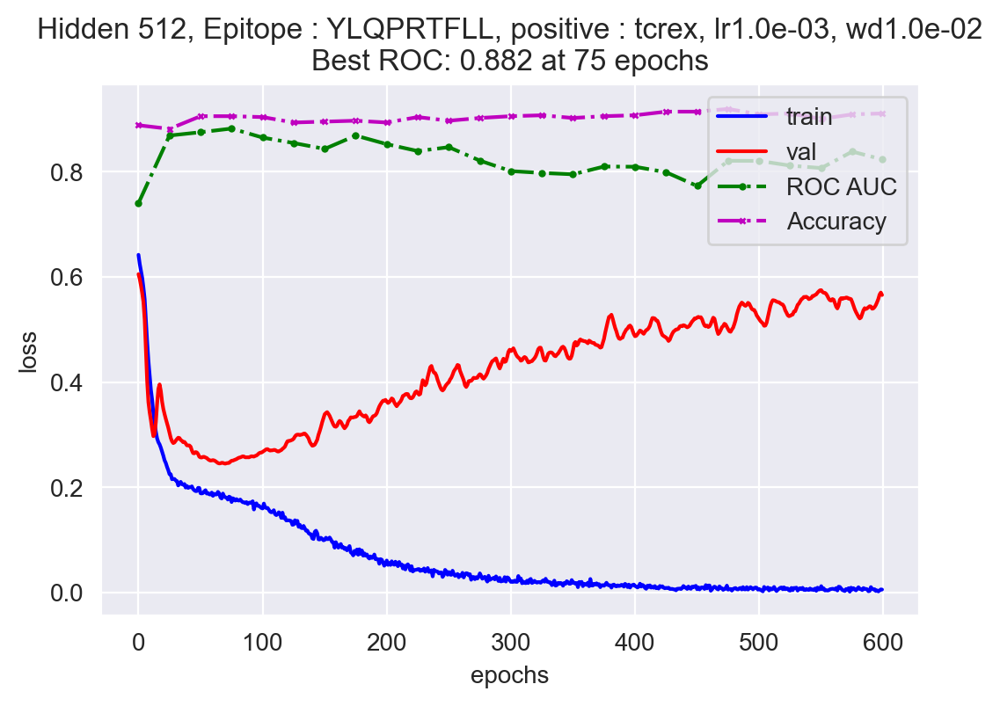

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
Hidden 512, Epitope : YLQPRTFLL, positive : vdjdb, lr1.0e-03, wd1.0e-02 Len positive:352
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.754e-01	Val: 6.590e-01
		ROC AUC :0.785, 	accuracy: 0.888
Epoch:25;	Train: 2.143e-01	Val: 2.887e-01
		ROC AUC :0.864, 	accuracy: 0.885
Epoch:50;	Train: 1.875e-01	Val: 2.903e-01
		ROC AUC :0.856, 	accuracy: 0.890
Epoch:75;	Train: 1.602e-01	Val: 3.020e-01
		ROC AUC :0.835, 	accuracy: 0.892
Epoch:100;	Train: 1.518e-01	Val: 3.311e-01
		ROC AUC :0.829, 	accuracy: 0.892
Epoch:125;	Train: 1.297e-01	Val: 3.305e-01
		ROC AUC :0.821, 	accuracy: 0.900
Epoch:150;	Train: 1.027e-01	Val: 3.404e-01
		ROC AUC :0.835, 	accuracy: 0.892
Epoch:175;	Train: 8.251e-02	Val: 3.763e-01
		ROC AUC :0.819, 	accuracy: 0.900
Epoch:200;	Train: 6.564e-02	Val: 3.853e-01
		ROC AUC :0.832, 	accuracy: 0.898
Epoch:225;	Train: 4.900e-02	Val: 4.106e-01
		ROC AUC :0.840, 	accuracy: 0.897
Epoch:250;	Train: 4.344e-02	Val: 4.347e-01
		ROC AUC :0.851, 	accuracy: 0.897
Epoch:275;	Train: 2.756e-02	Val: 4.486e-01
		ROC AUC :0.861, 	accuracy: 0.892
Epoch:300;	Train: 2.901e-02	Val: 4.715e-01
		ROC AUC :0.847, 	accurac

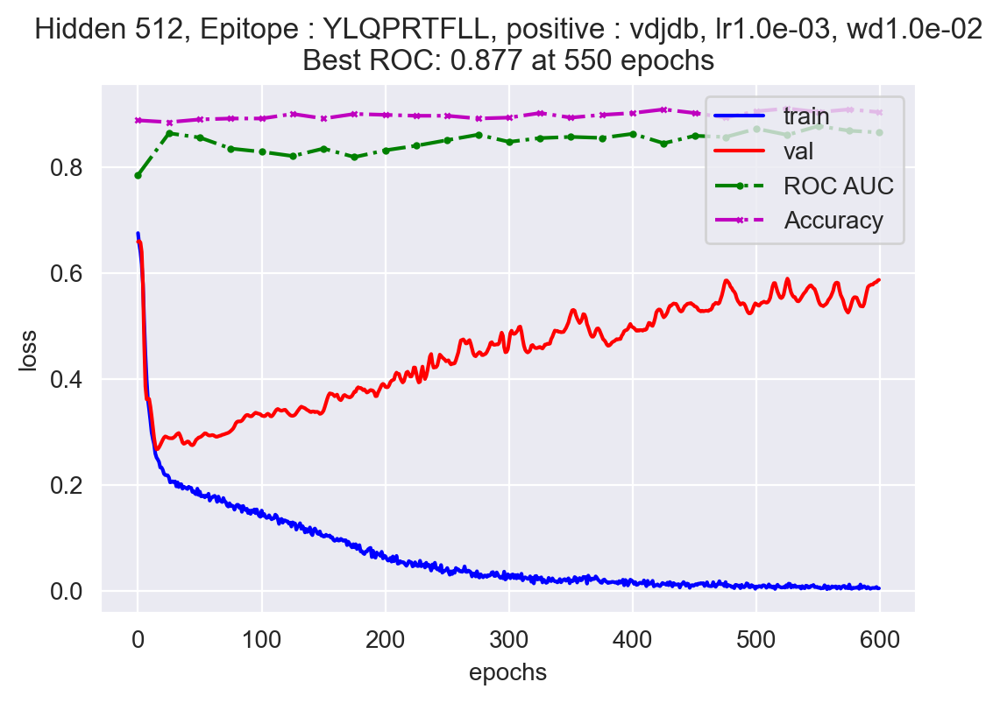

<Figure size 1200x800 with 0 Axes>

In [233]:
torch.manual_seed(20)
random.seed(20)

# Roughly best params Comparison of TCRex db vs VDJdb, and also saving best weights for NN_clf
hidden = 512
lr = 1e-3
wd = 1e-2
n_layers =neg_emerson_epochs = 600
batch_size = 2**15
outdir = '../output/epitopes_classification/MLP/'
for epi in epitopes.epitope.unique():
    for positive_df, pos_nm in zip([epitopes_tcrex, epitopes], ['tcrex', 'vdjdb']):
        #print(positive_df.query('epitope.str.startswith(@epi)').db.unique())
        _, X_train, X_val, y_train, y_val = get_data_pipeline(positive_df, neg_emerson, epi, train_size = .85, random_state = 20)
        title =f'Hidden {hidden}, Epitope : {epi}, positive : {pos_nm}, lr{lr:.1e}, wd{wd:.1e}'
        print(title, f'Len positive:{int(sum(y_train)+sum(y_val))}')
        fn = '_'.join([f'hidden{hidden}',
                       f'epitope{epi}',
                       f'pos{pos_nm}',
                       f'lr{lr:.1e}',
                       f'wd{wd:.1e}'])
        #re-initializing object
        
        mlp = MLP_binary(n_layers, hidden, p_drop = 0.4) 
        losses, best = train_clf(mlp, data = (X_train, X_val, X_val, y_train, y_val, y_val),
                                 loss_fct = nn.BCEWithLogitsLoss, 
                                 optimizer_module = torch.optim.AdamW,
                                 lr = lr, wd = wd, 
                                 nb_epochs = nb_epochs, batch_size = batch_size,
                                 outdir = outdir, filename = fn)
        title = title+f'\nBest ROC: {best["roc"][1]:.3f} at {best["roc"][0]} epochs'
        plt.title(title)
        plt.show()
        fn = title.replace(', ', '_').replace(': ','_').replace(',','_').replace('\n','_').replace(' ','_')
        plt.savefig(f'../output/epitopes_classification/MLP/{fn.split("Best_ROC")[0]}.jpg', dpi = 200)

### Logistic

#### using VDJDB vs TCRex as pos

In [301]:
import random
from sklearn.linear_model import LogisticRegressionCV
torch.manual_seed(20)
random.seed(20)
logreg_clf = {}
for epi in epitopes_tcrex.epitope.unique():
    for positive_df, nm in zip([epitopes, epitopes_tcrex], ['vdjdb', 'tcrex']):
        name = '_'.join([epi, nm])
        _, X_train, X_test, y_train, y_test = get_data_pipeline(positive_df, neg_emerson, epi, train_size = .85, random_state = 20, verbose=False)
        logreg_clf[name] = {'clf':LogisticRegressionCV(10, max_iter = 1000,
                                                       cv = 5, #5-fold
                                                       random_state = 20),
                            'roc_auc':0}
        logreg_clf[name]['clf'].fit(X_train, y_train)
        scores = logreg_clf[name]['clf'].predict_proba(X_test)[:,1]
        logreg_clf[name]['roc_auc'] = roc_auc_score(y_test, scores)
        print(f'########\nROC FOR {name}:\n{logreg_clf[name]["roc_auc"]}\n########\n')

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.96%
########
ROC FOR GILGFVFTL_vdjdb:
0.7839100406301152
########

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.06%
Percent of positive class in val:   9.26%
########
ROC FOR GILGFVFTL_tcrex:
0.7068373506288237
########

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.10%
Percent of positive class in val:   9.02%
########
ROC FOR NLVPMVATV_vdjdb:
0.5896415244004358
########

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.97%
########
ROC FOR NLVPMVATV_tcrex:
0.5764311762747409
########

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
########
ROC FOR YLQPRTFLL_vdjdb:
0.8776088252832439
########

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
########
ROC FOR YLQPRTFLL_tcrex:
0.8775491949910554
########



### XGBoost

#### using VDJDB vs TCRex as pos

In [302]:
import xgboost as xgb
torch.manual_seed(20)
random.seed(20)
xgb_clf = {}
for epi in epitopes_tcrex.epitope.unique():
    for positive_df, nm in zip([epitopes, epitopes_tcrex], ['vdjdb', 'tcrex']):
        name = '_'.join([epi, nm])
        _, X_train, X_test, y_train, y_test = get_data_pipeline(positive_df, neg_emerson, epi, train_size = .85, random_state = 20)
        
        X_train = np.array(X_train)
        X_test = np.array(X_test)
        y_train = np.array(y_train)
        y_test = np.array(y_test)
        xgb_clf[name] = {'clf':xgb.XGBClassifier(n_estimators=100,
                                                 objective='binary:logistic', 
                                                 missing=None, seed=20),
                         'roc_auc':0}
        xgb_clf[name]['clf'].fit(X_train, y_train, verbose = False,
                                 early_stopping_rounds = 30, 
                                 eval_metric = 'aucpr',
                                 eval_set = [(X_test, y_test)])
        scores = xgb_clf[name]['clf'].predict_proba(X_test)[:,1]
        xgb_clf[name]['roc_auc'] = roc_auc_score(y_test, scores)
        print(f'##############\nROC FOR {name}:\n{xgb_clf[name]["roc_auc"]}\n##############\n')

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.96%
##############
ROC FOR GILGFVFTL_vdjdb:
0.8759431356152754
##############

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.06%
Percent of positive class in val:   9.26%
##############
ROC FOR GILGFVFTL_tcrex:
0.8276341785777548
##############

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.10%
Percent of positive class in val:   9.02%
##############
ROC FOR NLVPMVATV_vdjdb:
0.7361978302705403
##############

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.97%
##############
ROC FOR NLVPMVATV_tcrex:
0.7000104432772521
##############

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
##############
ROC FOR YLQPRTFLL_vdjdb:
0.9662790697674419
##############

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
##############
ROC FOR YLQPRTFLL_tcrex:
0.9766249254621349
##############



### Random Forest

In [305]:
from sklearn.ensemble import RandomForestClassifier 
torch.manual_seed(20)
random.seed(20)
randomForest_clf = {}
for epi in epitopes_tcrex.epitope.unique():
    for positive_df, nm in zip([epitopes, epitopes_tcrex], ['vdjdb', 'tcrex']):
        name = '_'.join([epi, nm])
        _, X_train, X_test, y_train, y_test = get_data_pipeline(positive_df, neg_emerson, epi, train_size = .85, random_state = 20)
        
        X_train = np.array(X_train)
        X_test = np.array(X_test)
        y_train = np.array(y_train)
        y_test = np.array(y_test)
        randomForest_clf[name] = {'clf':RandomForestClassifier(),
                                  'roc_auc':0}
        randomForest_clf[name]['clf'].fit(X_train, y_train)
        
        scores = randomForest_clf[name]['clf'].predict_proba(X_test)[:,1]
        randomForest_clf[name]['roc_auc'] = roc_auc_score(y_test, scores)
        
        print(f'##############\nROC FOR {name}:\n{randomForest_clf[name]["roc_auc"]}\n##############')

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.96%
##############
ROC FOR GILGFVFTL_vdjdb:
0.8524036759090579
##############
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.06%
Percent of positive class in val:   9.26%
##############
ROC FOR GILGFVFTL_tcrex:
0.7823688644838377
##############
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.10%
Percent of positive class in val:   9.02%
##############
ROC FOR NLVPMVATV_vdjdb:
0.6843742460528519
##############
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 9.11%
Percent of positive class in val:   8.97%
##############
ROC FOR NLVPMVATV_tcrex:
0.6570315927611947
##############
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
##############
ROC FOR YLQPRTFLL_vdjdb:
0.951639833035182
##############
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Percent of positive class in train: 8.72%
Percent of positive class in val:   11.19%
##############
ROC FOR YLQPRTFLL_tcrex:
0.9361210494931425
##############


# KFOLD CV 

In [10]:
from clf.clf_train_eval_helpers import kfold_cv

In [11]:
sorted(epitopes.epitope.unique(), key=str)

['GILGFVFTL', 'NLVPMVATV', 'YLQPRTFLL']

## MLP KFOLD

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.243e-01	Val: 6.968e-01
		ROC AUC :0.716, 	accuracy: 0.909
Epoch:25;	Train: 2.424e-01	Val: 2.774e-01
		ROC AUC :0.785, 	accuracy: 0.910
Epoch:50;	Train: 2.207e-01	Val: 2.211e-01
		ROC AUC :0.810, 	accuracy: 0.933
Epoch:75;	Train: 2.126e-01	Val: 2.017e-01
		ROC AUC :0.818, 	accuracy: 0.940
Epoch:100;	Train: 2.037e-01	Val: 1.950e-01
		ROC AUC :0.839, 	accuracy: 0.942
Epoch:125;	Train: 1.970e-01	Val: 1.943e-01
		ROC AUC :0.841, 	accuracy: 0.942
Epoch:150;	Train: 1.908e-01	Val: 1.887e-01
		ROC AUC :0.848, 	accuracy: 0.943
Epoch:175;	Train: 1.873e-01	Val: 1.877e-01
		ROC AUC :0.850, 	accuracy: 0.943
Epoch:200;	Train: 1.823e-01	Val: 1.878e-01
		ROC AUC :0.853, 	accuracy: 0.944
Epoch:225;	Train: 1.756e-01	Val: 1.872e-01
		ROC AUC :0.851, 	accuracy: 0.945
Epoch:250;	Train: 1.715e-01	Val: 1.865e-01
		ROC AUC :0.855, 	accuracy: 0.946
Epoch:275;	Train: 1.690e-01	Val: 1.870e-01
		ROC AUC :0.856, 	accuracy: 0.947
Epoch:300;	Train: 1.649e-01	Val: 1.847e-01
		ROC AUC :0.857, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 8.377e-01	Val: 8.177e-01
		ROC AUC :0.678, 	accuracy: 0.908
Epoch:25;	Train: 2.433e-01	Val: 3.256e-01
		ROC AUC :0.773, 	accuracy: 0.892
Epoch:50;	Train: 2.219e-01	Val: 2.250e-01
		ROC AUC :0.799, 	accuracy: 0.930
Epoch:75;	Train: 2.142e-01	Val: 2.149e-01
		ROC AUC :0.803, 	accuracy: 0.933
Epoch:100;	Train: 2.101e-01	Val: 2.129e-01
		ROC AUC :0.811, 	accuracy: 0.933
Epoch:125;	Train: 2.044e-01	Val: 2.104e-01
		ROC AUC :0.816, 	accuracy: 0.934
Epoch:150;	Train: 1.951e-01	Val: 2.062e-01
		ROC AUC :0.817, 	accuracy: 0.937
Epoch:175;	Train: 1.875e-01	Val: 2.033e-01
		ROC AUC :0.826, 	accuracy: 0.938
Epoch:200;	Train: 1.821e-01	Val: 2.013e-01
		ROC AUC :0.829, 	accuracy: 0.941
Epoch:225;	Train: 1.777e-01	Val: 2.002e-01
		ROC AUC :0.835, 	accuracy: 0.941
Epoch:250;	Train: 1.733e-01	Val: 1.986e-01
		ROC AUC :0.840, 	accuracy: 0.943
Epoch:275;	Train: 1.702e-01	Val: 1.957e-01
		ROC AUC :0.843, 	accuracy: 0.943
Epoch:300;	Train: 1.634e-01	Val: 1.963e-01
		ROC AUC :0.846, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 8.208e-01	Val: 7.933e-01
		ROC AUC :0.694, 	accuracy: 0.910
Epoch:25;	Train: 2.372e-01	Val: 2.597e-01
		ROC AUC :0.781, 	accuracy: 0.920
Epoch:50;	Train: 2.200e-01	Val: 2.300e-01
		ROC AUC :0.789, 	accuracy: 0.931
Epoch:75;	Train: 2.107e-01	Val: 2.159e-01
		ROC AUC :0.796, 	accuracy: 0.936
Epoch:100;	Train: 2.024e-01	Val: 2.092e-01
		ROC AUC :0.807, 	accuracy: 0.938
Epoch:125;	Train: 1.966e-01	Val: 2.074e-01
		ROC AUC :0.821, 	accuracy: 0.938
Epoch:150;	Train: 1.913e-01	Val: 2.032e-01
		ROC AUC :0.838, 	accuracy: 0.939
Epoch:175;	Train: 1.860e-01	Val: 1.960e-01
		ROC AUC :0.846, 	accuracy: 0.941
Epoch:200;	Train: 1.823e-01	Val: 1.972e-01
		ROC AUC :0.852, 	accuracy: 0.942
Epoch:225;	Train: 1.766e-01	Val: 1.888e-01
		ROC AUC :0.857, 	accuracy: 0.946
Epoch:250;	Train: 1.721e-01	Val: 1.869e-01
		ROC AUC :0.861, 	accuracy: 0.946
Epoch:275;	Train: 1.697e-01	Val: 1.868e-01
		ROC AUC :0.865, 	accuracy: 0.946
Epoch:300;	Train: 1.675e-01	Val: 1.864e-01
		ROC AUC :0.867, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.333e-01	Val: 6.097e-01
		ROC AUC :0.734, 	accuracy: 0.910
Epoch:25;	Train: 2.321e-01	Val: 2.675e-01
		ROC AUC :0.793, 	accuracy: 0.914
Epoch:50;	Train: 2.202e-01	Val: 2.150e-01
		ROC AUC :0.789, 	accuracy: 0.937
Epoch:75;	Train: 2.108e-01	Val: 2.071e-01
		ROC AUC :0.796, 	accuracy: 0.938
Epoch:100;	Train: 2.090e-01	Val: 2.055e-01
		ROC AUC :0.806, 	accuracy: 0.939
Epoch:125;	Train: 2.013e-01	Val: 1.988e-01
		ROC AUC :0.815, 	accuracy: 0.942
Epoch:150;	Train: 1.932e-01	Val: 1.911e-01
		ROC AUC :0.823, 	accuracy: 0.944
Epoch:175;	Train: 1.846e-01	Val: 1.873e-01
		ROC AUC :0.836, 	accuracy: 0.946
Epoch:200;	Train: 1.798e-01	Val: 1.831e-01
		ROC AUC :0.844, 	accuracy: 0.948
Epoch:225;	Train: 1.755e-01	Val: 1.815e-01
		ROC AUC :0.849, 	accuracy: 0.949
Epoch:250;	Train: 1.706e-01	Val: 1.801e-01
		ROC AUC :0.857, 	accuracy: 0.949
Epoch:275;	Train: 1.672e-01	Val: 1.789e-01
		ROC AUC :0.857, 	accuracy: 0.950
Epoch:300;	Train: 1.621e-01	Val: 1.827e-01
		ROC AUC :0.860, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.436e-01	Val: 7.204e-01
		ROC AUC :0.696, 	accuracy: 0.909
Epoch:25;	Train: 2.436e-01	Val: 3.399e-01
		ROC AUC :0.783, 	accuracy: 0.900
Epoch:50;	Train: 2.217e-01	Val: 2.237e-01
		ROC AUC :0.788, 	accuracy: 0.934
Epoch:75;	Train: 2.143e-01	Val: 2.120e-01
		ROC AUC :0.787, 	accuracy: 0.935
Epoch:100;	Train: 2.068e-01	Val: 2.084e-01
		ROC AUC :0.800, 	accuracy: 0.937
Epoch:125;	Train: 1.985e-01	Val: 2.022e-01
		ROC AUC :0.811, 	accuracy: 0.938
Epoch:150;	Train: 1.927e-01	Val: 2.001e-01
		ROC AUC :0.812, 	accuracy: 0.939
Epoch:175;	Train: 1.863e-01	Val: 1.917e-01
		ROC AUC :0.829, 	accuracy: 0.943
Epoch:200;	Train: 1.789e-01	Val: 1.892e-01
		ROC AUC :0.840, 	accuracy: 0.945
Epoch:225;	Train: 1.727e-01	Val: 1.876e-01
		ROC AUC :0.846, 	accuracy: 0.944
Epoch:250;	Train: 1.695e-01	Val: 1.884e-01
		ROC AUC :0.849, 	accuracy: 0.945
Epoch:275;	Train: 1.654e-01	Val: 1.868e-01
		ROC AUC :0.850, 	accuracy: 0.946
Epoch:300;	Train: 1.625e-01	Val: 1.880e-01
		ROC AUC :0.850, 	accurac

batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.537e-01	Val: 7.318e-01
		ROC AUC :0.519, 	accuracy: 0.909
Epoch:25;	Train: 3.085e-01	Val: 3.149e-01
		ROC AUC :0.513, 	accuracy: 0.909
Epoch:50;	Train: 3.050e-01	Val: 3.050e-01
		ROC AUC :0.545, 	accuracy: 0.909
Epoch:75;	Train: 3.007e-01	Val: 3.006e-01
		ROC AUC :0.594, 	accuracy: 0.909
Epoch:100;	Train: 2.997e-01	Val: 2.986e-01
		ROC AUC :0.609, 	accuracy: 0.909
Epoch:125;	Train: 2.972e-01	Val: 2.982e-01
		ROC AUC :0.605, 	accuracy: 0.909
Epoch:150;	Train: 2.942e-01	Val: 2.957e-01
		ROC AUC :0.599, 	accuracy: 0.908
Epoch:175;	Train: 2.911e-01	Val: 2.906e-01
		ROC AUC :0.606, 	accuracy: 0.910
Epoch:200;	Train: 2.886e-01	Val: 2.884e-01
		ROC AUC :0.629, 	accuracy: 0.910
Epoch:225;	Train: 2.843e-01	Val: 2.871e-01
		ROC AUC :0.643, 	accuracy: 0.910
Epoch:250;	Train: 2.803e-01	Val: 2.843e-01
		ROC AUC :0.663, 	accuracy: 0.912
Epoch:275;	Train: 2.769e-01	Val: 2.849e-01
		ROC AUC :0.664, 	accuracy: 0.912
Epoch:300;	Train: 2.748e-01	Val: 2.866e-01
		ROC AUC :0.660, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.303e-01	Val: 6.970e-01
		ROC AUC :0.518, 	accuracy: 0.905
Epoch:25;	Train: 3.065e-01	Val: 3.176e-01
		ROC AUC :0.513, 	accuracy: 0.905
Epoch:50;	Train: 3.032e-01	Val: 3.146e-01
		ROC AUC :0.532, 	accuracy: 0.905
Epoch:75;	Train: 3.000e-01	Val: 3.134e-01
		ROC AUC :0.555, 	accuracy: 0.905
Epoch:100;	Train: 2.961e-01	Val: 3.132e-01
		ROC AUC :0.567, 	accuracy: 0.905
Epoch:125;	Train: 2.931e-01	Val: 3.102e-01
		ROC AUC :0.580, 	accuracy: 0.905
Epoch:150;	Train: 2.832e-01	Val: 3.014e-01
		ROC AUC :0.620, 	accuracy: 0.908
Epoch:175;	Train: 2.796e-01	Val: 3.018e-01
		ROC AUC :0.619, 	accuracy: 0.909
Epoch:200;	Train: 2.763e-01	Val: 3.009e-01
		ROC AUC :0.626, 	accuracy: 0.909
Epoch:225;	Train: 2.742e-01	Val: 3.014e-01
		ROC AUC :0.628, 	accuracy: 0.909
Epoch:250;	Train: 2.707e-01	Val: 3.027e-01
		ROC AUC :0.627, 	accuracy: 0.908
Epoch:275;	Train: 2.701e-01	Val: 3.031e-01
		ROC AUC :0.627, 	accuracy: 0.908
Epoch:300;	Train: 2.654e-01	Val: 3.036e-01
		ROC AUC :0.630, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 8.721e-01	Val: 8.459e-01
		ROC AUC :0.541, 	accuracy: 0.913
Epoch:25;	Train: 3.134e-01	Val: 2.994e-01
		ROC AUC :0.510, 	accuracy: 0.913
Epoch:50;	Train: 3.086e-01	Val: 2.945e-01
		ROC AUC :0.552, 	accuracy: 0.913
Epoch:75;	Train: 3.043e-01	Val: 2.916e-01
		ROC AUC :0.583, 	accuracy: 0.913
Epoch:100;	Train: 3.007e-01	Val: 2.914e-01
		ROC AUC :0.578, 	accuracy: 0.913
Epoch:125;	Train: 2.979e-01	Val: 2.894e-01
		ROC AUC :0.566, 	accuracy: 0.913
Epoch:150;	Train: 2.901e-01	Val: 2.852e-01
		ROC AUC :0.600, 	accuracy: 0.915
Epoch:175;	Train: 2.864e-01	Val: 2.823e-01
		ROC AUC :0.625, 	accuracy: 0.915
Epoch:200;	Train: 2.828e-01	Val: 2.800e-01
		ROC AUC :0.640, 	accuracy: 0.916
Epoch:225;	Train: 2.813e-01	Val: 2.804e-01
		ROC AUC :0.638, 	accuracy: 0.916
Epoch:250;	Train: 2.783e-01	Val: 2.808e-01
		ROC AUC :0.639, 	accuracy: 0.916
Epoch:275;	Train: 2.750e-01	Val: 2.818e-01
		ROC AUC :0.636, 	accuracy: 0.916
Epoch:300;	Train: 2.721e-01	Val: 2.844e-01
		ROC AUC :0.629, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 5.971e-01	Val: 5.829e-01
		ROC AUC :0.541, 	accuracy: 0.910
Epoch:25;	Train: 3.090e-01	Val: 3.081e-01
		ROC AUC :0.518, 	accuracy: 0.910
Epoch:50;	Train: 3.026e-01	Val: 3.025e-01
		ROC AUC :0.552, 	accuracy: 0.910
Epoch:75;	Train: 2.984e-01	Val: 3.009e-01
		ROC AUC :0.575, 	accuracy: 0.910
Epoch:100;	Train: 2.967e-01	Val: 2.997e-01
		ROC AUC :0.564, 	accuracy: 0.910
Epoch:125;	Train: 2.939e-01	Val: 2.946e-01
		ROC AUC :0.562, 	accuracy: 0.910
Epoch:150;	Train: 2.904e-01	Val: 2.898e-01
		ROC AUC :0.571, 	accuracy: 0.911
Epoch:175;	Train: 2.859e-01	Val: 2.857e-01
		ROC AUC :0.618, 	accuracy: 0.913
Epoch:200;	Train: 2.813e-01	Val: 2.841e-01
		ROC AUC :0.645, 	accuracy: 0.914
Epoch:225;	Train: 2.779e-01	Val: 2.853e-01
		ROC AUC :0.645, 	accuracy: 0.913
Epoch:250;	Train: 2.763e-01	Val: 2.843e-01
		ROC AUC :0.649, 	accuracy: 0.913
Epoch:275;	Train: 2.720e-01	Val: 2.851e-01
		ROC AUC :0.649, 	accuracy: 0.913
Epoch:300;	Train: 2.696e-01	Val: 2.864e-01
		ROC AUC :0.647, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 7.770e-01	Val: 7.550e-01
		ROC AUC :0.540, 	accuracy: 0.909
Epoch:25;	Train: 3.098e-01	Val: 3.059e-01
		ROC AUC :0.511, 	accuracy: 0.909
Epoch:50;	Train: 3.057e-01	Val: 3.055e-01
		ROC AUC :0.531, 	accuracy: 0.909
Epoch:75;	Train: 3.008e-01	Val: 3.053e-01
		ROC AUC :0.564, 	accuracy: 0.909
Epoch:100;	Train: 2.979e-01	Val: 3.042e-01
		ROC AUC :0.568, 	accuracy: 0.909
Epoch:125;	Train: 2.962e-01	Val: 3.036e-01
		ROC AUC :0.561, 	accuracy: 0.909
Epoch:150;	Train: 2.930e-01	Val: 2.995e-01
		ROC AUC :0.561, 	accuracy: 0.909
Epoch:175;	Train: 2.903e-01	Val: 2.949e-01
		ROC AUC :0.570, 	accuracy: 0.910
Epoch:200;	Train: 2.853e-01	Val: 2.909e-01
		ROC AUC :0.613, 	accuracy: 0.911
Epoch:225;	Train: 2.799e-01	Val: 2.905e-01
		ROC AUC :0.631, 	accuracy: 0.912
Epoch:250;	Train: 2.761e-01	Val: 2.910e-01
		ROC AUC :0.632, 	accuracy: 0.911
Epoch:275;	Train: 2.734e-01	Val: 2.918e-01
		ROC AUC :0.633, 	accuracy: 0.912
Epoch:300;	Train: 2.707e-01	Val: 2.933e-01
		ROC AUC :0.629, 	accurac

batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.
cpu cpu cpu cpu cpu cpu
BINARY True


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.902e-01	Val: 6.432e-01
		ROC AUC :0.700, 	accuracy: 0.895
Epoch:25;	Train: 3.822e-01	Val: 3.584e-01
		ROC AUC :0.611, 	accuracy: 0.895
Epoch:50;	Train: 2.293e-01	Val: 2.830e-01
		ROC AUC :0.804, 	accuracy: 0.894
Epoch:75;	Train: 1.909e-01	Val: 2.872e-01
		ROC AUC :0.810, 	accuracy: 0.899
Epoch:100;	Train: 1.757e-01	Val: 3.041e-01
		ROC AUC :0.808, 	accuracy: 0.898
Epoch:125;	Train: 1.575e-01	Val: 3.177e-01
		ROC AUC :0.821, 	accuracy: 0.892
Epoch:150;	Train: 1.425e-01	Val: 3.239e-01
		ROC AUC :0.818, 	accuracy: 0.889
Epoch:175;	Train: 1.420e-01	Val: 3.377e-01
		ROC AUC :0.822, 	accuracy: 0.888
Epoch:200;	Train: 1.273e-01	Val: 3.376e-01
		ROC AUC :0.825, 	accuracy: 0.895
Epoch:225;	Train: 1.095e-01	Val: 3.563e-01
		ROC AUC :0.818, 	accuracy: 0.890
Epoch:250;	Train: 1.080e-01	Val: 3.580e-01
		ROC AUC :0.827, 	accuracy: 0.890
Epoch:275;	Train: 8.142e-02	Val: 3.730e-01
		ROC AUC :0.821, 	accuracy: 0.895
Epoch:300;	Train: 8.894e-02	Val: 3.734e-01
		ROC AUC :0.826, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 8.110e-01	Val: 7.738e-01
		ROC AUC :0.662, 	accuracy: 0.917
Epoch:25;	Train: 5.039e-01	Val: 3.892e-01
		ROC AUC :0.653, 	accuracy: 0.911
Epoch:50;	Train: 2.768e-01	Val: 2.844e-01
		ROC AUC :0.816, 	accuracy: 0.917
Epoch:75;	Train: 2.121e-01	Val: 2.273e-01
		ROC AUC :0.829, 	accuracy: 0.920
Epoch:100;	Train: 1.972e-01	Val: 2.228e-01
		ROC AUC :0.829, 	accuracy: 0.919
Epoch:125;	Train: 1.804e-01	Val: 2.291e-01
		ROC AUC :0.829, 	accuracy: 0.916
Epoch:150;	Train: 1.690e-01	Val: 2.315e-01
		ROC AUC :0.830, 	accuracy: 0.921
Epoch:175;	Train: 1.595e-01	Val: 2.430e-01
		ROC AUC :0.831, 	accuracy: 0.914
Epoch:200;	Train: 1.370e-01	Val: 2.506e-01
		ROC AUC :0.829, 	accuracy: 0.917
Epoch:225;	Train: 1.357e-01	Val: 2.577e-01
		ROC AUC :0.832, 	accuracy: 0.914
Epoch:250;	Train: 1.157e-01	Val: 2.621e-01
		ROC AUC :0.835, 	accuracy: 0.914
Epoch:275;	Train: 1.047e-01	Val: 2.729e-01
		ROC AUC :0.830, 	accuracy: 0.916
Epoch:300;	Train: 8.576e-02	Val: 2.754e-01
		ROC AUC :0.830, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.282e-01	Val: 5.782e-01
		ROC AUC :0.742, 	accuracy: 0.919
Epoch:25;	Train: 3.840e-01	Val: 2.982e-01
		ROC AUC :0.714, 	accuracy: 0.922
Epoch:50;	Train: 2.460e-01	Val: 2.348e-01
		ROC AUC :0.836, 	accuracy: 0.922
Epoch:75;	Train: 1.993e-01	Val: 2.173e-01
		ROC AUC :0.860, 	accuracy: 0.932
Epoch:100;	Train: 1.701e-01	Val: 2.215e-01
		ROC AUC :0.847, 	accuracy: 0.925
Epoch:125;	Train: 1.656e-01	Val: 2.239e-01
		ROC AUC :0.854, 	accuracy: 0.929
Epoch:150;	Train: 1.413e-01	Val: 2.368e-01
		ROC AUC :0.845, 	accuracy: 0.924
Epoch:175;	Train: 1.405e-01	Val: 2.542e-01
		ROC AUC :0.843, 	accuracy: 0.916
Epoch:200;	Train: 1.256e-01	Val: 2.611e-01
		ROC AUC :0.837, 	accuracy: 0.921
Epoch:225;	Train: 1.093e-01	Val: 2.642e-01
		ROC AUC :0.839, 	accuracy: 0.917
Epoch:250;	Train: 1.009e-01	Val: 2.715e-01
		ROC AUC :0.833, 	accuracy: 0.925
Epoch:275;	Train: 9.111e-02	Val: 2.737e-01
		ROC AUC :0.839, 	accuracy: 0.925
Epoch:300;	Train: 9.074e-02	Val: 2.837e-01
		ROC AUC :0.827, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 6.191e-01	Val: 6.069e-01
		ROC AUC :0.664, 	accuracy: 0.910
Epoch:25;	Train: 4.278e-01	Val: 3.471e-01
		ROC AUC :0.697, 	accuracy: 0.910
Epoch:50;	Train: 2.880e-01	Val: 2.831e-01
		ROC AUC :0.854, 	accuracy: 0.929
Epoch:75;	Train: 2.266e-01	Val: 2.296e-01
		ROC AUC :0.881, 	accuracy: 0.915
Epoch:100;	Train: 2.059e-01	Val: 2.148e-01
		ROC AUC :0.889, 	accuracy: 0.925
Epoch:125;	Train: 1.955e-01	Val: 2.177e-01
		ROC AUC :0.878, 	accuracy: 0.926
Epoch:150;	Train: 1.833e-01	Val: 2.190e-01
		ROC AUC :0.873, 	accuracy: 0.924
Epoch:175;	Train: 1.682e-01	Val: 2.205e-01
		ROC AUC :0.876, 	accuracy: 0.925
Epoch:200;	Train: 1.494e-01	Val: 2.351e-01
		ROC AUC :0.869, 	accuracy: 0.919
Epoch:225;	Train: 1.179e-01	Val: 2.385e-01
		ROC AUC :0.886, 	accuracy: 0.916
Epoch:250;	Train: 1.087e-01	Val: 2.534e-01
		ROC AUC :0.892, 	accuracy: 0.912
Epoch:275;	Train: 7.767e-02	Val: 2.864e-01
		ROC AUC :0.880, 	accuracy: 0.913
Epoch:300;	Train: 7.357e-02	Val: 2.810e-01
		ROC AUC :0.895, 	accurac

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch:0;	Train: 5.852e-01	Val: 5.665e-01
		ROC AUC :0.654, 	accuracy: 0.904
Epoch:25;	Train: 3.999e-01	Val: 3.450e-01
		ROC AUC :0.759, 	accuracy: 0.904
Epoch:50;	Train: 2.602e-01	Val: 2.816e-01
		ROC AUC :0.824, 	accuracy: 0.902
Epoch:75;	Train: 2.004e-01	Val: 2.516e-01
		ROC AUC :0.833, 	accuracy: 0.902
Epoch:100;	Train: 1.714e-01	Val: 2.629e-01
		ROC AUC :0.817, 	accuracy: 0.906
Epoch:125;	Train: 1.586e-01	Val: 2.708e-01
		ROC AUC :0.809, 	accuracy: 0.908
Epoch:150;	Train: 1.396e-01	Val: 2.829e-01
		ROC AUC :0.810, 	accuracy: 0.904
Epoch:175;	Train: 1.283e-01	Val: 2.871e-01
		ROC AUC :0.818, 	accuracy: 0.907
Epoch:200;	Train: 1.267e-01	Val: 2.838e-01
		ROC AUC :0.825, 	accuracy: 0.912
Epoch:225;	Train: 1.082e-01	Val: 2.882e-01
		ROC AUC :0.822, 	accuracy: 0.913
Epoch:250;	Train: 9.826e-02	Val: 3.004e-01
		ROC AUC :0.825, 	accuracy: 0.913
Epoch:275;	Train: 8.527e-02	Val: 2.977e-01
		ROC AUC :0.825, 	accuracy: 0.915
Epoch:300;	Train: 7.922e-02	Val: 2.999e-01
		ROC AUC :0.824, 	accurac

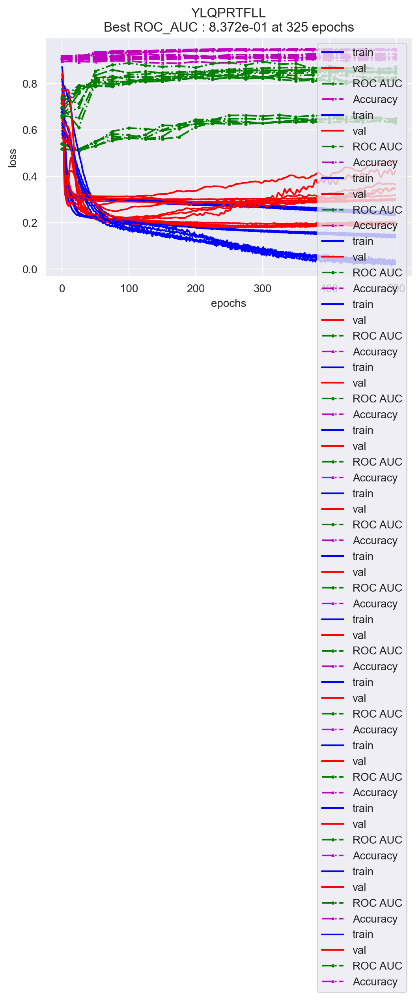

In [11]:
from clf.MLP_binary import MLP_binary
kfold_nn = {}
random.seed(20)
torch.manual_seed(20)
for epi, n_layers, hidden, lr, wd in zip(sorted(epitopes.epitope.unique(), key=str),
                                        [4,3,2],[512,512,256],
                                        [1e-3, 1e-3,5e-4], [1e-2, 1e-2, 1e-5]):
    
    df = get_df_nn(epitopes, neg_emerson,epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(100)]].values)
    y = torch.tensor(df['label'].values).float()
    if not epi.startswith('Y'):
        bs = 2**16
    else:
        bs = 2**13
        
    model = MLP_binary(n_layers, hidden, p_drop = .4)
    roc_dict = kfold_cv(model, X,y, k=5, random_state = 20,
                        lr=lr, wd=wd, nb_epochs=500, 
                        batch_size=bs, loss_weight = None, device='cuda', 
                        outdir=f'../output/epitopes_classification/KCV/',
                        filename = epi)
    kfold_nn[epi] = roc_dict

In [12]:
save_pkl('../output/epitopes_classification/kfold_nn_dict.pkl', kfold_nn)

## Logistic KFOLD

In [16]:
from sklearn.linear_model import LogisticRegressionCV
kfold_log = {}
nb_epochs = 500
random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    df = get_df_nn(epitopes, neg_emerson,epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(100)]].values)
    y = torch.tensor(df['label'].values).float()
    if not epi.startswith('Y'):
        bs = 2**16
    else:
        bs = 2**13
    clf = LogisticRegressionCV(30, penalty='l2',solver = 'lbfgs',
                               max_iter = 600, cv = 5, n_jobs = 12)
    roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20)
    kfold_log[epi] = roc_dict

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Length of test set:		11073
len of prediction scores:	11073
length of roc_curve array:	1198

At fold 1, Test AUC: 0.7883216986334707
Fold number 2:
Length of test set:		11073
len of prediction scores:	11073
length of roc_curve array:	1278

At fold 2, Test AUC: 0.7778945444039839
Fold number 3:
Length of test set:		11073
len of prediction scores:	11073
length of roc_curve array:	1234

At fold 3, Test AUC: 0.7770291633702394
Fold number 4:
Length of test set:		11072
len of prediction scores:	11072
length of roc_curve array:	1203

At fold 4, Test AUC: 0.7886992524705686
Fold number 5:
Length of test set:		11072
len of prediction scores:	11072
length of roc_curve array:	1244

At fold 5, Test AUC: 0.7879191137817965
EPITOPE: NLVPMVATV
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:


KeyboardInterrupt: 

In [330]:
save_pkl('../output/epitopes_classification/kfold_logreg_dict_VAE.pkl', kfold_log)

## Random Forest KFOLD

In [331]:
from sklearn.ensemble import RandomForestClassifier
kfold_rf = {}
nb_epochs = 500
random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    df = get_df_nn(epitopes, neg_emerson,epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(100)]].values)
    y = torch.tensor(df['label'].values).float()
    for n_est in [100,200,300]:
        for depth in [7,12,25]:
            clf = RandomForestClassifier(n_estimators=n_est, random_state = 20,
                                         max_depth = depth, n_jobs=8)
            params = ['n_est',n_est, 'depth',depth]
            name = '_'.join([str(x) for x in params])
            print(f'\n#############\nName : {name}')
            roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20)
            avg_roc_auc = np.mean([x[1] for x in roc_dict.values()])
            kfold_rf[epi+name] = (roc_dict, avg_roc_auc)
            print('#############')

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.8374118565997892
Fold number 2:
At fold 2, Test AUC: 0.8225007222610647
Fold number 3:
At fold 3, Test AUC: 0.8335070230047399
Fold number 4:
At fold 4, Test AUC: 0.8337418837294456
Fold number 5:
At fold 5, Test AUC: 0.8278613219007969
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.8484434950023452
Fold number 2:
At fold 2, Test AUC: 0.8341778633442918
Fold number 3:
At fold 3, Test AUC: 0.8471698818135188
Fold number 4:
At fold 4, Test AUC: 0.8467189323677728
Fold number 5:
At fold 5, Test AUC: 0.8414774720889027
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.8522144526719251
Fold number 2:
At fold 2, Test AUC: 0.8409941287417626
Fold number 3:
At fold 3, Test AUC: 0.8433776241995419
Fold number 4:
At fold 4, Test AUC: 0.845261986684944
Fold number 5:
At fold 5, Test AUC: 0.8347485875231316
#############

###########

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.7080360927373323
Fold number 2:
At fold 2, Test AUC: 0.6766912546433902
Fold number 3:
At fold 3, Test AUC: 0.6894880151095196
Fold number 4:
At fold 4, Test AUC: 0.6967239056741443
Fold number 5:
At fold 5, Test AUC: 0.7031296406296406
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.7151148251618534
Fold number 2:
At fold 2, Test AUC: 0.6870936902083286
Fold number 3:
At fold 3, Test AUC: 0.695617114960798
Fold number 4:
At fold 4, Test AUC: 0.7048037085753415
Fold number 5:
At fold 5, Test AUC: 0.7160632654053707
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.7025083928031226
Fold number 2:
At fold 2, Test AUC: 0.6648915932015633
Fold number 3:
At fold 3, Test AUC: 0.6870067103575279
Fold number 4:
At fold 4, Test AUC: 0.6950593381907393
Fold number 5:
At fold 5, Test AUC: 0.6954434553118763
#############

###########

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.9436972996050806
Fold number 2:
At fold 2, Test AUC: 0.9414117440225035
Fold number 3:
At fold 3, Test AUC: 0.9718036300314781
Fold number 4:
At fold 4, Test AUC: 0.9577313311688312
Fold number 5:
At fold 5, Test AUC: 0.949034749034749
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.9395168463372113
Fold number 2:
At fold 2, Test AUC: 0.9381592827004219
Fold number 3:
At fold 3, Test AUC: 0.9716920054472797
Fold number 4:
At fold 4, Test AUC: 0.9608360389610391
Fold number 5:
At fold 5, Test AUC: 0.9591312741312741
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.9438396129078165
Fold number 2:
At fold 2, Test AUC: 0.9271602496483824
Fold number 3:
At fold 3, Test AUC: 0.9746835443037976
Fold number 4:
At fold 4, Test AUC: 0.9580255681818184
Fold number 5:
At fold 5, Test AUC: 0.954507722007722
#############

############

In [332]:
top5_keys = []
for epi in epitopes.epitope.unique():
    keys = [x for x in sorted(kfold_rf, key = lambda x: kfold_rf[x][1],
                              reverse=True) if epi in x]
    for k in keys[0:5]:
        print(f'Params: {k}, ROC: {kfold_rf[k][1]}')
        top5_keys.append(k)
    print('\n')
top5_kfold_rf = dict((k, kfold_rf[k]) for k in top5_keys)

Params: GILGFVFTLn_est_300_depth_25, ROC: 0.8469033416926436
Params: GILGFVFTLn_est_200_depth_12, ROC: 0.8457618346409127
Params: GILGFVFTLn_est_200_depth_25, ROC: 0.8454508079737255
Params: GILGFVFTLn_est_300_depth_12, ROC: 0.8450901172785219
Params: GILGFVFTLn_est_100_depth_12, ROC: 0.8435975289233661


Params: NLVPMVATVn_est_300_depth_12, ROC: 0.7092594151681993
Params: NLVPMVATVn_est_200_depth_12, ROC: 0.7087446608706816
Params: NLVPMVATVn_est_100_depth_12, ROC: 0.7037385208623385
Params: NLVPMVATVn_est_300_depth_25, ROC: 0.7001861105291115
Params: NLVPMVATVn_est_200_depth_25, ROC: 0.6980076153734123


Params: YLQPRTFLLn_est_300_depth_12, ROC: 0.9600538557261912
Params: YLQPRTFLLn_est_300_depth_25, ROC: 0.9578571153061987
Params: YLQPRTFLLn_est_200_depth_12, ROC: 0.9577655462560631
Params: YLQPRTFLLn_est_300_depth_7, ROC: 0.9564746923247247
Params: YLQPRTFLLn_est_200_depth_7, ROC: 0.9559106190045495




In [333]:
save_pkl('../output/epitopes_classification/kfold_top5_rf_VAE_dict.pkl', top5_kfold_rf)

## XGBoost KFOLD

In [364]:
import xgboost as xgb
kfold_xgb = {}
random.seed(20)
torch.manual_seed(20)

n_estimators = [100, 250, 400]
max_depth = [6]#, 11, 18]
learning_rate = [0.3]# 0.55]
min_child_weight = [1]#, 5, 13, 20]
lambda_ = [1, 10]
alpha = [0, 1e-4, 1e-1]
tree_method = 'gpu_hist'


for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    df = get_df_nn(epitopes, neg_emerson, epi, verbose = False, random_state = 20)
    X = df[['z_'+str(i) for i in range(100)]].values
    y = df['label'].values
    for n_est in n_estimators:
        for depth in max_depth:
            for lr in learning_rate:
                for weight in min_child_weight:
                    for lamb in lambda_:
                        for alph in alpha:
                            clf = xgb.XGBClassifier(n_estimators = n_est, 
                                                    learning_rate = lr,
                                                    objective='binary:logistic', 
                                                    missing=None, seed=20,
                                                    tree_method = 'gpu_hist',
                                                    max_depth = depth, n_jobs = 8,
                                                    reg_lambda = lamb, reg_alpha = alph)
                            params = ['n_est',n_est, 'depth',depth, 'lr',lr,'weight',weight, 'lambda',lamb, 'alpha',alph]
                            name = '_'.join([str(x) for x in params])
                            print(f'\n#############\nName : {name}')
                            roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20,
                                                early_stopping_rounds = 5)#kwargs here
                            avg_roc_auc = np.mean([x[1] for x in roc_dict.values()])
                            kfold_xgb[epi+name] = (roc_dict, avg_roc_auc)
                            print(f'Avg ROC AUC for {name}: {avg_roc_auc}')
                            print('#############')

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.8759329511578113
Fold number 2:
At fold 2, Test AUC: 0.8676980678635713
Fold number 3:
At fold 3, Test AUC: 0.8780613549821412
Fold number 4:
At fold 4, Test AUC: 0.869294253315088
Fold number 5:
At fold 5, Test AUC: 0.8671450836347341
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0: 0.8716263421906693
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.0001
Fold number 1:
At fold 1, Test AUC: 0.8759329020938533
Fold number 2:
At fold 2, Test AUC: 0.867697921062542
Fold number 3:
At fold 3, Test AUC: 0.8780615537117422
Fold number 4:
At fold 4, Test AUC: 0.8692943032275815
Fold number 5:
At fold 5, Test AUC: 0.867144887010207
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.0001: 0.8716263134211852
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.1
Fold number 1:
At fo

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.7288835838244485
Fold number 2:
At fold 2, Test AUC: 0.7158229438399164
Fold number 3:
At fold 3, Test AUC: 0.7267898687627378
Fold number 4:
At fold 4, Test AUC: 0.7305475775644109
Fold number 5:
At fold 5, Test AUC: 0.7320993274940644
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0: 0.7268286602971156
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.0001
Fold number 1:
At fold 1, Test AUC: 0.7288842339253875
Fold number 2:
At fold 2, Test AUC: 0.7158226807881285
Fold number 3:
At fold 3, Test AUC: 0.7267902094764989
Fold number 4:
At fold 4, Test AUC: 0.7305479607269358
Fold number 5:
At fold 5, Test AUC: 0.7320997617050249
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.0001: 0.7268289693243952
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.1
Fold number 1:
At

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.9653111324581065
Fold number 2:
At fold 2, Test AUC: 0.9645965189873418
Fold number 3:
At fold 3, Test AUC: 0.9917174558524768
Fold number 4:
At fold 4, Test AUC: 0.973640422077922
Fold number 5:
At fold 5, Test AUC: 0.9583204633204634
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0: 0.970717198539262
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.0001
Fold number 1:
At fold 1, Test AUC: 0.9653111324581065
Fold number 2:
At fold 2, Test AUC: 0.9645965189873418
Fold number 3:
At fold 3, Test AUC: 0.9917174558524768
Fold number 4:
At fold 4, Test AUC: 0.973640422077922
Fold number 5:
At fold 5, Test AUC: 0.9583204633204634
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.0001: 0.970717198539262
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_1_alpha_0.1
Fold number 1:
At fol

In [367]:
save_pkl('../output/epitopes_classification/kfold_xgb_VAE.pkl', kfold_xgb)

In [ ]:
#Stupid shit because the keys failed somehow holy fuck
df_parsing = pd.DataFrame(columns=['Epitope','params','mean_auc'])
for file, epitope in zip(['GILG','NLVP','YLQ'], epitopes.epitope.unique()):
    with open(f'./bullshit/{file}.txt') as f:
        for line in f.readlines():
            if line.startswith('Avg'):
                line = line.strip()
                params = line.split('for ')[1]
                auc = params.split(': ')[1]
                params = params.split(': ')[0]
                
                df_parsing = df_parsing.append(pd.DataFrame(data = [[epitope, params, float(auc)]],
                                               columns = df_parsing.columns),
                                               ignore_index = True)
            else:
                continue

In [ ]:
df_parsing.sort_values('mean_auc', ascending=False).groupby('Epitope').head(3)


In [368]:
top5_keys = []
for epi in epitopes.epitope.unique():
    keys = [x for x in sorted(kfold_xgb, key = lambda x: kfold_xgb[x][1],
                              reverse=True) if epi in x]
    for k in keys[0:5]:
        print(f'Params: {k}, ROC: {kfold_xgb[k][1]}')
        top5_keys.append(k)
    print('\n')
top5_kfold_xgb = dict((k, kfold_xgb[k]) for k in top5_keys)

Params: GILGFVFTLn_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0.0001, ROC: 0.8718972793659303
Params: GILGFVFTLn_est_250_depth_6_lr_0.3_weight_1_lambda_10_alpha_0.0001, ROC: 0.8718972793659303
Params: GILGFVFTLn_est_400_depth_6_lr_0.3_weight_1_lambda_10_alpha_0.0001, ROC: 0.8718972793659303
Params: GILGFVFTLn_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.871897082433297
Params: GILGFVFTLn_est_250_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.871897082433297


Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.7284419042515168
Params: NLVPMVATVn_est_250_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.7284419042515168
Params: NLVPMVATVn_est_400_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.7284419042515168
Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0.0001, ROC: 0.7284414514661346
Params: NLVPMVATVn_est_250_depth_6_lr_0.3_weight_1_lambda_10_alpha_0.0001, ROC: 0.7284414514661346


Params: YLQPRTFLLn_est_100_depth_

In [369]:
save_pkl('../output/epitopes_classification/kfold_top5_xgb_VAE.pkl', top5_kfold_xgb)

# Using AutoEncoder as embedder


In [335]:
from src.vautoencoders import AutoEncoder
autoencoder = AutoEncoder(seq_len=23, aa_dim = 21, latent_dim = 40)
autoencoder = load_model(autoencoder, './Best_AE_model_latdim40_withSELU.pth.tar')
autoencoder.to('cuda')
vae.to('cpu');
torch.cuda.empty_cache()

Model succesfully loaded from ./Best_AE_model_latdim40_withSELU.pth.tar:
	epoch: 24


In [336]:
from src.embedding_visualisation import * 
def get_AE_df_nn(epitopes_df, neg_df, epitope, verbose =False, random_state=20):
    torch.manual_seed(random_state)
    print('Getting merged_df')
    df_nn = get_df(epitopes_df, neg_df, epitope, verbose)
    print('Embedding')
    # get_AE_embedding_df from embedding_visualisation.py, 
    # here using autoencoder instead of vae
    embeddings = get_AE_embedding_df(autoencoder, df_nn['amino_acid'].values, 'cuda')[['z_'+str(i) for i in range(40)]]
    df_nn = pd.merge(df_nn, embeddings, left_index=True,right_index=True)
    del embeddings
    if verbose:
        display(df_nn.sample(5))
    torch.cuda.empty_cache()
    return df_nn

class MLP_AE(nn.Module):
    def __init__(self, n_layers, n_hidden, activation = nn.SELU(), p_drop = 0.4):
        super(MLP_AE, self).__init__()
        if p_drop >0 and p_drop <1:
            self.drop = nn.Dropout(p_drop)
        else: 
            self.drop = nn.Identity()
            
        self.input_layers = nn.Sequential(nn.Linear(40, 128),
                                          nn.BatchNorm1d(128),
                                          activation,
                                          self.drop,
                                          nn.Linear(128, 256),
                                          nn.BatchNorm1d(256),
                                          activation,
                                          self.drop,
                                          nn.Linear(256, n_hidden),
                                          activation,
                                          self.drop)
        layers = []
        for i in range(n_layers):
            layers.append(nn.Linear(n_hidden, n_hidden))
            layers.append(activation)
            layers.append(self.drop) 
        
        self.hidden_layers = nn.Sequential(*layers)
        self.output = nn.Sequential(nn.Linear(n_hidden, n_hidden//2),
                                    nn.BatchNorm1d(n_hidden//2),
                                    activation,
                                    self.drop,
                                    
                                    nn.Linear(n_hidden//2, 10),
                                    activation,
                                    
                                    nn.Linear(10, 1))

    def forward(self, x):
        x = self.input_layers(x)
        x = self.hidden_layers(x)
        x = self.output(x) #No activation because I want to return logits for the BCELoss
        return x.view(-1,)
    
    def reset_params(self):
        i = 0
        for x in self.children():
            if x.__class__.__name__ == 'Sequential':
                for layer in x:
                    if hasattr(layer, 'reset_parameters'):
                        layer.reset_parameters()
                        layer.zero_grad()
                        i = 1
        if i == 1: print('Parameters reset.')

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.667e-01	Val: 5.151e-01
		ROC AUC :0.745, 	accuracy: 0.909
Epoch:25;	Train: 3.011e-01	Val: 2.483e-01
		ROC AUC :0.779, 	accuracy: 0.941
Epoch:50;	Train: 2.615e-01	Val: 2.080e-01
		ROC AUC :0.796, 	accuracy: 0.942
Epoch:75;	Train: 2.431e-01	Val: 2.008e-01
		ROC AUC :0.810, 	accuracy: 0.943
Epoch:100;	Train: 2.320e-01	Val: 1.963e-01
		ROC AUC :0.820, 	accuracy: 0.945
Epoch:125;	Train: 2.242e-01	Val: 1.926e-01
		ROC AUC :0.825, 	accuracy: 0.946
Epoch:150;	Train: 2.205e-01	Val: 1.893e-01
		ROC AUC :0.828, 	accuracy: 0.947
Epoch:175;	Train: 2.176e-01	Val: 1.883e-01
		ROC AUC :0.832, 	accuracy: 0.948
Epoch:200;	Train: 2.128e-01	Val: 1.862e-01
		ROC AUC :0.836, 	accuracy: 0.949
Epoch:225;	Train: 2.111e-01	Val: 1.840e-01
		ROC AUC :0.839, 	accuracy: 0.949
Epoch:250;	Train: 2.070e-01	Val: 1.840e-01
		ROC AUC :0.839, 	accuracy: 0.949
Epoch:275;	Train: 2.070e-01	Val: 1.826e-01
		ROC AUC :0.843, 	accuracy: 0.949
Epoch:300;	Train: 2.037e-01	Val: 1.824e-01
		ROC AUC :0.844, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.526e-01	Val: 6.970e-01
		ROC AUC :0.722, 	accuracy: 0.903
Epoch:25;	Train: 3.399e-01	Val: 2.461e-01
		ROC AUC :0.757, 	accuracy: 0.930
Epoch:50;	Train: 2.682e-01	Val: 2.248e-01
		ROC AUC :0.775, 	accuracy: 0.941
Epoch:75;	Train: 2.456e-01	Val: 2.176e-01
		ROC AUC :0.780, 	accuracy: 0.942
Epoch:100;	Train: 2.344e-01	Val: 2.124e-01
		ROC AUC :0.788, 	accuracy: 0.943
Epoch:125;	Train: 2.290e-01	Val: 2.100e-01
		ROC AUC :0.791, 	accuracy: 0.943
Epoch:150;	Train: 2.250e-01	Val: 2.084e-01
		ROC AUC :0.796, 	accuracy: 0.942
Epoch:175;	Train: 2.195e-01	Val: 2.048e-01
		ROC AUC :0.800, 	accuracy: 0.943
Epoch:200;	Train: 2.169e-01	Val: 2.034e-01
		ROC AUC :0.807, 	accuracy: 0.944
Epoch:225;	Train: 2.142e-01	Val: 2.006e-01
		ROC AUC :0.811, 	accuracy: 0.945
Epoch:250;	Train: 2.118e-01	Val: 1.992e-01
		ROC AUC :0.814, 	accuracy: 0.945
Epoch:275;	Train: 2.092e-01	Val: 1.978e-01
		ROC AUC :0.815, 	accuracy: 0.945
Epoch:300;	Train: 2.080e-01	Val: 1.966e-01
		ROC AUC :0.818, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.341e-01	Val: 6.172e-01
		ROC AUC :0.733, 	accuracy: 0.910
Epoch:25;	Train: 2.913e-01	Val: 2.502e-01
		ROC AUC :0.733, 	accuracy: 0.935
Epoch:50;	Train: 2.529e-01	Val: 2.173e-01
		ROC AUC :0.785, 	accuracy: 0.939
Epoch:75;	Train: 2.393e-01	Val: 2.102e-01
		ROC AUC :0.799, 	accuracy: 0.943
Epoch:100;	Train: 2.272e-01	Val: 2.052e-01
		ROC AUC :0.809, 	accuracy: 0.943
Epoch:125;	Train: 2.220e-01	Val: 2.020e-01
		ROC AUC :0.815, 	accuracy: 0.944
Epoch:150;	Train: 2.190e-01	Val: 1.987e-01
		ROC AUC :0.820, 	accuracy: 0.945
Epoch:175;	Train: 2.144e-01	Val: 1.966e-01
		ROC AUC :0.827, 	accuracy: 0.945
Epoch:200;	Train: 2.125e-01	Val: 1.948e-01
		ROC AUC :0.831, 	accuracy: 0.945
Epoch:225;	Train: 2.086e-01	Val: 1.933e-01
		ROC AUC :0.834, 	accuracy: 0.946
Epoch:250;	Train: 2.083e-01	Val: 1.924e-01
		ROC AUC :0.835, 	accuracy: 0.945
Epoch:275;	Train: 2.045e-01	Val: 1.901e-01
		ROC AUC :0.838, 	accuracy: 0.945
Epoch:300;	Train: 2.043e-01	Val: 1.884e-01
		ROC AUC :0.840, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.193e-01	Val: 6.234e-01
		ROC AUC :0.736, 	accuracy: 0.911
Epoch:25;	Train: 3.281e-01	Val: 2.397e-01
		ROC AUC :0.760, 	accuracy: 0.934
Epoch:50;	Train: 2.571e-01	Val: 2.103e-01
		ROC AUC :0.785, 	accuracy: 0.942
Epoch:75;	Train: 2.381e-01	Val: 2.001e-01
		ROC AUC :0.798, 	accuracy: 0.945
Epoch:100;	Train: 2.281e-01	Val: 1.965e-01
		ROC AUC :0.805, 	accuracy: 0.945
Epoch:125;	Train: 2.221e-01	Val: 1.936e-01
		ROC AUC :0.811, 	accuracy: 0.947
Epoch:150;	Train: 2.183e-01	Val: 1.917e-01
		ROC AUC :0.817, 	accuracy: 0.947
Epoch:175;	Train: 2.168e-01	Val: 1.907e-01
		ROC AUC :0.821, 	accuracy: 0.948
Epoch:200;	Train: 2.139e-01	Val: 1.879e-01
		ROC AUC :0.828, 	accuracy: 0.948
Epoch:225;	Train: 2.109e-01	Val: 1.877e-01
		ROC AUC :0.829, 	accuracy: 0.949
Epoch:250;	Train: 2.104e-01	Val: 1.862e-01
		ROC AUC :0.832, 	accuracy: 0.949
Epoch:275;	Train: 2.069e-01	Val: 1.858e-01
		ROC AUC :0.835, 	accuracy: 0.949
Epoch:300;	Train: 2.068e-01	Val: 1.849e-01
		ROC AUC :0.838, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.983e-01	Val: 6.589e-01
		ROC AUC :0.723, 	accuracy: 0.916
Epoch:25;	Train: 3.210e-01	Val: 2.260e-01
		ROC AUC :0.770, 	accuracy: 0.936
Epoch:50;	Train: 2.693e-01	Val: 2.144e-01
		ROC AUC :0.795, 	accuracy: 0.942
Epoch:75;	Train: 2.452e-01	Val: 2.033e-01
		ROC AUC :0.803, 	accuracy: 0.945
Epoch:100;	Train: 2.349e-01	Val: 1.977e-01
		ROC AUC :0.810, 	accuracy: 0.947
Epoch:125;	Train: 2.282e-01	Val: 1.967e-01
		ROC AUC :0.813, 	accuracy: 0.947
Epoch:150;	Train: 2.221e-01	Val: 1.939e-01
		ROC AUC :0.817, 	accuracy: 0.948
Epoch:175;	Train: 2.182e-01	Val: 1.927e-01
		ROC AUC :0.821, 	accuracy: 0.947
Epoch:200;	Train: 2.157e-01	Val: 1.914e-01
		ROC AUC :0.821, 	accuracy: 0.948
Epoch:225;	Train: 2.119e-01	Val: 1.893e-01
		ROC AUC :0.823, 	accuracy: 0.948
Epoch:250;	Train: 2.105e-01	Val: 1.888e-01
		ROC AUC :0.824, 	accuracy: 0.948
Epoch:275;	Train: 2.073e-01	Val: 1.885e-01
		ROC AUC :0.828, 	accuracy: 0.949
Epoch:300;	Train: 2.067e-01	Val: 1.870e-01
		ROC AUC :0.830, 	accurac

batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.658e-01	Val: 5.795e-01
		ROC AUC :0.618, 	accuracy: 0.909
Epoch:25;	Train: 3.645e-01	Val: 3.322e-01
		ROC AUC :0.630, 	accuracy: 0.908
Epoch:50;	Train: 3.302e-01	Val: 2.878e-01
		ROC AUC :0.642, 	accuracy: 0.912
Epoch:75;	Train: 3.160e-01	Val: 2.834e-01
		ROC AUC :0.640, 	accuracy: 0.913
Epoch:100;	Train: 3.058e-01	Val: 2.798e-01
		ROC AUC :0.654, 	accuracy: 0.914
Epoch:125;	Train: 2.984e-01	Val: 2.766e-01
		ROC AUC :0.665, 	accuracy: 0.916
Epoch:150;	Train: 2.932e-01	Val: 2.746e-01
		ROC AUC :0.669, 	accuracy: 0.917
Epoch:175;	Train: 2.896e-01	Val: 2.736e-01
		ROC AUC :0.675, 	accuracy: 0.918
Epoch:200;	Train: 2.880e-01	Val: 2.729e-01
		ROC AUC :0.678, 	accuracy: 0.918
Epoch:225;	Train: 2.858e-01	Val: 2.721e-01
		ROC AUC :0.683, 	accuracy: 0.918
Epoch:250;	Train: 2.842e-01	Val: 2.710e-01
		ROC AUC :0.685, 	accuracy: 0.918
Epoch:275;	Train: 2.819e-01	Val: 2.701e-01
		ROC AUC :0.688, 	accuracy: 0.919
Epoch:300;	Train: 2.826e-01	Val: 2.701e-01
		ROC AUC :0.688, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.186e-01	Val: 6.311e-01
		ROC AUC :0.594, 	accuracy: 0.905
Epoch:25;	Train: 3.478e-01	Val: 3.435e-01
		ROC AUC :0.613, 	accuracy: 0.906
Epoch:50;	Train: 3.219e-01	Val: 3.013e-01
		ROC AUC :0.641, 	accuracy: 0.909
Epoch:75;	Train: 3.072e-01	Val: 2.969e-01
		ROC AUC :0.647, 	accuracy: 0.909
Epoch:100;	Train: 2.974e-01	Val: 2.940e-01
		ROC AUC :0.650, 	accuracy: 0.911
Epoch:125;	Train: 2.933e-01	Val: 2.907e-01
		ROC AUC :0.659, 	accuracy: 0.911
Epoch:150;	Train: 2.911e-01	Val: 2.896e-01
		ROC AUC :0.665, 	accuracy: 0.912
Epoch:175;	Train: 2.865e-01	Val: 2.872e-01
		ROC AUC :0.666, 	accuracy: 0.913
Epoch:200;	Train: 2.854e-01	Val: 2.868e-01
		ROC AUC :0.672, 	accuracy: 0.913
Epoch:225;	Train: 2.830e-01	Val: 2.863e-01
		ROC AUC :0.673, 	accuracy: 0.913
Epoch:250;	Train: 2.821e-01	Val: 2.845e-01
		ROC AUC :0.678, 	accuracy: 0.914
Epoch:275;	Train: 2.808e-01	Val: 2.842e-01
		ROC AUC :0.679, 	accuracy: 0.914
Epoch:300;	Train: 2.774e-01	Val: 2.845e-01
		ROC AUC :0.681, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.919e-01	Val: 6.792e-01
		ROC AUC :0.589, 	accuracy: 0.901
Epoch:25;	Train: 3.710e-01	Val: 3.238e-01
		ROC AUC :0.619, 	accuracy: 0.914
Epoch:50;	Train: 3.324e-01	Val: 2.818e-01
		ROC AUC :0.640, 	accuracy: 0.914
Epoch:75;	Train: 3.133e-01	Val: 2.747e-01
		ROC AUC :0.649, 	accuracy: 0.917
Epoch:100;	Train: 3.070e-01	Val: 2.712e-01
		ROC AUC :0.653, 	accuracy: 0.918
Epoch:125;	Train: 3.010e-01	Val: 2.701e-01
		ROC AUC :0.662, 	accuracy: 0.919
Epoch:150;	Train: 3.002e-01	Val: 2.676e-01
		ROC AUC :0.667, 	accuracy: 0.920
Epoch:175;	Train: 2.936e-01	Val: 2.662e-01
		ROC AUC :0.674, 	accuracy: 0.921
Epoch:200;	Train: 2.929e-01	Val: 2.653e-01
		ROC AUC :0.676, 	accuracy: 0.921
Epoch:225;	Train: 2.917e-01	Val: 2.635e-01
		ROC AUC :0.678, 	accuracy: 0.922
Epoch:250;	Train: 2.898e-01	Val: 2.626e-01
		ROC AUC :0.681, 	accuracy: 0.922
Epoch:275;	Train: 2.880e-01	Val: 2.628e-01
		ROC AUC :0.682, 	accuracy: 0.922
Epoch:300;	Train: 2.859e-01	Val: 2.610e-01
		ROC AUC :0.685, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.356e-01	Val: 6.423e-01
		ROC AUC :0.584, 	accuracy: 0.910
Epoch:25;	Train: 3.626e-01	Val: 3.137e-01
		ROC AUC :0.604, 	accuracy: 0.909
Epoch:50;	Train: 3.302e-01	Val: 2.861e-01
		ROC AUC :0.640, 	accuracy: 0.913
Epoch:75;	Train: 3.177e-01	Val: 2.828e-01
		ROC AUC :0.648, 	accuracy: 0.913
Epoch:100;	Train: 3.061e-01	Val: 2.791e-01
		ROC AUC :0.656, 	accuracy: 0.915
Epoch:125;	Train: 3.015e-01	Val: 2.777e-01
		ROC AUC :0.657, 	accuracy: 0.916
Epoch:150;	Train: 2.955e-01	Val: 2.751e-01
		ROC AUC :0.661, 	accuracy: 0.917
Epoch:175;	Train: 2.925e-01	Val: 2.737e-01
		ROC AUC :0.662, 	accuracy: 0.918
Epoch:200;	Train: 2.900e-01	Val: 2.721e-01
		ROC AUC :0.670, 	accuracy: 0.920
Epoch:225;	Train: 2.870e-01	Val: 2.705e-01
		ROC AUC :0.671, 	accuracy: 0.920
Epoch:250;	Train: 2.863e-01	Val: 2.707e-01
		ROC AUC :0.670, 	accuracy: 0.920
Epoch:275;	Train: 2.840e-01	Val: 2.697e-01
		ROC AUC :0.674, 	accuracy: 0.920
Epoch:300;	Train: 2.834e-01	Val: 2.690e-01
		ROC AUC :0.676, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.182e-01	Val: 6.805e-01
		ROC AUC :0.608, 	accuracy: 0.909
Epoch:25;	Train: 3.521e-01	Val: 3.276e-01
		ROC AUC :0.618, 	accuracy: 0.909
Epoch:50;	Train: 3.218e-01	Val: 2.860e-01
		ROC AUC :0.643, 	accuracy: 0.912
Epoch:75;	Train: 3.095e-01	Val: 2.800e-01
		ROC AUC :0.656, 	accuracy: 0.915
Epoch:100;	Train: 3.015e-01	Val: 2.762e-01
		ROC AUC :0.658, 	accuracy: 0.916
Epoch:125;	Train: 2.976e-01	Val: 2.739e-01
		ROC AUC :0.664, 	accuracy: 0.917
Epoch:150;	Train: 2.950e-01	Val: 2.725e-01
		ROC AUC :0.670, 	accuracy: 0.918
Epoch:175;	Train: 2.921e-01	Val: 2.710e-01
		ROC AUC :0.671, 	accuracy: 0.919
Epoch:200;	Train: 2.891e-01	Val: 2.695e-01
		ROC AUC :0.675, 	accuracy: 0.919
Epoch:225;	Train: 2.858e-01	Val: 2.678e-01
		ROC AUC :0.679, 	accuracy: 0.919
Epoch:250;	Train: 2.836e-01	Val: 2.676e-01
		ROC AUC :0.681, 	accuracy: 0.920
Epoch:275;	Train: 2.832e-01	Val: 2.665e-01
		ROC AUC :0.683, 	accuracy: 0.921
Epoch:300;	Train: 2.812e-01	Val: 2.660e-01
		ROC AUC :0.687, 	accurac

batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.625e-01	Val: 7.387e-01
		ROC AUC :0.845, 	accuracy: 0.895
Epoch:25;	Train: 4.315e-01	Val: 3.272e-01
		ROC AUC :0.851, 	accuracy: 0.859
Epoch:50;	Train: 2.437e-01	Val: 2.025e-01
		ROC AUC :0.913, 	accuracy: 0.907
Epoch:75;	Train: 1.833e-01	Val: 1.583e-01
		ROC AUC :0.939, 	accuracy: 0.941
Epoch:100;	Train: 1.377e-01	Val: 1.329e-01
		ROC AUC :0.950, 	accuracy: 0.959
Epoch:125;	Train: 1.127e-01	Val: 1.241e-01
		ROC AUC :0.953, 	accuracy: 0.959
Epoch:150;	Train: 1.104e-01	Val: 1.173e-01
		ROC AUC :0.956, 	accuracy: 0.969
Epoch:175;	Train: 1.027e-01	Val: 1.136e-01
		ROC AUC :0.960, 	accuracy: 0.969
Epoch:200;	Train: 8.610e-02	Val: 1.221e-01
		ROC AUC :0.958, 	accuracy: 0.969
Epoch:225;	Train: 8.927e-02	Val: 1.127e-01
		ROC AUC :0.963, 	accuracy: 0.972
Epoch:250;	Train: 7.629e-02	Val: 1.160e-01
		ROC AUC :0.964, 	accuracy: 0.974
Epoch:275;	Train: 7.335e-02	Val: 1.108e-01
		ROC AUC :0.968, 	accuracy: 0.973
Epoch:300;	Train: 7.433e-02	Val: 1.237e-01
		ROC AUC :0.964, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.049e-01	Val: 7.095e-01
		ROC AUC :0.887, 	accuracy: 0.917
Epoch:25;	Train: 4.647e-01	Val: 2.733e-01
		ROC AUC :0.883, 	accuracy: 0.914
Epoch:50;	Train: 3.100e-01	Val: 1.803e-01
		ROC AUC :0.910, 	accuracy: 0.943
Epoch:75;	Train: 2.133e-01	Val: 1.308e-01
		ROC AUC :0.936, 	accuracy: 0.965
Epoch:100;	Train: 1.537e-01	Val: 1.136e-01
		ROC AUC :0.952, 	accuracy: 0.968
Epoch:125;	Train: 1.187e-01	Val: 1.098e-01
		ROC AUC :0.958, 	accuracy: 0.968
Epoch:150;	Train: 1.235e-01	Val: 1.127e-01
		ROC AUC :0.960, 	accuracy: 0.966
Epoch:175;	Train: 1.149e-01	Val: 1.130e-01
		ROC AUC :0.960, 	accuracy: 0.973
Epoch:200;	Train: 9.571e-02	Val: 1.127e-01
		ROC AUC :0.965, 	accuracy: 0.973
Epoch:225;	Train: 8.226e-02	Val: 1.112e-01
		ROC AUC :0.968, 	accuracy: 0.975
Epoch:250;	Train: 8.256e-02	Val: 1.091e-01
		ROC AUC :0.969, 	accuracy: 0.977
Epoch:275;	Train: 8.328e-02	Val: 1.142e-01
		ROC AUC :0.968, 	accuracy: 0.974
Epoch:300;	Train: 6.984e-02	Val: 1.159e-01
		ROC AUC :0.969, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.334e-01	Val: 7.431e-01
		ROC AUC :0.866, 	accuracy: 0.920
Epoch:25;	Train: 4.977e-01	Val: 3.416e-01
		ROC AUC :0.926, 	accuracy: 0.916
Epoch:50;	Train: 2.976e-01	Val: 1.650e-01
		ROC AUC :0.954, 	accuracy: 0.933
Epoch:75;	Train: 2.330e-01	Val: 1.275e-01
		ROC AUC :0.970, 	accuracy: 0.952
Epoch:100;	Train: 1.901e-01	Val: 9.684e-02
		ROC AUC :0.982, 	accuracy: 0.968
Epoch:125;	Train: 1.655e-01	Val: 7.090e-02
		ROC AUC :0.986, 	accuracy: 0.978
Epoch:150;	Train: 1.399e-01	Val: 6.054e-02
		ROC AUC :0.987, 	accuracy: 0.983
Epoch:175;	Train: 1.129e-01	Val: 5.713e-02
		ROC AUC :0.990, 	accuracy: 0.983
Epoch:200;	Train: 1.131e-01	Val: 5.302e-02
		ROC AUC :0.989, 	accuracy: 0.986
Epoch:225;	Train: 1.076e-01	Val: 5.466e-02
		ROC AUC :0.990, 	accuracy: 0.983
Epoch:250;	Train: 9.285e-02	Val: 5.204e-02
		ROC AUC :0.991, 	accuracy: 0.983
Epoch:275;	Train: 9.180e-02	Val: 5.138e-02
		ROC AUC :0.990, 	accuracy: 0.986
Epoch:300;	Train: 8.244e-02	Val: 5.395e-02
		ROC AUC :0.989, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.408e-01	Val: 8.767e-01
		ROC AUC :0.855, 	accuracy: 0.779
Epoch:25;	Train: 5.266e-01	Val: 3.506e-01
		ROC AUC :0.907, 	accuracy: 0.932
Epoch:50;	Train: 3.003e-01	Val: 1.837e-01
		ROC AUC :0.914, 	accuracy: 0.925
Epoch:75;	Train: 2.059e-01	Val: 1.531e-01
		ROC AUC :0.937, 	accuracy: 0.951
Epoch:100;	Train: 1.657e-01	Val: 1.202e-01
		ROC AUC :0.955, 	accuracy: 0.969
Epoch:125;	Train: 1.305e-01	Val: 1.177e-01
		ROC AUC :0.955, 	accuracy: 0.969
Epoch:150;	Train: 1.259e-01	Val: 1.114e-01
		ROC AUC :0.958, 	accuracy: 0.972
Epoch:175;	Train: 1.066e-01	Val: 1.130e-01
		ROC AUC :0.959, 	accuracy: 0.973
Epoch:200;	Train: 9.020e-02	Val: 1.083e-01
		ROC AUC :0.966, 	accuracy: 0.969
Epoch:225;	Train: 9.666e-02	Val: 1.061e-01
		ROC AUC :0.965, 	accuracy: 0.974
Epoch:250;	Train: 8.655e-02	Val: 1.059e-01
		ROC AUC :0.968, 	accuracy: 0.972
Epoch:275;	Train: 8.304e-02	Val: 1.096e-01
		ROC AUC :0.966, 	accuracy: 0.974
Epoch:300;	Train: 8.048e-02	Val: 1.077e-01
		ROC AUC :0.970, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.728e-01	Val: 7.521e-01
		ROC AUC :0.825, 	accuracy: 0.911
Epoch:25;	Train: 5.191e-01	Val: 3.541e-01
		ROC AUC :0.897, 	accuracy: 0.921
Epoch:50;	Train: 2.924e-01	Val: 1.809e-01
		ROC AUC :0.913, 	accuracy: 0.944
Epoch:75;	Train: 1.797e-01	Val: 1.418e-01
		ROC AUC :0.940, 	accuracy: 0.957
Epoch:100;	Train: 1.414e-01	Val: 1.370e-01
		ROC AUC :0.944, 	accuracy: 0.952
Epoch:125;	Train: 1.310e-01	Val: 1.375e-01
		ROC AUC :0.945, 	accuracy: 0.957
Epoch:150;	Train: 1.082e-01	Val: 1.316e-01
		ROC AUC :0.948, 	accuracy: 0.966
Epoch:175;	Train: 9.648e-02	Val: 1.309e-01
		ROC AUC :0.946, 	accuracy: 0.968
Epoch:200;	Train: 9.103e-02	Val: 1.294e-01
		ROC AUC :0.949, 	accuracy: 0.970
Epoch:225;	Train: 8.363e-02	Val: 1.345e-01
		ROC AUC :0.948, 	accuracy: 0.970
Epoch:250;	Train: 7.354e-02	Val: 1.394e-01
		ROC AUC :0.949, 	accuracy: 0.969
Epoch:275;	Train: 7.003e-02	Val: 1.393e-01
		ROC AUC :0.949, 	accuracy: 0.970
Epoch:300;	Train: 6.839e-02	Val: 1.436e-01
		ROC AUC :0.951, 	accurac

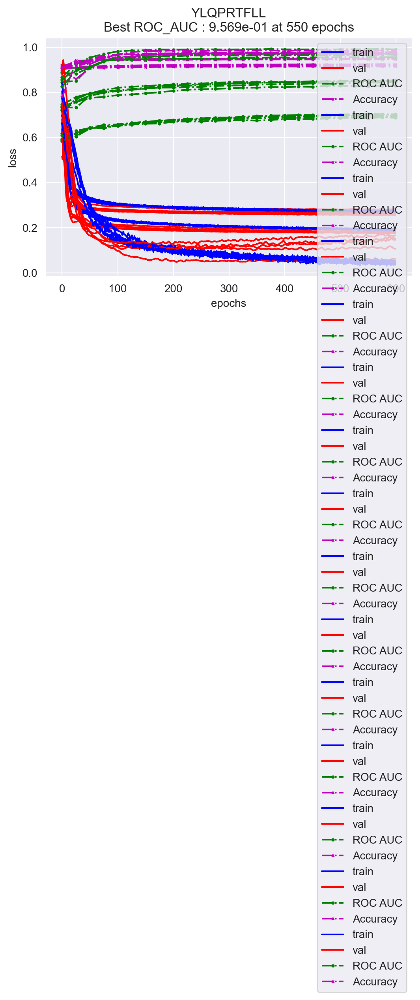

In [337]:
kfold_nn_AE = {}
random.seed(20)
torch.manual_seed(20)
for epi, n_layers, hidden, lr, wd in zip(sorted(epitopes.epitope.unique(), key=str),
                                        [4,3,3],[256,256,128],
                                        [1e-3, 1e-3,5e-4], [1e-2, 1e-2, 1e-5]):
    
    df = get_AE_df_nn(epitopes, neg_emerson, epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(40)]].values)
    y = torch.tensor(df['label'].values).float()
    
    if not epi.startswith('Y'):
        bs = 2**16
    else:
        bs = 2**13
        
    model = MLP_AnotherBinary(40)
    roc_dict = kfold_cv(model, X,y, k=5, random_state = 20,
                        lr=lr, wd=wd, nb_epochs=600, 
                        batch_size=bs, loss_weight = None, device='cuda', 
                        outdir=f'../output/epitopes_classification/auto_encoder/',
                        filename = epi)
    kfold_nn_AE[epi] = roc_dict

In [338]:
save_pkl('../output/epitopes_classification/auto_encoder/kfold_nn_AE.pkl',
         kfold_nn_AE)

## Logistic KFOLD

In [339]:
from sklearn.linear_model import LogisticRegressionCV
kfold_log_AE = {}
nb_epochs = 500
random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    df = get_AE_df_nn(epitopes, neg_emerson, epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(40)]].values)
    y = torch.tensor(df['label'].values).float()
    if not epi.startswith('Y'):
        bs = 2**16
    else:
        bs = 2**13
    clf = LogisticRegressionCV(30, penalty='l2',solver = 'lbfgs',
                               max_iter = 600, cv = 5, n_jobs = 12)
    roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20)
    kfold_log_AE[epi] = roc_dict

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
At fold 1, Test AUC: 0.7651411864450022
Fold number 2:
At fold 2, Test AUC: 0.7637936204578782
Fold number 3:
At fold 3, Test AUC: 0.7629217961260845
Fold number 4:
At fold 4, Test AUC: 0.7790345466328432
Fold number 5:
At fold 5, Test AUC: 0.7659549252035384
EPITOPE: NLVPMVATV
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
At fold 1, Test AUC: 0.631764896196216
Fold number 2:
At fold 2, Test AUC: 0.6375312610744802
Fold number 3:
At fold 3, Test AUC: 0.6320143735778749
Fold number 4:
At fold 4, Test AUC: 0.632435638274871
Fold number 5:
At fold 5, Test AUC: 0.6317787929630034
EPITOPE: YLQPRTFLL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
At fold 1, Test AUC: 0.9364571103283881
Fold number 2:
At fold 2, Test AUC: 0.9084476090014064
Fold number 3:
At fold 3, Test AUC: 0.9586319290960641
Fold number 4:
At fold 4, Test AUC: 0.918952922077922
Fold number 5:
At fold 5, Test AUC: 0.9028571428571429


In [365]:
save_pkl('../output/epitopes_classification/kfold_logreg_AE_dict.pkl', kfold_log_AE)

## Random Forest KFOLD

In [341]:
from sklearn.ensemble import RandomForestClassifier
kfold_rf_AE = {}
nb_epochs = 500
random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    df = get_AE_df_nn(epitopes, neg_emerson, epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(40)]].values)
    y = torch.tensor(df['label'].values).float()
    for n_est in [100,200,300]:
        for depth in [7,12,25]:
            clf = RandomForestClassifier(n_estimators=n_est, random_state = 20,
                                         max_depth = depth, n_jobs=12)
            params = ['n_est',n_est, 'depth',depth]
            name = '_'.join([str(x) for x in params])
            print(f'\n#############\nName : {name}')
            roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20)
            avg_roc_auc = np.mean([x[1] for x in roc_dict.values()])
            kfold_rf_AE[epi+name] = (roc_dict, avg_roc_auc)
            print('#############')

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.8091516547310411
Fold number 2:
At fold 2, Test AUC: 0.7881588723801888
Fold number 3:
At fold 3, Test AUC: 0.7904248799126703
Fold number 4:
At fold 4, Test AUC: 0.7949862800538097
Fold number 5:
At fold 5, Test AUC: 0.7885837046833308
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.8220203949059837
Fold number 2:
At fold 2, Test AUC: 0.798154848074636
Fold number 3:
At fold 3, Test AUC: 0.8066080275232548
Fold number 4:
At fold 4, Test AUC: 0.8130902901033907
Fold number 5:
At fold 5, Test AUC: 0.8078438144529054
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.8181579820190408
Fold number 2:
At fold 2, Test AUC: 0.8011438149007352
Fold number 3:
At fold 3, Test AUC: 0.8016306956152102
Fold number 4:
At fold 4, Test AUC: 0.8167659958560652
Fold number 5:
At fold 5, Test AUC: 0.8035610864724194
#############

###########

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.6522432924752117
Fold number 2:
At fold 2, Test AUC: 0.6294467326442639
Fold number 3:
At fold 3, Test AUC: 0.6430260151992409
Fold number 4:
At fold 4, Test AUC: 0.634840092593961
Fold number 5:
At fold 5, Test AUC: 0.6629687090213405
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.6668483518207594
Fold number 2:
At fold 2, Test AUC: 0.6493153498504604
Fold number 3:
At fold 3, Test AUC: 0.6663003993733138
Fold number 4:
At fold 4, Test AUC: 0.6543606358527363
Fold number 5:
At fold 5, Test AUC: 0.6842989425226267
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.6675719141658728
Fold number 2:
At fold 2, Test AUC: 0.66742141485666
Fold number 3:
At fold 3, Test AUC: 0.6634958708331417
Fold number 4:
At fold 4, Test AUC: 0.6692236196706882
Fold number 5:
At fold 5, Test AUC: 0.6831020942863049
#############

#############

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.9707368271249155
Fold number 2:
At fold 2, Test AUC: 0.9628164556962024
Fold number 3:
At fold 3, Test AUC: 0.9812247449378251
Fold number 4:
At fold 4, Test AUC: 0.9656250000000002
Fold number 5:
At fold 5, Test AUC: 0.961853281853282
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.973600882342477
Fold number 2:
At fold 2, Test AUC: 0.9530810478199718
Fold number 3:
At fold 3, Test AUC: 0.9845288326300985
Fold number 4:
At fold 4, Test AUC: 0.973133116883117
Fold number 5:
At fold 5, Test AUC: 0.9611776061776063
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.9689223325150319
Fold number 2:
At fold 2, Test AUC: 0.95823444092827
Fold number 3:
At fold 3, Test AUC: 0.9868617864398456
Fold number 4:
At fold 4, Test AUC: 0.9632609577922078
Fold number 5:
At fold 5, Test AUC: 0.963465250965251
#############

#############
Na

In [342]:
top5_keys = []
for epi in epitopes.epitope.unique():
    keys = [x for x in sorted(kfold_rf_AE, key = lambda x: kfold_rf_AE[x][1],
                              reverse=True) if epi in x]
    for k in keys[0:5]:
        print(f'Params: {k}, ROC: {kfold_rf_AE[k][1]}')
        top5_keys.append(k)
    print('\n')
top5_kfold_AE_rf = dict((k, kfold_rf_AE[k]) for k in top5_keys)

Params: GILGFVFTLn_est_300_depth_12, ROC: 0.8128425555869592
Params: GILGFVFTLn_est_200_depth_12, ROC: 0.8115691529552205
Params: GILGFVFTLn_est_300_depth_25, ROC: 0.8108596536891903
Params: GILGFVFTLn_est_200_depth_25, ROC: 0.8099967365841199
Params: GILGFVFTLn_est_100_depth_12, ROC: 0.8095434750120342


Params: NLVPMVATVn_est_300_depth_25, ROC: 0.6778448320728263
Params: NLVPMVATVn_est_200_depth_25, ROC: 0.6753777727322586
Params: NLVPMVATVn_est_100_depth_25, ROC: 0.6701629827625335
Params: NLVPMVATVn_est_300_depth_12, ROC: 0.6682033225405438
Params: NLVPMVATVn_est_200_depth_12, ROC: 0.6667474680363277


Params: YLQPRTFLLn_est_300_depth_12, ROC: 0.9718955125085268
Params: YLQPRTFLLn_est_300_depth_25, ROC: 0.9713236995194541
Params: YLQPRTFLLn_est_200_depth_12, ROC: 0.9712644731678373
Params: YLQPRTFLLn_est_200_depth_25, ROC: 0.971214113879799
Params: YLQPRTFLLn_est_300_depth_7, ROC: 0.9694396059313573




In [343]:
save_pkl('../output/epitopes_classification/kfold_top5_AE_rf_dict.pkl', top5_kfold_AE_rf)
save_pkl('../output/epitopes_classification/kfold_AE_rf_dict.pkl', kfold_rf_AE)

## XGBoost AE

In [344]:
import xgboost as xgb
kfold_xgb_AE = {}
random.seed(20)
torch.manual_seed(20)

n_estimators = [100, 250]
max_depth = [6, 11]
learning_rate = [0.3, 0.55]
min_child_weight = [5, 15]
lambda_ = [10]
alpha = [0]
tree_method = 'gpu_hist'


for epi in tqdm(sorted(epitopes.epitope.unique(), key=str)):
    print(f'EPITOPE: {epi}')
    df = get_df_nn(epitopes, neg_emerson, epi, verbose = False, random_state = 20)
    X = df[['z_'+str(i) for i in range(100)]].values
    y = df['label'].values
    for n_est in n_estimators:
        for depth in max_depth:
            for lr in learning_rate:
                for weight in min_child_weight:
                    for lamb in lambda_:
                        for alph in alpha:
                            clf = xgb.XGBClassifier(n_estimators = n_est, 
                                                    learning_rate = lr,
                                                    objective='binary:logistic', 
                                                    missing=None, seed=20,
                                                    tree_method = 'gpu_hist',
                                                    max_depth = depth, n_jobs = 8,
                                                    reg_lambda = lamb, reg_alpha = alph)
                            params = ['n_est',n_est, 'depth',depth, 'lr',lr,'weight',weight, 'lambda',lamb, 'alpha',alph]
                            name = '_'.join([str(x) for x in params])
                            print(f'\n#############\nName : {name}')
                            roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20,
                                                early_stopping_rounds = 3)#kwargs here
                            avg_roc_auc = np.mean([x[1] for x in roc_dict.values()])
                            kfold_xgb_AE[epi+name] = (roc_dict, avg_roc_auc)
                            print(f'Avg ROC AUC for {name}: {avg_roc_auc}')
                            print('#############')

  0%|          | 0/3 [00:00<?, ?it/s]

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.87569631568928
Fold number 2:
At fold 2, Test AUC: 0.8664479592308096
Fold number 3:
At fold 3, Test AUC: 0.8757791442425154
Fold number 4:
At fold 4, Test AUC: 0.8734072424225847
Fold number 5:
At fold 5, Test AUC: 0.8679785750050312
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0: 0.8718618473180442
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.87569631568928
Fold number 2:
At fold 2, Test AUC: 0.8664479592308096
Fold number 3:
At fold 3, Test AUC: 0.8757791442425154
Fold number 4:
At fold 4, Test AUC: 0.8734072424225847
Fold number 5:
At fold 5, Test AUC: 0.8679785750050312
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0: 0.8718618473180442
#############

#############
Name : n_est_100_depth_6_lr_0.55_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1,

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.7345936370720494
Fold number 2:
At fold 2, Test AUC: 0.720321497686407
Fold number 3:
At fold 3, Test AUC: 0.7291288119481502
Fold number 4:
At fold 4, Test AUC: 0.722443854374156
Fold number 5:
At fold 5, Test AUC: 0.7363177955283219
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0: 0.7285611193218169
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.7345936370720494
Fold number 2:
At fold 2, Test AUC: 0.720321497686407
Fold number 3:
At fold 3, Test AUC: 0.7291288119481502
Fold number 4:
At fold 4, Test AUC: 0.722443854374156
Fold number 5:
At fold 5, Test AUC: 0.7363177955283219
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0: 0.7285611193218169
#############

#############
Name : n_est_100_depth_6_lr_0.55_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1,

batch:   0%|          | 0/1 [00:00<?, ?it/s]


#############
Name : n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.9624114989148611
Fold number 2:
At fold 2, Test AUC: 0.9671237693389593
Fold number 3:
At fold 3, Test AUC: 0.9862925010604335
Fold number 4:
At fold 4, Test AUC: 0.9755073051948052
Fold number 5:
At fold 5, Test AUC: 0.95992277992278
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0: 0.9702515708863679
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.9624114989148611
Fold number 2:
At fold 2, Test AUC: 0.9671237693389593
Fold number 3:
At fold 3, Test AUC: 0.9862925010604335
Fold number 4:
At fold 4, Test AUC: 0.9755073051948052
Fold number 5:
At fold 5, Test AUC: 0.95992277992278
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0: 0.9702515708863679
#############

#############
Name : n_est_100_depth_6_lr_0.55_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1,

In [345]:
top5_keys = []
for epi in epitopes.epitope.unique():
    keys = [x for x in sorted(kfold_xgb_AE, key = lambda x: kfold_xgb_AE[x][1],
                              reverse=True) if epi in x]
    for k in keys[0:5]:
        print(f'Params: {k}, ROC: {kfold_xgb_AE[k][1]}')
        top5_keys.append(k)
    print('\n')
top5_kfold_xgb_AE = dict((k, kfold_xgb_AE[k]) for k in top5_keys)

Params: GILGFVFTLn_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.8718618473180442
Params: GILGFVFTLn_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0, ROC: 0.8718618473180442
Params: GILGFVFTLn_est_250_depth_6_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.8718618473180442
Params: GILGFVFTLn_est_250_depth_6_lr_0.3_weight_15_lambda_10_alpha_0, ROC: 0.8718618473180442
Params: GILGFVFTLn_est_100_depth_6_lr_0.55_weight_5_lambda_10_alpha_0, ROC: 0.865044885717775


Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.7285611193218169
Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0, ROC: 0.7285611193218169
Params: NLVPMVATVn_est_250_depth_6_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.7285611193218169
Params: NLVPMVATVn_est_250_depth_6_lr_0.3_weight_15_lambda_10_alpha_0, ROC: 0.7285611193218169
Params: NLVPMVATVn_est_100_depth_6_lr_0.55_weight_5_lambda_10_alpha_0, ROC: 0.7185987080662385


Params: YLQPRTFLLn_est_100_depth_6_lr_0.3_weight_5_

In [346]:
save_pkl('../output/epitopes_classification/kfold_top5_xgb_AE_dict.pkl', top5_kfold_xgb_AE)
save_pkl('../output/epitopes_classification/kfold_xgb_AE_dict.pkl', kfold_xgb_AE)

# One-hot encoding & Atchley 

In [351]:
def get_atchley_values(epitopes_df, neg_df, epitope, verbose =False, random_state=20):
    torch.manual_seed(random_state)
    print('Getting merged_df')
    df_nn = get_df(epitopes_df, neg_df, epitope, verbose)
    print('Embedding')
    sequences = df_nn.amino_acid.values
    X = np.array(atchley_batch(sequences, 23))
    y = df_nn['label'].values
    return X, y

def get_oh_atchley_values(epitopes_df, neg_df, epitope, verbose =False, random_state=20):
    torch.manual_seed(random_state)
    print('Getting merged_df')
    df_nn = get_df(epitopes_df, neg_df, epitope, verbose)
    print('Embedding')
    sequences = df_nn.amino_acid.values
    X = np.array(onehot_batch(sequences, 23, 1, 'before',False, atchley=True).unsqueeze(1))
    y = df_nn['label'].values
    return X, y

class MLP_Flat_Atchley(nn.Module):
    #Reusing an architecture from Deepcat 
    def __init__(self):
        super(MLP_Flat_Atchley, self).__init__()
            
        self.layers = nn.Sequential(nn.Linear(115, 256),
                                    nn.BatchNorm1d(256),
                                    nn.SELU(),
                                    nn.Dropout(0.4),
                                    nn.Linear(256, 512),
                                    nn.BatchNorm1d(512),
                                    nn.SELU(),
                                    nn.Dropout(0.4),
                                    nn.Linear(512, 512),
                                    nn.BatchNorm1d(512),
                                    nn.SELU(),
                                    nn.Dropout(0.4),
                                    nn.Linear(512, 256),
                                    nn.BatchNorm1d(256),
                                    nn.SELU(),
                                    nn.Dropout(0.4),
                                   )
        self.output = nn.Sequential(nn.Linear(256, 64),
                                    nn.SELU(),
                                    nn.Dropout(0.4),
                                    nn.Linear(64, 10),
                                    nn.SELU(),
                                    nn.Dropout(0.4),
                                    nn.Linear(10,1))

    def forward(self, x):
        x = self.layers(x.view(-1,x.shape[1]*x.shape[2]))
        x = self.output(x)
        return x.view(-1,)
    
    def reset_params(self):
        i = 0
        for x in self.children():
            if x.__class__.__name__ == 'Sequential':
                for layer in x:
                    if hasattr(layer, 'reset_parameters'):
                        layer.reset_parameters()
                        layer.zero_grad()
                        i += 1
            if hasattr(x, 'reset_parameters'):
                x.reset_parameters()
                x.zero_grad()
                i += 1
        if i >= 1: print('Parameters reset.')
            

In [352]:
kfold_nn_atchley = {}

random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    
    X,y = get_atchley_values(epitopes, neg_emerson, epi, 
                             verbose =False, random_state=20)
    X = torch.tensor(X).to('cuda')
    y = torch.tensor(y).float()
    if not epi.startswith('Y'):
        bs = 2**16
    else:
        bs = 2**13
        
    model = MLP_Flat_Atchley()
    roc_dict = kfold_cv(model, X,y, k=5, random_state = 20,
                        lr=1e-4, wd=1e-4, nb_epochs=600, 
                        batch_size=bs, loss_weight = None, device='cuda', 
                        outdir=f'../output/epitopes_classification/atchley/',
                        filename = epi)
    plt.close()
    kfold_nn_atchley[epi] = roc_dict

Getting merged_df
Embedding
Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.134e-01	Val: 7.753e-01
		ROC AUC :0.639, 	accuracy: 0.909
Epoch:25;	Train: 5.487e-01	Val: 4.325e-01
		ROC AUC :0.756, 	accuracy: 0.909
Epoch:50;	Train: 4.432e-01	Val: 3.095e-01
		ROC AUC :0.758, 	accuracy: 0.909
Epoch:75;	Train: 4.009e-01	Val: 2.765e-01
		ROC AUC :0.767, 	accuracy: 0.909
Epoch:100;	Train: 3.616e-01	Val: 2.598e-01
		ROC AUC :0.775, 	accuracy: 0.909
Epoch:125;	Train: 3.277e-01	Val: 2.277e-01
		ROC AUC :0.787, 	accuracy: 0.935
Epoch:150;	Train: 2.990e-01	Val: 2.120e-01
		ROC AUC :0.797, 	accuracy: 0.937
Epoch:175;	Train: 2.866e-01	Val: 2.042e-01
		ROC AUC :0.805, 	accuracy: 0.942
Epoch:200;	Train: 2.741e-01	Val: 2.036e-01
		ROC AUC :0.810, 	accuracy: 0.944
Epoch:225;	Train: 2.670e-01	Val: 2.003e-01
		ROC AUC :0.817, 	accuracy: 0.945
Epoch:250;	Train: 2.618e-01	Val: 1.996e-01
		ROC AUC :0.821, 	accuracy: 0.946
Epoch:275;	Train: 2.561e-01	Val: 1.961e-01
		ROC AUC :0.827, 	accuracy: 0.945
Epoch:300;	Train: 2.524e-01	Val: 1.973e-01
		ROC AUC :0.832, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.571e-01	Val: 8.574e-01
		ROC AUC :0.666, 	accuracy: 0.908
Epoch:25;	Train: 6.332e-01	Val: 4.489e-01
		ROC AUC :0.733, 	accuracy: 0.908
Epoch:50;	Train: 4.965e-01	Val: 3.173e-01
		ROC AUC :0.731, 	accuracy: 0.908
Epoch:75;	Train: 4.191e-01	Val: 2.751e-01
		ROC AUC :0.742, 	accuracy: 0.908
Epoch:100;	Train: 3.705e-01	Val: 2.621e-01
		ROC AUC :0.752, 	accuracy: 0.935
Epoch:125;	Train: 3.380e-01	Val: 2.279e-01
		ROC AUC :0.769, 	accuracy: 0.934
Epoch:150;	Train: 3.175e-01	Val: 2.232e-01
		ROC AUC :0.775, 	accuracy: 0.937
Epoch:175;	Train: 3.071e-01	Val: 2.198e-01
		ROC AUC :0.781, 	accuracy: 0.938
Epoch:200;	Train: 2.906e-01	Val: 2.192e-01
		ROC AUC :0.784, 	accuracy: 0.938
Epoch:225;	Train: 2.866e-01	Val: 2.172e-01
		ROC AUC :0.787, 	accuracy: 0.940
Epoch:250;	Train: 2.785e-01	Val: 2.162e-01
		ROC AUC :0.790, 	accuracy: 0.940
Epoch:275;	Train: 2.721e-01	Val: 2.130e-01
		ROC AUC :0.792, 	accuracy: 0.940
Epoch:300;	Train: 2.664e-01	Val: 2.157e-01
		ROC AUC :0.793, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.363e-01	Val: 6.207e-01
		ROC AUC :0.666, 	accuracy: 0.910
Epoch:25;	Train: 5.114e-01	Val: 4.251e-01
		ROC AUC :0.743, 	accuracy: 0.910
Epoch:50;	Train: 4.141e-01	Val: 3.088e-01
		ROC AUC :0.747, 	accuracy: 0.910
Epoch:75;	Train: 3.675e-01	Val: 2.801e-01
		ROC AUC :0.751, 	accuracy: 0.910
Epoch:100;	Train: 3.464e-01	Val: 2.700e-01
		ROC AUC :0.757, 	accuracy: 0.910
Epoch:125;	Train: 3.159e-01	Val: 2.499e-01
		ROC AUC :0.769, 	accuracy: 0.910
Epoch:150;	Train: 2.918e-01	Val: 2.258e-01
		ROC AUC :0.787, 	accuracy: 0.925
Epoch:175;	Train: 2.702e-01	Val: 2.159e-01
		ROC AUC :0.792, 	accuracy: 0.936
Epoch:200;	Train: 2.599e-01	Val: 2.121e-01
		ROC AUC :0.797, 	accuracy: 0.938
Epoch:225;	Train: 2.521e-01	Val: 2.121e-01
		ROC AUC :0.802, 	accuracy: 0.939
Epoch:250;	Train: 2.480e-01	Val: 2.084e-01
		ROC AUC :0.808, 	accuracy: 0.941
Epoch:275;	Train: 2.455e-01	Val: 2.069e-01
		ROC AUC :0.811, 	accuracy: 0.942
Epoch:300;	Train: 2.409e-01	Val: 2.048e-01
		ROC AUC :0.814, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.217e-01	Val: 6.810e-01
		ROC AUC :0.740, 	accuracy: 0.910
Epoch:25;	Train: 5.702e-01	Val: 4.440e-01
		ROC AUC :0.761, 	accuracy: 0.910
Epoch:50;	Train: 4.710e-01	Val: 3.441e-01
		ROC AUC :0.762, 	accuracy: 0.910
Epoch:75;	Train: 4.122e-01	Val: 3.002e-01
		ROC AUC :0.764, 	accuracy: 0.910
Epoch:100;	Train: 3.795e-01	Val: 2.967e-01
		ROC AUC :0.764, 	accuracy: 0.910
Epoch:125;	Train: 3.554e-01	Val: 2.802e-01
		ROC AUC :0.770, 	accuracy: 0.910
Epoch:150;	Train: 3.399e-01	Val: 2.724e-01
		ROC AUC :0.780, 	accuracy: 0.910
Epoch:175;	Train: 3.274e-01	Val: 2.684e-01
		ROC AUC :0.786, 	accuracy: 0.910
Epoch:200;	Train: 3.185e-01	Val: 2.657e-01
		ROC AUC :0.792, 	accuracy: 0.913
Epoch:225;	Train: 3.122e-01	Val: 2.651e-01
		ROC AUC :0.795, 	accuracy: 0.912
Epoch:250;	Train: 3.066e-01	Val: 2.577e-01
		ROC AUC :0.799, 	accuracy: 0.913
Epoch:275;	Train: 2.909e-01	Val: 2.380e-01
		ROC AUC :0.804, 	accuracy: 0.937
Epoch:300;	Train: 2.808e-01	Val: 2.382e-01
		ROC AUC :0.798, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.033e-01	Val: 6.307e-01
		ROC AUC :0.668, 	accuracy: 0.909
Epoch:25;	Train: 5.272e-01	Val: 3.844e-01
		ROC AUC :0.742, 	accuracy: 0.909
Epoch:50;	Train: 4.310e-01	Val: 3.138e-01
		ROC AUC :0.741, 	accuracy: 0.909
Epoch:75;	Train: 3.794e-01	Val: 2.792e-01
		ROC AUC :0.759, 	accuracy: 0.909
Epoch:100;	Train: 3.487e-01	Val: 2.642e-01
		ROC AUC :0.769, 	accuracy: 0.909
Epoch:125;	Train: 3.224e-01	Val: 2.641e-01
		ROC AUC :0.767, 	accuracy: 0.937
Epoch:150;	Train: 3.006e-01	Val: 2.162e-01
		ROC AUC :0.795, 	accuracy: 0.931
Epoch:175;	Train: 2.892e-01	Val: 2.129e-01
		ROC AUC :0.799, 	accuracy: 0.934
Epoch:200;	Train: 2.840e-01	Val: 2.143e-01
		ROC AUC :0.807, 	accuracy: 0.934
Epoch:225;	Train: 2.733e-01	Val: 2.074e-01
		ROC AUC :0.810, 	accuracy: 0.941
Epoch:250;	Train: 2.709e-01	Val: 2.067e-01
		ROC AUC :0.817, 	accuracy: 0.940
Epoch:275;	Train: 2.679e-01	Val: 2.046e-01
		ROC AUC :0.819, 	accuracy: 0.942
Epoch:300;	Train: 2.652e-01	Val: 1.992e-01
		ROC AUC :0.823, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.079e-01	Val: 7.357e-01
		ROC AUC :0.538, 	accuracy: 0.909
Epoch:25;	Train: 5.729e-01	Val: 4.320e-01
		ROC AUC :0.589, 	accuracy: 0.909
Epoch:50;	Train: 4.620e-01	Val: 3.420e-01
		ROC AUC :0.593, 	accuracy: 0.909
Epoch:75;	Train: 3.969e-01	Val: 3.067e-01
		ROC AUC :0.612, 	accuracy: 0.909
Epoch:100;	Train: 3.681e-01	Val: 2.990e-01
		ROC AUC :0.626, 	accuracy: 0.909
Epoch:125;	Train: 3.563e-01	Val: 2.958e-01
		ROC AUC :0.620, 	accuracy: 0.909
Epoch:150;	Train: 3.458e-01	Val: 2.925e-01
		ROC AUC :0.641, 	accuracy: 0.910
Epoch:175;	Train: 3.414e-01	Val: 2.918e-01
		ROC AUC :0.656, 	accuracy: 0.911
Epoch:200;	Train: 3.368e-01	Val: 2.887e-01
		ROC AUC :0.660, 	accuracy: 0.911
Epoch:225;	Train: 3.322e-01	Val: 2.899e-01
		ROC AUC :0.667, 	accuracy: 0.911
Epoch:250;	Train: 3.301e-01	Val: 2.878e-01
		ROC AUC :0.668, 	accuracy: 0.912
Epoch:275;	Train: 3.245e-01	Val: 2.865e-01
		ROC AUC :0.673, 	accuracy: 0.912
Epoch:300;	Train: 3.238e-01	Val: 2.854e-01
		ROC AUC :0.674, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.150e-01	Val: 5.408e-01
		ROC AUC :0.492, 	accuracy: 0.905
Epoch:25;	Train: 4.944e-01	Val: 3.699e-01
		ROC AUC :0.574, 	accuracy: 0.905
Epoch:50;	Train: 4.070e-01	Val: 3.216e-01
		ROC AUC :0.581, 	accuracy: 0.905
Epoch:75;	Train: 3.732e-01	Val: 3.126e-01
		ROC AUC :0.592, 	accuracy: 0.905
Epoch:100;	Train: 3.517e-01	Val: 3.088e-01
		ROC AUC :0.599, 	accuracy: 0.906
Epoch:125;	Train: 3.399e-01	Val: 3.074e-01
		ROC AUC :0.593, 	accuracy: 0.906
Epoch:150;	Train: 3.314e-01	Val: 3.053e-01
		ROC AUC :0.591, 	accuracy: 0.906
Epoch:175;	Train: 3.251e-01	Val: 3.045e-01
		ROC AUC :0.617, 	accuracy: 0.907
Epoch:200;	Train: 3.239e-01	Val: 3.034e-01
		ROC AUC :0.634, 	accuracy: 0.908
Epoch:225;	Train: 3.178e-01	Val: 3.002e-01
		ROC AUC :0.643, 	accuracy: 0.908
Epoch:250;	Train: 3.158e-01	Val: 2.999e-01
		ROC AUC :0.654, 	accuracy: 0.909
Epoch:275;	Train: 3.095e-01	Val: 3.004e-01
		ROC AUC :0.660, 	accuracy: 0.909
Epoch:300;	Train: 3.101e-01	Val: 2.969e-01
		ROC AUC :0.663, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.910e-01	Val: 6.492e-01
		ROC AUC :0.514, 	accuracy: 0.913
Epoch:25;	Train: 5.396e-01	Val: 3.672e-01
		ROC AUC :0.568, 	accuracy: 0.913
Epoch:50;	Train: 4.248e-01	Val: 2.945e-01
		ROC AUC :0.577, 	accuracy: 0.913
Epoch:75;	Train: 3.874e-01	Val: 2.907e-01
		ROC AUC :0.595, 	accuracy: 0.913
Epoch:100;	Train: 3.702e-01	Val: 2.885e-01
		ROC AUC :0.587, 	accuracy: 0.913
Epoch:125;	Train: 3.620e-01	Val: 2.857e-01
		ROC AUC :0.602, 	accuracy: 0.914
Epoch:150;	Train: 3.531e-01	Val: 2.839e-01
		ROC AUC :0.623, 	accuracy: 0.915
Epoch:175;	Train: 3.487e-01	Val: 2.835e-01
		ROC AUC :0.633, 	accuracy: 0.915
Epoch:200;	Train: 3.397e-01	Val: 2.819e-01
		ROC AUC :0.646, 	accuracy: 0.915
Epoch:225;	Train: 3.410e-01	Val: 2.809e-01
		ROC AUC :0.652, 	accuracy: 0.915
Epoch:250;	Train: 3.341e-01	Val: 2.794e-01
		ROC AUC :0.659, 	accuracy: 0.915
Epoch:275;	Train: 3.316e-01	Val: 2.794e-01
		ROC AUC :0.661, 	accuracy: 0.916
Epoch:300;	Train: 3.288e-01	Val: 2.784e-01
		ROC AUC :0.664, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.399e-01	Val: 6.298e-01
		ROC AUC :0.525, 	accuracy: 0.910
Epoch:25;	Train: 5.360e-01	Val: 4.094e-01
		ROC AUC :0.553, 	accuracy: 0.910
Epoch:50;	Train: 4.335e-01	Val: 3.232e-01
		ROC AUC :0.558, 	accuracy: 0.910
Epoch:75;	Train: 3.945e-01	Val: 3.041e-01
		ROC AUC :0.573, 	accuracy: 0.910
Epoch:100;	Train: 3.746e-01	Val: 2.994e-01
		ROC AUC :0.598, 	accuracy: 0.910
Epoch:125;	Train: 3.663e-01	Val: 2.965e-01
		ROC AUC :0.608, 	accuracy: 0.910
Epoch:150;	Train: 3.562e-01	Val: 2.956e-01
		ROC AUC :0.620, 	accuracy: 0.911
Epoch:175;	Train: 3.472e-01	Val: 2.907e-01
		ROC AUC :0.631, 	accuracy: 0.911
Epoch:200;	Train: 3.413e-01	Val: 2.891e-01
		ROC AUC :0.641, 	accuracy: 0.912
Epoch:225;	Train: 3.358e-01	Val: 2.882e-01
		ROC AUC :0.649, 	accuracy: 0.912
Epoch:250;	Train: 3.333e-01	Val: 2.868e-01
		ROC AUC :0.654, 	accuracy: 0.912
Epoch:275;	Train: 3.276e-01	Val: 2.854e-01
		ROC AUC :0.658, 	accuracy: 0.912
Epoch:300;	Train: 3.230e-01	Val: 2.844e-01
		ROC AUC :0.661, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.159e-01	Val: 5.690e-01
		ROC AUC :0.509, 	accuracy: 0.909
Epoch:25;	Train: 5.139e-01	Val: 3.781e-01
		ROC AUC :0.578, 	accuracy: 0.909
Epoch:50;	Train: 4.139e-01	Val: 3.095e-01
		ROC AUC :0.589, 	accuracy: 0.909
Epoch:75;	Train: 3.751e-01	Val: 3.016e-01
		ROC AUC :0.605, 	accuracy: 0.909
Epoch:100;	Train: 3.570e-01	Val: 2.987e-01
		ROC AUC :0.615, 	accuracy: 0.909
Epoch:125;	Train: 3.458e-01	Val: 2.958e-01
		ROC AUC :0.611, 	accuracy: 0.909
Epoch:150;	Train: 3.361e-01	Val: 2.939e-01
		ROC AUC :0.631, 	accuracy: 0.909
Epoch:175;	Train: 3.326e-01	Val: 2.935e-01
		ROC AUC :0.640, 	accuracy: 0.909
Epoch:200;	Train: 3.282e-01	Val: 2.930e-01
		ROC AUC :0.650, 	accuracy: 0.910
Epoch:225;	Train: 3.234e-01	Val: 2.893e-01
		ROC AUC :0.660, 	accuracy: 0.910
Epoch:250;	Train: 3.204e-01	Val: 2.857e-01
		ROC AUC :0.661, 	accuracy: 0.911
Epoch:275;	Train: 3.174e-01	Val: 2.879e-01
		ROC AUC :0.668, 	accuracy: 0.911
Epoch:300;	Train: 3.139e-01	Val: 2.862e-01
		ROC AUC :0.669, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.119e-01	Val: 7.715e-01
		ROC AUC :0.464, 	accuracy: 0.895
Epoch:25;	Train: 5.879e-01	Val: 5.247e-01
		ROC AUC :0.867, 	accuracy: 0.894
Epoch:50;	Train: 4.713e-01	Val: 3.415e-01
		ROC AUC :0.876, 	accuracy: 0.895
Epoch:75;	Train: 3.866e-01	Val: 2.738e-01
		ROC AUC :0.906, 	accuracy: 0.895
Epoch:100;	Train: 3.365e-01	Val: 2.268e-01
		ROC AUC :0.920, 	accuracy: 0.901
Epoch:125;	Train: 2.846e-01	Val: 2.008e-01
		ROC AUC :0.925, 	accuracy: 0.910
Epoch:150;	Train: 2.407e-01	Val: 1.714e-01
		ROC AUC :0.942, 	accuracy: 0.912
Epoch:175;	Train: 2.122e-01	Val: 1.515e-01
		ROC AUC :0.955, 	accuracy: 0.929
Epoch:200;	Train: 1.919e-01	Val: 1.363e-01
		ROC AUC :0.965, 	accuracy: 0.935
Epoch:225;	Train: 1.708e-01	Val: 1.306e-01
		ROC AUC :0.968, 	accuracy: 0.937
Epoch:250;	Train: 1.549e-01	Val: 1.249e-01
		ROC AUC :0.970, 	accuracy: 0.941
Epoch:275;	Train: 1.537e-01	Val: 1.157e-01
		ROC AUC :0.974, 	accuracy: 0.947
Epoch:300;	Train: 1.413e-01	Val: 1.133e-01
		ROC AUC :0.972, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.041e-01	Val: 7.513e-01
		ROC AUC :0.739, 	accuracy: 0.917
Epoch:25;	Train: 6.545e-01	Val: 5.462e-01
		ROC AUC :0.868, 	accuracy: 0.745
Epoch:50;	Train: 4.790e-01	Val: 2.951e-01
		ROC AUC :0.877, 	accuracy: 0.917
Epoch:75;	Train: 3.793e-01	Val: 2.314e-01
		ROC AUC :0.894, 	accuracy: 0.919
Epoch:100;	Train: 3.154e-01	Val: 1.949e-01
		ROC AUC :0.909, 	accuracy: 0.923
Epoch:125;	Train: 2.686e-01	Val: 1.687e-01
		ROC AUC :0.921, 	accuracy: 0.920
Epoch:150;	Train: 2.254e-01	Val: 1.452e-01
		ROC AUC :0.937, 	accuracy: 0.942
Epoch:175;	Train: 2.072e-01	Val: 1.331e-01
		ROC AUC :0.942, 	accuracy: 0.959
Epoch:200;	Train: 1.867e-01	Val: 1.244e-01
		ROC AUC :0.946, 	accuracy: 0.960
Epoch:225;	Train: 1.748e-01	Val: 1.319e-01
		ROC AUC :0.943, 	accuracy: 0.954
Epoch:250;	Train: 1.602e-01	Val: 1.219e-01
		ROC AUC :0.945, 	accuracy: 0.964
Epoch:275;	Train: 1.558e-01	Val: 1.200e-01
		ROC AUC :0.945, 	accuracy: 0.970
Epoch:300;	Train: 1.486e-01	Val: 1.257e-01
		ROC AUC :0.943, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.433e-01	Val: 6.849e-01
		ROC AUC :0.734, 	accuracy: 0.919
Epoch:25;	Train: 6.343e-01	Val: 5.657e-01
		ROC AUC :0.888, 	accuracy: 0.880
Epoch:50;	Train: 5.082e-01	Val: 3.850e-01
		ROC AUC :0.901, 	accuracy: 0.912
Epoch:75;	Train: 4.194e-01	Val: 2.786e-01
		ROC AUC :0.929, 	accuracy: 0.919
Epoch:100;	Train: 3.463e-01	Val: 2.153e-01
		ROC AUC :0.952, 	accuracy: 0.919
Epoch:125;	Train: 2.999e-01	Val: 1.725e-01
		ROC AUC :0.965, 	accuracy: 0.929
Epoch:150;	Train: 2.686e-01	Val: 1.360e-01
		ROC AUC :0.976, 	accuracy: 0.947
Epoch:175;	Train: 2.203e-01	Val: 1.169e-01
		ROC AUC :0.979, 	accuracy: 0.963
Epoch:200;	Train: 1.954e-01	Val: 9.445e-02
		ROC AUC :0.982, 	accuracy: 0.968
Epoch:225;	Train: 1.774e-01	Val: 9.342e-02
		ROC AUC :0.982, 	accuracy: 0.969
Epoch:250;	Train: 1.807e-01	Val: 8.782e-02
		ROC AUC :0.982, 	accuracy: 0.966
Epoch:275;	Train: 1.535e-01	Val: 8.307e-02
		ROC AUC :0.982, 	accuracy: 0.966
Epoch:300;	Train: 1.453e-01	Val: 7.401e-02
		ROC AUC :0.984, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.454e-01	Val: 8.884e-01
		ROC AUC :0.578, 	accuracy: 0.721
Epoch:25;	Train: 6.970e-01	Val: 5.863e-01
		ROC AUC :0.878, 	accuracy: 0.904
Epoch:50;	Train: 5.440e-01	Val: 3.540e-01
		ROC AUC :0.893, 	accuracy: 0.911
Epoch:75;	Train: 4.219e-01	Val: 2.492e-01
		ROC AUC :0.923, 	accuracy: 0.910
Epoch:100;	Train: 3.496e-01	Val: 1.997e-01
		ROC AUC :0.932, 	accuracy: 0.910
Epoch:125;	Train: 2.951e-01	Val: 1.698e-01
		ROC AUC :0.945, 	accuracy: 0.920
Epoch:150;	Train: 2.698e-01	Val: 1.451e-01
		ROC AUC :0.957, 	accuracy: 0.930
Epoch:175;	Train: 2.191e-01	Val: 1.278e-01
		ROC AUC :0.964, 	accuracy: 0.944
Epoch:200;	Train: 2.109e-01	Val: 1.162e-01
		ROC AUC :0.971, 	accuracy: 0.946
Epoch:225;	Train: 1.926e-01	Val: 1.107e-01
		ROC AUC :0.975, 	accuracy: 0.947
Epoch:250;	Train: 1.770e-01	Val: 9.786e-02
		ROC AUC :0.976, 	accuracy: 0.959
Epoch:275;	Train: 1.563e-01	Val: 9.894e-02
		ROC AUC :0.977, 	accuracy: 0.961
Epoch:300;	Train: 1.612e-01	Val: 1.036e-01
		ROC AUC :0.978, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.833e-01	Val: 7.516e-01
		ROC AUC :0.663, 	accuracy: 0.904
Epoch:25;	Train: 6.705e-01	Val: 5.602e-01
		ROC AUC :0.866, 	accuracy: 0.921
Epoch:50;	Train: 5.260e-01	Val: 3.993e-01
		ROC AUC :0.887, 	accuracy: 0.897
Epoch:75;	Train: 4.266e-01	Val: 3.014e-01
		ROC AUC :0.904, 	accuracy: 0.903
Epoch:100;	Train: 3.671e-01	Val: 2.404e-01
		ROC AUC :0.919, 	accuracy: 0.904
Epoch:125;	Train: 3.041e-01	Val: 1.953e-01
		ROC AUC :0.936, 	accuracy: 0.919
Epoch:150;	Train: 2.603e-01	Val: 1.629e-01
		ROC AUC :0.949, 	accuracy: 0.948
Epoch:175;	Train: 2.294e-01	Val: 1.423e-01
		ROC AUC :0.957, 	accuracy: 0.950
Epoch:200;	Train: 2.026e-01	Val: 1.334e-01
		ROC AUC :0.959, 	accuracy: 0.948
Epoch:225;	Train: 1.860e-01	Val: 1.216e-01
		ROC AUC :0.965, 	accuracy: 0.952
Epoch:250;	Train: 1.644e-01	Val: 1.202e-01
		ROC AUC :0.964, 	accuracy: 0.959
Epoch:275;	Train: 1.644e-01	Val: 1.158e-01
		ROC AUC :0.965, 	accuracy: 0.963
Epoch:300;	Train: 1.565e-01	Val: 9.476e-02
		ROC AUC :0.971, 	accurac

## Logistic KFOLD

In [353]:
from sklearn.linear_model import LogisticRegressionCV
kfold_log_atchley = {}
nb_epochs = 500
random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    X,y = get_atchley_values(epitopes, neg_emerson, epi, 
                             verbose =False, random_state=20)
    X = X.reshape(-1, 23*5)
    clf = LogisticRegressionCV(30, penalty='l2',solver = 'lbfgs',
                               max_iter = 600, cv = 5, n_jobs = 12)
    roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20)
    kfold_log_atchley[epi] = roc_dict

EPITOPE: GILGFVFTL
Getting merged_df
Embedding
Fold number 1:
At fold 1, Test AUC: 0.8153033918895315
Fold number 2:
At fold 2, Test AUC: 0.7871305801028625
Fold number 3:
At fold 3, Test AUC: 0.7975598687828189
Fold number 4:
At fold 4, Test AUC: 0.8085219493184549
Fold number 5:
At fold 5, Test AUC: 0.8069013930946056
EPITOPE: NLVPMVATV
Getting merged_df
Embedding
Fold number 1:
At fold 1, Test AUC: 0.6924508437009986
Fold number 2:
At fold 2, Test AUC: 0.67235426720506
Fold number 3:
At fold 3, Test AUC: 0.6782791002203851
Fold number 4:
At fold 4, Test AUC: 0.6729567174138062
Fold number 5:
At fold 5, Test AUC: 0.6834295979032822
EPITOPE: YLQPRTFLL
Getting merged_df
Embedding
Fold number 1:
At fold 1, Test AUC: 0.9612907816558153
Fold number 2:
At fold 2, Test AUC: 0.9296105836849509
Fold number 3:
At fold 3, Test AUC: 0.9802424485968789
Fold number 4:
At fold 4, Test AUC: 0.9716112012987013
Fold number 5:
At fold 5, Test AUC: 0.9515444015444016


In [354]:
save_pkl('../output/epitopes_classification/kfold_logreg_atchley_dict.pkl', kfold_log_atchley)

In [355]:
save_pkl('../output/epitopes_classification/kfold_MLP_atchley.pkl', kfold_nn_atchley)

## Random Forest KFOLD

In [356]:
from sklearn.ensemble import RandomForestClassifier
kfold_rf_atchley = {}
nb_epochs = 500
random.seed(20)
torch.manual_seed(20)
for epi in sorted(epitopes.epitope.unique(), key=str):
    print(f'EPITOPE: {epi}')
    X,y = get_atchley_values(epitopes, neg_emerson, epi, 
                             verbose =False, random_state=20)
    X = X.reshape(-1, 23*5)
    for n_est in [100,200,300]:
        for depth in [7,12,25,50]:
            clf = RandomForestClassifier(n_estimators=n_est, random_state = 20,
                                         max_depth = depth, n_jobs=12)
            params = ['n_est',n_est, 'depth',depth]
            name = '_'.join([str(x) for x in params])
            print(f'\n#############\nName : {name}')
            roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20)
            avg_roc_auc = np.mean([x[1] for x in roc_dict.values()])
            kfold_rf_atchley[epi+name] = (roc_dict, avg_roc_auc)
            print('#############')

EPITOPE: GILGFVFTL
Getting merged_df
Embedding

#############
Name : n_est_100_depth_7
Fold number 1:
At fold 1, Test AUC: 0.8398700590141285
Fold number 2:
At fold 2, Test AUC: 0.8255862841645142
Fold number 3:
At fold 3, Test AUC: 0.8394153037293796
Fold number 4:
At fold 4, Test AUC: 0.8420504671210435
Fold number 5:
At fold 5, Test AUC: 0.8330214868333826
#############

#############
Name : n_est_100_depth_12
Fold number 1:
At fold 1, Test AUC: 0.8622573051326788
Fold number 2:
At fold 2, Test AUC: 0.8431512230678831
Fold number 3:
At fold 3, Test AUC: 0.8671363938884289
Fold number 4:
At fold 4, Test AUC: 0.8674802835668507
Fold number 5:
At fold 5, Test AUC: 0.8571514454213078
#############

#############
Name : n_est_100_depth_25
Fold number 1:
At fold 1, Test AUC: 0.8562401994744269
Fold number 2:
At fold 2, Test AUC: 0.8425281016317228
Fold number 3:
At fold 3, Test AUC: 0.8633106006542576
Fold number 4:
At fold 4, Test AUC: 0.8694445897452586
Fold number 5:
At fold 5, Test AU

In [357]:
top5_keys = []
for epi in epitopes.epitope.unique():
    keys = [x for x in sorted(kfold_rf_atchley, key = lambda x: kfold_rf_atchley[x][1],
                              reverse=True) if epi in x]
    for k in keys[0:5]:
        print(f'Params: {k}, ROC: {kfold_rf_atchley[k][1]}')
        top5_keys.append(k)
    print('\n')
top5_kfold_atchley_rf = dict((k, kfold_rf_atchley[k]) for k in top5_keys)

Params: GILGFVFTLn_est_300_depth_12, ROC: 0.8614515202034629
Params: GILGFVFTLn_est_200_depth_12, ROC: 0.8604906425034388
Params: GILGFVFTLn_est_300_depth_25, ROC: 0.8603853315792108
Params: GILGFVFTLn_est_300_depth_50, ROC: 0.8596738005223485
Params: GILGFVFTLn_est_200_depth_25, ROC: 0.8595633947296435


Params: NLVPMVATVn_est_300_depth_25, ROC: 0.7168951404724814
Params: NLVPMVATVn_est_300_depth_12, ROC: 0.7158747219764808
Params: NLVPMVATVn_est_200_depth_25, ROC: 0.7158402607993507
Params: NLVPMVATVn_est_200_depth_12, ROC: 0.7156762940182549
Params: NLVPMVATVn_est_100_depth_12, ROC: 0.7135485591593015


Params: YLQPRTFLLn_est_200_depth_25, ROC: 0.9858921952367027
Params: YLQPRTFLLn_est_200_depth_50, ROC: 0.9858921952367027
Params: YLQPRTFLLn_est_300_depth_25, ROC: 0.9858097843058362
Params: YLQPRTFLLn_est_300_depth_50, ROC: 0.9858097843058362
Params: YLQPRTFLLn_est_300_depth_12, ROC: 0.984361816167057




In [358]:
save_pkl('../output/epitopes_classification/kfold_top5_atchley_rf_dict.pkl', top5_kfold_atchley_rf)
save_pkl('../output/epitopes_classification/kfold_atchley_rf_dict.pkl', kfold_rf_atchley)

## XGBoost atchley

In [359]:
import xgboost as xgb
kfold_xgb_atchley = {}
random.seed(20)
torch.manual_seed(20)

n_estimators = [100, 250]
max_depth = [6, 11]
learning_rate = [0.3]# 0.55]
min_child_weight = [1, 5, 15]
lambda_ = [10]
alpha = [0]
tree_method = 'gpu_hist'


for epi in tqdm(sorted(epitopes.epitope.unique(), key=str)):
    print(f'EPITOPE: {epi}')
    X,y = get_atchley_values(epitopes, neg_emerson, epi, 
                             verbose =False, random_state=20)
    X = X.reshape(-1, 23*5)
    for n_est in n_estimators:
        for depth in max_depth:
            for lr in learning_rate:
                for weight in min_child_weight:
                    for lamb in lambda_:
                        for alph in alpha:
                            clf = xgb.XGBClassifier(n_estimators = n_est, 
                                                    learning_rate = lr,
                                                    objective='binary:logistic', 
                                                    missing=None, seed=20,
                                                    tree_method = 'gpu_hist',
                                                    max_depth = depth, n_jobs = 8,
                                                    reg_lambda = lamb, reg_alpha = alph)
                            params = ['n_est',n_est, 'depth',depth, 'lr',lr,'weight',weight, 'lambda',lamb, 'alpha',alph]
                            name = '_'.join([str(x) for x in params])
                            print(f'\n#############\nName : {name}')
                            roc_dict = kfold_cv(clf, X,y, k=5, random_state = 20,
                                                early_stopping_rounds = 3)#kwargs here
                            avg_roc_auc = np.mean([x[1] for x in roc_dict.values()])
                            kfold_xgb_atchley[epi+name] = (roc_dict, avg_roc_auc)
                            print(f'Avg ROC AUC for {name}: {avg_roc_auc}')
                            print('#############')

  0%|          | 0/3 [00:00<?, ?it/s]

EPITOPE: GILGFVFTL
Getting merged_df
Embedding

#############
Name : n_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.8642797214737242
Fold number 2:
At fold 2, Test AUC: 0.8496651272784498
Fold number 3:
At fold 3, Test AUC: 0.8700526017381289
Fold number 4:
At fold 4, Test AUC: 0.870345011126493
Fold number 5:
At fold 5, Test AUC: 0.856952608868297
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0: 0.8622590140970186
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0
Fold number 1:
At fold 1, Test AUC: 0.8642797214737242
Fold number 2:
At fold 2, Test AUC: 0.8496651272784498
Fold number 3:
At fold 3, Test AUC: 0.8700526017381289
Fold number 4:
At fold 4, Test AUC: 0.870345011126493
Fold number 5:
At fold 5, Test AUC: 0.856952608868297
Avg ROC AUC for n_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0: 0.8622590140970186
#############

#############
Name : n_est_100_depth_6_lr_0.3_weight_1

In [360]:
top5_keys = []
for epi in epitopes.epitope.unique():
    keys = [x for x in sorted(kfold_xgb_atchley, key = lambda x: kfold_xgb_atchley[x][1],
                              reverse=True) if epi in x]
    for k in keys[0:5]:
        print(f'Params: {k}, ROC: {kfold_xgb_atchley[k][1]}')
        top5_keys.append(k)
    print('\n')
top5_kfold_xgb_atchley = dict((k, kfold_xgb_atchley[k]) for k in top5_keys)

Params: GILGFVFTLn_est_100_depth_11_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.8643569859952412
Params: GILGFVFTLn_est_100_depth_11_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.8643569859952412
Params: GILGFVFTLn_est_100_depth_11_lr_0.3_weight_15_lambda_10_alpha_0, ROC: 0.8643569859952412
Params: GILGFVFTLn_est_250_depth_11_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.8643569859952412
Params: GILGFVFTLn_est_250_depth_11_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.8643569859952412


Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.7185478170562792
Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.7185478170562792
Params: NLVPMVATVn_est_100_depth_6_lr_0.3_weight_15_lambda_10_alpha_0, ROC: 0.7185478170562792
Params: NLVPMVATVn_est_250_depth_6_lr_0.3_weight_1_lambda_10_alpha_0, ROC: 0.7185478170562792
Params: NLVPMVATVn_est_250_depth_6_lr_0.3_weight_5_lambda_10_alpha_0, ROC: 0.7185478170562792


Params: YLQPRTFLLn_est_100_depth_6_lr_0.3_weight_

In [361]:
save_pkl('../output/epitopes_classification/kfold_top5_xgb_atchley_dict.pkl', top5_kfold_xgb_atchley)
save_pkl('../output/epitopes_classification/kfold_xgb_atchley_dict.pkl', kfold_xgb_atchley)

# AnotherBinary

In [320]:
from clf.MLP_binary import MLP_AnotherBinary
kfold_nn = {}
random.seed(20)
torch.manual_seed(20)
for epi in tqdm(sorted(epitopes.epitope.unique(), key=str)):
    
    df = get_df_nn(epitopes, neg_emerson,epi, verbose = False, random_state = 20)
    X = torch.tensor(df[['z_'+str(i) for i in range(100)]].values)
    y = torch.tensor(df['label'].values).float()
    wd = 1e-2
    if not epi.startswith('Y'):
        bs = 2**16
        lr = 1e-3
    else:
        bs = 2**13
        lr = 1e-4
        
    model = MLP_AnotherBinary(100)
    roc_dict = kfold_cv(model, X,y, k=5, random_state = 20,
                        lr=lr, wd=wd, nb_epochs=600, 
                        batch_size=bs, loss_weight = None, device='cuda', 
                        outdir=f'../output/epitopes_classification/KCV/',
                        filename = epi)
    plt.close()
    kfold_nn[epi] = roc_dict

  0%|          | 0/3 [00:00<?, ?it/s]

Getting merged_df
Embedding
embedding in latent space


batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.434e-01	Val: 8.068e-01
		ROC AUC :0.752, 	accuracy: 0.896
Epoch:25;	Train: 3.662e-01	Val: 2.584e-01
		ROC AUC :0.758, 	accuracy: 0.919
Epoch:50;	Train: 2.844e-01	Val: 2.163e-01
		ROC AUC :0.810, 	accuracy: 0.937
Epoch:75;	Train: 2.592e-01	Val: 2.068e-01
		ROC AUC :0.820, 	accuracy: 0.936
Epoch:100;	Train: 2.472e-01	Val: 2.049e-01
		ROC AUC :0.826, 	accuracy: 0.937
Epoch:125;	Train: 2.390e-01	Val: 2.038e-01
		ROC AUC :0.826, 	accuracy: 0.937
Epoch:150;	Train: 2.320e-01	Val: 2.014e-01
		ROC AUC :0.830, 	accuracy: 0.939
Epoch:175;	Train: 2.249e-01	Val: 1.973e-01
		ROC AUC :0.836, 	accuracy: 0.940
Epoch:200;	Train: 2.168e-01	Val: 1.975e-01
		ROC AUC :0.840, 	accuracy: 0.941
Epoch:225;	Train: 2.121e-01	Val: 1.930e-01
		ROC AUC :0.842, 	accuracy: 0.943
Epoch:250;	Train: 2.112e-01	Val: 1.909e-01
		ROC AUC :0.846, 	accuracy: 0.944
Epoch:275;	Train: 2.069e-01	Val: 1.891e-01
		ROC AUC :0.850, 	accuracy: 0.945
Epoch:300;	Train: 2.038e-01	Val: 1.889e-01
		ROC AUC :0.851, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.783e-01	Val: 7.629e-01
		ROC AUC :0.748, 	accuracy: 0.917
Epoch:25;	Train: 3.754e-01	Val: 2.594e-01
		ROC AUC :0.766, 	accuracy: 0.919
Epoch:50;	Train: 2.710e-01	Val: 2.308e-01
		ROC AUC :0.793, 	accuracy: 0.932
Epoch:75;	Train: 2.507e-01	Val: 2.182e-01
		ROC AUC :0.805, 	accuracy: 0.933
Epoch:100;	Train: 2.387e-01	Val: 2.177e-01
		ROC AUC :0.803, 	accuracy: 0.933
Epoch:125;	Train: 2.326e-01	Val: 2.148e-01
		ROC AUC :0.806, 	accuracy: 0.934
Epoch:150;	Train: 2.250e-01	Val: 2.107e-01
		ROC AUC :0.810, 	accuracy: 0.936
Epoch:175;	Train: 2.169e-01	Val: 2.081e-01
		ROC AUC :0.819, 	accuracy: 0.938
Epoch:200;	Train: 2.087e-01	Val: 2.021e-01
		ROC AUC :0.829, 	accuracy: 0.940
Epoch:225;	Train: 2.036e-01	Val: 2.018e-01
		ROC AUC :0.833, 	accuracy: 0.941
Epoch:250;	Train: 2.016e-01	Val: 2.006e-01
		ROC AUC :0.837, 	accuracy: 0.941
Epoch:275;	Train: 1.956e-01	Val: 1.980e-01
		ROC AUC :0.841, 	accuracy: 0.943
Epoch:300;	Train: 1.922e-01	Val: 1.949e-01
		ROC AUC :0.844, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.427e-01	Val: 6.962e-01
		ROC AUC :0.744, 	accuracy: 0.910
Epoch:25;	Train: 3.511e-01	Val: 2.510e-01
		ROC AUC :0.765, 	accuracy: 0.924
Epoch:50;	Train: 2.648e-01	Val: 2.172e-01
		ROC AUC :0.806, 	accuracy: 0.935
Epoch:75;	Train: 2.480e-01	Val: 2.108e-01
		ROC AUC :0.813, 	accuracy: 0.936
Epoch:100;	Train: 2.381e-01	Val: 2.100e-01
		ROC AUC :0.818, 	accuracy: 0.935
Epoch:125;	Train: 2.281e-01	Val: 2.075e-01
		ROC AUC :0.824, 	accuracy: 0.935
Epoch:150;	Train: 2.249e-01	Val: 2.040e-01
		ROC AUC :0.832, 	accuracy: 0.935
Epoch:175;	Train: 2.191e-01	Val: 2.015e-01
		ROC AUC :0.838, 	accuracy: 0.937
Epoch:200;	Train: 2.122e-01	Val: 1.999e-01
		ROC AUC :0.845, 	accuracy: 0.939
Epoch:225;	Train: 2.099e-01	Val: 1.996e-01
		ROC AUC :0.849, 	accuracy: 0.939
Epoch:250;	Train: 2.059e-01	Val: 1.981e-01
		ROC AUC :0.849, 	accuracy: 0.940
Epoch:275;	Train: 2.003e-01	Val: 1.977e-01
		ROC AUC :0.851, 	accuracy: 0.941
Epoch:300;	Train: 1.979e-01	Val: 1.951e-01
		ROC AUC :0.851, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.533e-01	Val: 6.131e-01
		ROC AUC :0.761, 	accuracy: 0.910
Epoch:25;	Train: 3.301e-01	Val: 2.450e-01
		ROC AUC :0.770, 	accuracy: 0.921
Epoch:50;	Train: 2.644e-01	Val: 2.197e-01
		ROC AUC :0.804, 	accuracy: 0.934
Epoch:75;	Train: 2.437e-01	Val: 2.082e-01
		ROC AUC :0.817, 	accuracy: 0.936
Epoch:100;	Train: 2.358e-01	Val: 2.067e-01
		ROC AUC :0.821, 	accuracy: 0.936
Epoch:125;	Train: 2.303e-01	Val: 2.052e-01
		ROC AUC :0.824, 	accuracy: 0.937
Epoch:150;	Train: 2.228e-01	Val: 2.020e-01
		ROC AUC :0.829, 	accuracy: 0.939
Epoch:175;	Train: 2.136e-01	Val: 1.975e-01
		ROC AUC :0.837, 	accuracy: 0.939
Epoch:200;	Train: 2.081e-01	Val: 1.947e-01
		ROC AUC :0.844, 	accuracy: 0.941
Epoch:225;	Train: 2.029e-01	Val: 1.899e-01
		ROC AUC :0.851, 	accuracy: 0.943
Epoch:250;	Train: 1.987e-01	Val: 1.878e-01
		ROC AUC :0.854, 	accuracy: 0.945
Epoch:275;	Train: 1.933e-01	Val: 1.881e-01
		ROC AUC :0.857, 	accuracy: 0.945
Epoch:300;	Train: 1.907e-01	Val: 1.830e-01
		ROC AUC :0.858, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.531e-01	Val: 6.045e-01
		ROC AUC :0.762, 	accuracy: 0.909
Epoch:25;	Train: 3.390e-01	Val: 2.605e-01
		ROC AUC :0.757, 	accuracy: 0.918
Epoch:50;	Train: 2.641e-01	Val: 2.258e-01
		ROC AUC :0.794, 	accuracy: 0.934
Epoch:75;	Train: 2.416e-01	Val: 2.116e-01
		ROC AUC :0.808, 	accuracy: 0.937
Epoch:100;	Train: 2.301e-01	Val: 2.068e-01
		ROC AUC :0.820, 	accuracy: 0.939
Epoch:125;	Train: 2.191e-01	Val: 2.021e-01
		ROC AUC :0.826, 	accuracy: 0.940
Epoch:150;	Train: 2.122e-01	Val: 1.989e-01
		ROC AUC :0.834, 	accuracy: 0.941
Epoch:175;	Train: 2.075e-01	Val: 1.968e-01
		ROC AUC :0.837, 	accuracy: 0.941
Epoch:200;	Train: 2.022e-01	Val: 1.953e-01
		ROC AUC :0.837, 	accuracy: 0.943
Epoch:225;	Train: 1.979e-01	Val: 1.941e-01
		ROC AUC :0.841, 	accuracy: 0.943
Epoch:250;	Train: 1.960e-01	Val: 1.941e-01
		ROC AUC :0.841, 	accuracy: 0.943
Epoch:275;	Train: 1.924e-01	Val: 1.934e-01
		ROC AUC :0.842, 	accuracy: 0.944
Epoch:300;	Train: 1.899e-01	Val: 1.932e-01
		ROC AUC :0.844, 	accurac

batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.466e-01	Val: 8.126e-01
		ROC AUC :0.553, 	accuracy: 0.909
Epoch:25;	Train: 4.133e-01	Val: 3.411e-01
		ROC AUC :0.515, 	accuracy: 0.909
Epoch:50;	Train: 3.568e-01	Val: 3.134e-01
		ROC AUC :0.531, 	accuracy: 0.909
Epoch:75;	Train: 3.416e-01	Val: 3.087e-01
		ROC AUC :0.560, 	accuracy: 0.909
Epoch:100;	Train: 3.329e-01	Val: 3.052e-01
		ROC AUC :0.581, 	accuracy: 0.909
Epoch:125;	Train: 3.269e-01	Val: 3.035e-01
		ROC AUC :0.592, 	accuracy: 0.909
Epoch:150;	Train: 3.228e-01	Val: 3.028e-01
		ROC AUC :0.593, 	accuracy: 0.908
Epoch:175;	Train: 3.195e-01	Val: 2.982e-01
		ROC AUC :0.620, 	accuracy: 0.909
Epoch:200;	Train: 3.099e-01	Val: 2.916e-01
		ROC AUC :0.648, 	accuracy: 0.910
Epoch:225;	Train: 3.072e-01	Val: 2.892e-01
		ROC AUC :0.657, 	accuracy: 0.910
Epoch:250;	Train: 2.989e-01	Val: 2.872e-01
		ROC AUC :0.667, 	accuracy: 0.910
Epoch:275;	Train: 2.991e-01	Val: 2.877e-01
		ROC AUC :0.667, 	accuracy: 0.911
Epoch:300;	Train: 2.990e-01	Val: 2.861e-01
		ROC AUC :0.674, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.226e-01	Val: 7.842e-01
		ROC AUC :0.525, 	accuracy: 0.905
Epoch:25;	Train: 4.275e-01	Val: 3.343e-01
		ROC AUC :0.525, 	accuracy: 0.905
Epoch:50;	Train: 3.686e-01	Val: 3.191e-01
		ROC AUC :0.557, 	accuracy: 0.905
Epoch:75;	Train: 3.416e-01	Val: 3.160e-01
		ROC AUC :0.558, 	accuracy: 0.905
Epoch:100;	Train: 3.282e-01	Val: 3.138e-01
		ROC AUC :0.566, 	accuracy: 0.905
Epoch:125;	Train: 3.205e-01	Val: 3.105e-01
		ROC AUC :0.580, 	accuracy: 0.905
Epoch:150;	Train: 3.124e-01	Val: 3.025e-01
		ROC AUC :0.613, 	accuracy: 0.907
Epoch:175;	Train: 3.041e-01	Val: 3.008e-01
		ROC AUC :0.617, 	accuracy: 0.908
Epoch:200;	Train: 3.007e-01	Val: 2.990e-01
		ROC AUC :0.627, 	accuracy: 0.909
Epoch:225;	Train: 2.981e-01	Val: 2.990e-01
		ROC AUC :0.629, 	accuracy: 0.909
Epoch:250;	Train: 2.944e-01	Val: 2.980e-01
		ROC AUC :0.639, 	accuracy: 0.909
Epoch:275;	Train: 2.911e-01	Val: 2.977e-01
		ROC AUC :0.640, 	accuracy: 0.909
Epoch:300;	Train: 2.862e-01	Val: 2.976e-01
		ROC AUC :0.644, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.655e-01	Val: 7.317e-01
		ROC AUC :0.556, 	accuracy: 0.913
Epoch:25;	Train: 4.018e-01	Val: 2.994e-01
		ROC AUC :0.542, 	accuracy: 0.913
Epoch:50;	Train: 3.513e-01	Val: 2.965e-01
		ROC AUC :0.564, 	accuracy: 0.913
Epoch:75;	Train: 3.351e-01	Val: 2.935e-01
		ROC AUC :0.584, 	accuracy: 0.913
Epoch:100;	Train: 3.299e-01	Val: 2.921e-01
		ROC AUC :0.591, 	accuracy: 0.913
Epoch:125;	Train: 3.229e-01	Val: 2.912e-01
		ROC AUC :0.595, 	accuracy: 0.913
Epoch:150;	Train: 3.197e-01	Val: 2.895e-01
		ROC AUC :0.604, 	accuracy: 0.914
Epoch:175;	Train: 3.110e-01	Val: 2.832e-01
		ROC AUC :0.632, 	accuracy: 0.915
Epoch:200;	Train: 3.105e-01	Val: 2.802e-01
		ROC AUC :0.642, 	accuracy: 0.914
Epoch:225;	Train: 3.039e-01	Val: 2.791e-01
		ROC AUC :0.646, 	accuracy: 0.914
Epoch:250;	Train: 2.984e-01	Val: 2.783e-01
		ROC AUC :0.649, 	accuracy: 0.915
Epoch:275;	Train: 2.978e-01	Val: 2.782e-01
		ROC AUC :0.653, 	accuracy: 0.915
Epoch:300;	Train: 2.943e-01	Val: 2.767e-01
		ROC AUC :0.657, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.416e-01	Val: 5.950e-01
		ROC AUC :0.558, 	accuracy: 0.910
Epoch:25;	Train: 3.748e-01	Val: 3.084e-01
		ROC AUC :0.551, 	accuracy: 0.910
Epoch:50;	Train: 3.418e-01	Val: 3.054e-01
		ROC AUC :0.566, 	accuracy: 0.910
Epoch:75;	Train: 3.268e-01	Val: 3.050e-01
		ROC AUC :0.565, 	accuracy: 0.910
Epoch:100;	Train: 3.207e-01	Val: 3.030e-01
		ROC AUC :0.565, 	accuracy: 0.910
Epoch:125;	Train: 3.140e-01	Val: 2.978e-01
		ROC AUC :0.589, 	accuracy: 0.910
Epoch:150;	Train: 3.047e-01	Val: 2.879e-01
		ROC AUC :0.635, 	accuracy: 0.912
Epoch:175;	Train: 3.004e-01	Val: 2.871e-01
		ROC AUC :0.642, 	accuracy: 0.913
Epoch:200;	Train: 2.958e-01	Val: 2.865e-01
		ROC AUC :0.644, 	accuracy: 0.913
Epoch:225;	Train: 2.913e-01	Val: 2.859e-01
		ROC AUC :0.647, 	accuracy: 0.913
Epoch:250;	Train: 2.922e-01	Val: 2.852e-01
		ROC AUC :0.652, 	accuracy: 0.913
Epoch:275;	Train: 2.849e-01	Val: 2.849e-01
		ROC AUC :0.656, 	accuracy: 0.914
Epoch:300;	Train: 2.840e-01	Val: 2.833e-01
		ROC AUC :0.665, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.146e-01	Val: 5.619e-01
		ROC AUC :0.552, 	accuracy: 0.909
Epoch:25;	Train: 3.855e-01	Val: 3.347e-01
		ROC AUC :0.508, 	accuracy: 0.909
Epoch:50;	Train: 3.424e-01	Val: 3.059e-01
		ROC AUC :0.576, 	accuracy: 0.909
Epoch:75;	Train: 3.290e-01	Val: 3.042e-01
		ROC AUC :0.577, 	accuracy: 0.909
Epoch:100;	Train: 3.186e-01	Val: 3.018e-01
		ROC AUC :0.587, 	accuracy: 0.909
Epoch:125;	Train: 3.069e-01	Val: 2.927e-01
		ROC AUC :0.627, 	accuracy: 0.909
Epoch:150;	Train: 3.039e-01	Val: 2.907e-01
		ROC AUC :0.640, 	accuracy: 0.910
Epoch:175;	Train: 2.987e-01	Val: 2.906e-01
		ROC AUC :0.637, 	accuracy: 0.910
Epoch:200;	Train: 2.920e-01	Val: 2.893e-01
		ROC AUC :0.643, 	accuracy: 0.911
Epoch:225;	Train: 2.918e-01	Val: 2.884e-01
		ROC AUC :0.648, 	accuracy: 0.912
Epoch:250;	Train: 2.878e-01	Val: 2.873e-01
		ROC AUC :0.655, 	accuracy: 0.912
Epoch:275;	Train: 2.828e-01	Val: 2.879e-01
		ROC AUC :0.657, 	accuracy: 0.912
Epoch:300;	Train: 2.791e-01	Val: 2.886e-01
		ROC AUC :0.658, 	accurac

batch:   0%|          | 0/1 [00:00<?, ?it/s]

Fold number 1:
Parameters reset.


  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.480e-01	Val: 8.178e-01
		ROC AUC :0.542, 	accuracy: 0.895
Epoch:25;	Train: 8.135e-01	Val: 7.645e-01
		ROC AUC :0.803, 	accuracy: 0.826
Epoch:50;	Train: 7.773e-01	Val: 7.354e-01
		ROC AUC :0.822, 	accuracy: 0.794
Epoch:75;	Train: 7.522e-01	Val: 7.069e-01
		ROC AUC :0.830, 	accuracy: 0.787
Epoch:100;	Train: 7.275e-01	Val: 6.722e-01
		ROC AUC :0.834, 	accuracy: 0.794
Epoch:125;	Train: 6.840e-01	Val: 6.163e-01
		ROC AUC :0.830, 	accuracy: 0.821
Epoch:150;	Train: 6.292e-01	Val: 5.351e-01
		ROC AUC :0.812, 	accuracy: 0.866
Epoch:175;	Train: 5.625e-01	Val: 4.438e-01
		ROC AUC :0.791, 	accuracy: 0.886
Epoch:200;	Train: 5.022e-01	Val: 3.748e-01
		ROC AUC :0.773, 	accuracy: 0.895
Epoch:225;	Train: 4.220e-01	Val: 3.306e-01
		ROC AUC :0.767, 	accuracy: 0.895
Epoch:250;	Train: 3.810e-01	Val: 3.060e-01
		ROC AUC :0.763, 	accuracy: 0.892
Epoch:275;	Train: 3.298e-01	Val: 2.986e-01
		ROC AUC :0.765, 	accuracy: 0.893
Epoch:300;	Train: 2.972e-01	Val: 2.984e-01
		ROC AUC :0.773, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 6.928e-01	Val: 6.768e-01
		ROC AUC :0.590, 	accuracy: 0.917
Epoch:25;	Train: 6.495e-01	Val: 6.355e-01
		ROC AUC :0.808, 	accuracy: 0.898
Epoch:50;	Train: 6.289e-01	Val: 6.145e-01
		ROC AUC :0.828, 	accuracy: 0.858
Epoch:75;	Train: 5.977e-01	Val: 5.916e-01
		ROC AUC :0.834, 	accuracy: 0.865
Epoch:100;	Train: 5.705e-01	Val: 5.602e-01
		ROC AUC :0.834, 	accuracy: 0.879
Epoch:125;	Train: 5.405e-01	Val: 5.141e-01
		ROC AUC :0.828, 	accuracy: 0.892
Epoch:150;	Train: 5.049e-01	Val: 4.509e-01
		ROC AUC :0.817, 	accuracy: 0.911
Epoch:175;	Train: 4.552e-01	Val: 3.888e-01
		ROC AUC :0.803, 	accuracy: 0.911
Epoch:200;	Train: 4.038e-01	Val: 3.383e-01
		ROC AUC :0.790, 	accuracy: 0.912
Epoch:225;	Train: 3.747e-01	Val: 3.060e-01
		ROC AUC :0.781, 	accuracy: 0.920
Epoch:250;	Train: 3.258e-01	Val: 2.870e-01
		ROC AUC :0.776, 	accuracy: 0.910
Epoch:275;	Train: 3.102e-01	Val: 2.786e-01
		ROC AUC :0.772, 	accuracy: 0.907
Epoch:300;	Train: 2.911e-01	Val: 2.726e-01
		ROC AUC :0.771, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 8.331e-01	Val: 8.260e-01
		ROC AUC :0.564, 	accuracy: 0.919
Epoch:25;	Train: 8.020e-01	Val: 7.812e-01
		ROC AUC :0.813, 	accuracy: 0.828
Epoch:50;	Train: 7.747e-01	Val: 7.472e-01
		ROC AUC :0.834, 	accuracy: 0.744
Epoch:75;	Train: 7.448e-01	Val: 7.114e-01
		ROC AUC :0.851, 	accuracy: 0.709
Epoch:100;	Train: 7.028e-01	Val: 6.465e-01
		ROC AUC :0.852, 	accuracy: 0.716
Epoch:125;	Train: 6.351e-01	Val: 5.429e-01
		ROC AUC :0.728, 	accuracy: 0.866
Epoch:150;	Train: 5.686e-01	Val: 4.575e-01
		ROC AUC :0.671, 	accuracy: 0.904
Epoch:175;	Train: 5.154e-01	Val: 3.962e-01
		ROC AUC :0.691, 	accuracy: 0.912
Epoch:200;	Train: 4.667e-01	Val: 3.479e-01
		ROC AUC :0.726, 	accuracy: 0.916
Epoch:225;	Train: 4.043e-01	Val: 3.055e-01
		ROC AUC :0.783, 	accuracy: 0.921
Epoch:250;	Train: 3.777e-01	Val: 2.707e-01
		ROC AUC :0.825, 	accuracy: 0.920
Epoch:275;	Train: 3.341e-01	Val: 2.442e-01
		ROC AUC :0.855, 	accuracy: 0.921
Epoch:300;	Train: 3.222e-01	Val: 2.270e-01
		ROC AUC :0.860, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.853e-01	Val: 7.591e-01
		ROC AUC :0.513, 	accuracy: 0.910
Epoch:25;	Train: 7.321e-01	Val: 6.891e-01
		ROC AUC :0.818, 	accuracy: 0.853
Epoch:50;	Train: 7.038e-01	Val: 6.557e-01
		ROC AUC :0.844, 	accuracy: 0.839
Epoch:75;	Train: 6.839e-01	Val: 6.283e-01
		ROC AUC :0.856, 	accuracy: 0.840
Epoch:100;	Train: 6.556e-01	Val: 5.967e-01
		ROC AUC :0.866, 	accuracy: 0.846
Epoch:125;	Train: 6.165e-01	Val: 5.507e-01
		ROC AUC :0.864, 	accuracy: 0.864
Epoch:150;	Train: 5.907e-01	Val: 4.896e-01
		ROC AUC :0.857, 	accuracy: 0.899
Epoch:175;	Train: 5.384e-01	Val: 4.166e-01
		ROC AUC :0.842, 	accuracy: 0.910
Epoch:200;	Train: 4.711e-01	Val: 3.520e-01
		ROC AUC :0.833, 	accuracy: 0.910
Epoch:225;	Train: 4.298e-01	Val: 3.065e-01
		ROC AUC :0.835, 	accuracy: 0.910
Epoch:250;	Train: 3.869e-01	Val: 2.738e-01
		ROC AUC :0.847, 	accuracy: 0.912
Epoch:275;	Train: 3.466e-01	Val: 2.504e-01
		ROC AUC :0.854, 	accuracy: 0.915
Epoch:300;	Train: 3.226e-01	Val: 2.350e-01
		ROC AUC :0.858, 	accurac

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch:0;	Train: 7.879e-01	Val: 7.633e-01
		ROC AUC :0.569, 	accuracy: 0.904
Epoch:25;	Train: 7.391e-01	Val: 7.205e-01
		ROC AUC :0.808, 	accuracy: 0.820
Epoch:50;	Train: 7.073e-01	Val: 6.959e-01
		ROC AUC :0.825, 	accuracy: 0.773
Epoch:75;	Train: 6.860e-01	Val: 6.638e-01
		ROC AUC :0.833, 	accuracy: 0.770
Epoch:100;	Train: 6.369e-01	Val: 6.115e-01
		ROC AUC :0.824, 	accuracy: 0.806
Epoch:125;	Train: 5.917e-01	Val: 5.252e-01
		ROC AUC :0.786, 	accuracy: 0.882
Epoch:150;	Train: 5.249e-01	Val: 4.420e-01
		ROC AUC :0.748, 	accuracy: 0.885
Epoch:175;	Train: 4.594e-01	Val: 3.838e-01
		ROC AUC :0.740, 	accuracy: 0.889
Epoch:200;	Train: 3.982e-01	Val: 3.445e-01
		ROC AUC :0.750, 	accuracy: 0.893
Epoch:225;	Train: 3.614e-01	Val: 3.161e-01
		ROC AUC :0.762, 	accuracy: 0.897
Epoch:250;	Train: 3.336e-01	Val: 2.948e-01
		ROC AUC :0.770, 	accuracy: 0.906
Epoch:275;	Train: 3.080e-01	Val: 2.841e-01
		ROC AUC :0.776, 	accuracy: 0.906
Epoch:300;	Train: 2.895e-01	Val: 2.794e-01
		ROC AUC :0.778, 	accurac

In [323]:
save_pkl('../output/epitopes_classification/KCV/kfold_nn_anotherBinary.pkl', kfold_nn)